# NGC 3201 Analysis

In [1]:
import matplotlib.pyplot as mp
import read_dao
import sys
import coordinates
import numpy as np
from matplotlib.ticker import ScalarFormatter
from astropy.wcs import WCS
from astropy.io import fits
import optical
import lightcurves
import calibration
import analysis_routines
import variables
import glob
import re
from astropy.stats import sigma_clip
%matplotlib inline 

In [2]:
target = 'NGC3201'
folder = '/Volumes/Annie/CRRP/'+target+'/'
optical_dir = '/Volumes/Annie/CRRP/OpticalCatalogs/'
cluster_ra = '10:17:36.82'
cluster_dec = '-46:24:44.9'

## Cluster Snapshot

In [3]:
dtype1 = np.dtype([('img', 'S30'), ('ra', float), ('dec', float)])
ch1_data = np.loadtxt(folder+'I1_centers.txt', dtype=dtype1, usecols=(0,1,2))
ch2_data = np.loadtxt(folder+'I2_centers.txt', dtype=dtype1, usecols=(0,1,2))

#### Plot AOR footprint

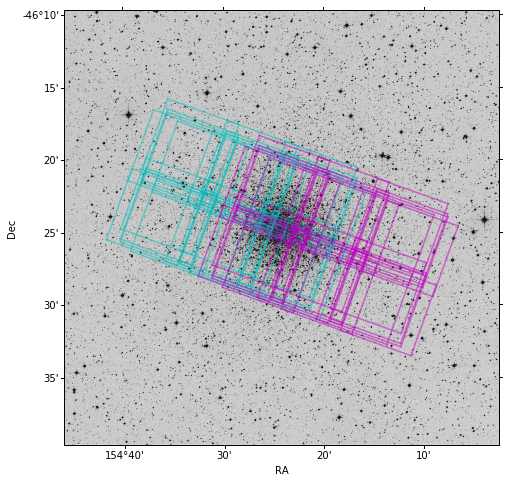

In [4]:
from matplotlib.colors import LogNorm
hdu = fits.open(folder+'dss-'+target+'.fits')[0]
wcs = WCS(hdu.header)
fig = mp.figure(figsize=(8,8))
ax = fig.add_subplot(111, projection=wcs)
mp.imshow(hdu.data, origin='lower', cmap='gray_r')#, norm=LogNorm())

for ind, fits_file in enumerate(ch1_data['img']):
    w = WCS(folder+fits_file)
    ra1, dec1 = w.wcs_pix2world(1, 1, 0)
    ra2, dec2 = w.wcs_pix2world(1, 256, 0)
    ra3, dec3 = w.wcs_pix2world(256, 256, 0)
    ra4, dec4 = w.wcs_pix2world(256, 1, 0)
# Plot [3.6] AOR footprint
  #  mp.plot(ch1_data['ra'][ind], ch1_data['dec'][ind], 'ro')
    ax.plot([ra1, ra2], [dec1, dec2], '-', color='c', alpha=0.5, transform=ax.get_transform('fk5'))
    ax.plot([ra2, ra3], [dec2, dec3], '-', color='c', alpha=0.5, transform=ax.get_transform('fk5'))
    ax.plot([ra3, ra4], [dec3, dec4], '-', color='c', alpha=0.5, transform=ax.get_transform('fk5'))
    ax.plot([ra4, ra1], [dec4, dec1], '-', color='c', alpha=0.5, transform=ax.get_transform('fk5'))
for ind, fits_file in enumerate(ch2_data['img']):
    w = WCS(folder+fits_file)
    ra1, dec1 = w.wcs_pix2world(1, 1, 0)
    ra2, dec2 = w.wcs_pix2world(1, 256, 0)
    ra3, dec3 = w.wcs_pix2world(256, 256, 0)
    ra4, dec4 = w.wcs_pix2world(256, 1, 0)
# Plot [4.5] AOR footprint
  #  mp.plot(ch2_data['ra'][ind], ch2_data['dec'][ind], 'ro')
    ax.plot([ra1, ra2], [dec1, dec2], '-', color='m', alpha=0.5, transform=ax.get_transform('fk5'))
    ax.plot([ra2, ra3], [dec2, dec3], '-', color='m', alpha=0.5, transform=ax.get_transform('fk5'))
    ax.plot([ra3, ra4], [dec3, dec4], '-', color='m', alpha=0.5, transform=ax.get_transform('fk5'))
    ax.plot([ra4, ra1], [dec4, dec1], '-', color='m', alpha=0.5, transform=ax.get_transform('fk5'))
ax.set_xlabel('RA')
ax.set_ylabel('Dec')

x_formatter = ScalarFormatter(useOffset=False)
mp.gca().xaxis.set_major_formatter(x_formatter)
mp.show()

#### Map of source catalog with field boundaries shown

Reading optical catalog for NGC3201...
Finished reading optical catalog.


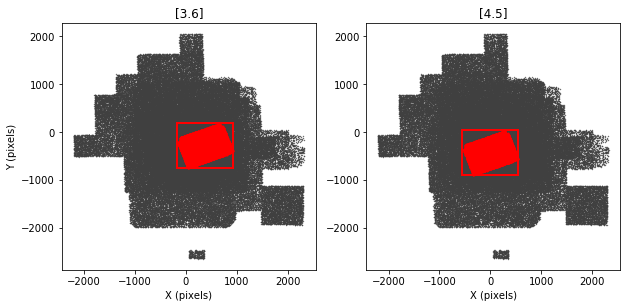

In [11]:
fig = mp.figure(figsize=(10,10))
ax1 = fig.add_subplot(221)
ax2 = fig.add_subplot(222)

# read optical catalog and add to plots
ids, xcat, ycat, ra, dec = optical.read_optical_fnl(optical_dir, target)
ax1.plot(xcat, ycat, '.', color='0.25', markersize=0.75)
ax2.plot(xcat, ycat, '.', color='0.25', markersize=0.75)

# read boundaries of IRAC data
dtype1 = np.dtype([('xmin', float), ('xmax', float), ('ymin', float), ('ymax', float)])
I1cuts = np.loadtxt(folder+'DeepMosaic/I1-deep-cuts.txt', dtype=dtype1, usecols=(1,2,3,4))
I2cuts = np.loadtxt(folder+'DeepMosaic/I2-deep-cuts.txt', dtype=dtype1, usecols=(1,2,3,4))

ax1.plot([I1cuts['xmin'], I1cuts['xmax']], [I1cuts['ymin'], I1cuts['ymin']],
    '-', color='r', linewidth=2)
ax1.plot([I1cuts['xmin'], I1cuts['xmax']], [I1cuts['ymax'], I1cuts['ymax']],
    '-', color='r', linewidth=2)
ax1.plot([I1cuts['xmin'], I1cuts['xmin']], [I1cuts['ymin'], I1cuts['ymax']],
    '-', color='r', linewidth=2)
ax1.plot([I1cuts['xmax'], I1cuts['xmax']], [I1cuts['ymin'], I1cuts['ymax']],
    '-', color='r', linewidth=2)
ax1.set_xlabel('X (pixels)')
ax1.set_ylabel('Y (pixels)')
ax1.set_title('[3.6]')
ax2.plot([I2cuts['xmin'], I2cuts['xmax']], [I2cuts['ymin'], I2cuts['ymin']],
    '-', color='r', linewidth=2)
ax2.plot([I2cuts['xmin'], I2cuts['xmax']], [I2cuts['ymax'], I2cuts['ymax']],
    '-', color='r', linewidth=2)
ax2.plot([I2cuts['xmin'], I2cuts['xmin']], [I2cuts['ymin'], I2cuts['ymax']],
    '-', color='r', linewidth=2)
ax2.plot([I2cuts['xmax'], I2cuts['xmax']], [I2cuts['ymin'], I2cuts['ymax']],
    '-', color='r', linewidth=2)
ax2.set_xlabel('X (pixels)')
ax2.set_title('[4.5]')


# Add transformed catalogs
I1ids, I1x, I1y, I1mag, I1err = read_dao.read_alf(folder+'DeepMosaic/'+target+'_I1_deep_dn.alf')
I2ids, I2x, I2y, I2mag, I2err = read_dao.read_alf(folder+'DeepMosaic/'+target+'_I2_deep_dn.alf')

filesI1, x_offI1, y_offI1, transformI1, dofI1 = read_dao.read_mch(folder+'DeepMosaic/op-I1-deep.mch')
filesI2, x_offI2, y_offI2, transformI2, dofI2 = read_dao.read_mch(folder+'DeepMosaic/op-I2-deep.mch')

xI1 = float(x_offI1[1])+float(transformI1[1][0])*I1x+float(transformI1[1][1])*I1y
yI1 = float(y_offI1[1])+float(transformI1[1][2])*I1x+float(transformI1[1][3])*I1y
xI2 = float(x_offI2[1])+float(transformI2[1][0])*I2x+float(transformI2[1][1])*I2y
yI2 = float(y_offI2[1])+float(transformI2[1][2])*I2x+float(transformI2[1][3])*I2y

ax1.plot(xI1, yI1, '.', markersize=1.8, color='r')
ax2.plot(xI2, yI2, '.', markersize=1.8, color='r')


mp.show()

# Calibration

In [3]:
calibration.find_lst_stars(target, 'I1', data_dir=folder)
calibration.find_lst_stars(target, 'I2', data_dir=folder)

[112923] [113107 112923]
[114776] [114776]
[111097] [111097]
[104869] [104869]
[119936] [119936]
[124651] [124651]
[68073] [68073]
[117251] [117358 117251]
[119197] [119197]
[127509] [127509 127316]
[114121] [114317 114121]
[102232] [102381 102232]
[109532] [109532 109743 109609 109568]
[120103] [120103]
[56242] [56242 56331]
[121723] [121723]
[118559] [118559]
[125386] [125386]
[126801] [126801]
[114760] [114760]
[123048] [123048]
[110680] [110931 110680]
[105454] [105454 105803 105521 105254 105917]
[53760] [53760 53578 53715 54069]
[116231] [116231 116255]
[117551] [117551]
[55453] [55414 55901 55021 55453 55179 55683]
[108673] [108673 108524 108327]
[54547] [54547 54763]
[119226] [119226]
[124531] [124531 124363]
[124120] [124016 124120 123979]
[56444] [56444 56301 56439 55917]
[117285] [117285]
[120753] [120753]
[113710] [113710 113889]
[110393] [110393 110696]
[93819] [93953 93721 93251 94489 94239 93819 93578 93395]
[108776] [108841 108776]
[110152] [110152]
[111976] [111976 111

In [ ]:
calibration.do_ap_phot(target, 'I1', 30, data_dir=folder, dao_dir='/usr/local/phot/')
calibration.do_ap_phot(target, 'I2', 30, data_dir=folder, dao_dir='/usr/local/phot/')

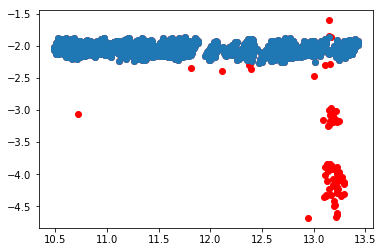

-2.06262975888 0.068914795404
-2.06012940057 0.0691363265863
There are 56 psf stars.


/Users/Jill/anaconda2/envs/astroconda/lib/python2.7/site-packages/ipykernel_launcher.py:72: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 629187 but corresponding boolean dimension is 3222


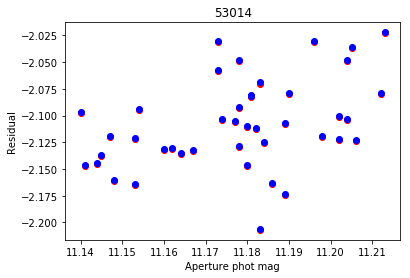

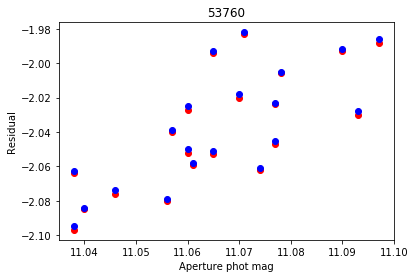

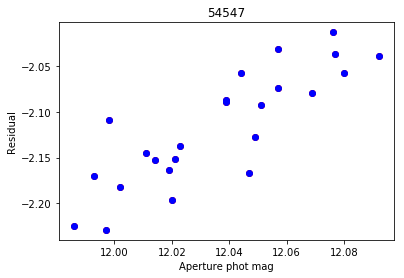

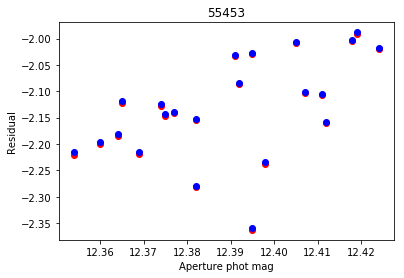

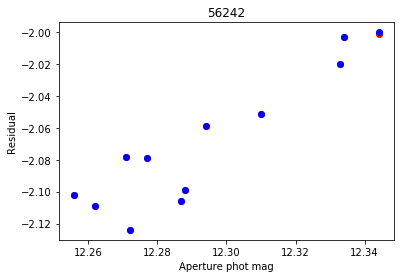

...

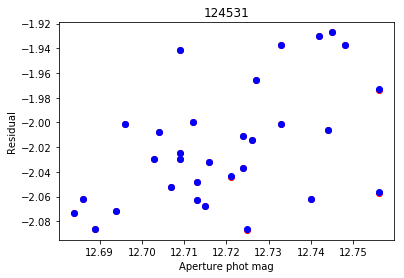

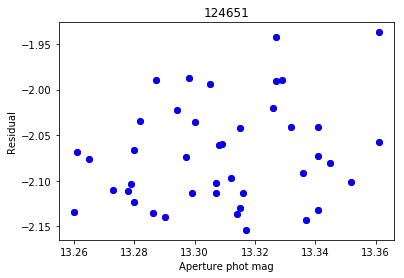

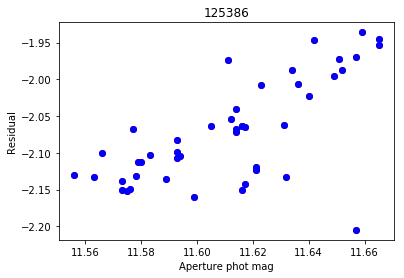

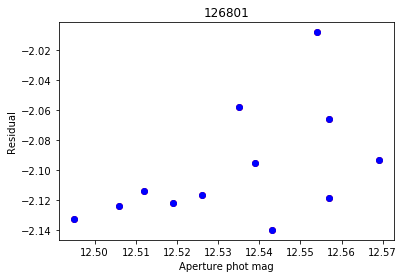

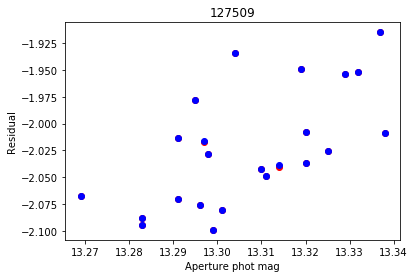

/Users/Jill/anaconda2/envs/astroconda/lib/python2.7/site-packages/numpy/core/numeric.py:531: UserWarning: Warning: converting a masked element to nan.
  return array(a, dtype, copy=False, order=order)


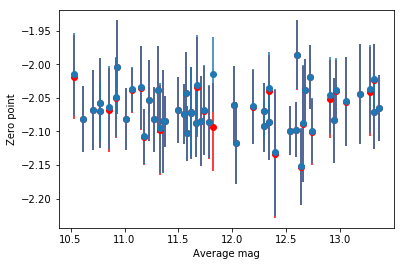

-2.06786066847 0.0308282419811
-2.06560113263 0.0315925394057


In [4]:
channel = 'I1'
I1zmag = 17.13
I2zmag = 16.66
fits_list = glob.glob(folder+'data/'+channel+'*[0-9].fits')

diff1 = np.array([], dtype=float)
diff2 = np.array([], dtype=float)
names = np.array([], dtype=int)
ap_mags = np.array([], dtype=float)
obs_num = np.array([], dtype=float)
err = np.array([], dtype=float)

for img in fits_list: 
    coo_file = re.sub('.fits', '.coo', img)
    ap_file = re.sub('.fits', '.ap', img)
    
    ids, ap_phot, ap_err = read_dao.read_ap(ap_file)
    ap_phot = ap_phot - 25.0 + I1zmag
    data = read_dao.read_coo_new(coo_file)

    diff1 = np.append(diff1, ap_phot - data['mag1'])
    diff2 = np.append(diff2, ap_phot - data['mag2'])
    err = np.append(err, np.sqrt(ap_err**2 + data['err']**2))
    obs_num = np.append(obs_num, np.arange(len(diff1)))
    ap_mags = np.append(ap_mags, ap_phot)
    names = np.append(names, ids)

# delete residuals where the aperture photometry was missing
ap_mags = np.delete(ap_mags, np.argwhere(diff1 > 50))
obs_num = np.delete(obs_num, np.argwhere(diff1 > 50))
diff2 = np.delete(diff2, np.argwhere(diff1 > 50))
err = np.delete(err, np.argwhere(diff1 > 50))
names = np.delete(names, np.argwhere(diff1 > 50))
diff1 = np.delete(diff1, np.argwhere(diff1 > 50))

# delete saturated stars
obs_num = np.delete(obs_num, np.argwhere(ap_mags < 10))
diff2 = np.delete(diff2, np.argwhere(ap_mags < 10))
err = np.delete(err, np.argwhere(ap_mags < 10))
names = np.delete(names, np.argwhere(ap_mags < 10))
diff1 = np.delete(diff1, np.argwhere(ap_mags < 10))
ap_mags = np.delete(ap_mags, np.argwhere(ap_mags < 10))

# delete faint stars
obs_num = np.delete(obs_num, np.argwhere(ap_mags > 14))
diff2 = np.delete(diff2, np.argwhere(ap_mags > 14))
err = np.delete(err, np.argwhere(ap_mags > 14))
names = np.delete(names, np.argwhere(ap_mags > 14))
diff1 = np.delete(diff1, np.argwhere(ap_mags > 14))
ap_mags = np.delete(ap_mags, np.argwhere(ap_mags > 14))

# sigma clip full sample
filtered_diff1 = sigma_clip(diff1, sigma=3, iters=5)
filtered_diff2 = sigma_clip(diff2, sigma=3, iters=5)


mp.plot(ap_mags, diff2, 'ro')
mp.plot(ap_mags, filtered_diff2, 'o')
mp.show()
print np.mean(filtered_diff1), np.std(filtered_diff1)
print np.mean(filtered_diff2), np.std(filtered_diff2)

psf_stars = np.unique(names)
print 'There are {} psf stars.'.format(len(psf_stars))

avg_zp1 = np.zeros(len(psf_stars))
avg_zp2 = np.zeros(len(psf_stars))
std_zp1 = np.zeros(len(psf_stars))
std_zp2 = np.zeros(len(psf_stars))
avg_mag = np.zeros(len(psf_stars))
for ind, star in enumerate(psf_stars):
    x = obs_num[names == star]
    y3 = ap_mags[names == star]
    y1 = diff1[names == star]
    y2 = diff2[names == star]
    filtered_y3 = sigma_clip(y3, sigma=2, iters=5)
    mp.plot(filtered_y3, y1, 'ro')
    mp.plot(filtered_y3, y2, 'bo')
    mp.xlabel('Aperture phot mag')
    mp.ylabel('Residual')
    mp.title(star)
    mp.show()
    avg_zp2[ind] = np.mean(y2[y3 == filtered_y3])
    avg_zp1[ind] = np.mean(y1[y3 == filtered_y3])
    std_zp1[ind] = np.std(y1[y3 == filtered_y3])
    std_zp2[ind] = np.std(y2[y3 == filtered_y3])
    avg_mag[ind] = np.mean(y3[y3 == filtered_y3])


filtered_avzp1 = sigma_clip(avg_zp1, sigma=3, iters=5)  
filtered_avzp2 = sigma_clip(avg_zp2, sigma=3, iters=5)
mp.errorbar(avg_mag, filtered_avzp1, yerr=std_zp1, fmt='ro')
mp.errorbar(avg_mag, filtered_avzp2, yerr=std_zp2, fmt='o')
mp.xlabel('Average mag')
mp.ylabel('Zero point')
mp.show()

print np.mean(filtered_avzp1), np.std(filtered_avzp1)
print np.mean(filtered_avzp2), np.std(filtered_avzp2)

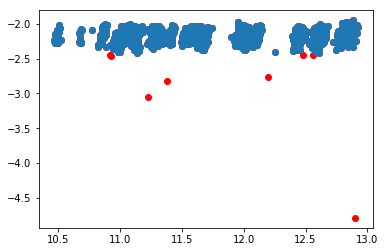

-2.19354287164 0.0982213022454
-2.18188872028 0.0865169542226
There are 36 psf stars.


/Users/Jill/anaconda2/envs/astroconda/lib/python2.7/site-packages/ipykernel_launcher.py:72: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 386859 but corresponding boolean dimension is 1985


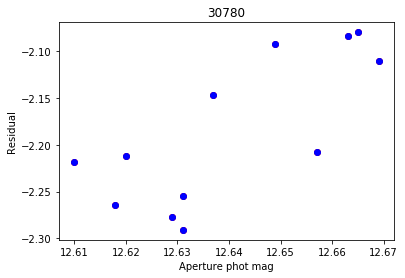

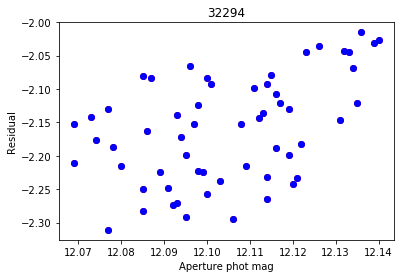

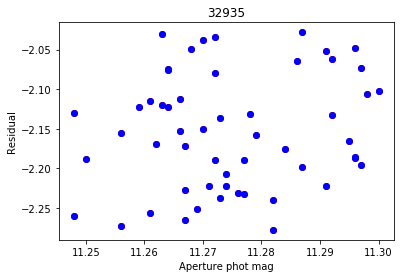

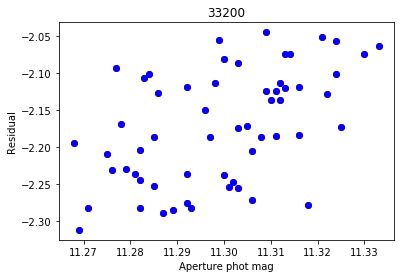

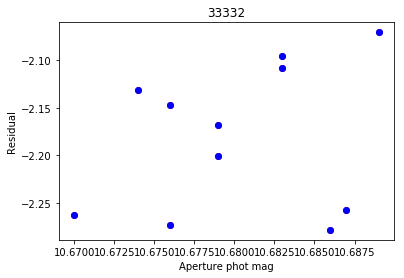

...

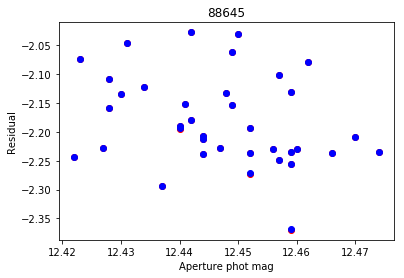

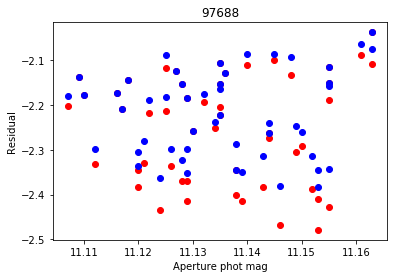

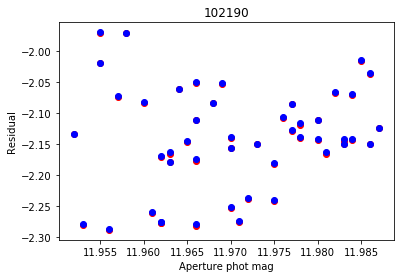

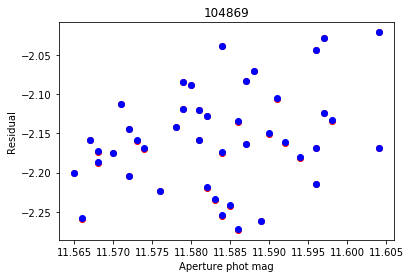

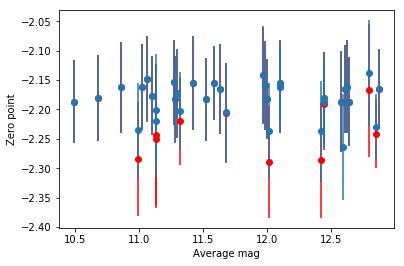

-2.18843040507 0.0398879545639
-2.18233908686 0.0300040741403


In [5]:
channel = 'I2'
I1zmag = 17.13
I2zmag = 16.66
fits_list = glob.glob(folder+'data/'+channel+'*[0-9].fits')

diff1 = np.array([], dtype=float)
diff2 = np.array([], dtype=float)
names = np.array([], dtype=int)
ap_mags = np.array([], dtype=float)
obs_num = np.array([], dtype=float)
err = np.array([], dtype=float)

for img in fits_list: 
    coo_file = re.sub('.fits', '.coo', img)
    ap_file = re.sub('.fits', '.ap', img)
    
    ids, ap_phot, ap_err = read_dao.read_ap(ap_file)
    ap_phot = ap_phot - 25.0 + I2zmag
    data = read_dao.read_coo_new(coo_file)

    diff1 = np.append(diff1, ap_phot - data['mag1'])
    diff2 = np.append(diff2, ap_phot - data['mag2'])
    err = np.append(err, np.sqrt(ap_err**2 + data['err']**2))
    obs_num = np.append(obs_num, np.arange(len(diff1)))
    ap_mags = np.append(ap_mags, ap_phot)
    names = np.append(names, ids)

# delete residuals where the aperture photometry was missing
ap_mags = np.delete(ap_mags, np.argwhere(diff1 > 50))
obs_num = np.delete(obs_num, np.argwhere(diff1 > 50))
diff2 = np.delete(diff2, np.argwhere(diff1 > 50))
err = np.delete(err, np.argwhere(diff1 > 50))
names = np.delete(names, np.argwhere(diff1 > 50))
diff1 = np.delete(diff1, np.argwhere(diff1 > 50))

# delete saturated stars
obs_num = np.delete(obs_num, np.argwhere(ap_mags < 10))
diff2 = np.delete(diff2, np.argwhere(ap_mags < 10))
err = np.delete(err, np.argwhere(ap_mags < 10))
names = np.delete(names, np.argwhere(ap_mags < 10))
diff1 = np.delete(diff1, np.argwhere(ap_mags < 10))
ap_mags = np.delete(ap_mags, np.argwhere(ap_mags < 10))

# delete faint stars
obs_num = np.delete(obs_num, np.argwhere(ap_mags > 14))
diff2 = np.delete(diff2, np.argwhere(ap_mags > 14))
err = np.delete(err, np.argwhere(ap_mags > 14))
names = np.delete(names, np.argwhere(ap_mags > 14))
diff1 = np.delete(diff1, np.argwhere(ap_mags > 14))
ap_mags = np.delete(ap_mags, np.argwhere(ap_mags > 14))

# sigma clip full sample
filtered_diff1 = sigma_clip(diff1, sigma=3, iters=5)
filtered_diff2 = sigma_clip(diff2, sigma=3, iters=5)


mp.plot(ap_mags, diff2, 'ro')
mp.plot(ap_mags, filtered_diff2, 'o')
mp.show()
print np.mean(filtered_diff1), np.std(filtered_diff1)
print np.mean(filtered_diff2), np.std(filtered_diff2)

psf_stars = np.unique(names)
print 'There are {} psf stars.'.format(len(psf_stars))

avg_zp1 = np.zeros(len(psf_stars))
avg_zp2 = np.zeros(len(psf_stars))
std_zp1 = np.zeros(len(psf_stars))
std_zp2 = np.zeros(len(psf_stars))
avg_mag = np.zeros(len(psf_stars))
for ind, star in enumerate(psf_stars):
    x = obs_num[names == star]
    y3 = ap_mags[names == star]
    y1 = diff1[names == star]
    y2 = diff2[names == star]
    filtered_y3 = sigma_clip(y3, sigma=2, iters=5)
    mp.plot(filtered_y3, y1, 'ro')
    mp.plot(filtered_y3, y2, 'bo')
    mp.xlabel('Aperture phot mag')
    mp.ylabel('Residual')
    mp.title(star)
    mp.show()
    avg_zp2[ind] = np.mean(y2[y3 == filtered_y3])
    avg_zp1[ind] = np.mean(y1[y3 == filtered_y3])
    std_zp1[ind] = np.std(y1[y3 == filtered_y3])
    std_zp2[ind] = np.std(y2[y3 == filtered_y3])
    avg_mag[ind] = np.mean(y3[y3 == filtered_y3])


filtered_avzp1 = sigma_clip(avg_zp1, sigma=3, iters=5)  
filtered_avzp2 = sigma_clip(avg_zp2, sigma=3, iters=5)
mp.errorbar(avg_mag, filtered_avzp1, yerr=std_zp1, fmt='ro')
mp.errorbar(avg_mag, filtered_avzp2, yerr=std_zp2, fmt='o')
mp.xlabel('Average mag')
mp.ylabel('Zero point')
mp.show()

print np.mean(filtered_avzp1), np.std(filtered_avzp1)
print np.mean(filtered_avzp2), np.std(filtered_avzp2)

In [3]:
calibration.apply_calibration(target, 'I1', -2.062, data_dir=folder)
calibration.apply_calibration(target, 'I2', -2.172, data_dir=folder)

## MIR catalog

In [4]:
center_ra, center_dec = coordinates.radec_string2deg(cluster_ra, cluster_dec)
analysis_routines.merge_opt_deep_catalogs(target, optical_dir, folder, cluster_coord=[center_ra, center_dec])

Reading optical catalog for NGC3201...
Finished reading optical catalog.
Reading MIR catalog for NGC3201...


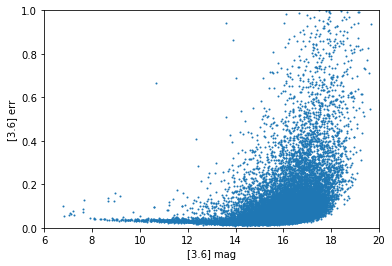

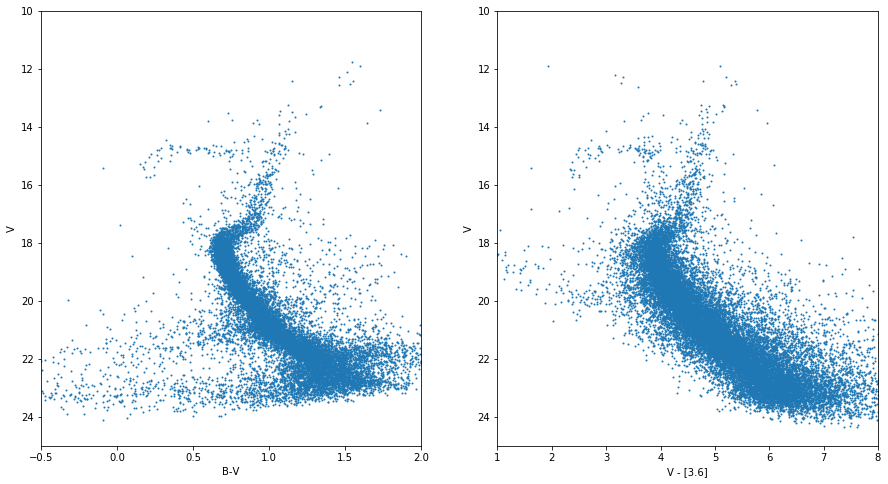

In [22]:
#center_ra, center_dec = coordinates.radec_string2deg(cluster_ra, cluster_dec)
# change to read merged catalog
catalog_data = analysis_routines.read_merged_catalog(folder)

thres = 300
thres2 = 150
dist = catalog_data['rad_dist']
colorBV = catalog_data['B'][(dist > thres2) & (dist < thres)] - catalog_data['V'][(dist > thres2) & (dist < thres)]
Vmag = catalog_data['V'][(dist > thres2) & (dist < thres)]
colorVIR = catalog_data['V'][dist > thres2] - catalog_data['3.6'][dist > thres2]
mag = catalog_data['V'][dist > thres2]
magIR = catalog_data['3.6'][dist > thres2]
err = catalog_data['3.6er'][dist > thres2]

fig = mp.figure()
ax1 = fig.add_subplot(111)
ax1.scatter(magIR, err, s=1, edgecolor=None)
ax1.set_ylim((0,1.0))
ax1.set_xlim((6,20))
ax1.set_xlabel('[3.6] mag')
ax1.set_ylabel('[3.6] err')

good_mag = mag[err < 0.2]
good_color = colorVIR[err < 0.2]

fig2 = mp.figure(figsize=(15,8))
ax2 = fig2.add_subplot(121)
ax2.scatter(colorBV, Vmag, s=1, edgecolor=None)
ax2.set_ylim((25,10))
ax2.set_xlim((-0.5,2))
ax2.set_xlabel('B-V')
ax2.set_ylabel('V')
ax3 = fig2.add_subplot(122)
ax3.scatter(good_color, good_mag, s=1, edgecolor=None)
ax3.set_ylim((25,10))
ax3.set_xlim((1,8))
ax3.set_xlabel('V - [3.6]')
ax3.set_ylabel('V')
mp.savefig(folder+target+'cmd.eps', format='eps')

# Variable stars

In [ ]:
# Find all stars identified as possible variables in optical catalog and list them in PeterIDs.txt

center_ra, center_dec = coordinates.radec_string2deg(cluster_ra, cluster_dec)
optical.find_variables_fnl(optical_dir, target, center_ra, center_dec, data_dir=folder)

## First check on RRL PL relation

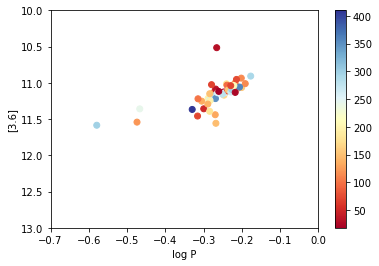

In [17]:
dtype1 = np.dtype([('id', 'S4'), ('cc_period', float), ('new_period', float)])
data = np.loadtxt(folder+target+'-variables-new.txt', dtype=dtype1, usecols=(0,1,2))

dtype1 = np.dtype([('star', 'S10'), ('dao', int)])
dao_ids = np.loadtxt(folder+'PeterIDs.txt', dtype=dtype1, usecols=(0,1))

catalog_data = analysis_routines.read_merged_catalog(folder)

mag = np.zeros(len(data['id']))
dist = np.zeros(len(data['id']))

for ind, star in enumerate(data['id']):
    dao_id = dao_ids['dao'][dao_ids['star'] == star]
    if len(dao_id) == 0: continue
    m = catalog_data['3.6'][catalog_data['id'] == dao_id]  
    d = catalog_data['rad_dist'][catalog_data['id'] == dao_id]
    if m < 50: 
        mag[ind] = m
        dist[ind] = d
    if m > 50: 
        mag[ind] = np.nan
        dist[ind] = np.nan

cm = mp.cm.get_cmap('RdYlBu')    
mp.scatter(np.log10(data['new_period']), mag, c=dist, cmap=cm) 
mp.colorbar()
mp.ylim((13, 10))
mp.xlim((-0.7, 0))
mp.xlabel('log P')
mp.ylabel('[3.6]')
mp.savefig(target+'pl.eps', format='eps')

##  Generate MIR light curves matching optical ID numbers  

In [23]:
dtype1 = np.dtype([('star', 'S10'), ('dao', int)])
data = np.loadtxt(folder+'PeterIDs.txt', dtype=dtype1, usecols=(0,1))

lightcurves.make_lcv(['I1', 'I2'], data['star'], data['dao'], data_dir=folder)

#### Phase MIR light curves

In [6]:
dtype1 = np.dtype([('id', 'S4'), ('cc_period', float), ('new_period', float)])
data = np.loadtxt(folder+target+'-variables-new.txt', dtype=dtype1, usecols=(0,1,2))

for ind, lcv in enumerate(data['id']):
    lcv_file = folder+'lcvs/mir/'+lcv+'.lcv'
    try:
        lightcurves.phase_lcv(lcv_file, data['new_period'][ind], 0, bin=1)
    except:
        print lcv +' not found.'

V7 not found.
V14 not found.
V23 not found.
V27 not found.
V30 not found.
V38 not found.
V46 not found.
V52 not found.
V53 not found.
V54 not found.
V55 not found.
V60 not found.
V61 not found.
V62 not found.
V63 not found.
V64 not found.
V66 not found.
V69 not found.
V72 not found.
V77 not found.
V84 not found.
V87 not found.
V88 not found.
V89 not found.
V91 not found.
V93 not found.
V96 not found.


#### Create figure with all bands phased together

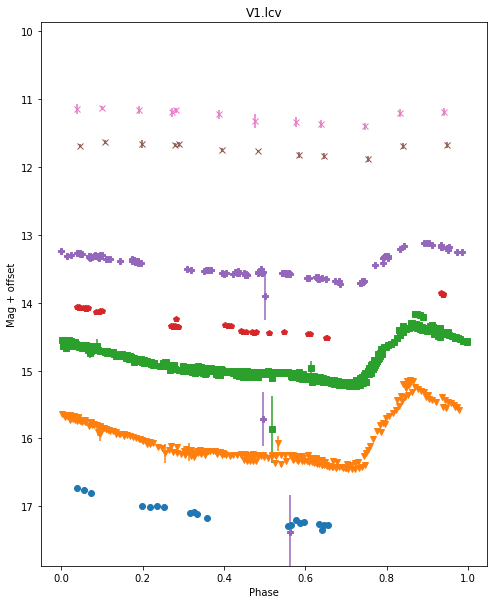

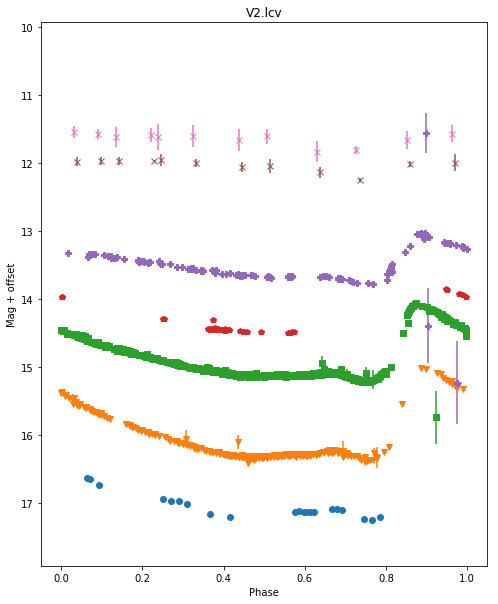

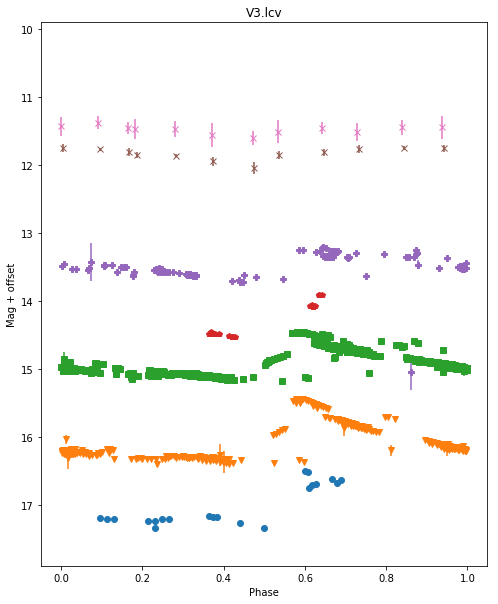

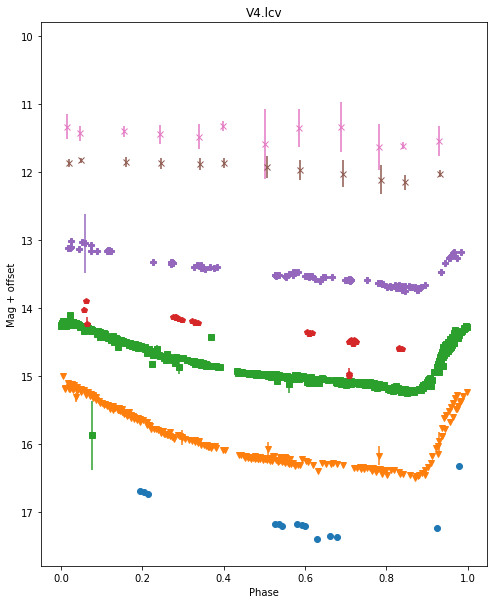

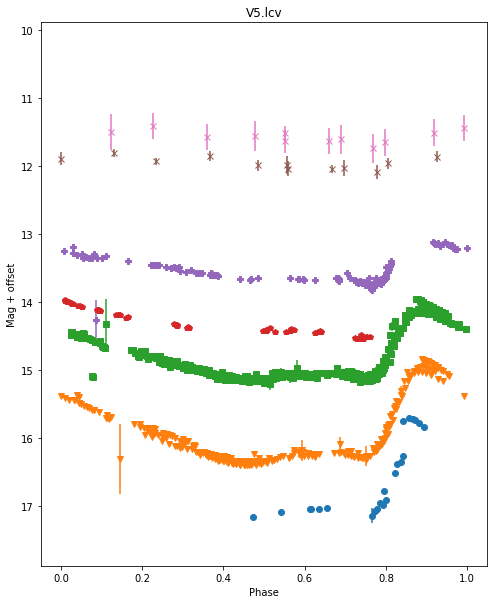

...

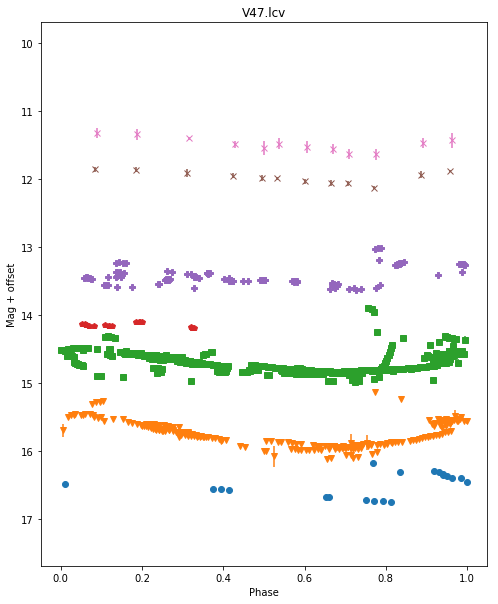

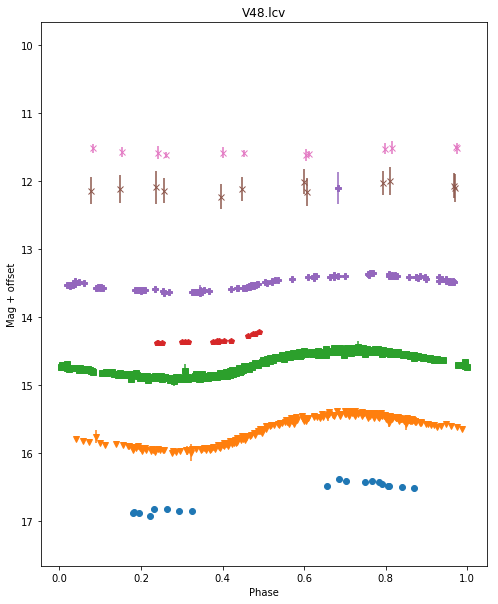

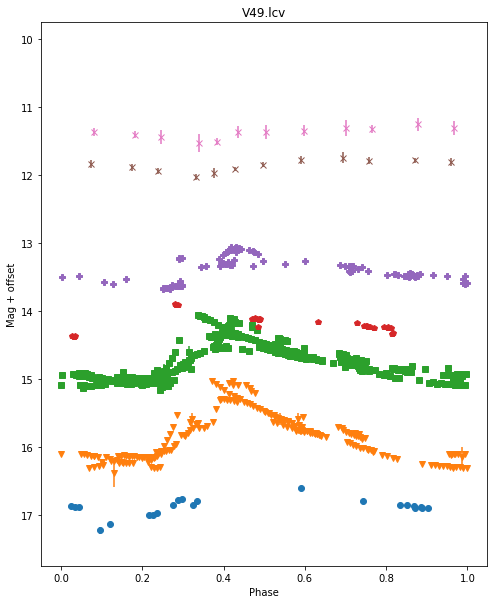

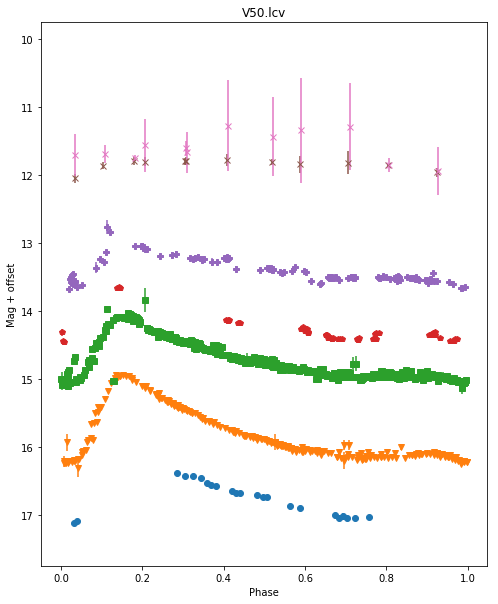

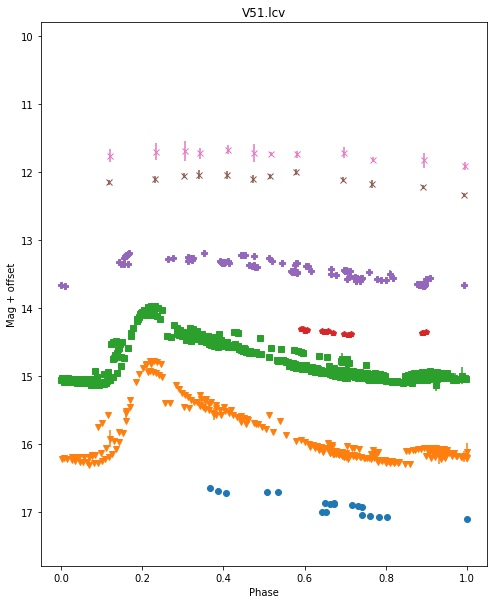

V52  not found.
V53  not found.
V54  not found.


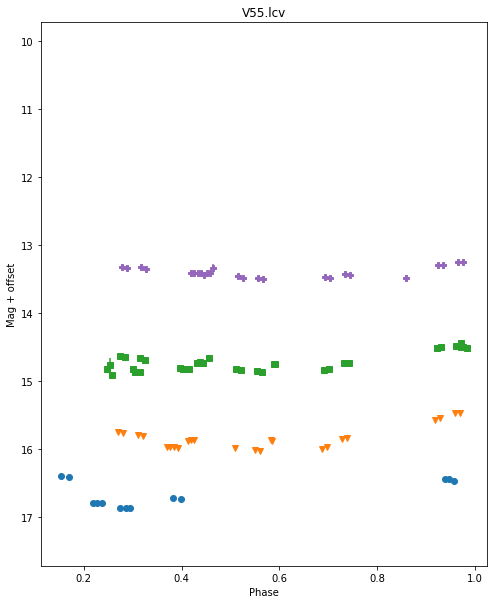

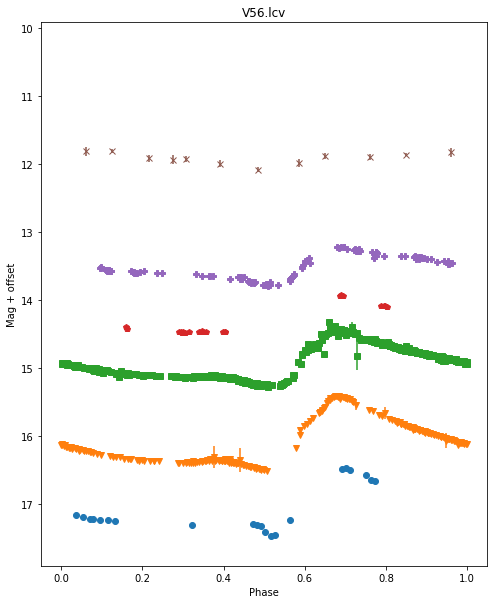

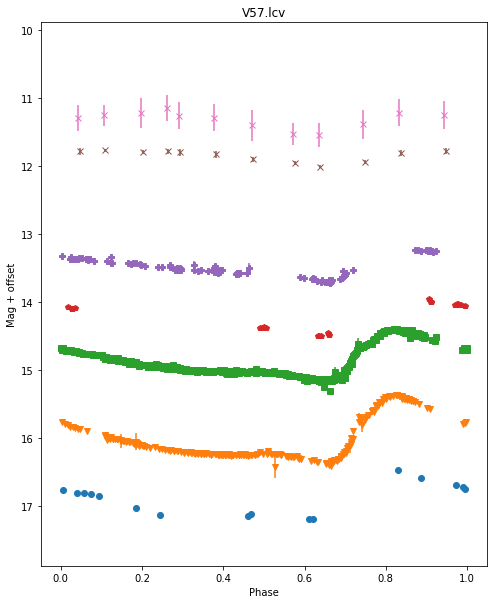

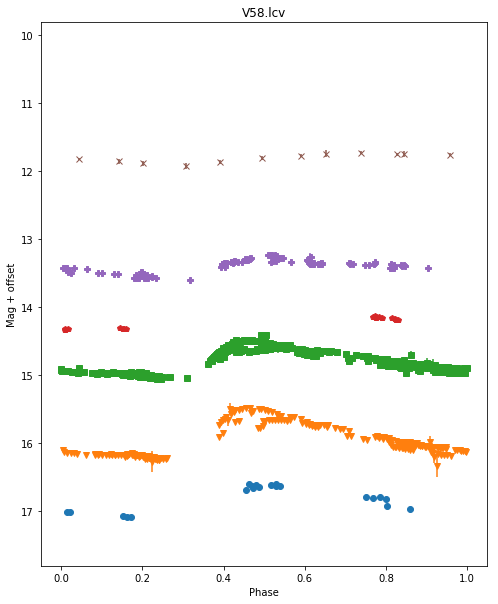

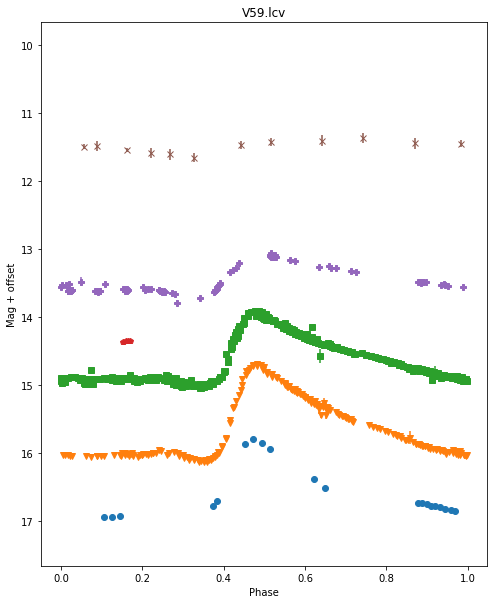

V60  not found.
V61  not found.
V62  not found.
V63  not found.
V64  not found.


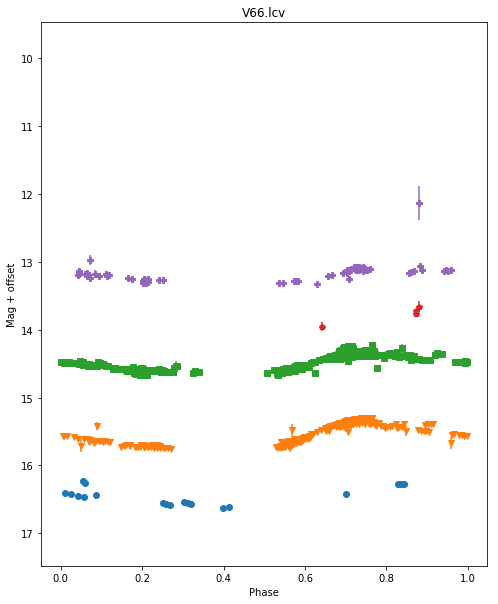

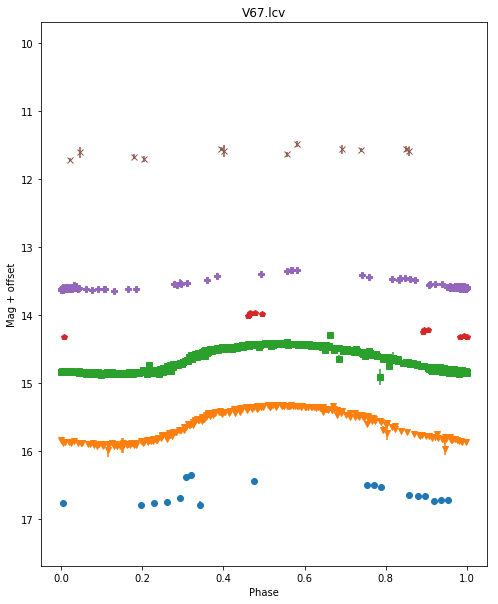

V69  not found.


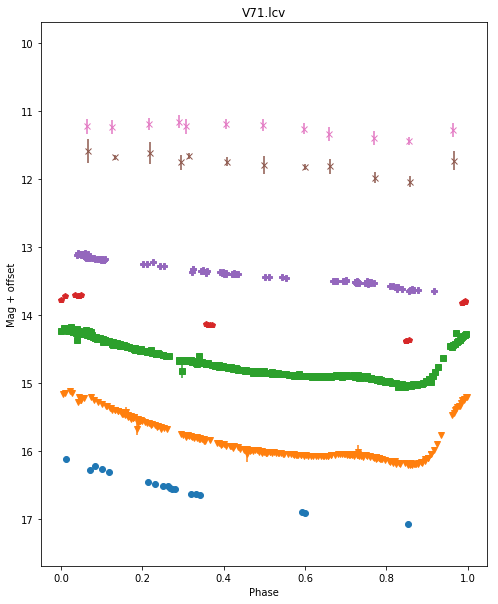

V72  not found.


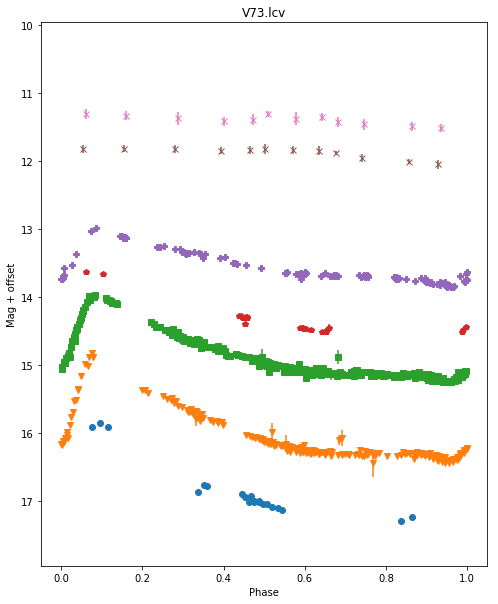

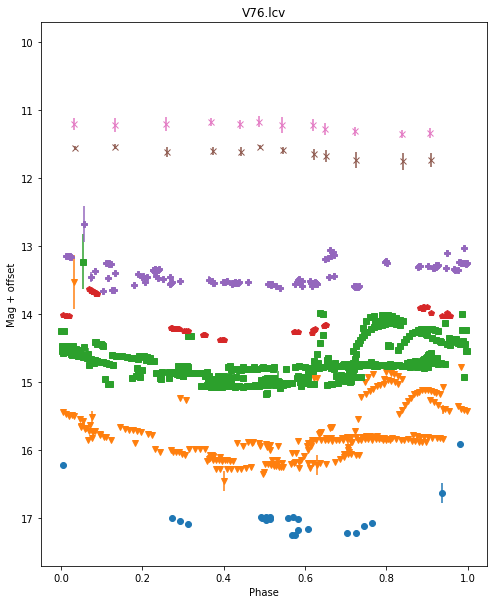

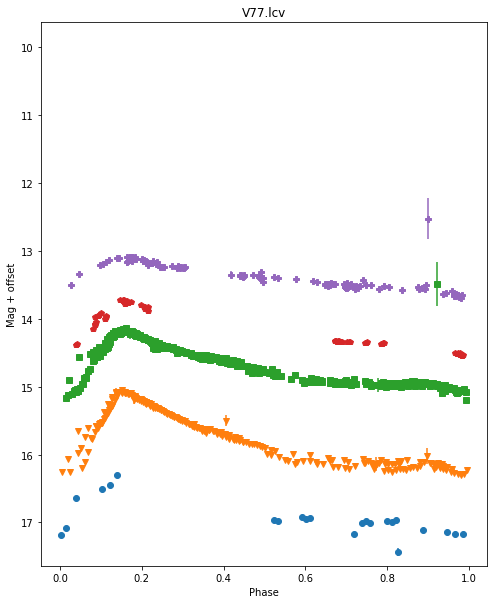

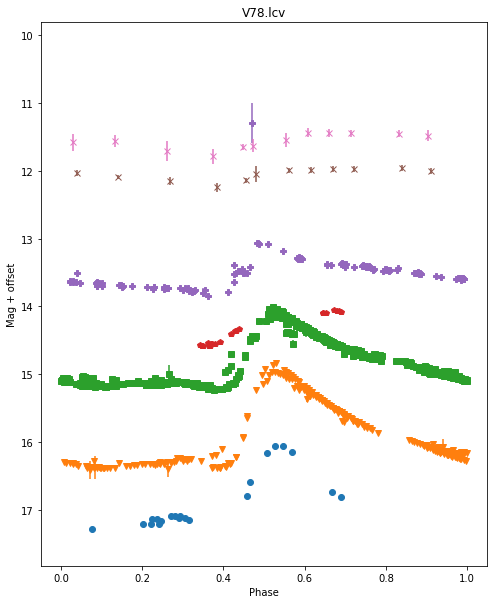

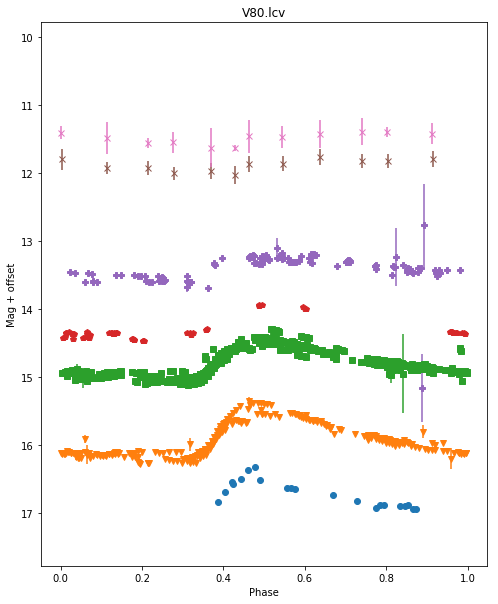

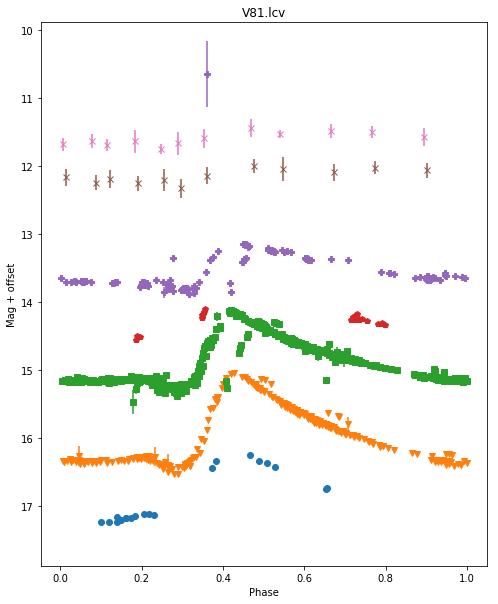

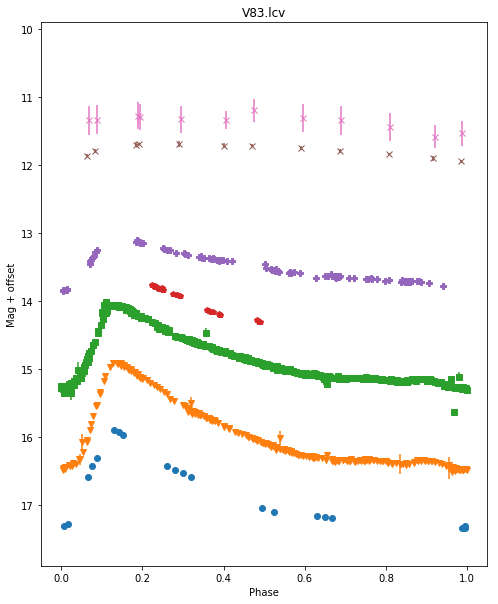

V84  not found.
V87  not found.
V88  not found.


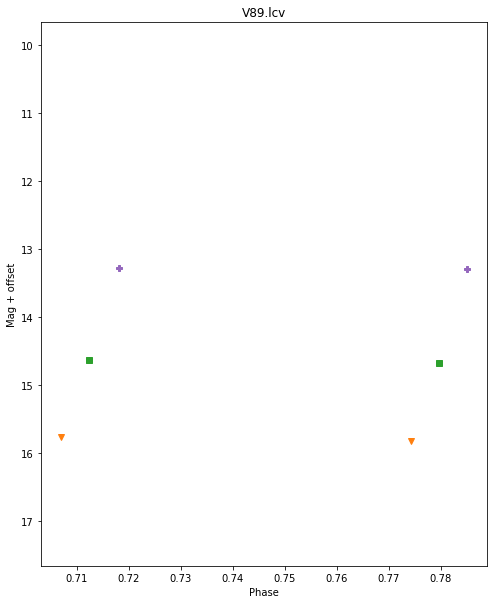

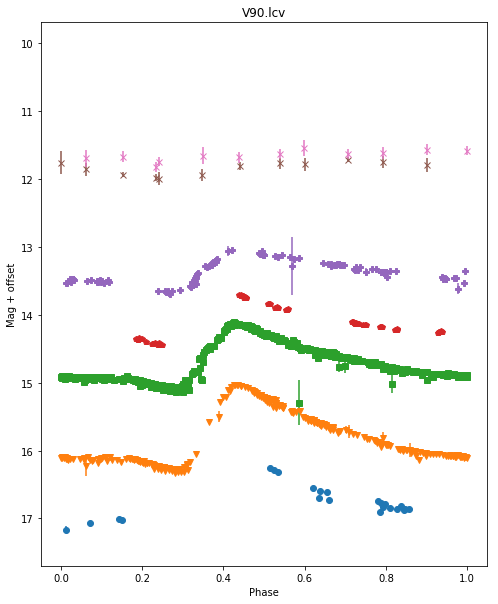

V91  not found.


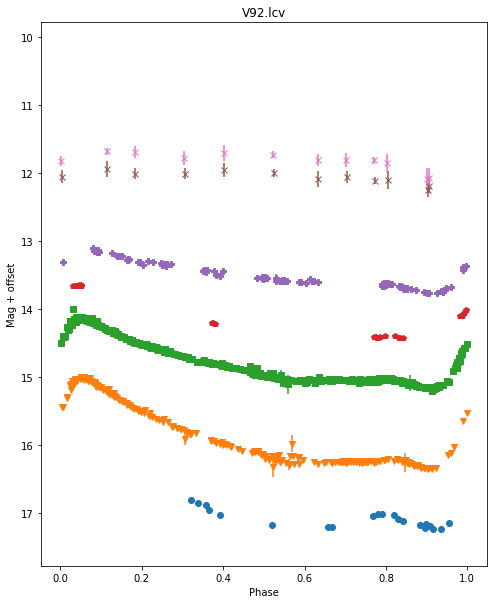

V93  not found.
V96  not found.


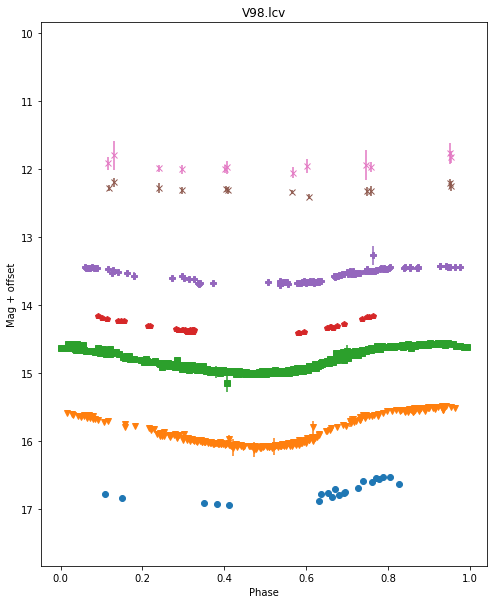

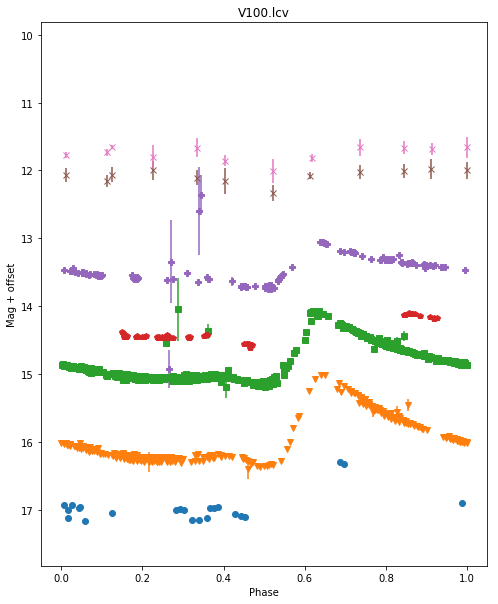

In [7]:
dtype1 = np.dtype([('id', 'S4'), ('cc_period', float), ('new_period', float)])
data = np.loadtxt(folder+target+'-variables-new.txt', dtype=dtype1, usecols=(0,1,2))
for ind, star in enumerate(data['id']):
    try:
        if np.isnan(data['new_period'][ind]):
            lightcurves.phase_lcv_all_bands(target, star+'.lcv',data['cc_period'][ind], 0, bin_mir=1, data_dir=folder)
        else:
            lightcurves.phase_lcv_all_bands(target, star+'.lcv',data['new_period'][ind], 0, bin_mir=1, data_dir=folder)
    except:
        print star, ' not found.'
        continue

## Fit light curves

V1
/Volumes/Annie/CRRP/NGC3201/lcvs/V1.phased


lightcurves.py:1028: RuntimeWarning: overflow encountered in exp
  weight = err_copy * np.exp(dist**2/sigma**2)


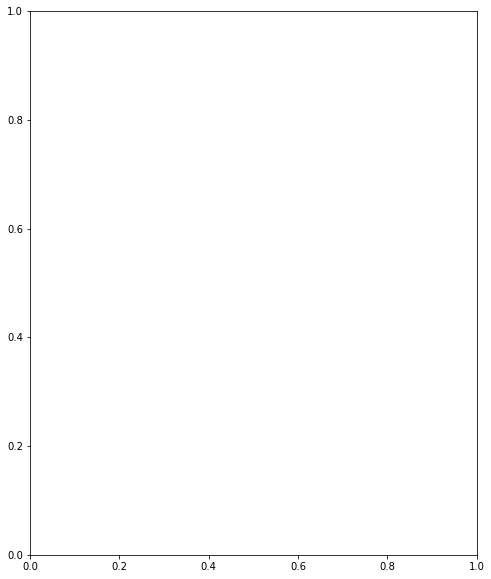

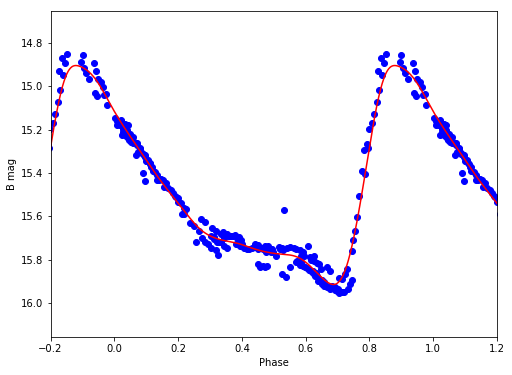

B 15.4595729255 1.00769794851


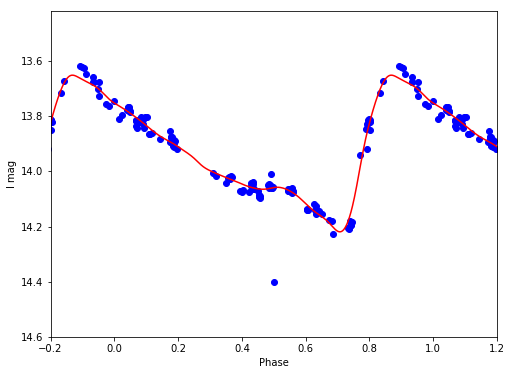

I 13.9292651542 0.567240279973


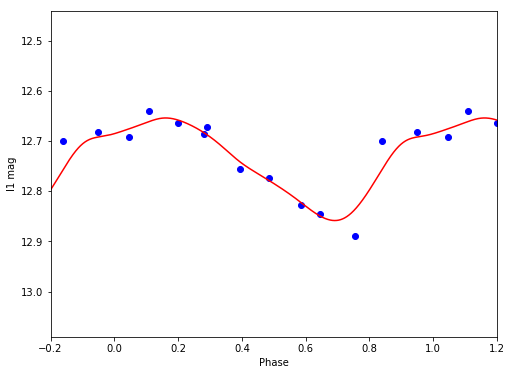

I1 12.7395629961 0.204425207101


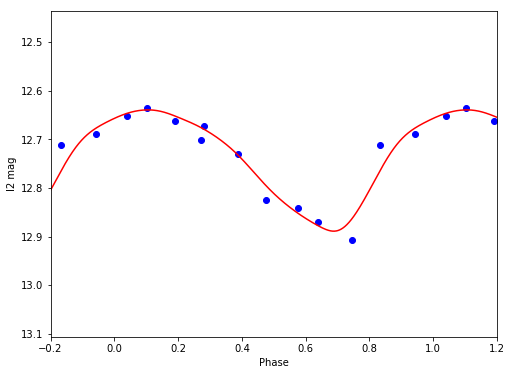

I2 12.7407291375 0.249541520239


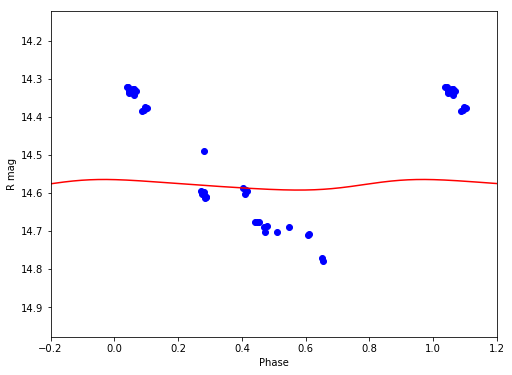

R 14.5780259797 0.0278286759892


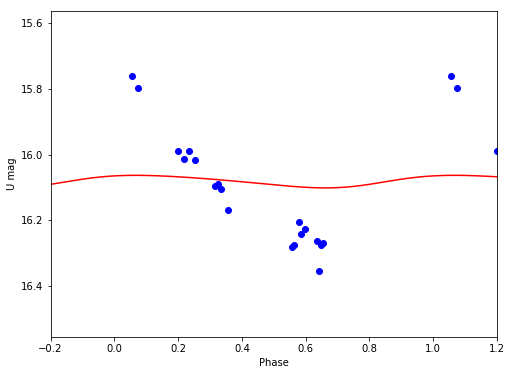

U 16.0807036094 0.0383138636953


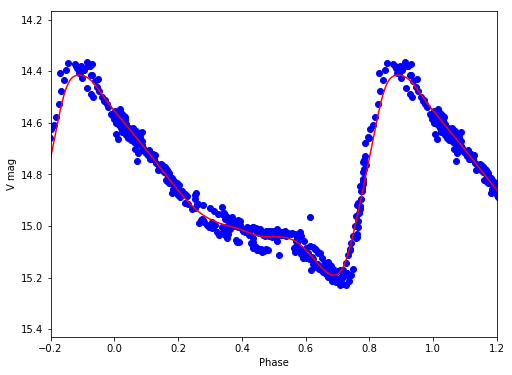

V 14.8290388808 0.775294323486
V2
/Volumes/Annie/CRRP/NGC3201/lcvs/V2.phased


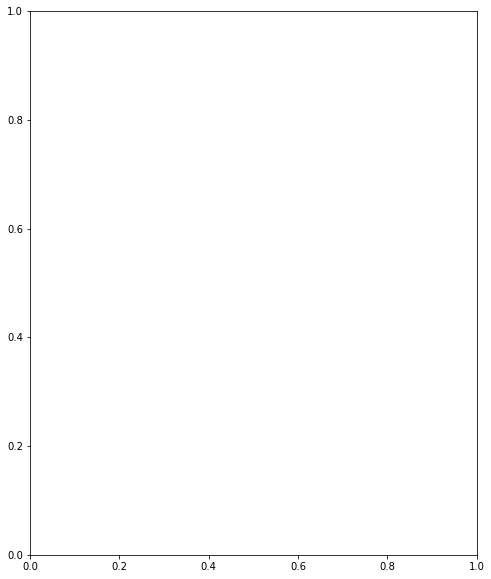

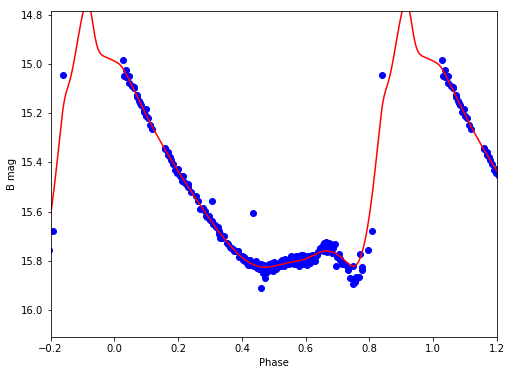

B 15.4316588164 1.07695371791


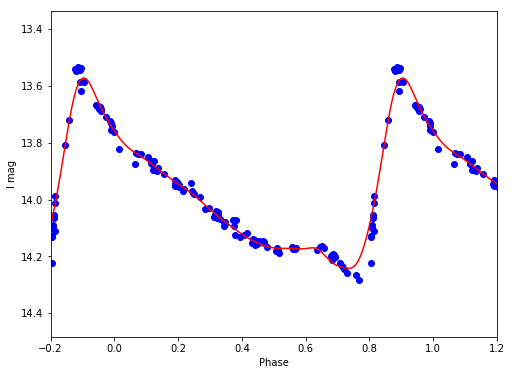

I 13.9782222189 0.670543058575


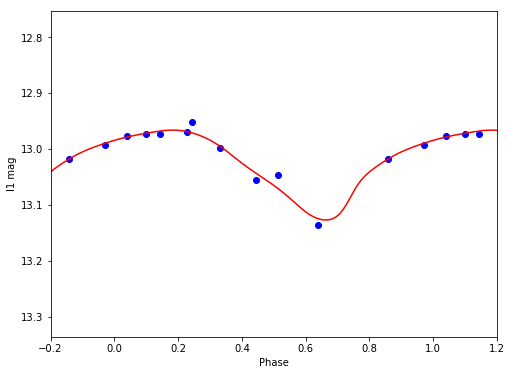

I1 13.0258046209 0.161017992978


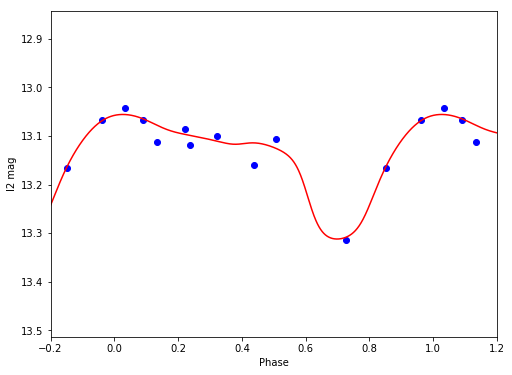

I2 13.1413271394 0.256253689862


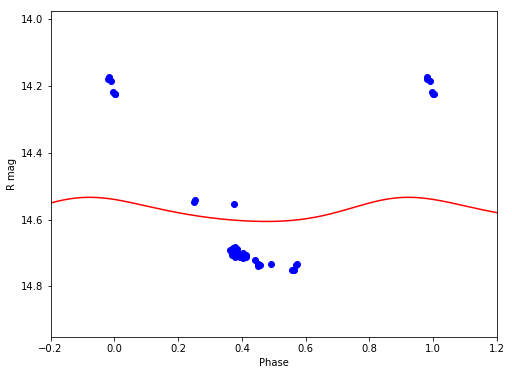

R 14.5736318609 0.0723351516021


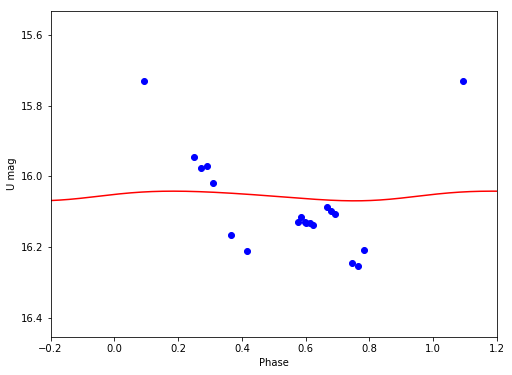

U 16.0547789928 0.0273558921716


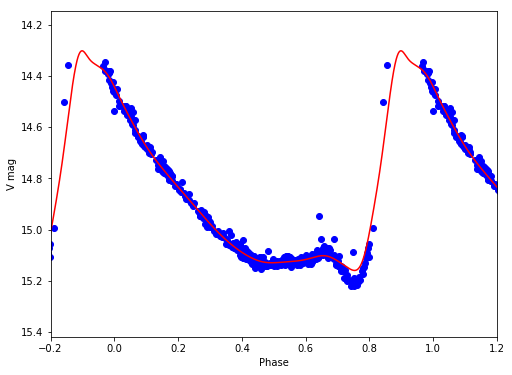

V 14.8349158858 0.857344635902
V3
/Volumes/Annie/CRRP/NGC3201/lcvs/V3.phased


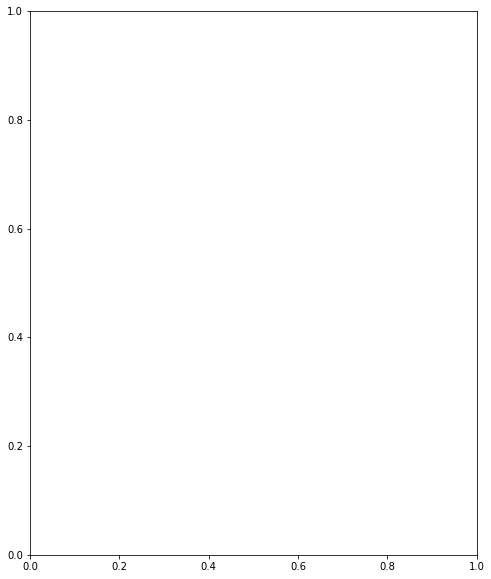

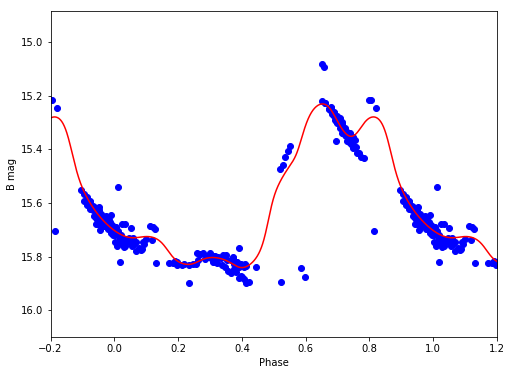

B 15.571022228 0.610258453727


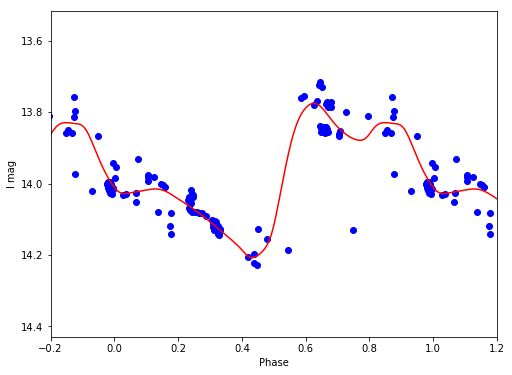

I 13.9713199819 0.432774512041


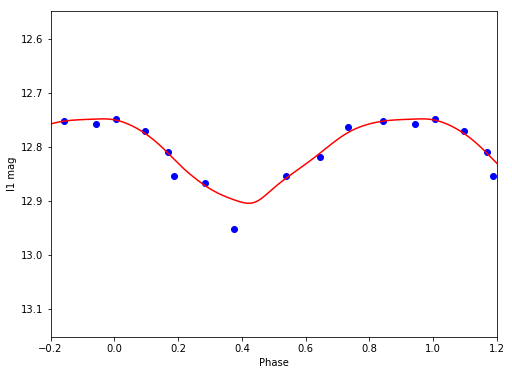

I1 12.8123716354 0.156094471044


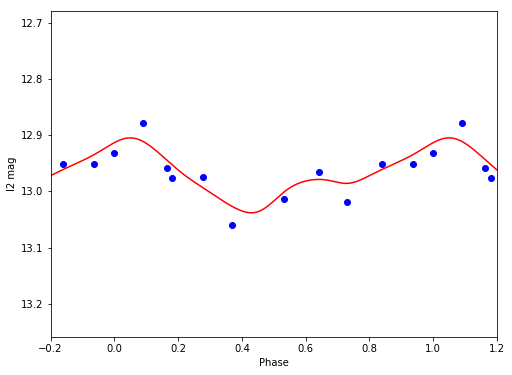

I2 12.971876638 0.133453877729


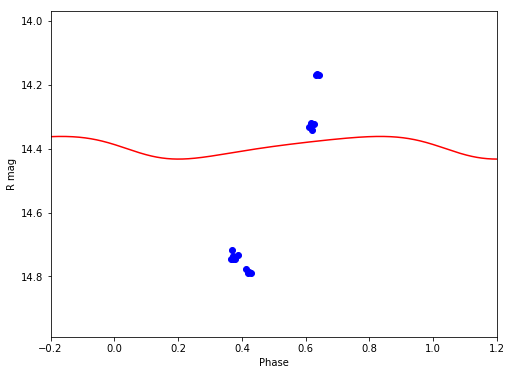

R 14.3932935567 0.07096326323


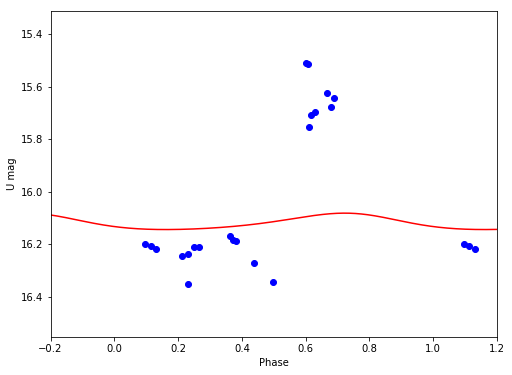

U 16.1171364419 0.0624677660669


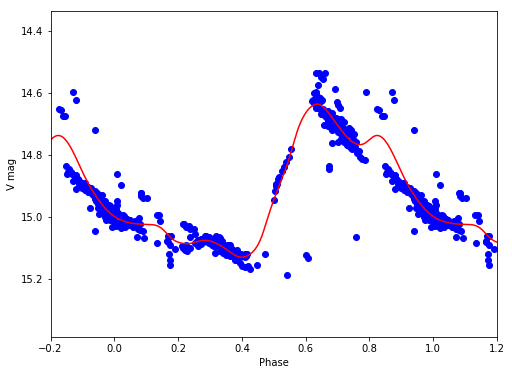

V 14.9112462532 0.49334778009
V4
/Volumes/Annie/CRRP/NGC3201/lcvs/V4.phased


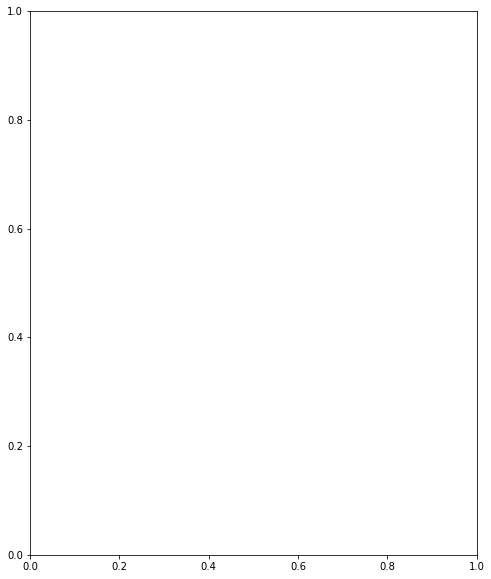

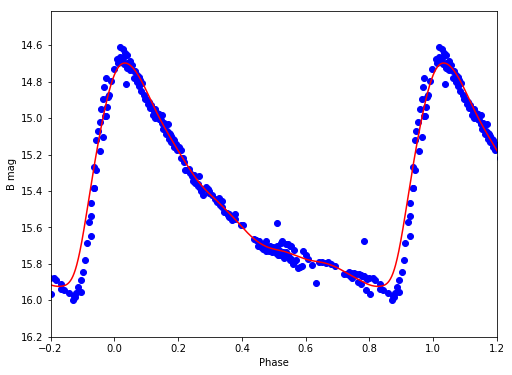

B 15.3948615329 1.22581707849


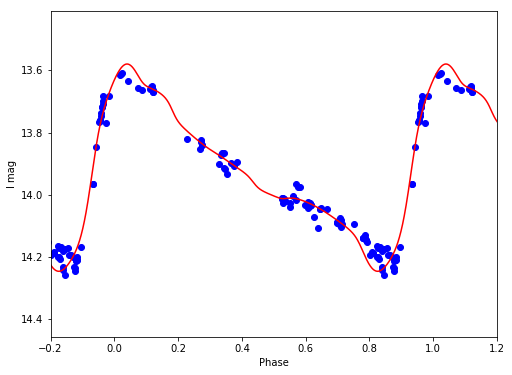

I 13.9043162001 0.666040816776


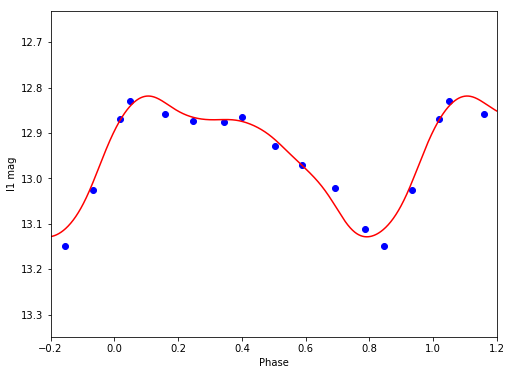

I1 12.9411190471 0.310343038801


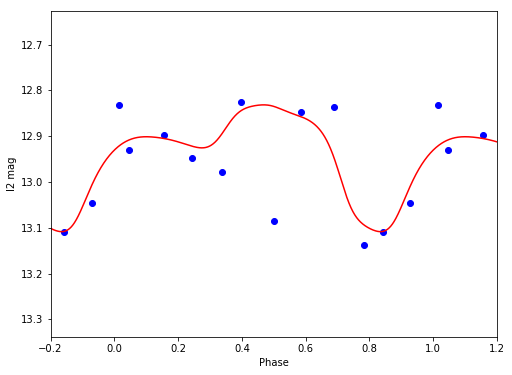

I2 12.9303815229 0.276769642613


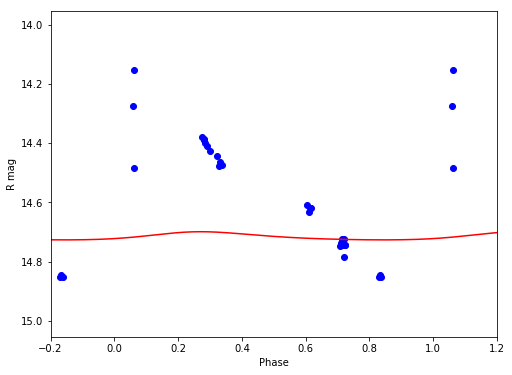

R 14.7151138973 0.0275341842717


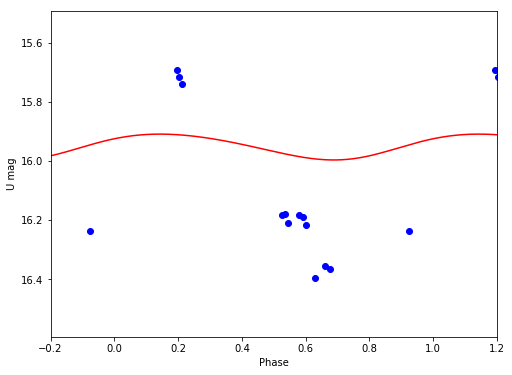

U 15.9486437136 0.0875420277829


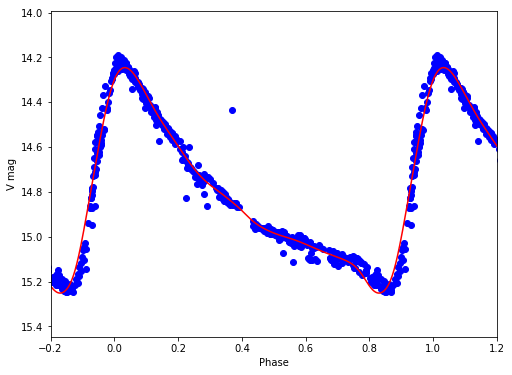

V 14.7827204365 1.00598565687
V5
/Volumes/Annie/CRRP/NGC3201/lcvs/V5.phased


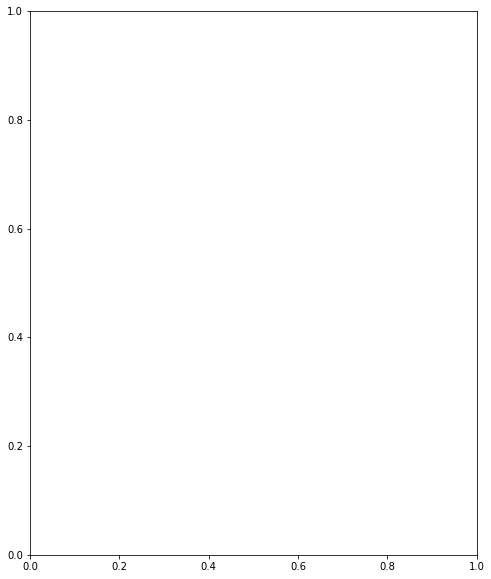

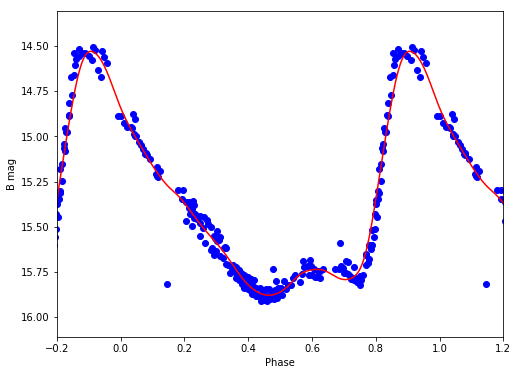

B 15.3144613653 1.35121256276


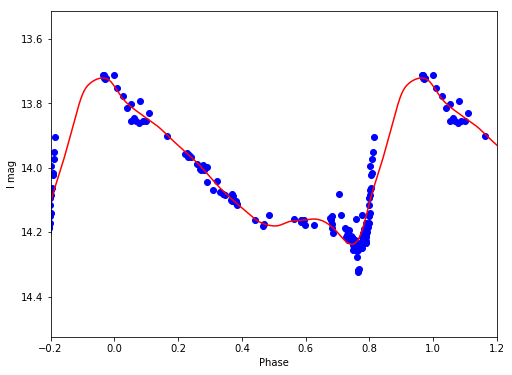

I 13.9994859642 0.516104519821


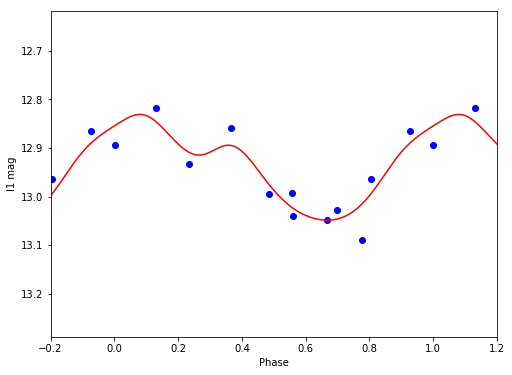

I1 12.9350019332 0.217876463479


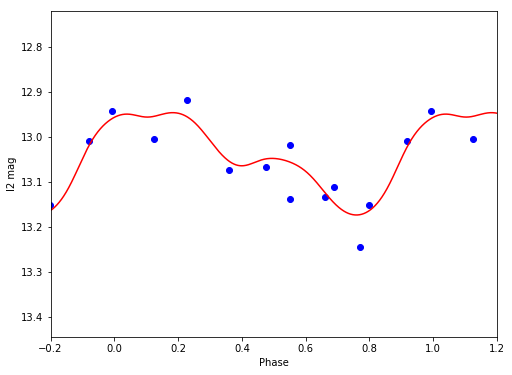

I2 13.0398038114 0.227782150364


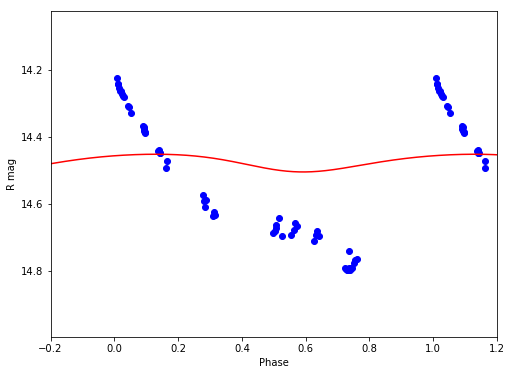

R 14.4740882441 0.0529577003309


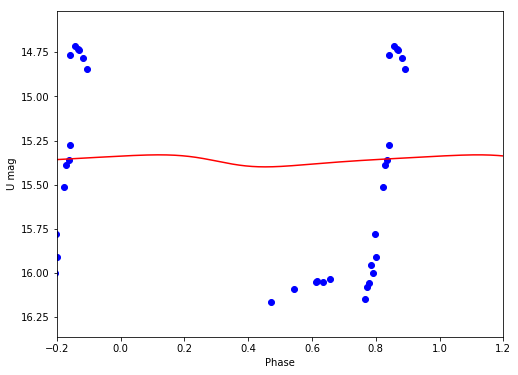

U 15.362049433 0.0681864186131


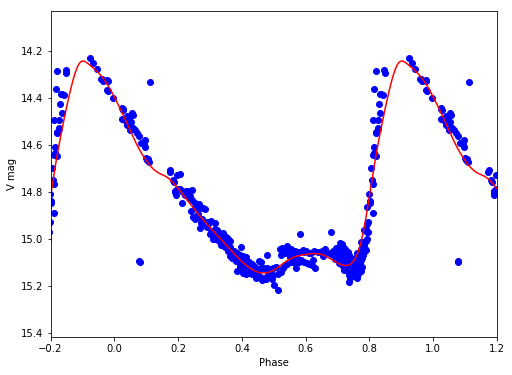

V 14.7860828983 0.901203635088
V6
/Volumes/Annie/CRRP/NGC3201/lcvs/V6.phased


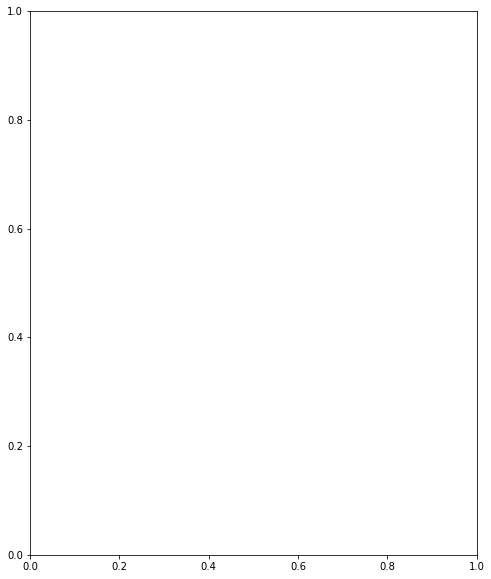

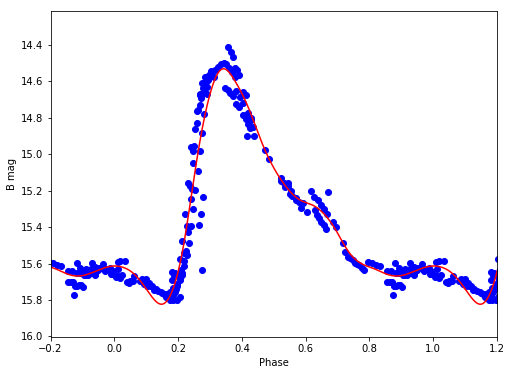

B 15.2649811704 1.29159065222


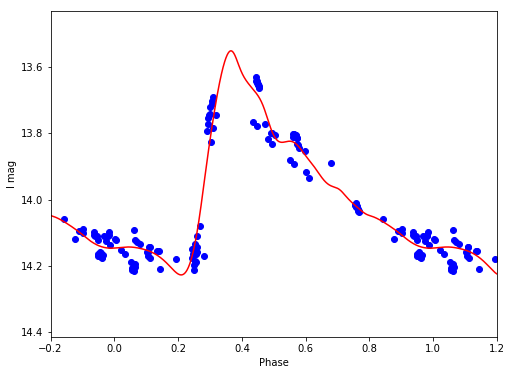

I 13.9550754788 0.676045051406


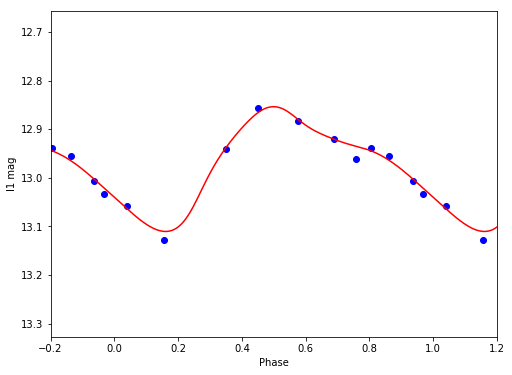

I1 12.9688309326 0.256696960218


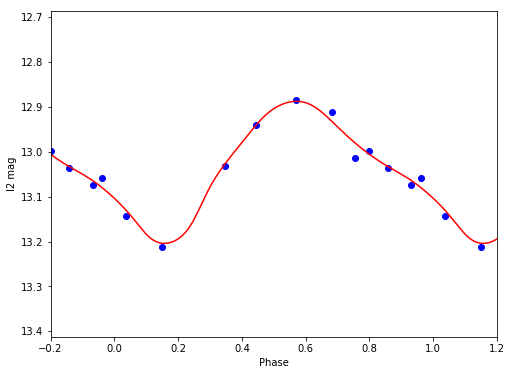

I2 13.0288593951 0.316213709861


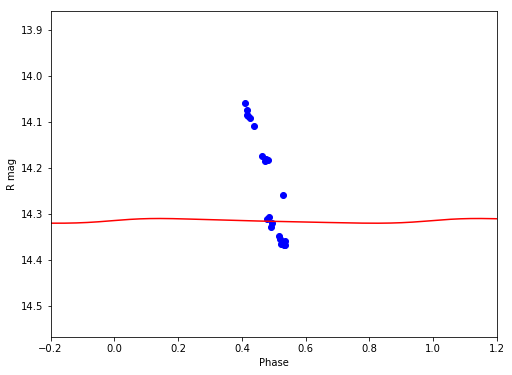

R 14.3163278224 0.0102280767036


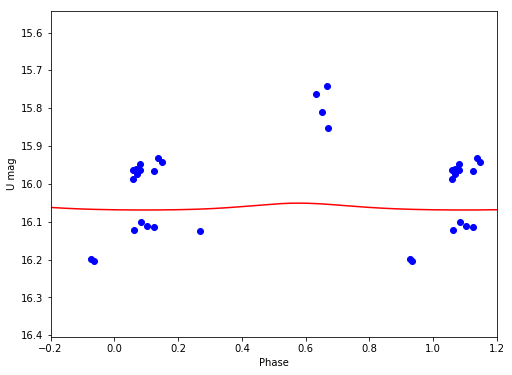

U 16.0618555683 0.0180994661428


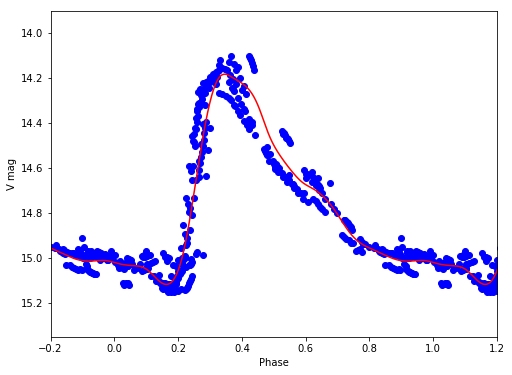

V 14.7148268934 0.933914216247
V7
/Volumes/Annie/CRRP/NGC3201/lcvs/V7.phased


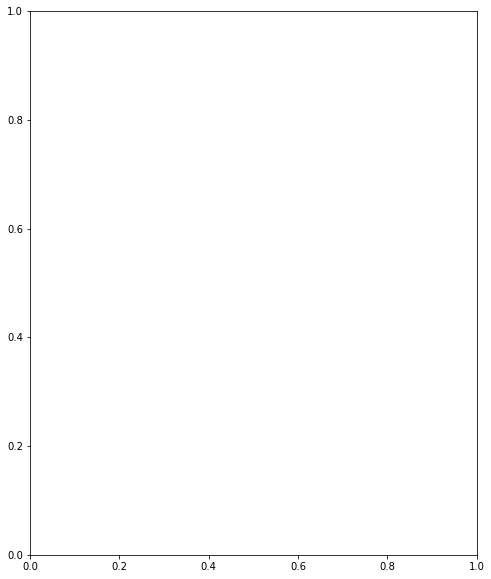

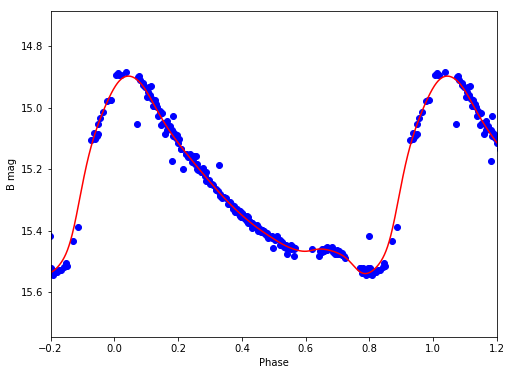

B 15.2547494488 0.641755591146


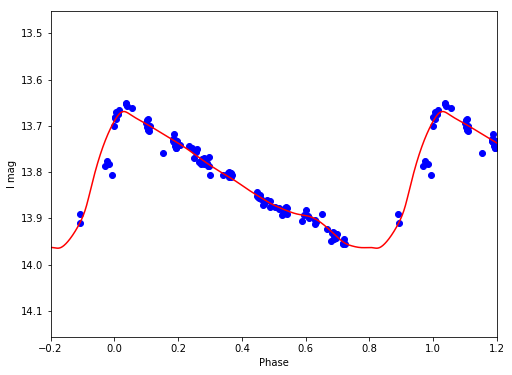

I 13.8257892806 0.295403720249


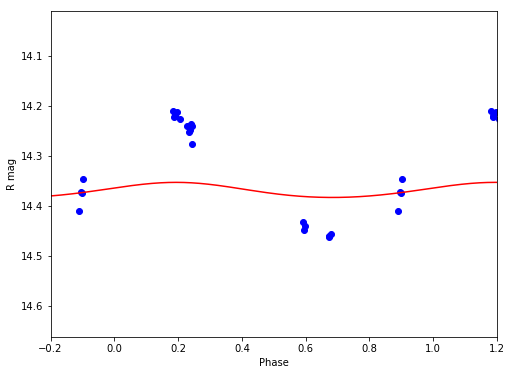

R 14.3687073088 0.0301293819091


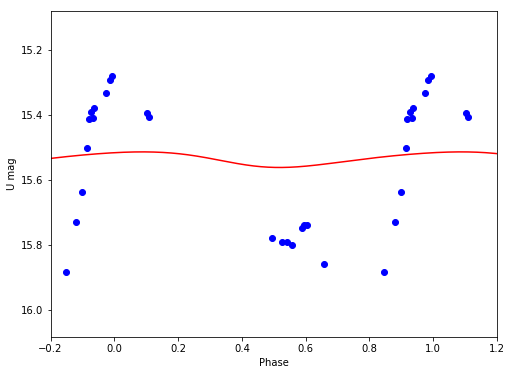

U 15.535158025 0.048032773844


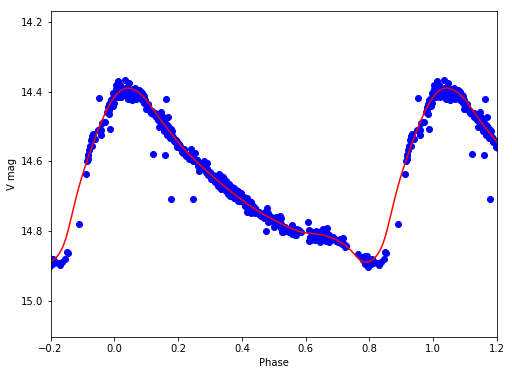

V 14.6552916692 0.499398971312
V8
/Volumes/Annie/CRRP/NGC3201/lcvs/V8.phased


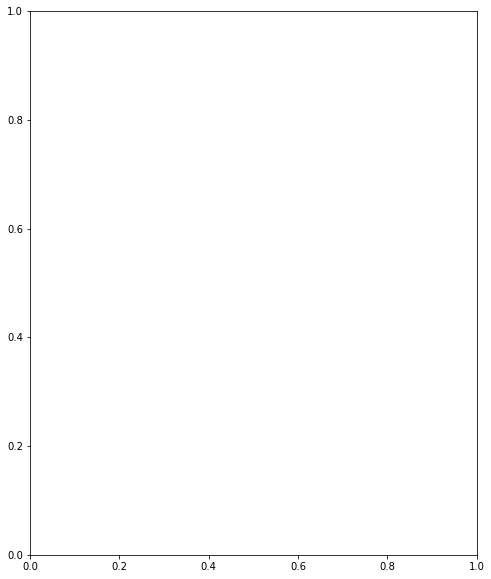

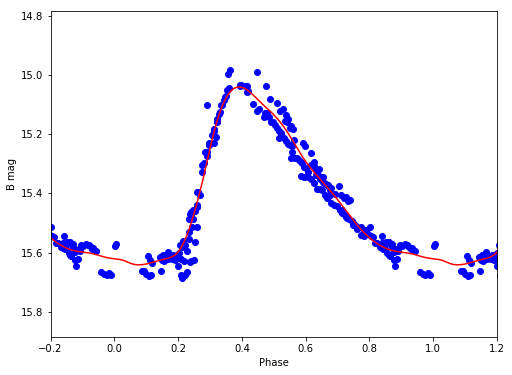

B 15.3932219622 0.601458153618


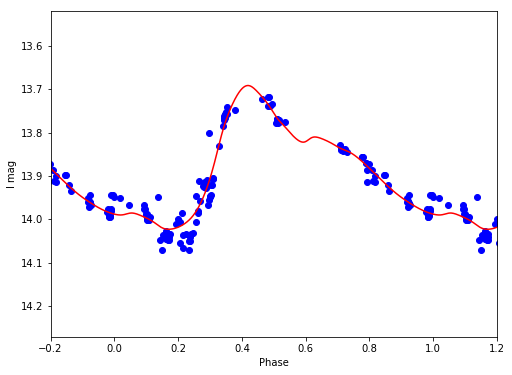

I 13.8789241071 0.33143126877


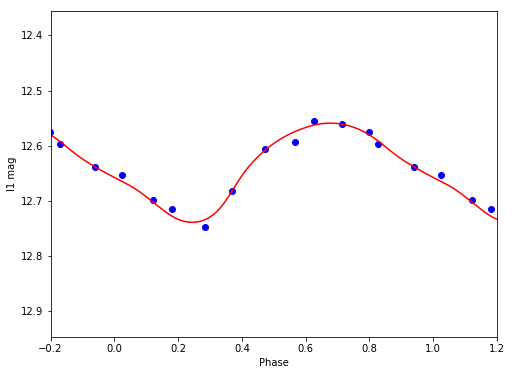

I1 12.6379537612 0.18002272312


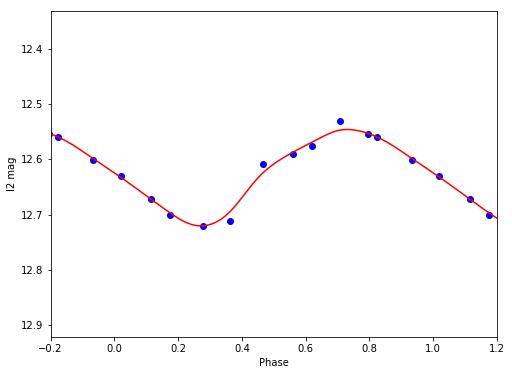

I2 12.6239008944 0.17434007725


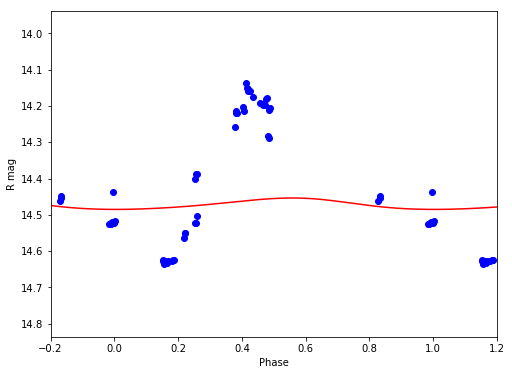

R 14.470662192 0.0314835218509


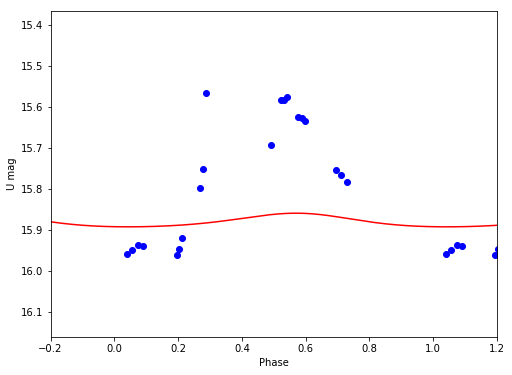

U 15.8786410177 0.0332962491617


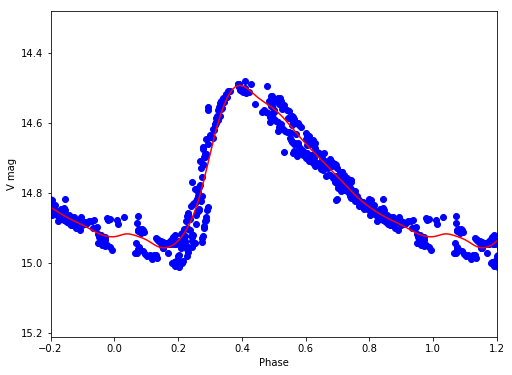

V 14.7585521386 0.463971017188
V9
/Volumes/Annie/CRRP/NGC3201/lcvs/V9.phased


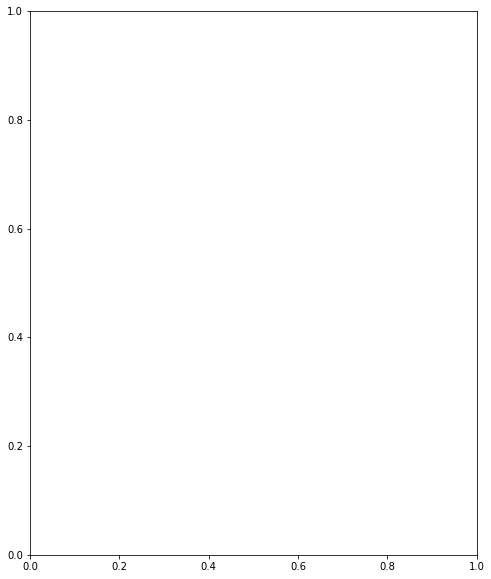

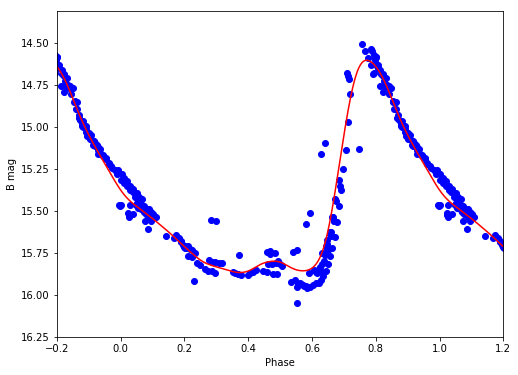

B 15.3849880905 1.2631586592


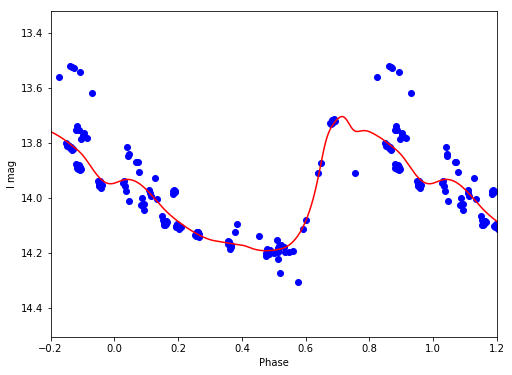

I 13.9801656266 0.487353475001


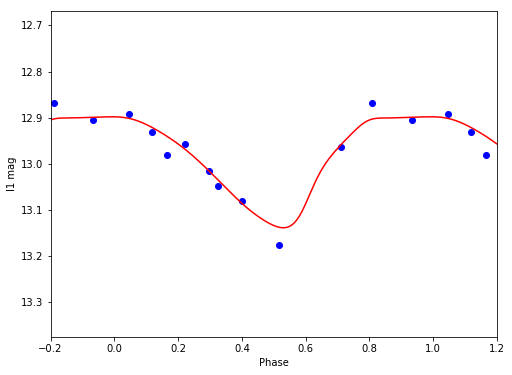

I1 12.9832977225 0.240565127919


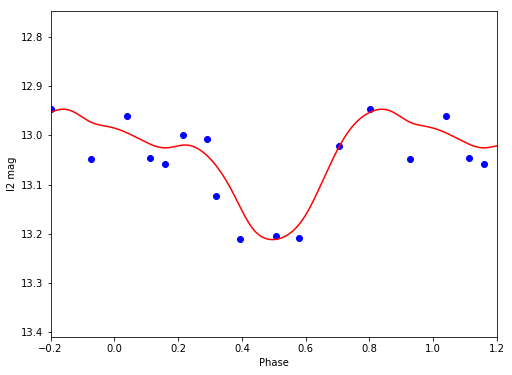

I2 13.0506334888 0.265419985725


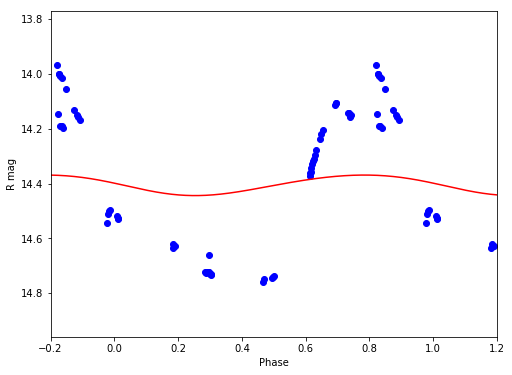

R 14.4038783736 0.0749607453051


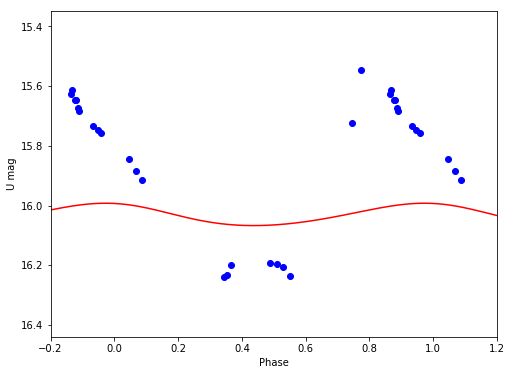

U 16.0321160923 0.0749350885809


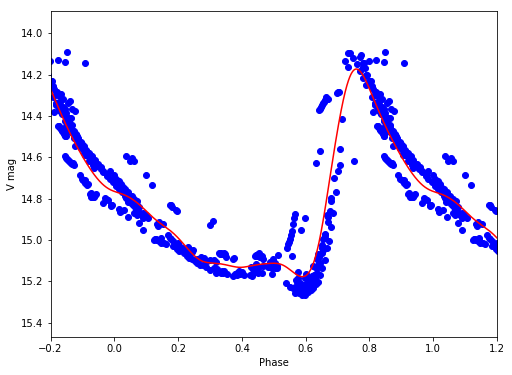

V 14.8021380847 1.00532948527
V10
/Volumes/Annie/CRRP/NGC3201/lcvs/V10.phased


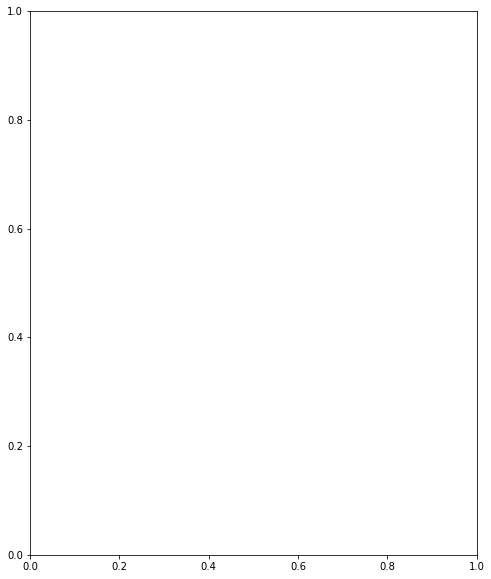

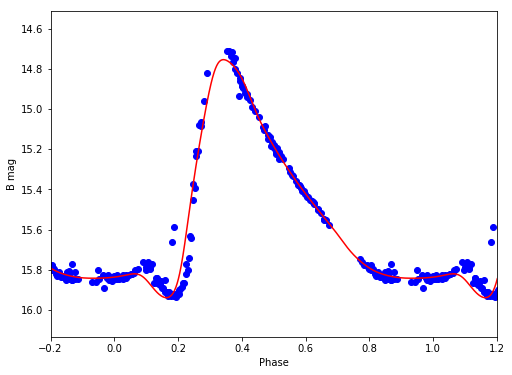

B 15.4421364005 1.18580394778


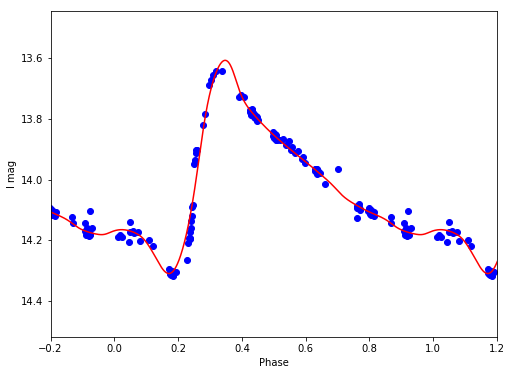

I 14.0012784588 0.70276846416


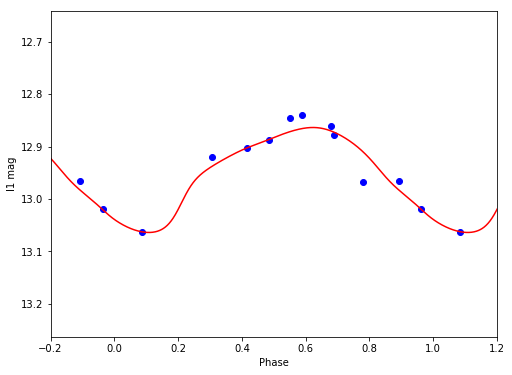

I1 12.9475672296 0.200504645998


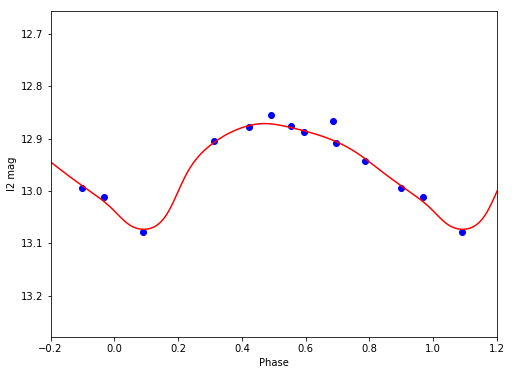

I2 12.9484157262 0.20228383855


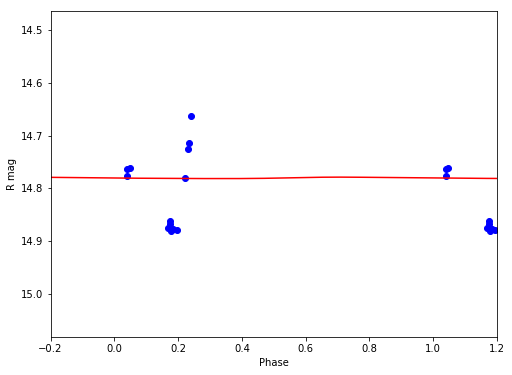

R 14.780574139 0.00276174723841


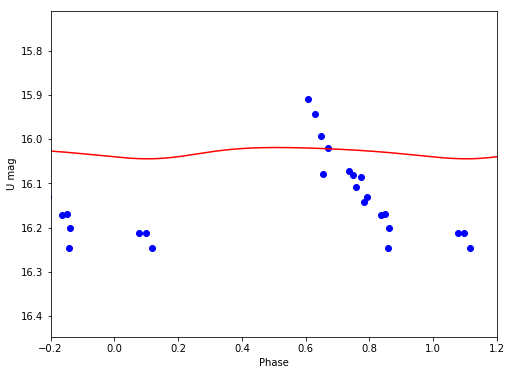

U 16.0293537066 0.0255290902182


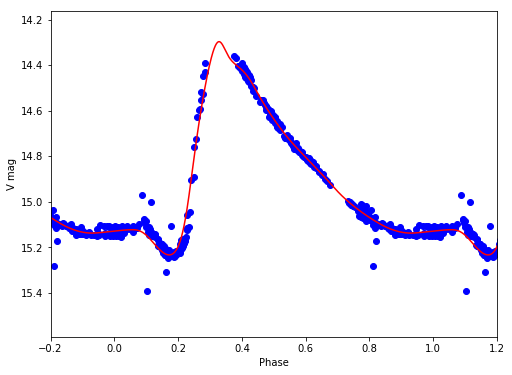

V 14.8486067154 0.935694394849
V11
/Volumes/Annie/CRRP/NGC3201/lcvs/V11.phased


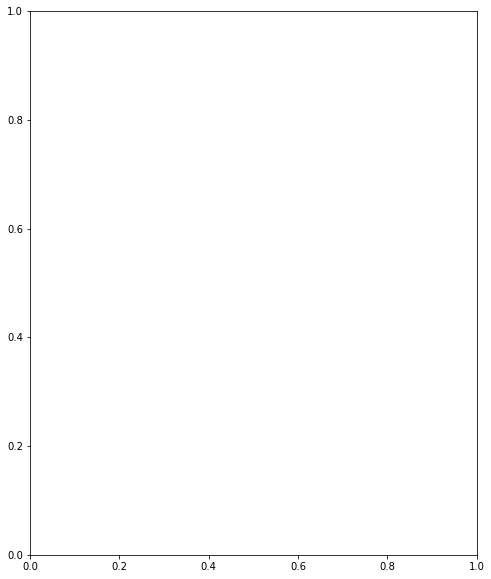

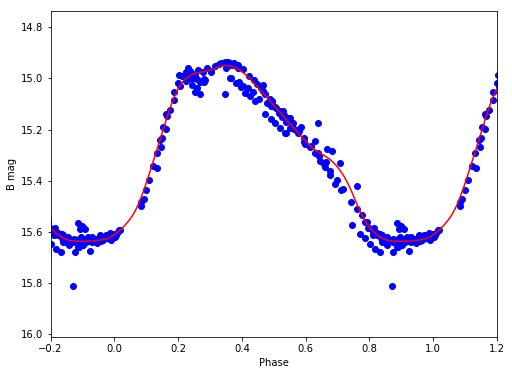

B 15.2635039133 0.686973168029


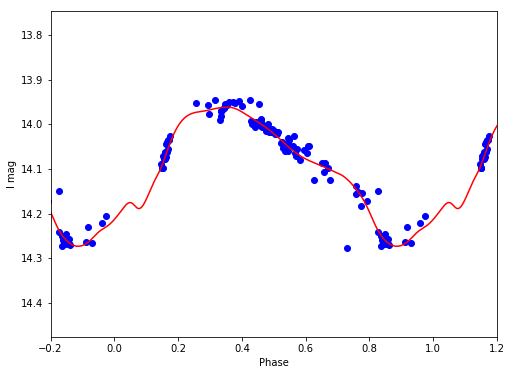

I 14.0943438971 0.311634320402


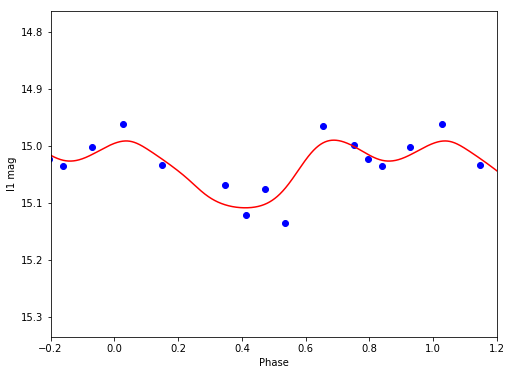

I1 15.0379118701 0.118826713112


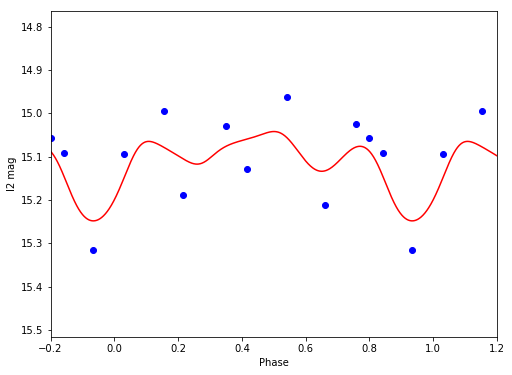

I2 15.1102855659 0.206291315169


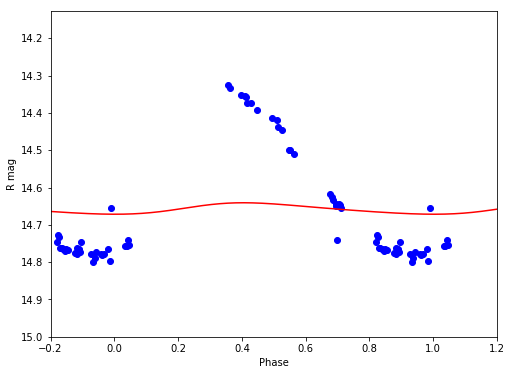

R 14.6569947404 0.0307364259674


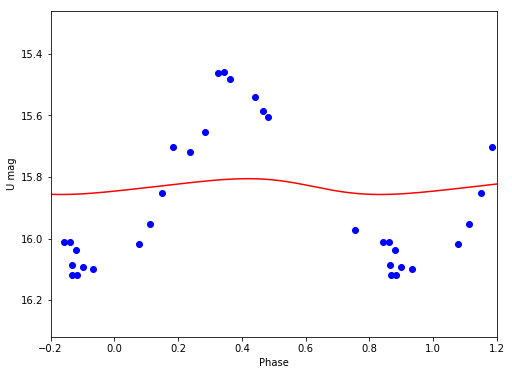

U 15.8307286773 0.0513360002848


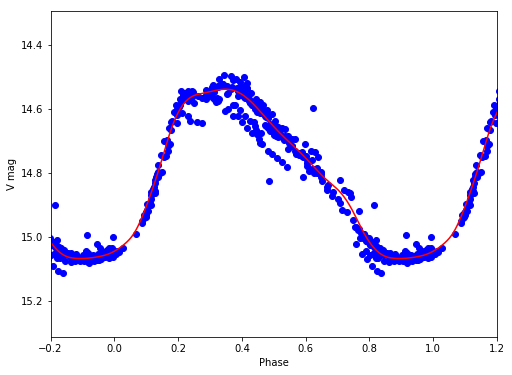

V 14.7844385958 0.5284169761
V12
/Volumes/Annie/CRRP/NGC3201/lcvs/V12.phased


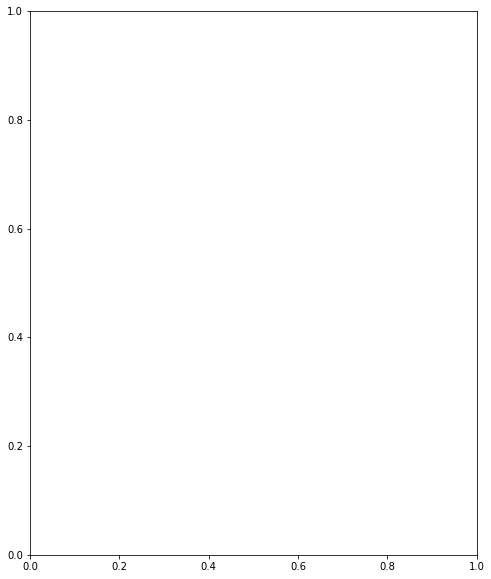

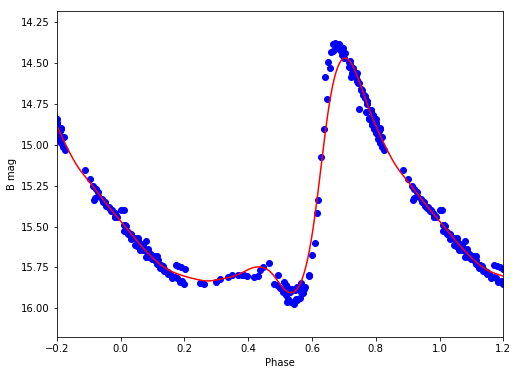

B 15.3527736913 1.4363668994


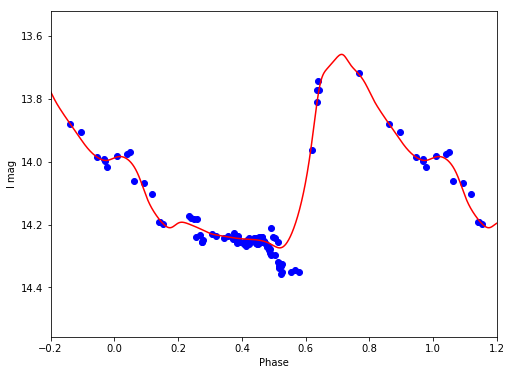

I 14.0260042558 0.615791167022


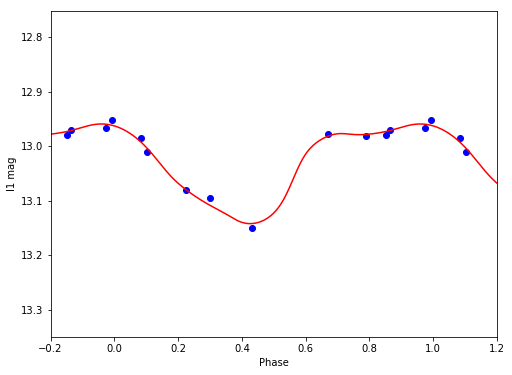

I1 13.032032975 0.183020214418


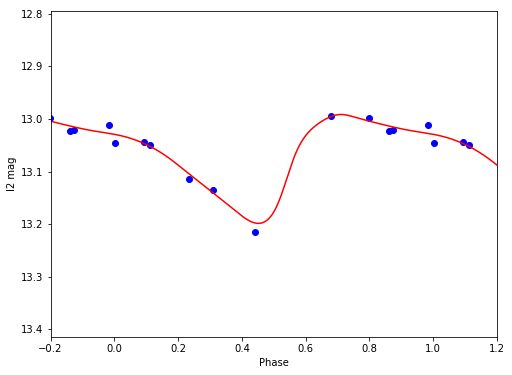

I2 13.0686002596 0.206936925303


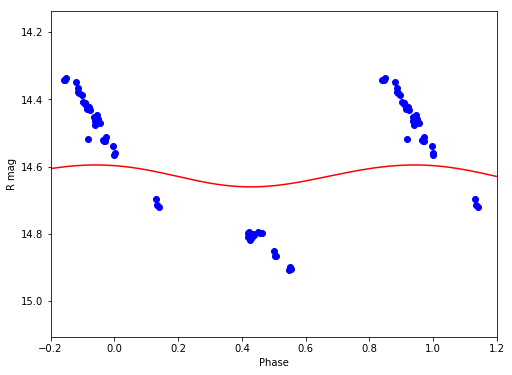

R 14.6270896603 0.0654026917628


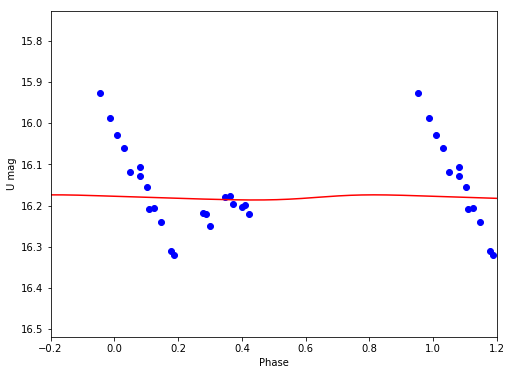

U 16.1803490252 0.0124791405403


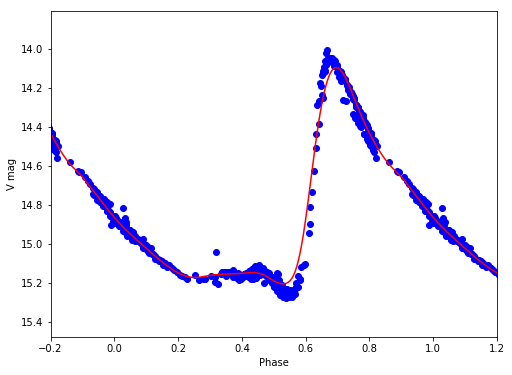

V 14.7962563257 1.10762176883
V13
/Volumes/Annie/CRRP/NGC3201/lcvs/V13.phased


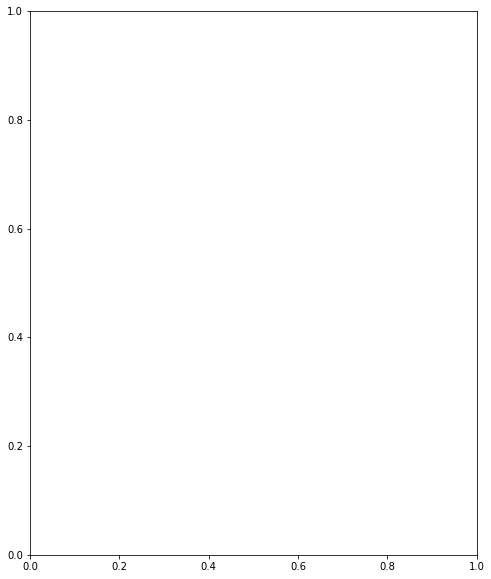

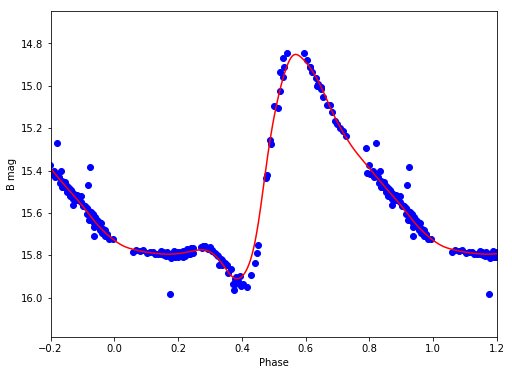

B 15.4642094041 1.05820306028


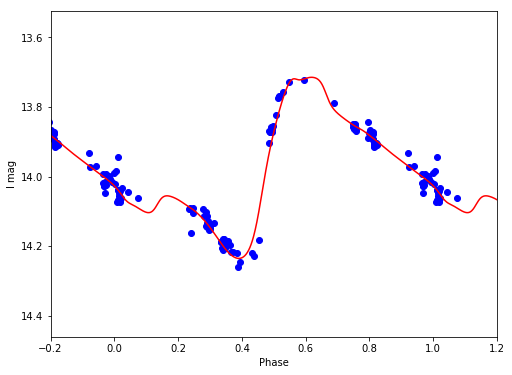

I 13.9692587743 0.520305366745


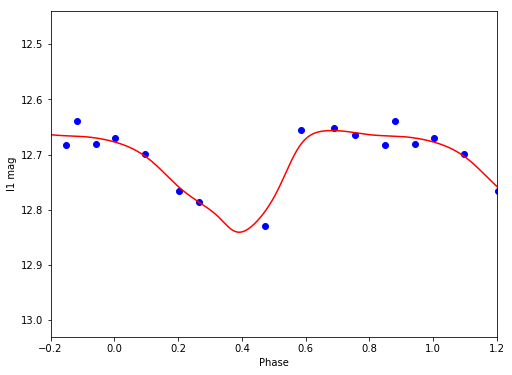

I1 12.7196191223 0.18420572901


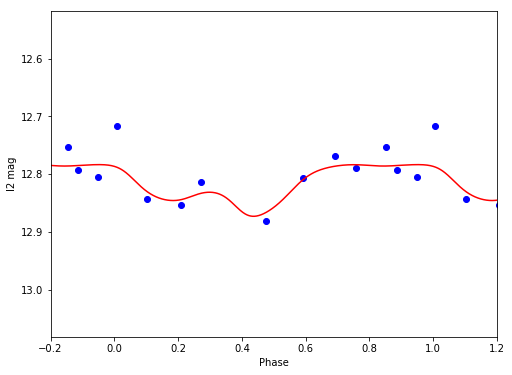

I2 12.8167541139 0.0893656617741


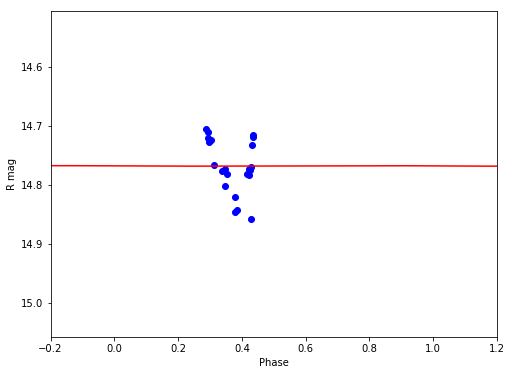

R 14.7678720453 0.000808890101052


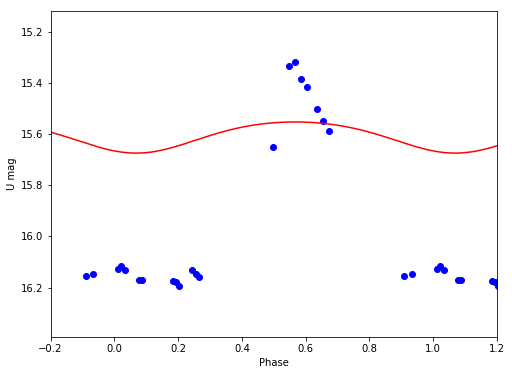

U 15.6045816151 0.122028022989


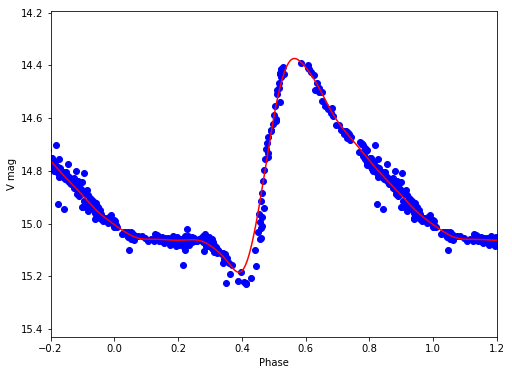

V 14.8356578502 0.811380496277
V14
/Volumes/Annie/CRRP/NGC3201/lcvs/V14.phased


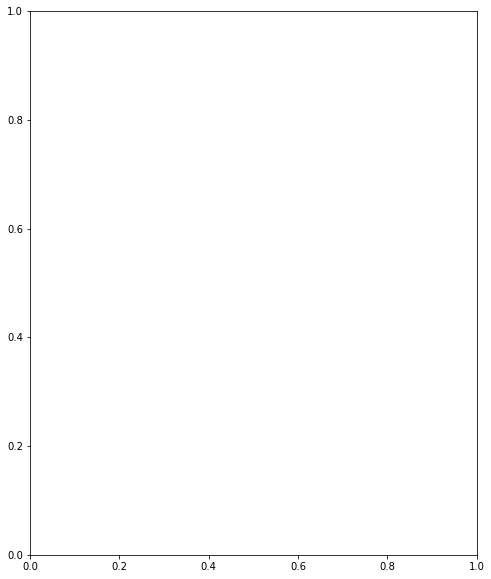

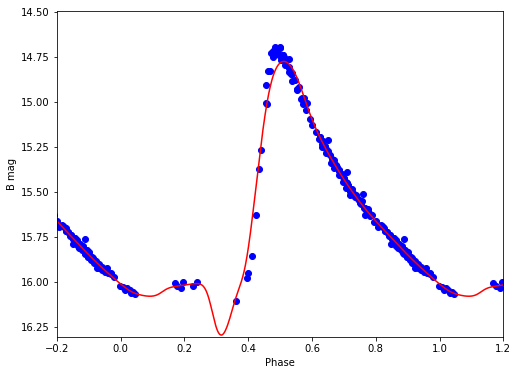

B 15.5906456055 1.52192843748


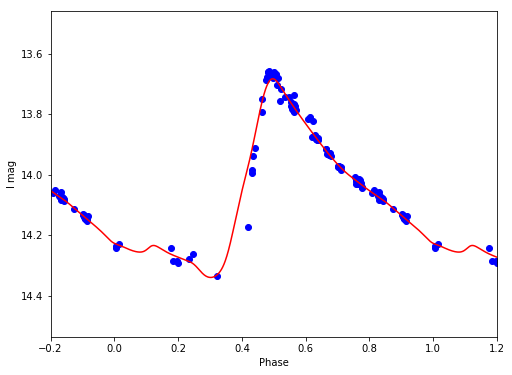

I 14.0645280452 0.656581684279


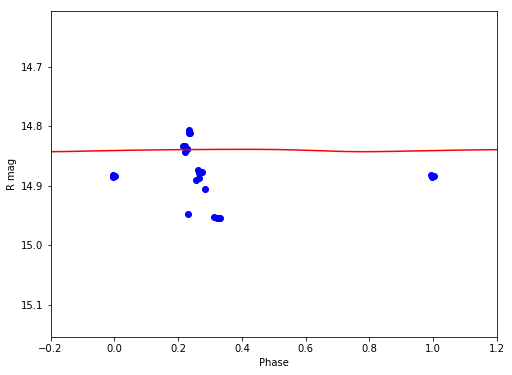

R 14.8406300544 0.00400759924485


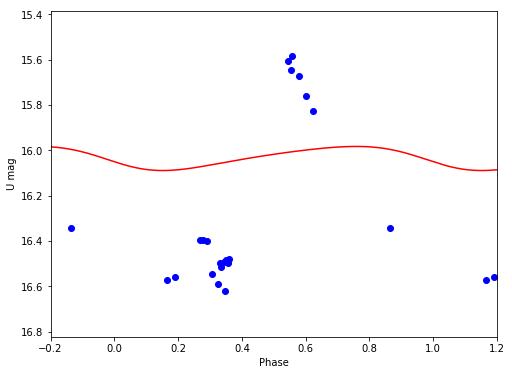

U 16.0305871734 0.106330263278


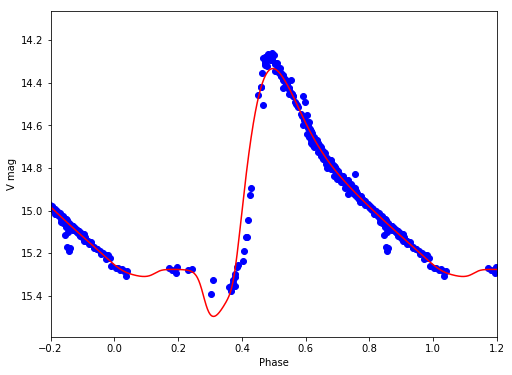

V 14.9576127565 1.16337244662
V15
/Volumes/Annie/CRRP/NGC3201/lcvs/V15.phased


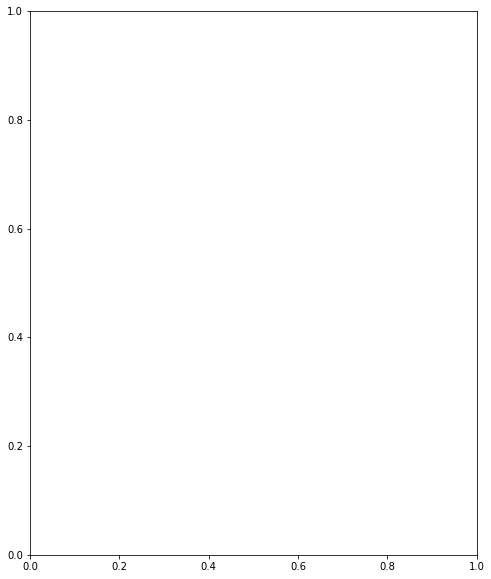

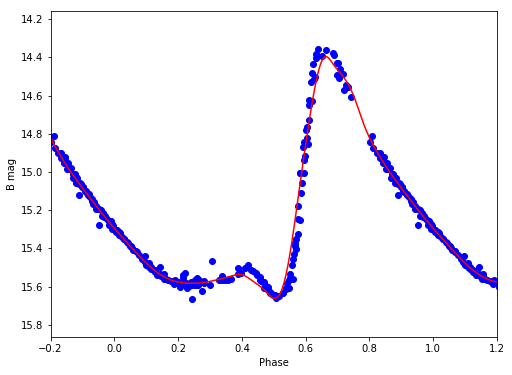

B 15.1523900907 1.26579150738


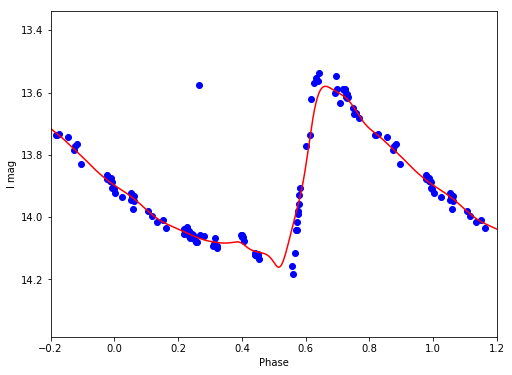

I 13.9000966577 0.580703495252


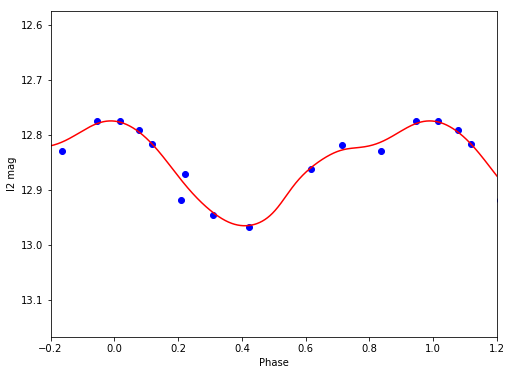

I2 12.8583460599 0.190266134067


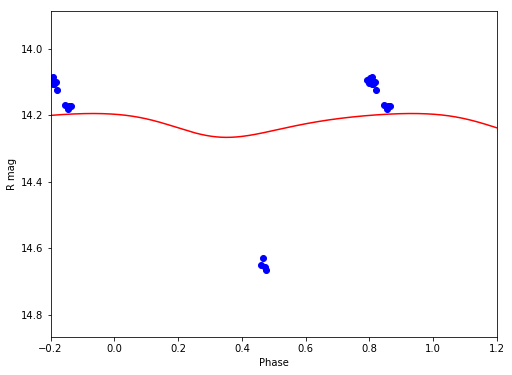

R 14.224632875 0.071802760217


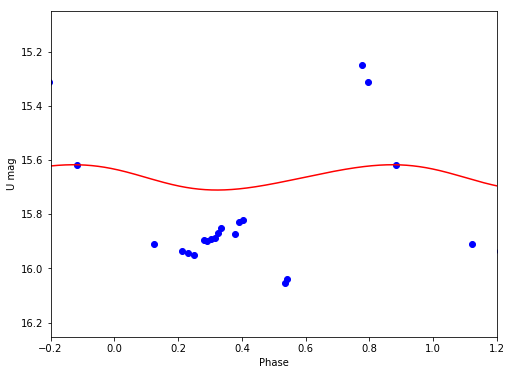

U 15.6632862867 0.0932827644655


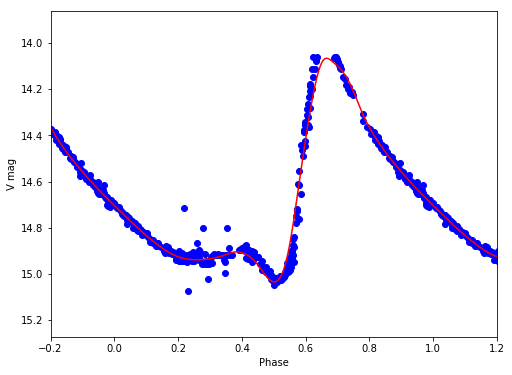

V 14.6336107983 0.970838624959
V16
/Volumes/Annie/CRRP/NGC3201/lcvs/V16.phased


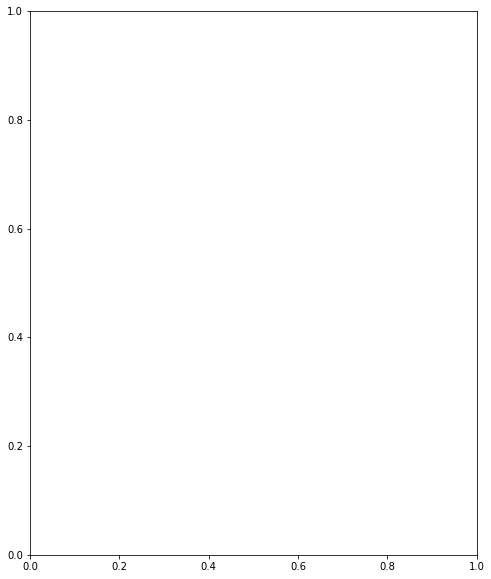

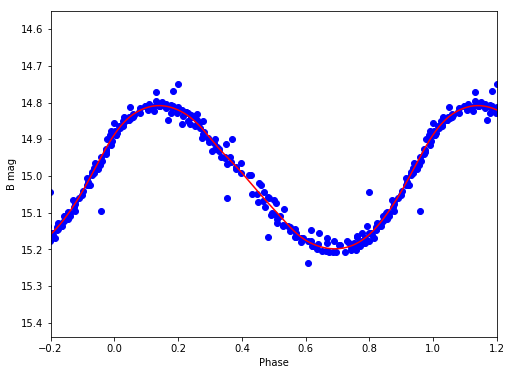

B 14.9980591809 0.390321983904


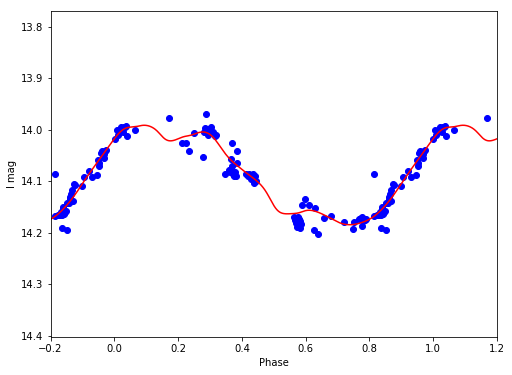

I 14.0857169657 0.193037682184


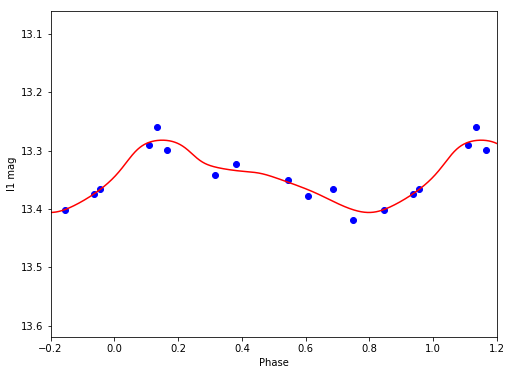

I1 13.3467698901 0.123905507449


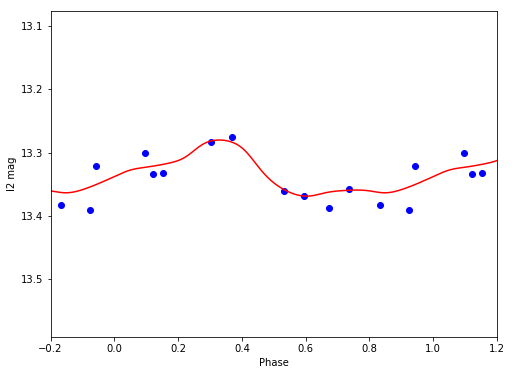

I2 13.3342192846 0.088688999176


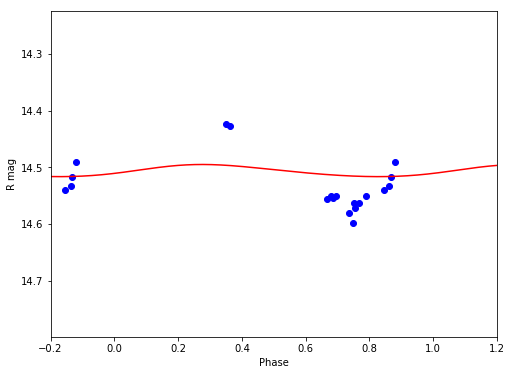

R 14.5060720508 0.0213864628215


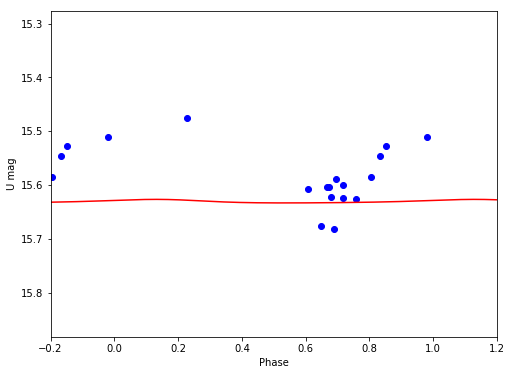

U 15.6301422043 0.00657646523684


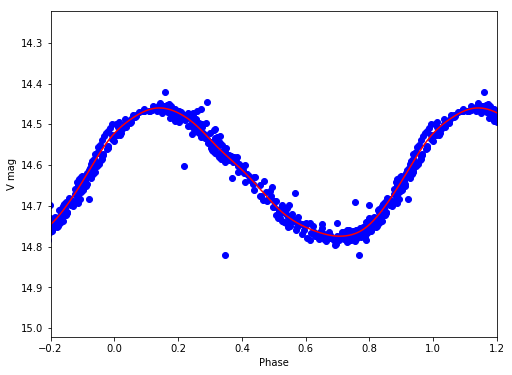

V 14.6157686556 0.31451324621
V17
/Volumes/Annie/CRRP/NGC3201/lcvs/V17.phased


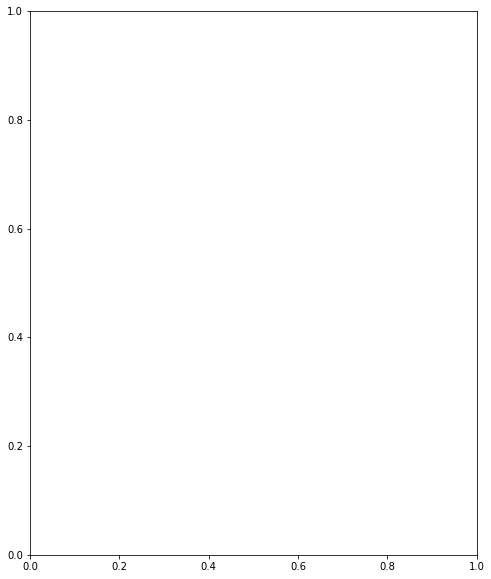

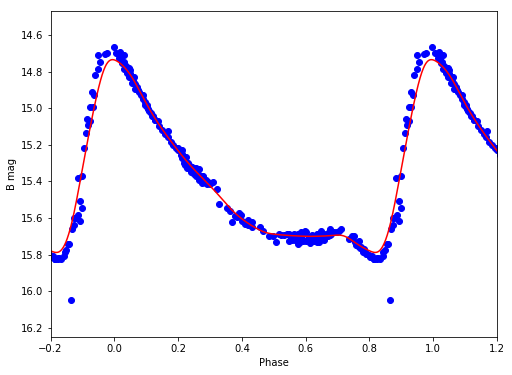

B 15.3619920926 1.05352381447


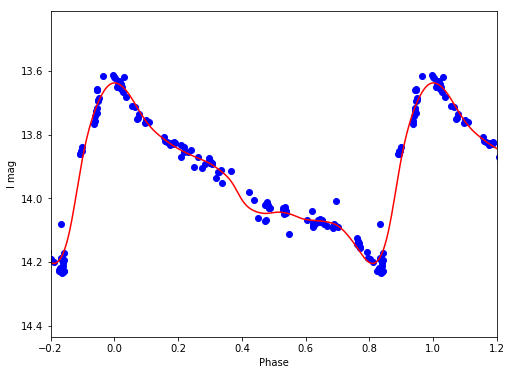

I 13.9291941032 0.565116761698


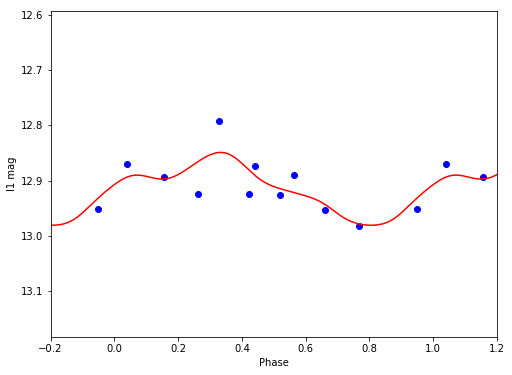

I1 12.914010597 0.131960508084


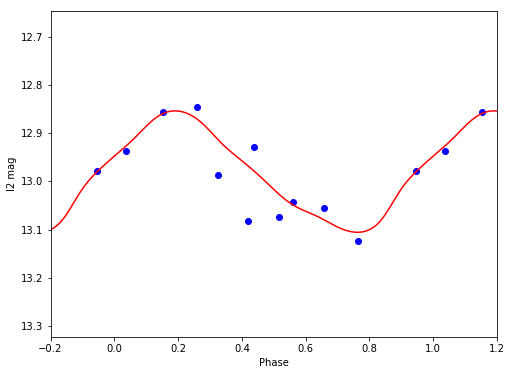

I2 12.9797160109 0.25239229318


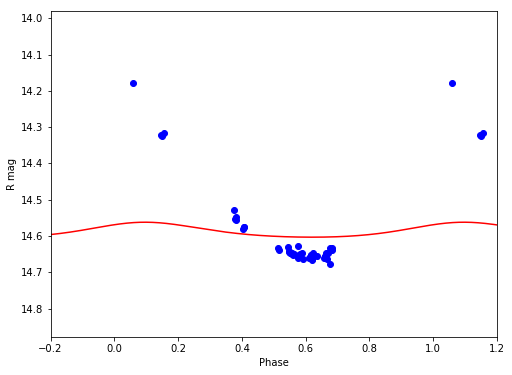

R 14.5864179794 0.04123067113


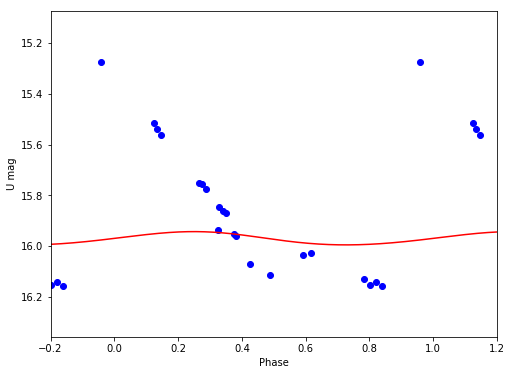

U 15.9689368304 0.0521339969374


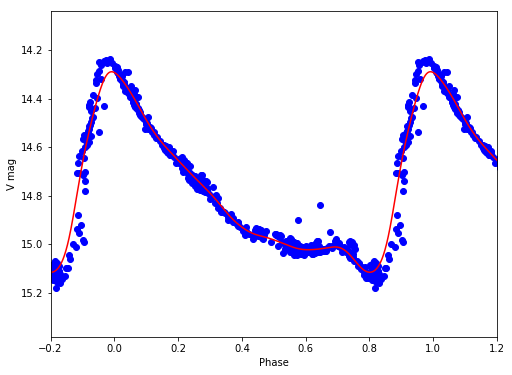

V 14.7661528681 0.826275950575
V18
/Volumes/Annie/CRRP/NGC3201/lcvs/V18.phased


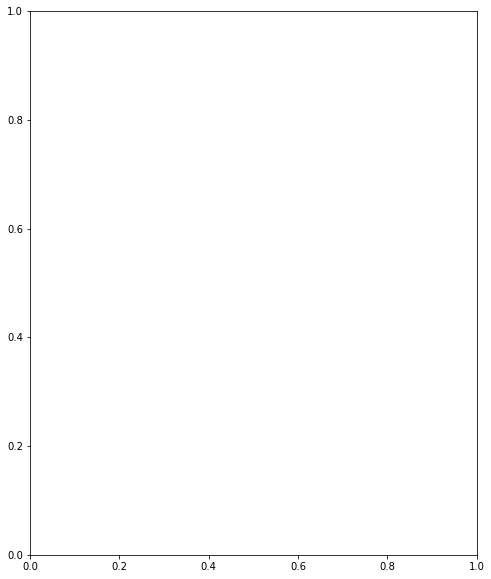

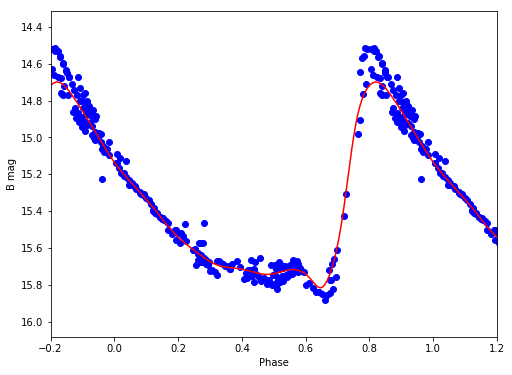

B 15.3377355472 1.1141909496


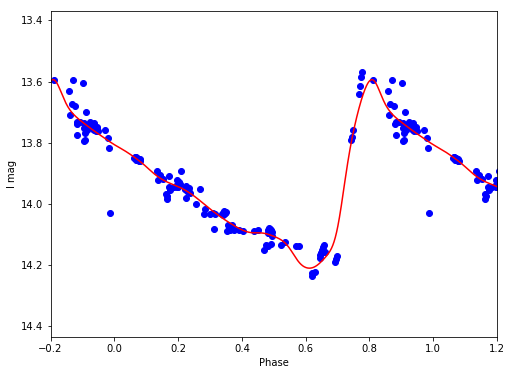

I 13.9295741457 0.616604879961


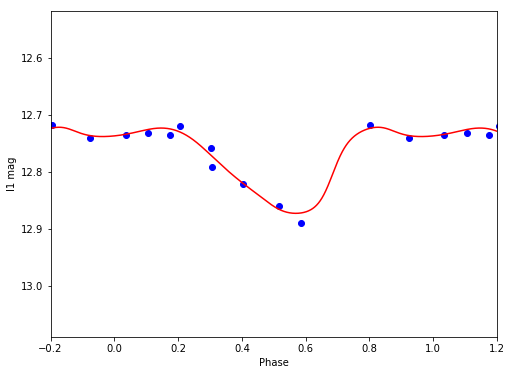

I1 12.773639635 0.150976428203


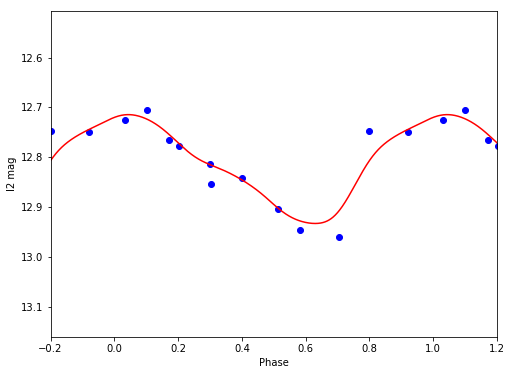

I2 12.8143863553 0.218250419853


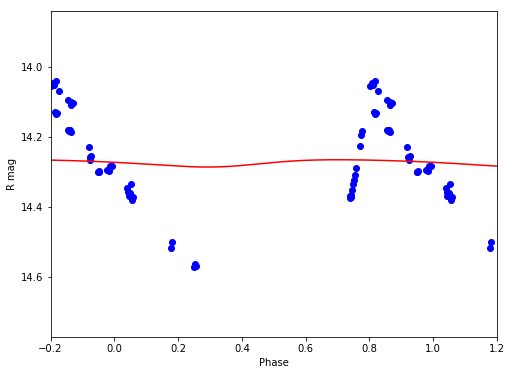

R 14.2734283873 0.0209356543941


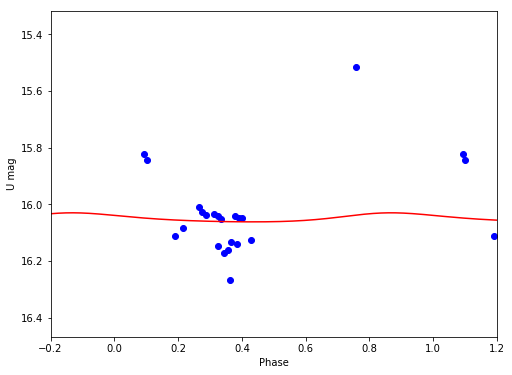

U 16.0487391109 0.0319329152544


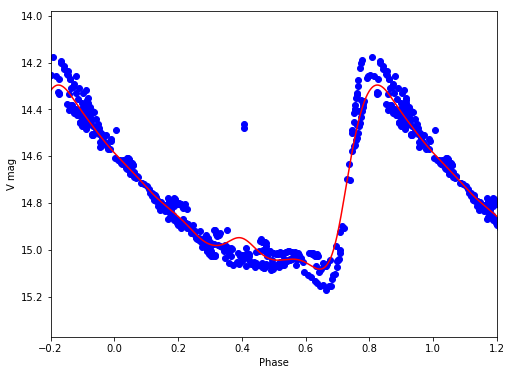

V 14.7550426432 0.786277631695
V19
/Volumes/Annie/CRRP/NGC3201/lcvs/V19.phased


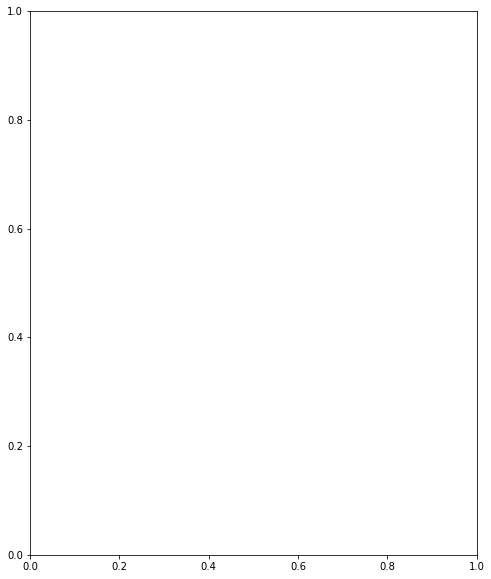

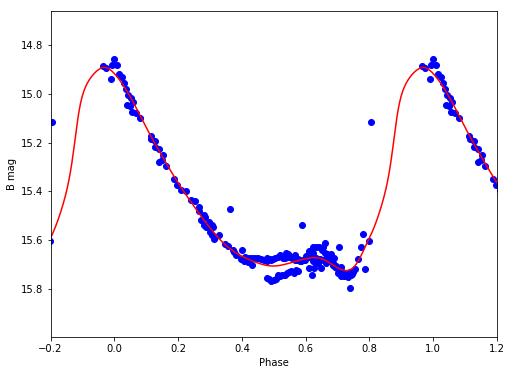

B 15.3980657958 0.83303094074


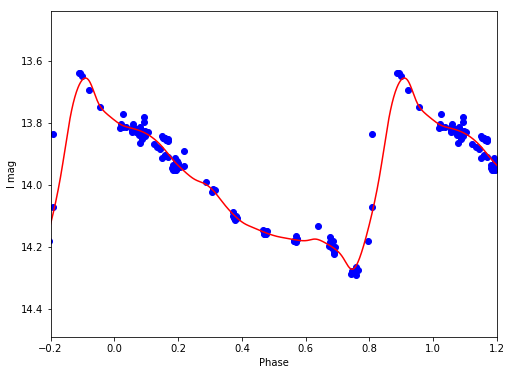

I 13.9917722462 0.615642815176


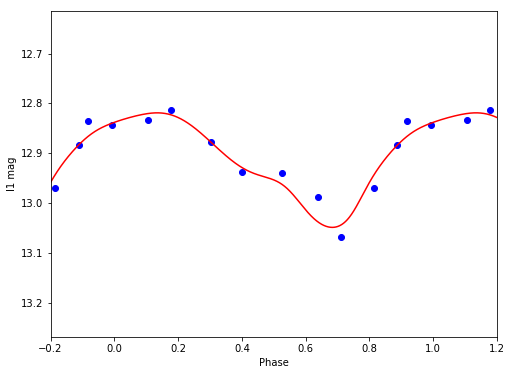

I1 12.9114938845 0.22966823334


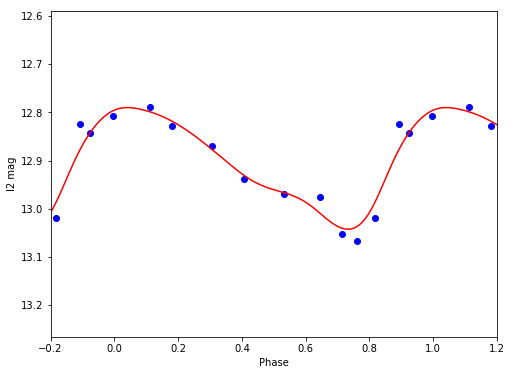

I2 12.9046015439 0.25327642172


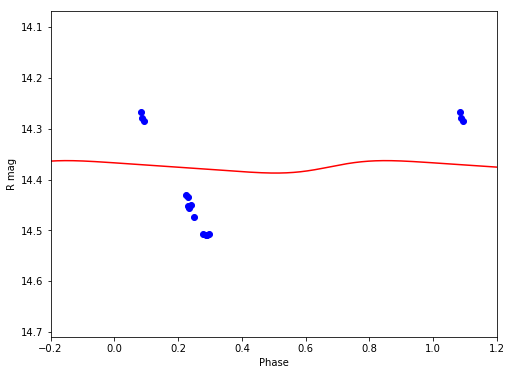

R 14.3747916242 0.0244205955964


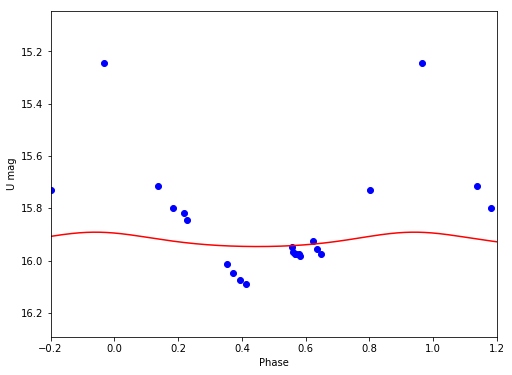

U 15.9225302966 0.0548658022359


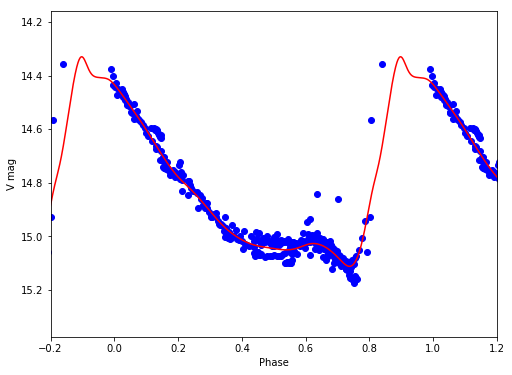

V 14.7880747319 0.781324543681
V20
/Volumes/Annie/CRRP/NGC3201/lcvs/V20.phased


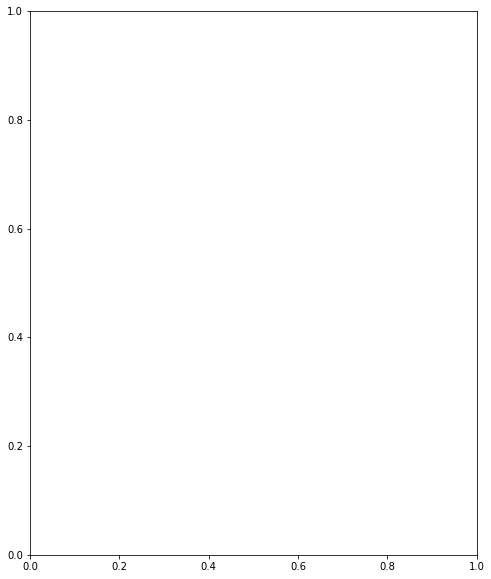

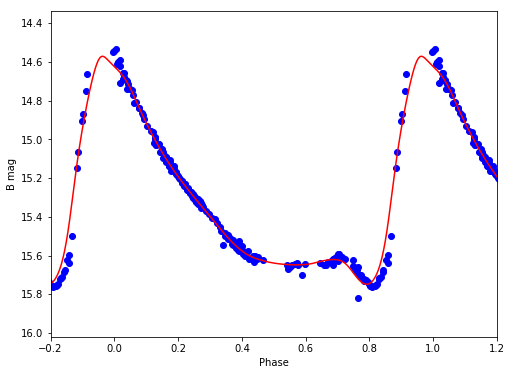

B 15.2604714297 1.17834000915


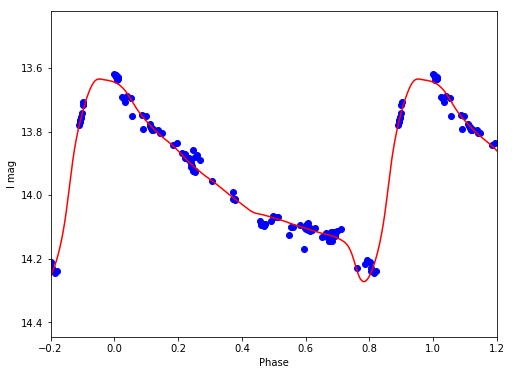

I 13.9398139703 0.636851774951


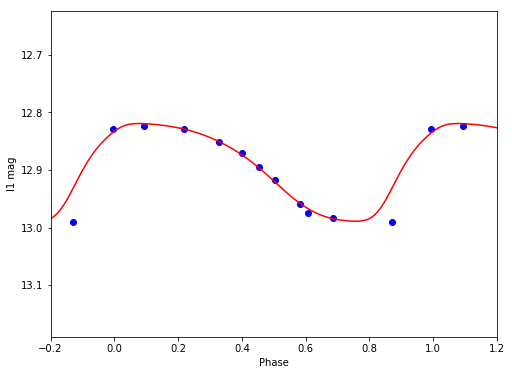

I1 12.8933639859 0.169885884721


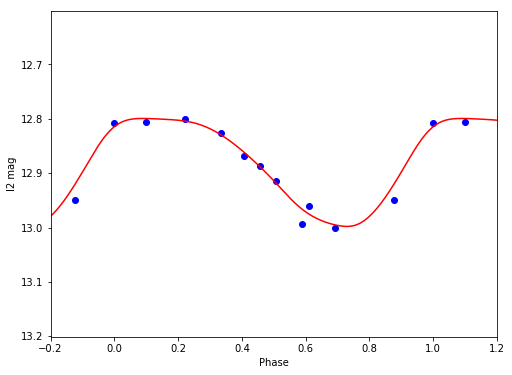

I2 12.8826892715 0.198604517695


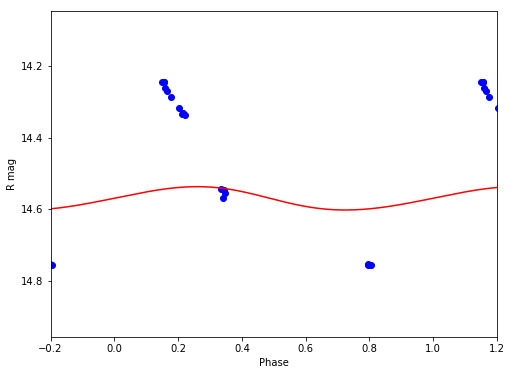

R 14.5699169673 0.065132882539


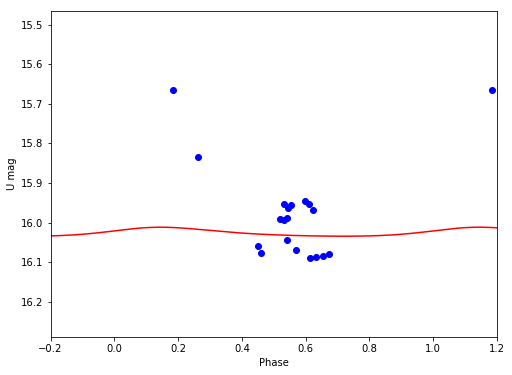

U 16.0252377431 0.0226944703183


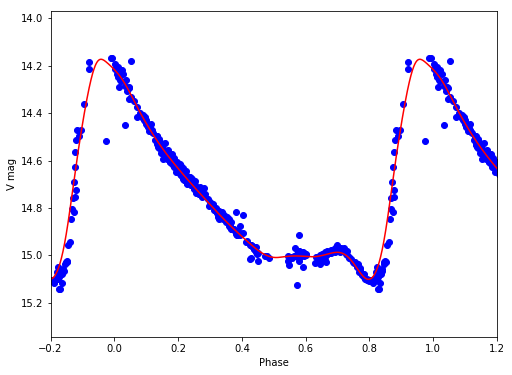

V 14.7128990909 0.927770857282
V21
/Volumes/Annie/CRRP/NGC3201/lcvs/V21.phased


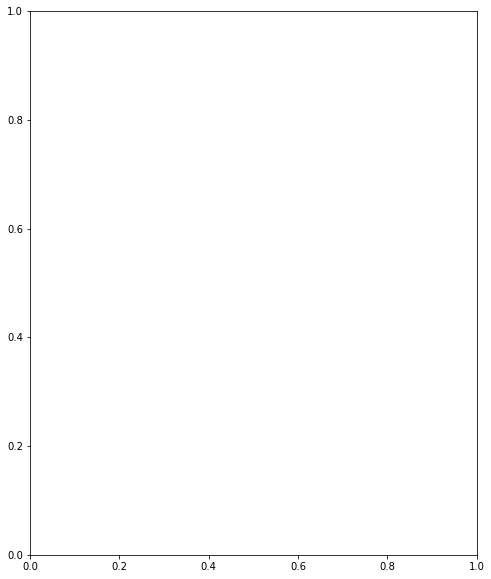

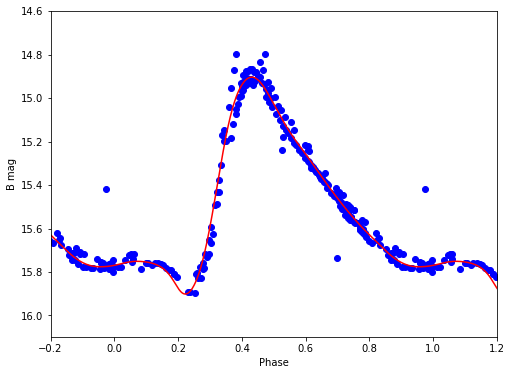

B 15.4576767208 0.997339579264


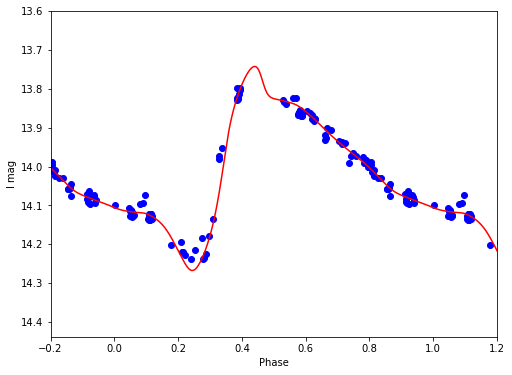

I 13.9992279474 0.524872036742


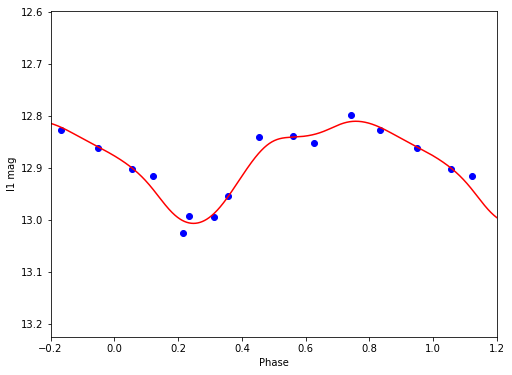

I1 12.8851693712 0.196000901985


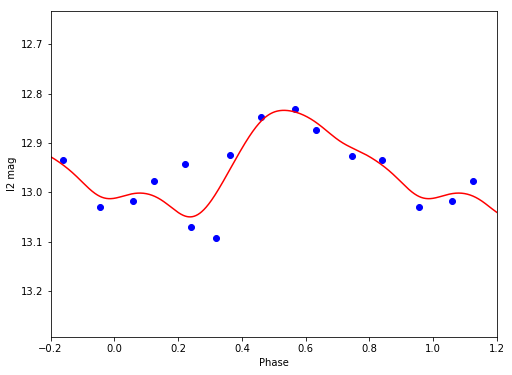

I2 12.9448987258 0.215931003771


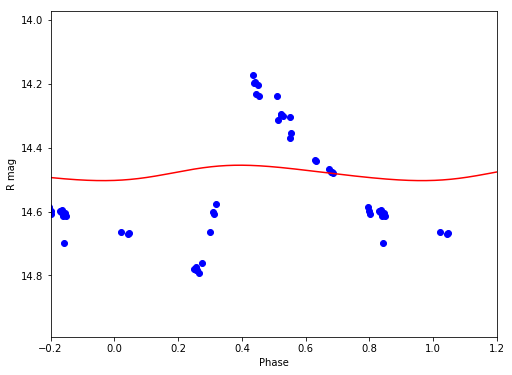

R 14.4793468069 0.0482523633221


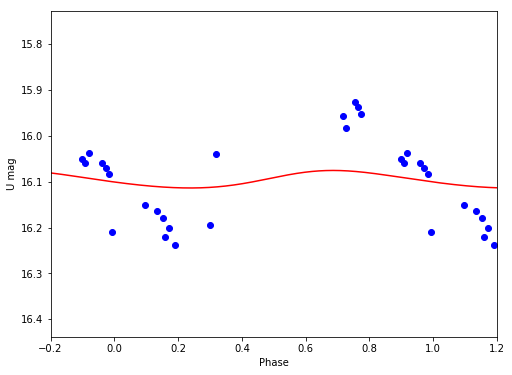

U 16.0955041366 0.0382012601049


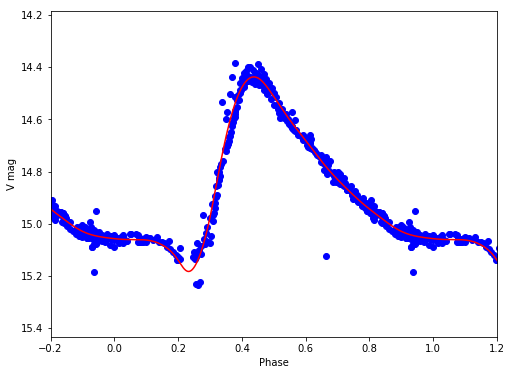

V 14.8460529505 0.745664520565
V22
/Volumes/Annie/CRRP/NGC3201/lcvs/V22.phased


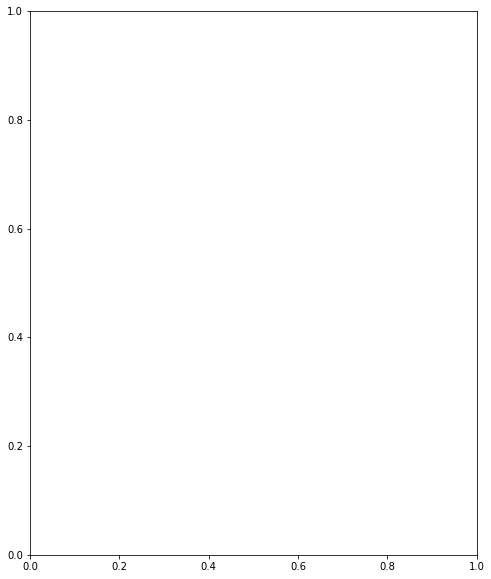

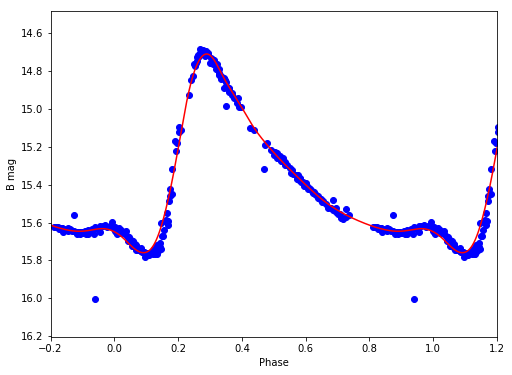

B 15.326257289 1.04830172643


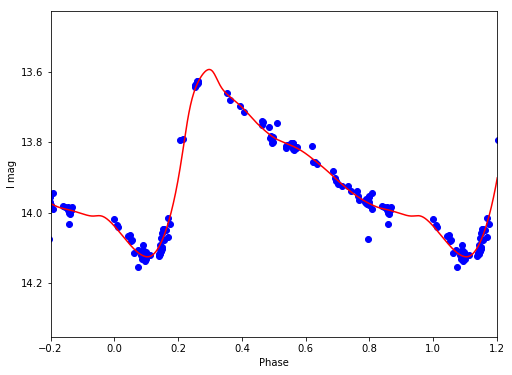

I 13.8748442684 0.533010744081


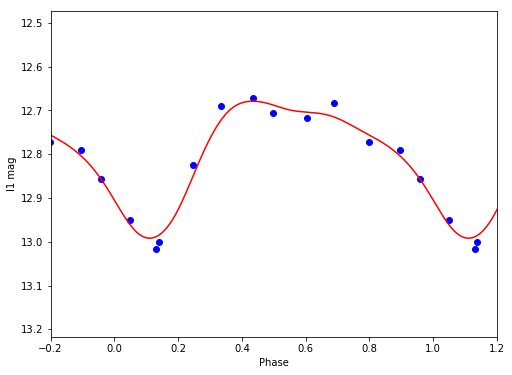

I1 12.7892428705 0.312903331842


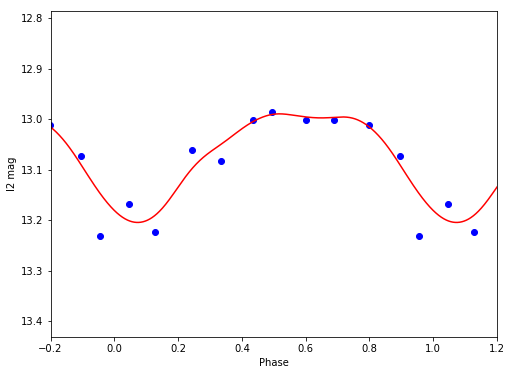

I2 13.0666323539 0.215077376428


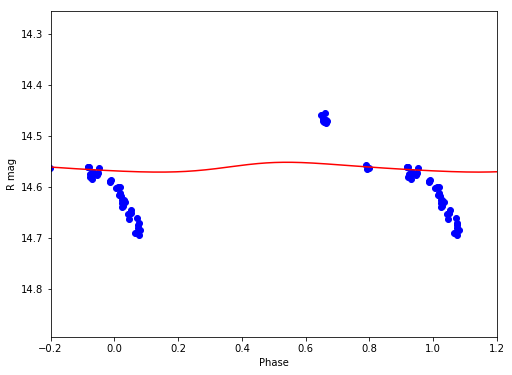

R 14.5618864416 0.0192122345699


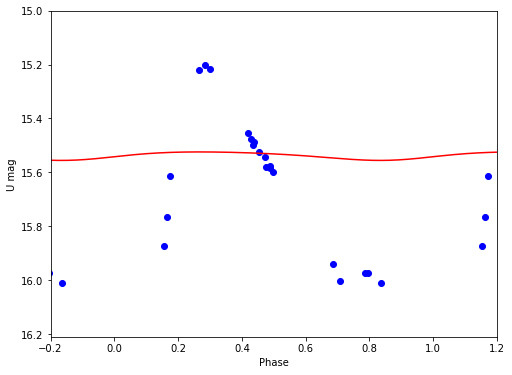

U 15.5374662413 0.0314831070143


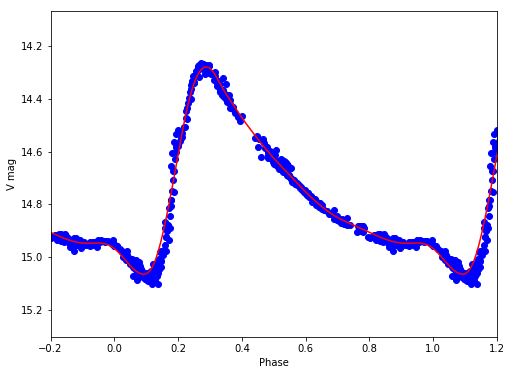

V 14.7220767262 0.786731737635
V23
/Volumes/Annie/CRRP/NGC3201/lcvs/V23.phased


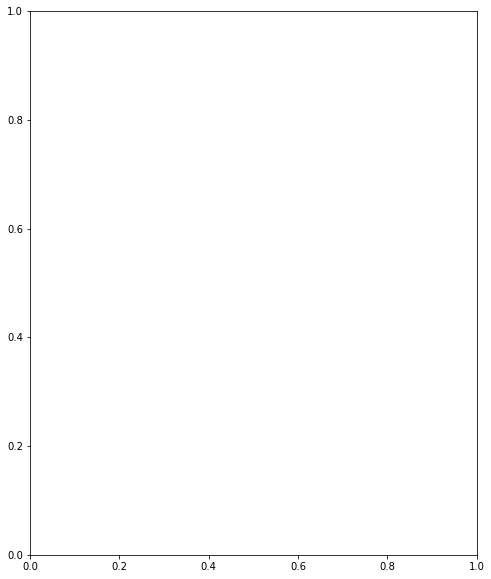

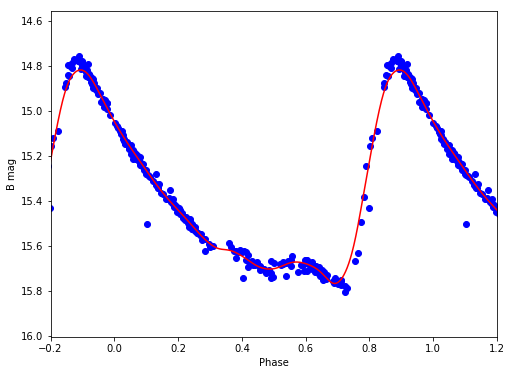

B 15.3724964469 0.948446785696


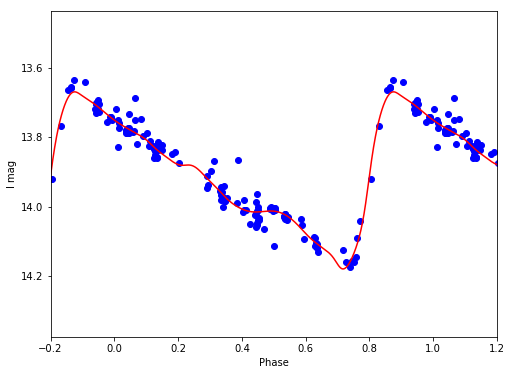

I 13.9111190134 0.509862455514


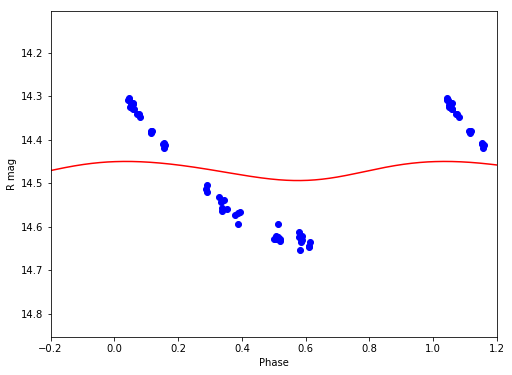

R 14.4705406504 0.0439628098112


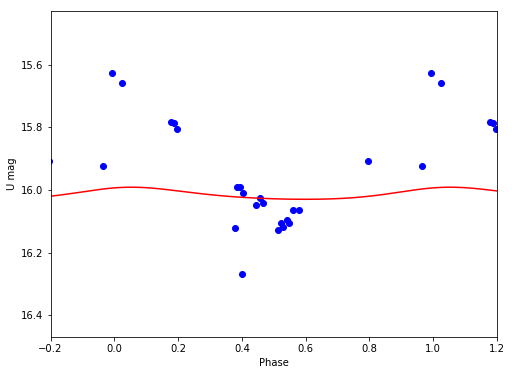

U 16.0137488781 0.0386546816277


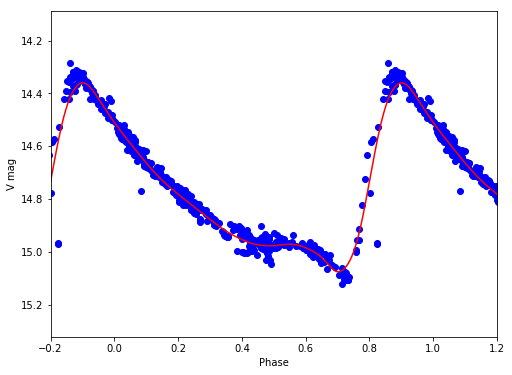

V 14.768394592 0.716086344066
V24
/Volumes/Annie/CRRP/NGC3201/lcvs/V24.phased


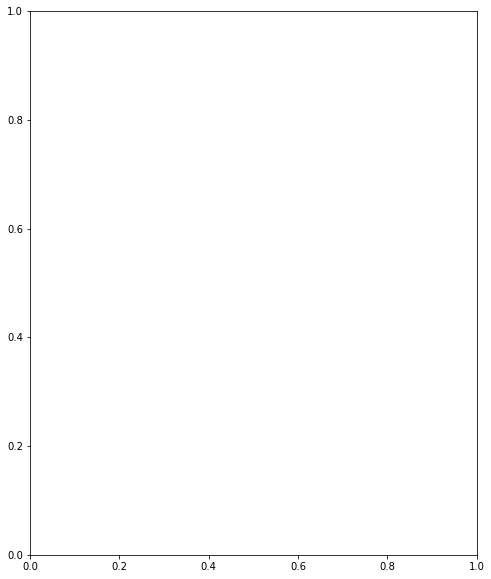

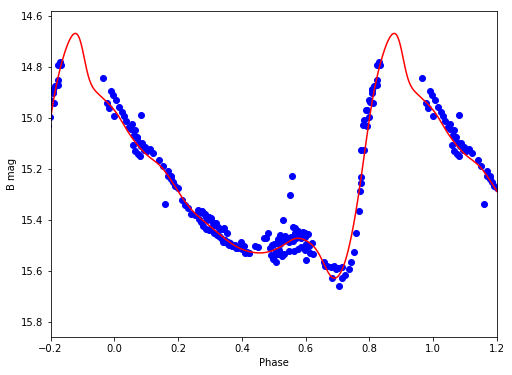

B 15.2357980976 0.960402130912


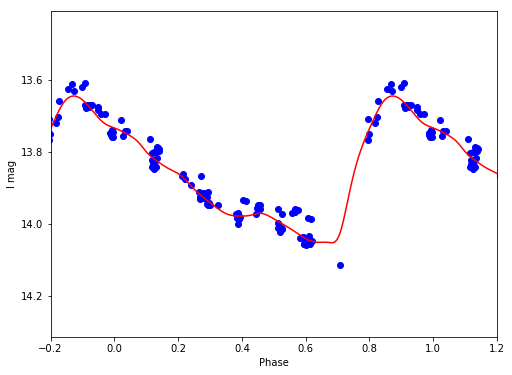

I 13.8671050586 0.407668236394


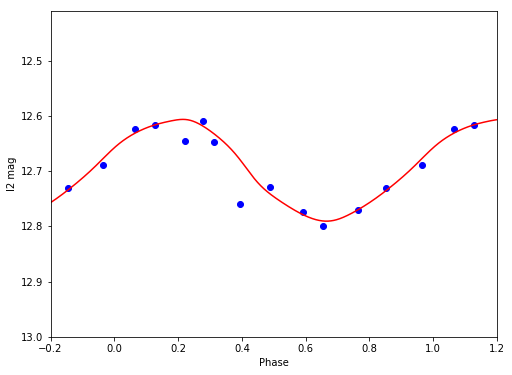

I2 12.6960673799 0.184407211891


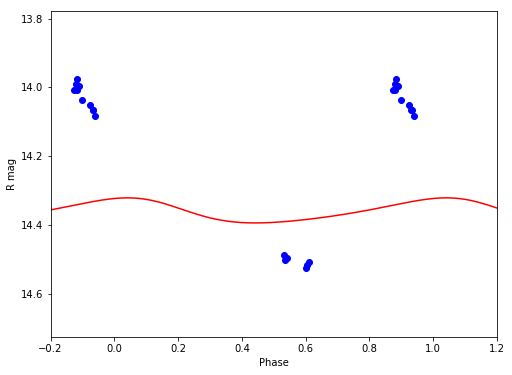

R 14.361115543 0.0729087560626


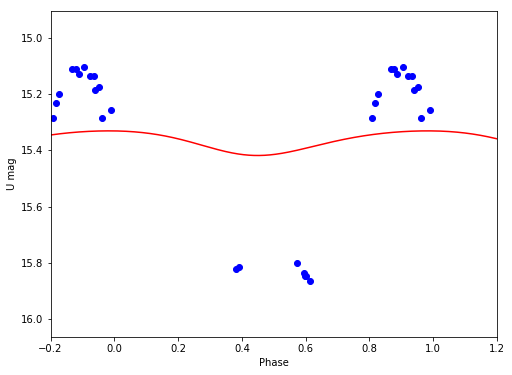

U 15.3677361863 0.087703837628


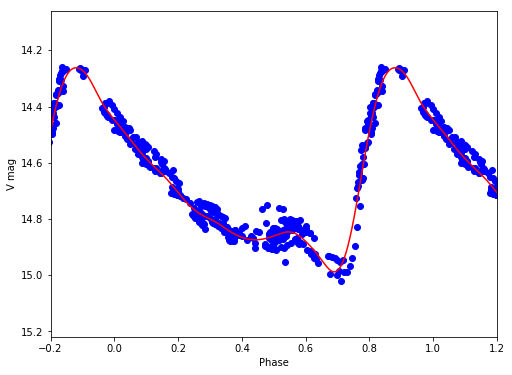

V 14.6659492386 0.725738723186
V25
/Volumes/Annie/CRRP/NGC3201/lcvs/V25.phased


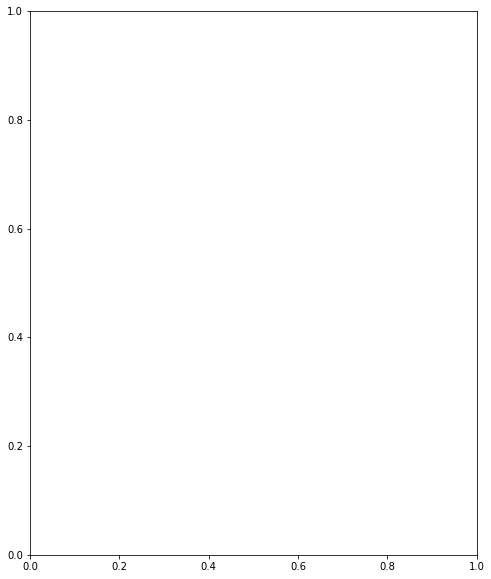

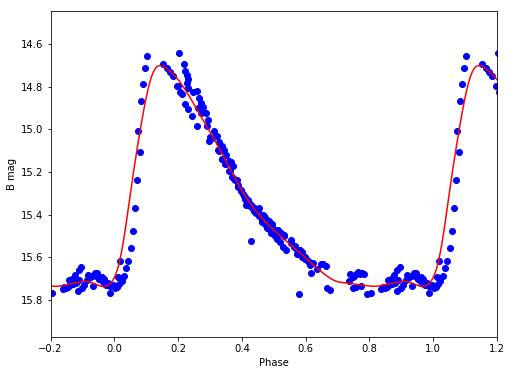

B 15.3220642693 1.03526636492


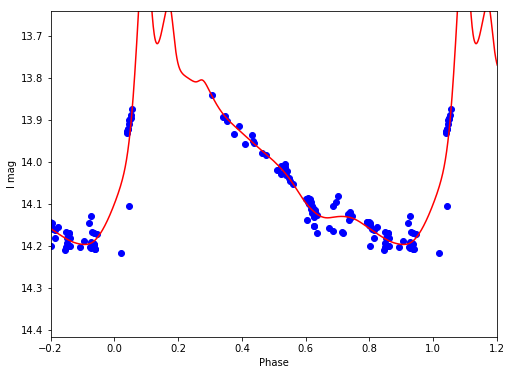

I 13.964869685 0.750111154548


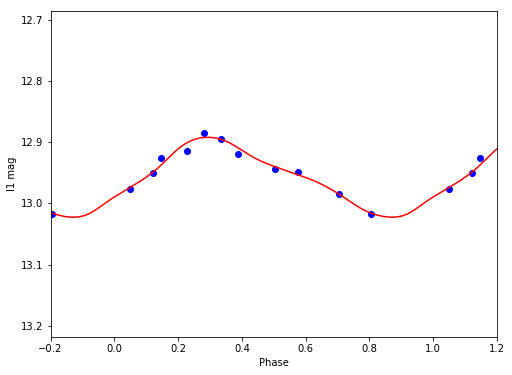

I1 12.9570813262 0.130554859344


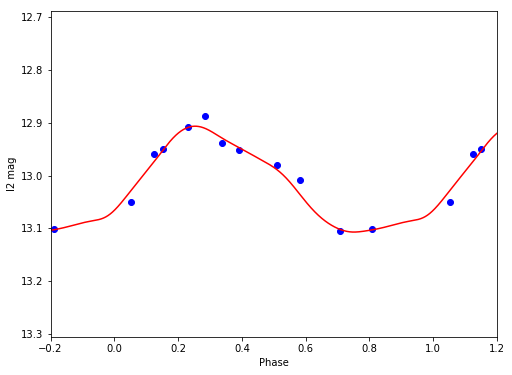

I2 13.014761685 0.200275127417


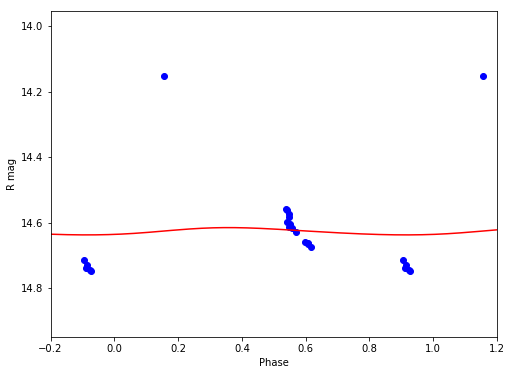

R 14.6265224082 0.0222442813562


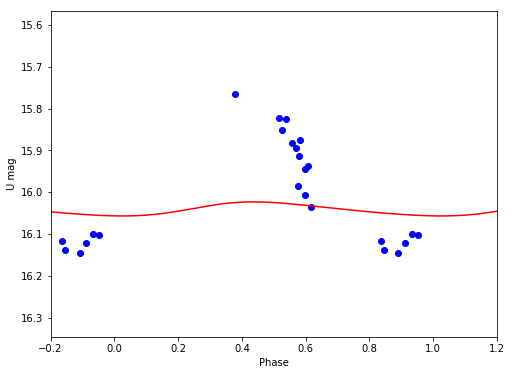

U 16.0403453878 0.0336049419984


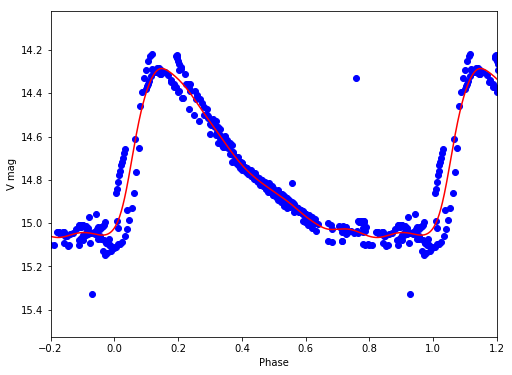

V 14.7629292988 0.780682810097
V26
/Volumes/Annie/CRRP/NGC3201/lcvs/V26.phased


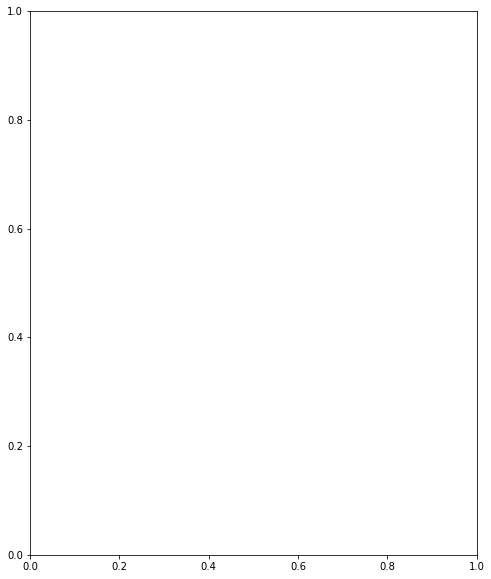

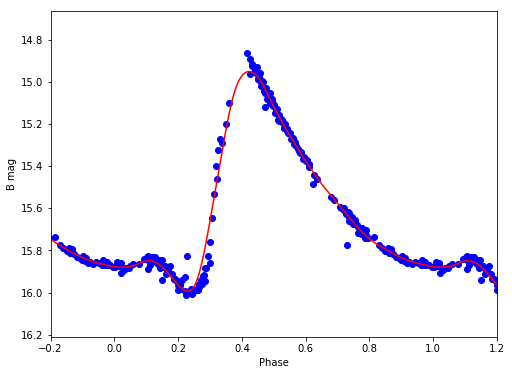

B 15.5463847774 1.04318208829


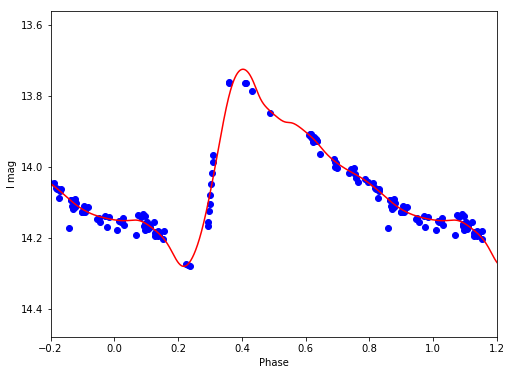

I 14.0174613522 0.554749508479


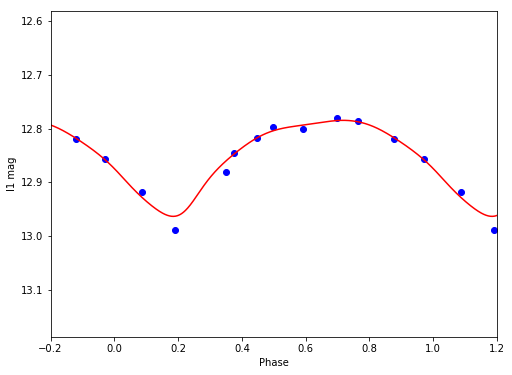

I1 12.8482424356 0.179007750173


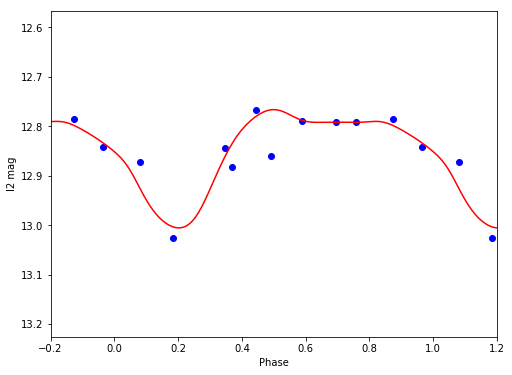

I2 12.8452468342 0.238901068167


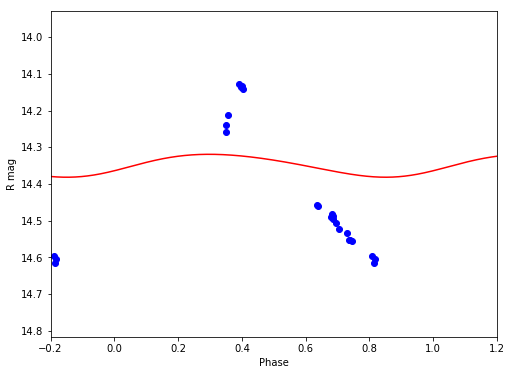

R 14.3482017231 0.0623906699091


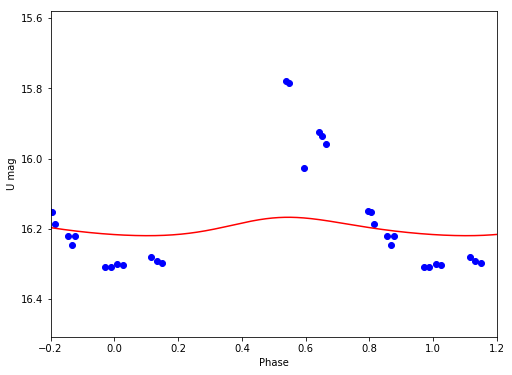

U 16.1963367184 0.0524789347581


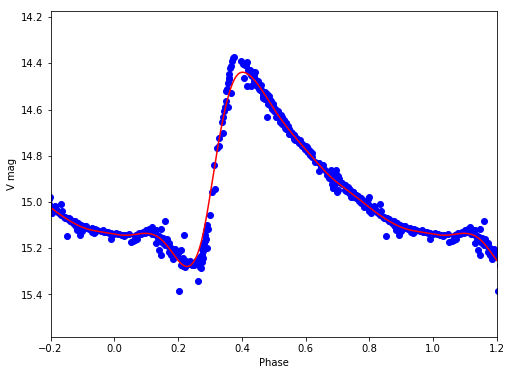

V 14.9049459804 0.840306834255
V27
/Volumes/Annie/CRRP/NGC3201/lcvs/V27.phased


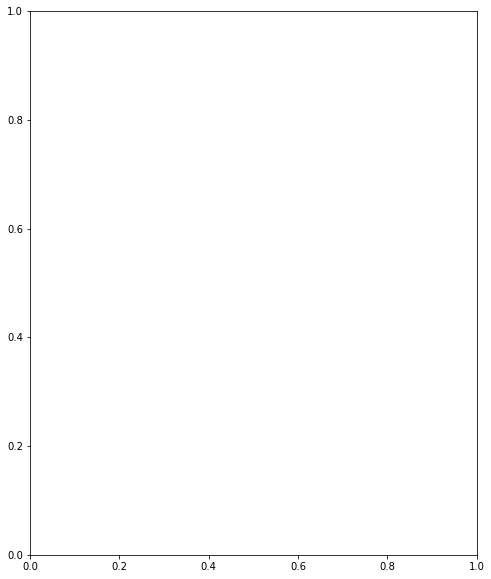

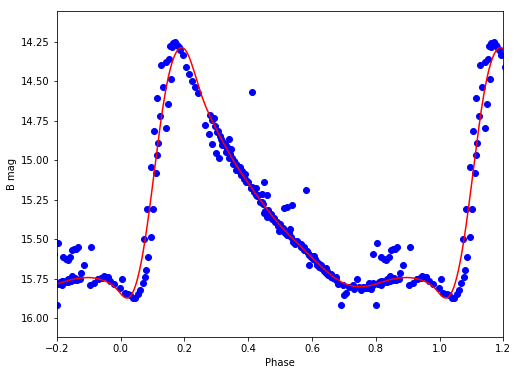

B 15.2393962502 1.58594849219


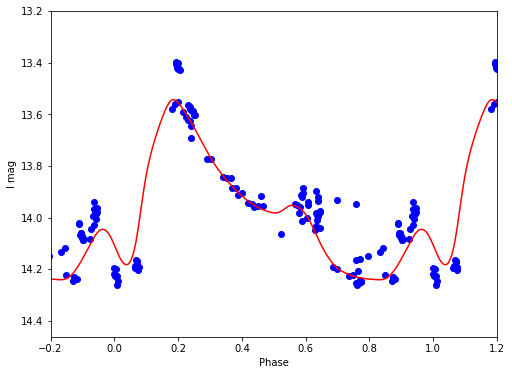

I 13.9583622501 0.698949643913


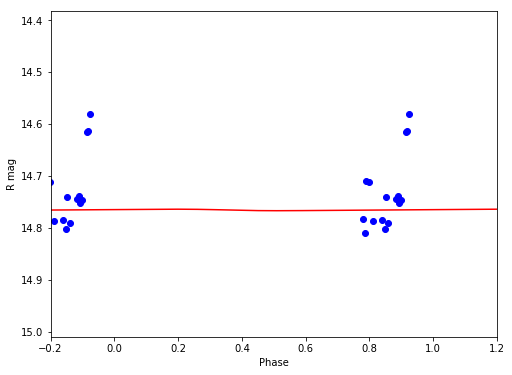

R 14.7653446523 0.00291812009144


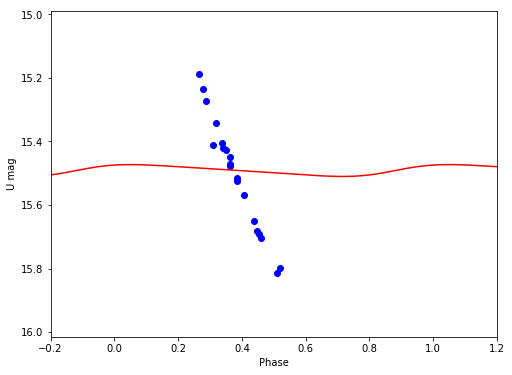

U 15.4910653138 0.0373765101183


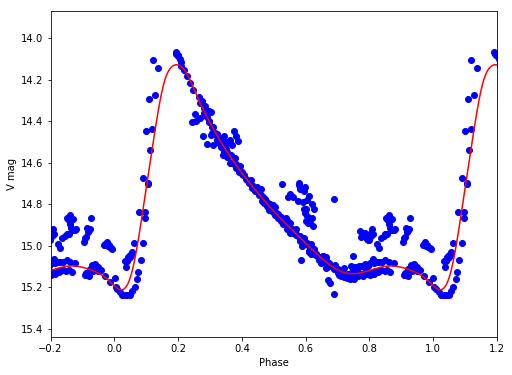

V 14.7703692788 1.08619059901
V28
/Volumes/Annie/CRRP/NGC3201/lcvs/V28.phased


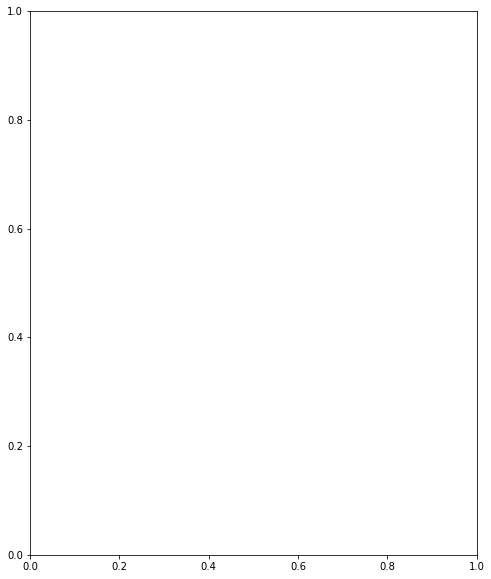

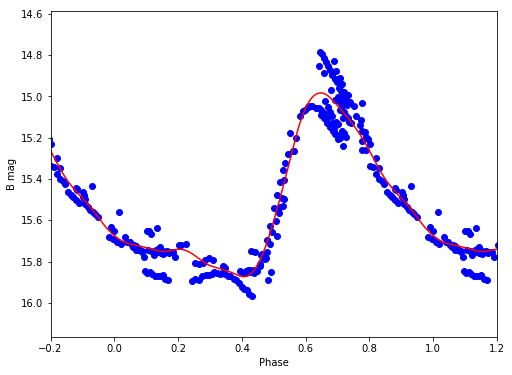

B 15.4898410637 0.890776451147


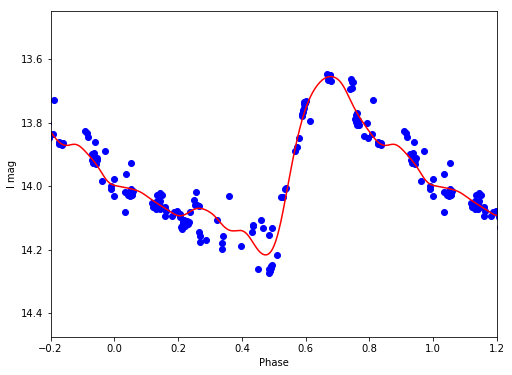

I 13.9540025226 0.561662165138


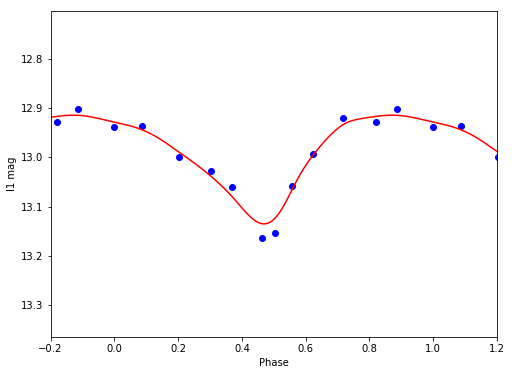

I1 12.9901008561 0.220262007005


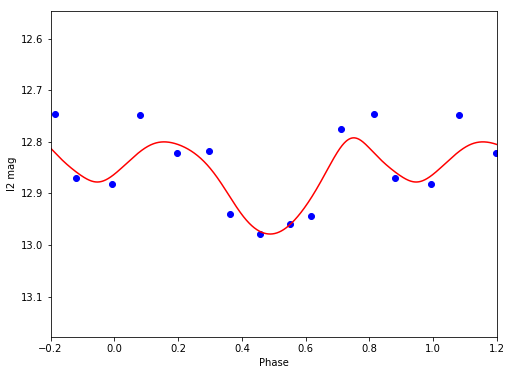

I2 12.8658037009 0.186418218217


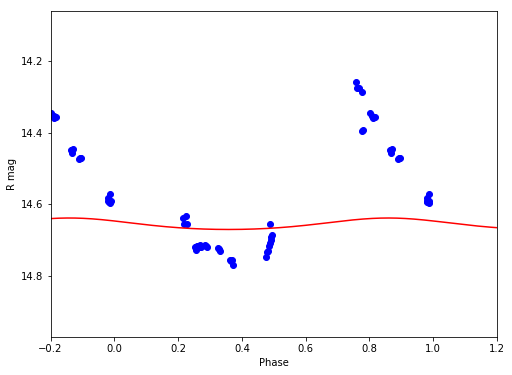

R 14.6565908588 0.0320508937805


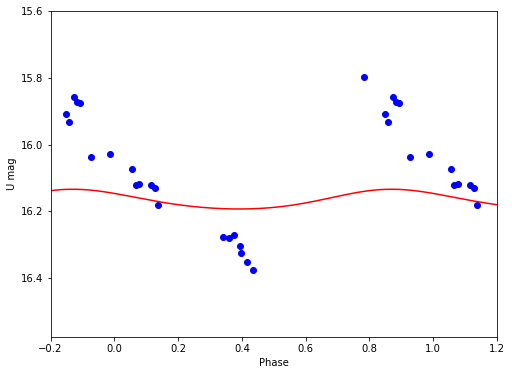

U 16.166580358 0.0592386675377


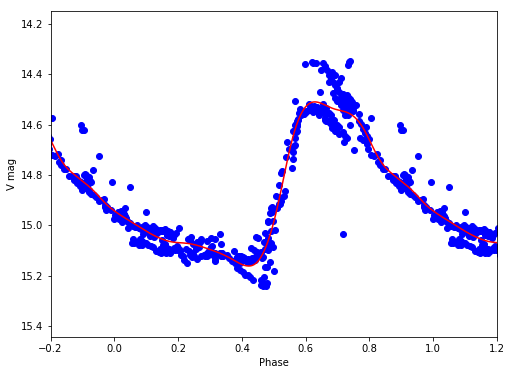

V 14.8593357276 0.652224173336
V29
/Volumes/Annie/CRRP/NGC3201/lcvs/V29.phased


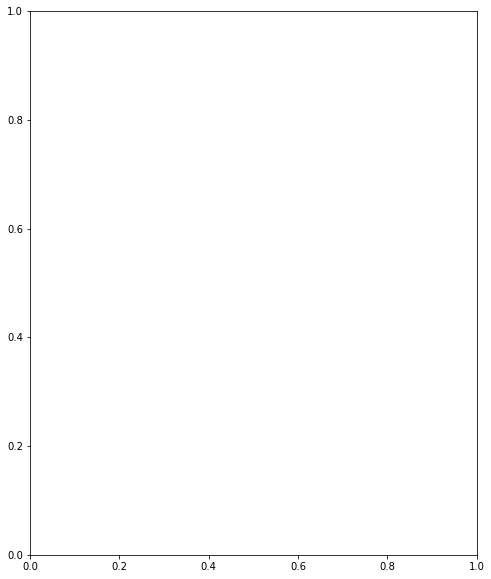

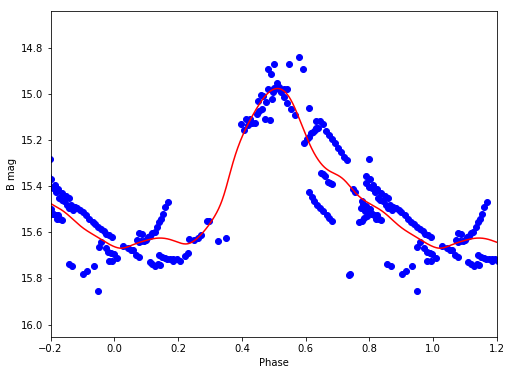

B 15.4019509063 0.691778279983


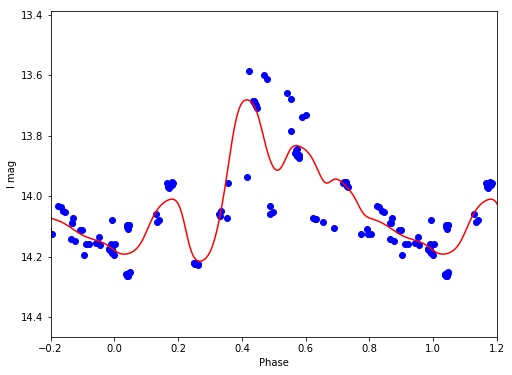

I 14.0011006472 0.533699506502


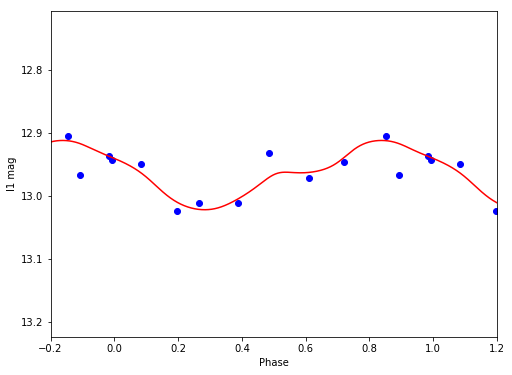

I1 12.9645353739 0.110215368984


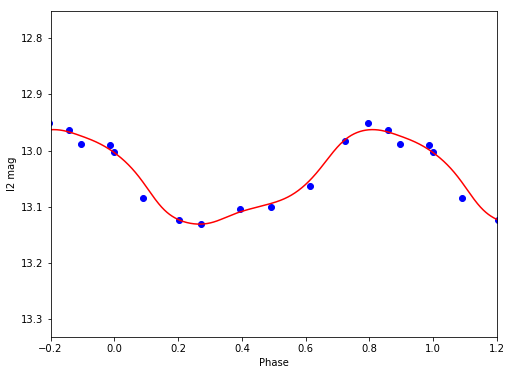

I2 13.0493756021 0.168058721259


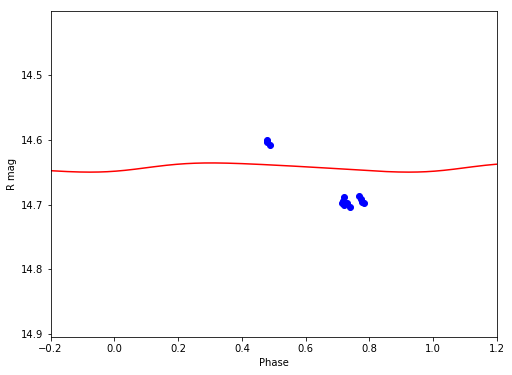

R 14.6426053607 0.0141553142915


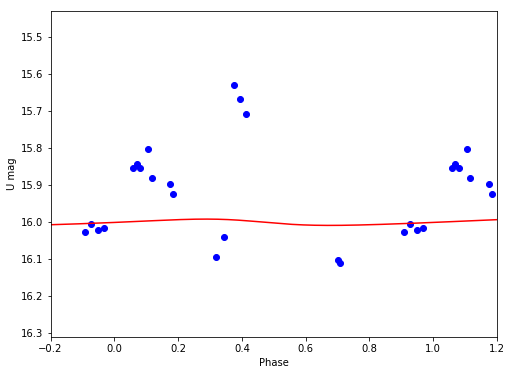

U 16.0011078163 0.01703846118


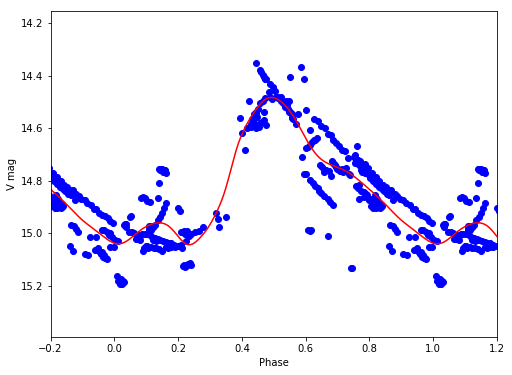

V 14.8121763114 0.560209638061
V30
/Volumes/Annie/CRRP/NGC3201/lcvs/V30.phased


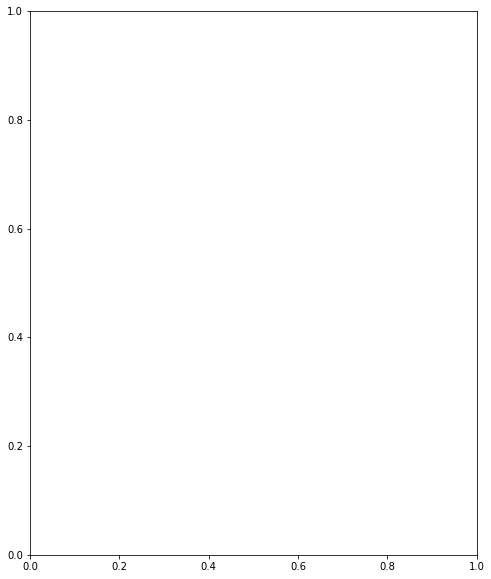

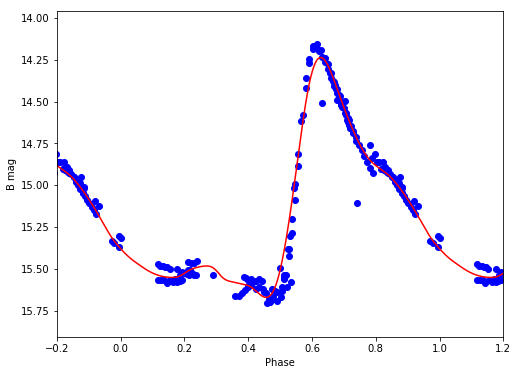

B 15.0944105262 1.43188616889


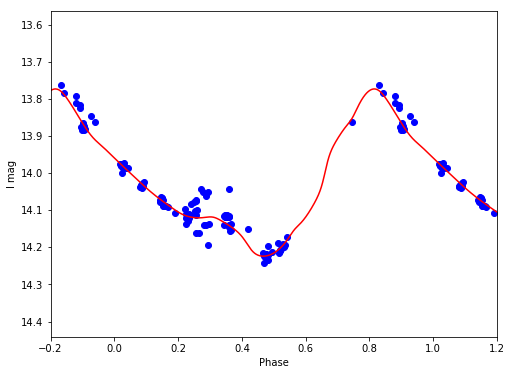

I 14.0205436202 0.450676102259


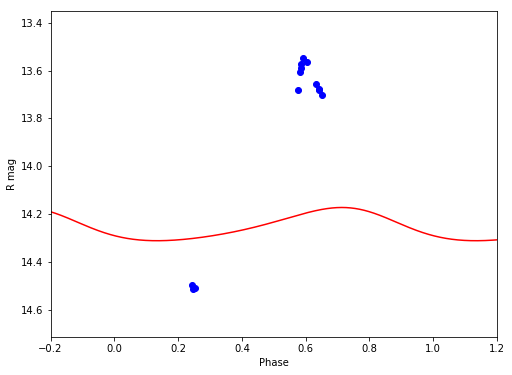

R 14.2496494373 0.139093982643


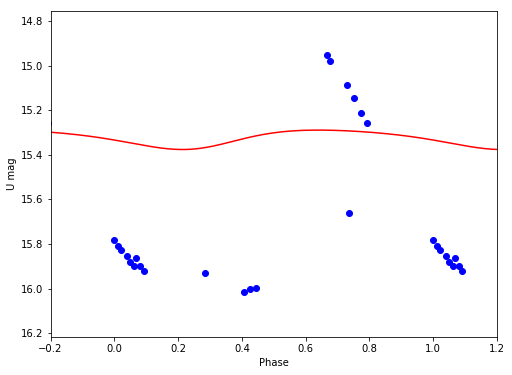

U 15.3254062272 0.0870315506536


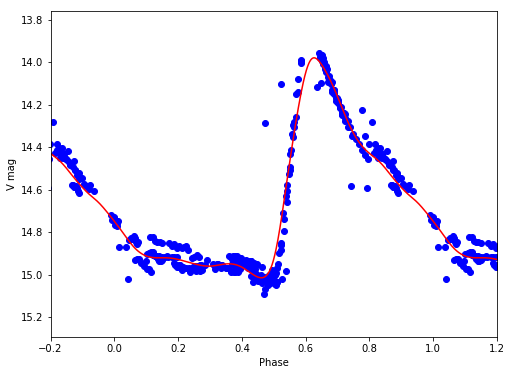

V 14.6152876666 1.03658871551
V31
/Volumes/Annie/CRRP/NGC3201/lcvs/V31.phased


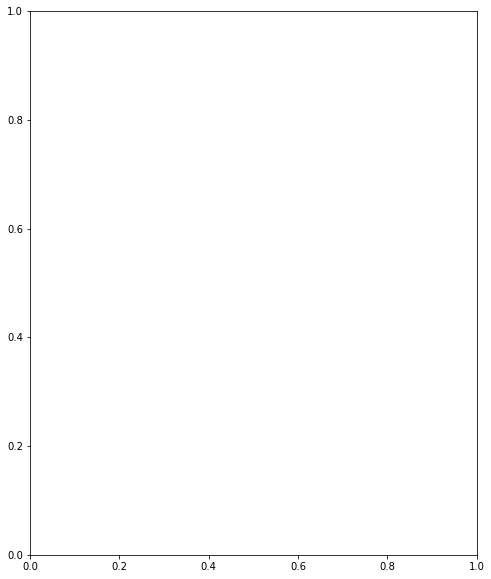

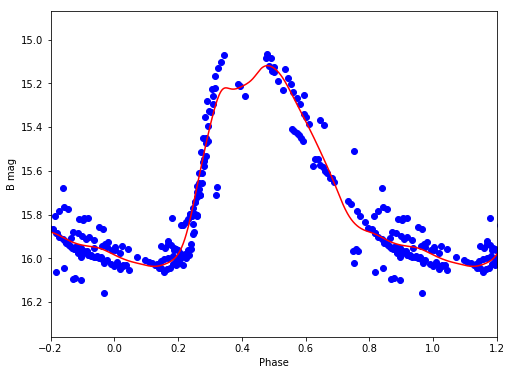

B 15.6086032637 0.917471578166


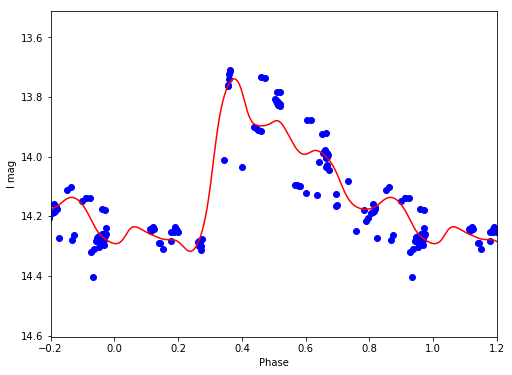

I 14.084873939 0.578110099646


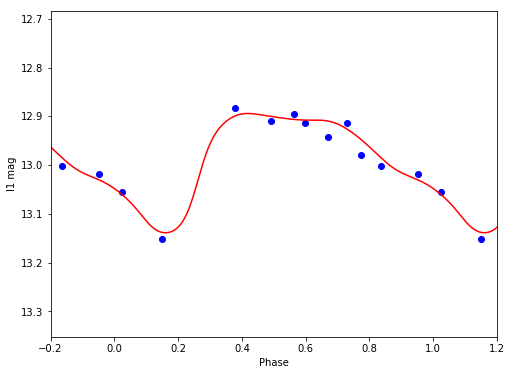

I1 12.9814375589 0.244630296077


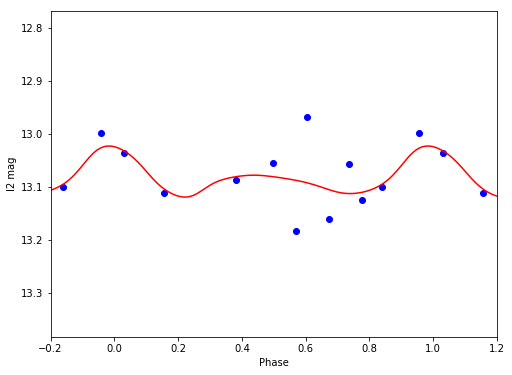

I2 13.0837099745 0.0962331959337


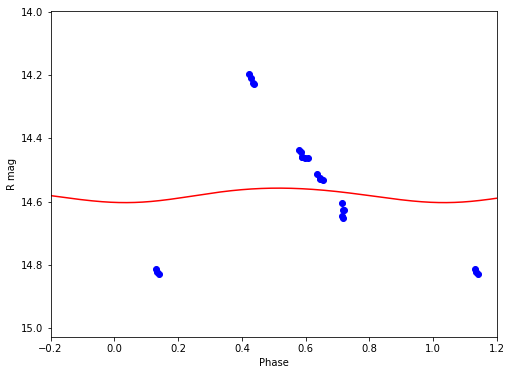

R 14.5790862989 0.0458058573341


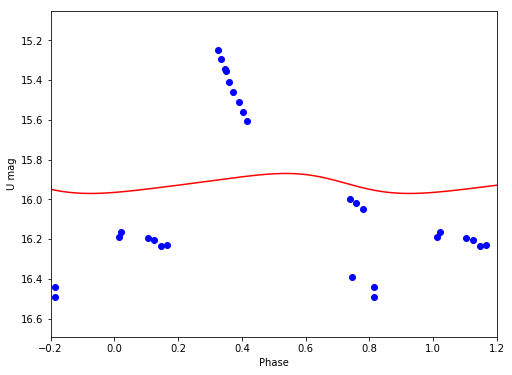

U 15.9199830366 0.100627016089


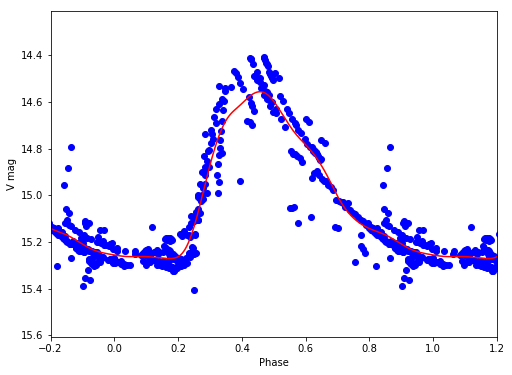

V 14.9680799108 0.715633122985
V32
/Volumes/Annie/CRRP/NGC3201/lcvs/V32.phased


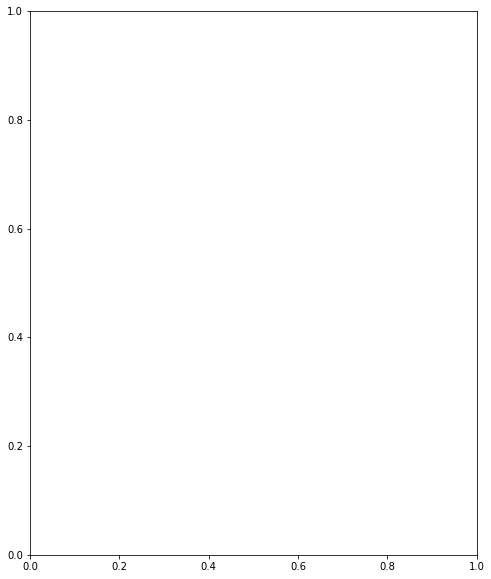

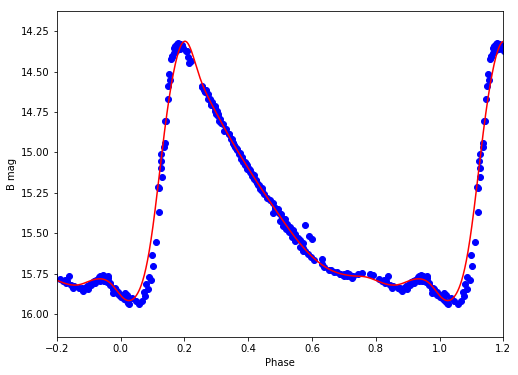

B 15.272252056 1.6045282826


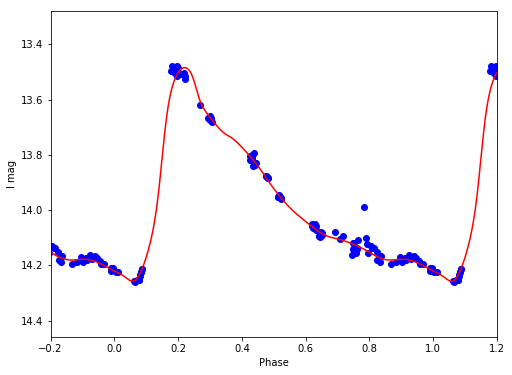

I 13.9478228283 0.773800506616


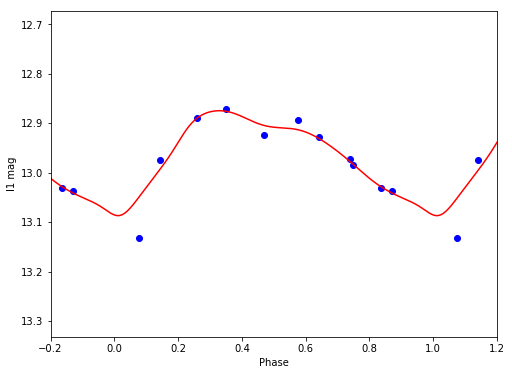

I1 12.9636220036 0.212302944797


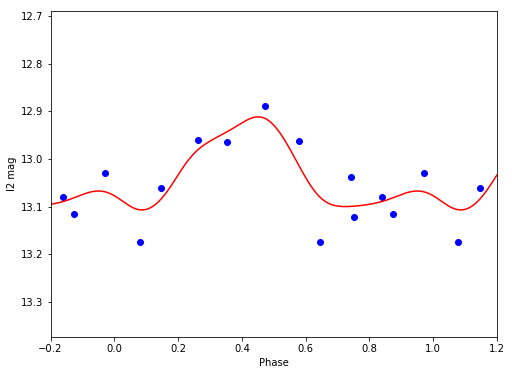

I2 13.0319611832 0.195774752349


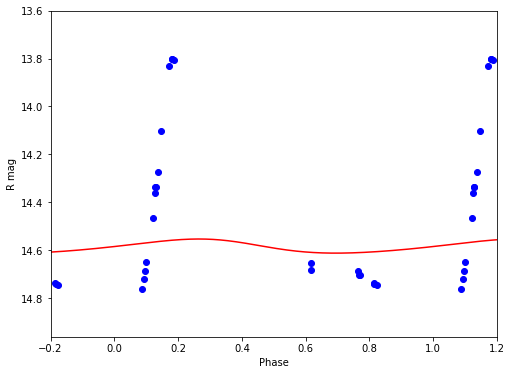

R 14.5851948269 0.0589750835151


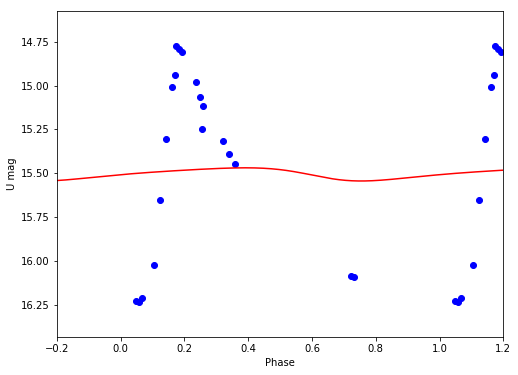

U 15.5013380711 0.0749632992467


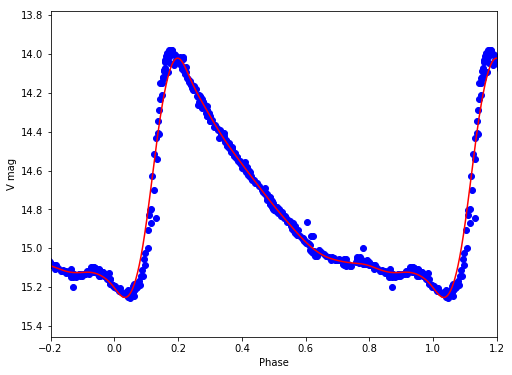

V 14.7349398754 1.23118468234
V34
/Volumes/Annie/CRRP/NGC3201/lcvs/V34.phased


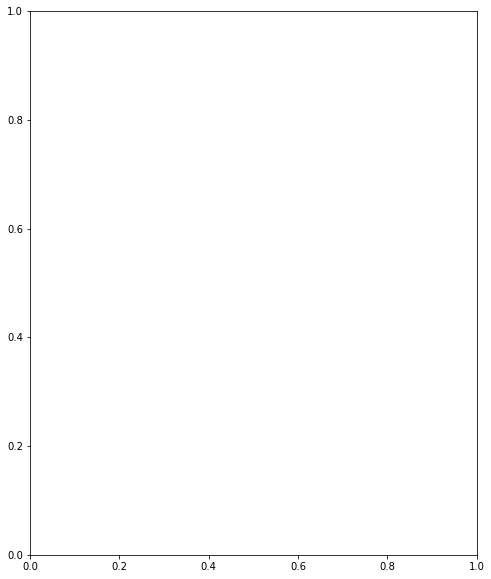

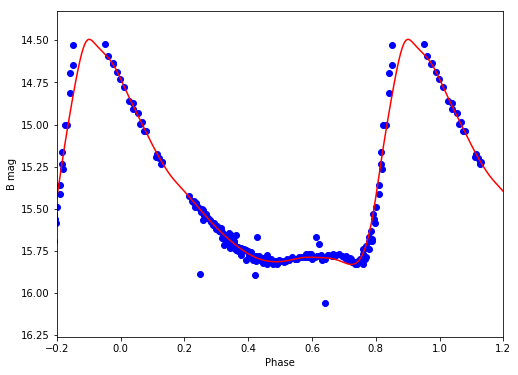

B 15.3003832397 1.33537231606


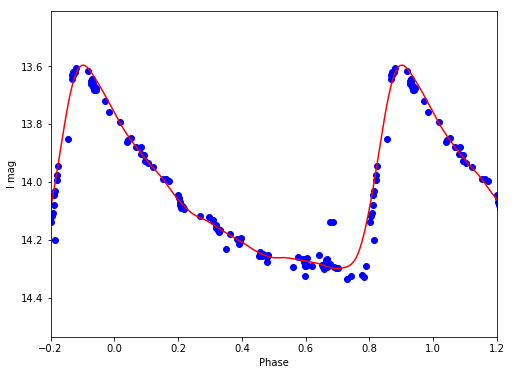

I 14.0374318644 0.703023435314


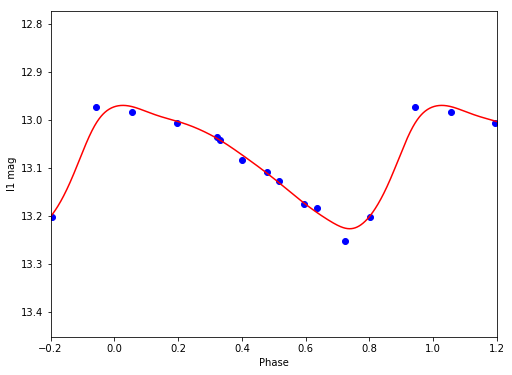

I1 13.081304744 0.256360842327


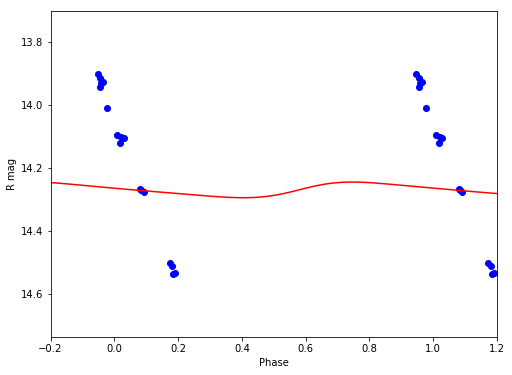

R 14.2692841119 0.0498157407189


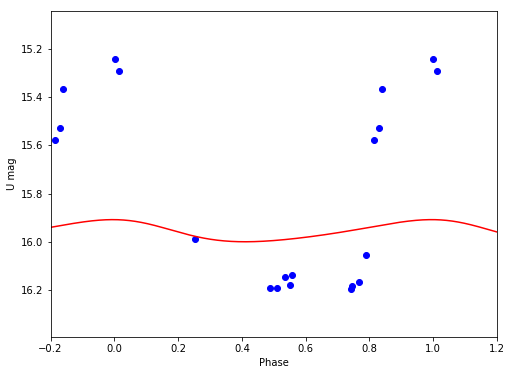

U 15.9574332352 0.091739531219


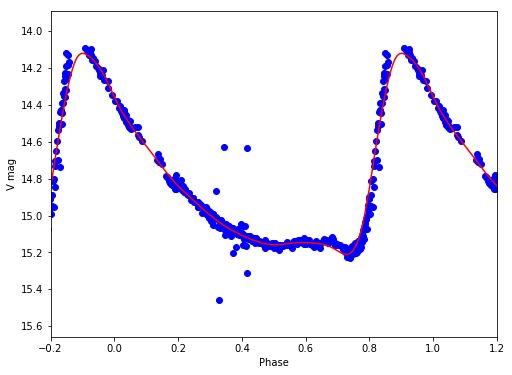

V 14.777404304 1.08958005958
V35
/Volumes/Annie/CRRP/NGC3201/lcvs/V35.phased


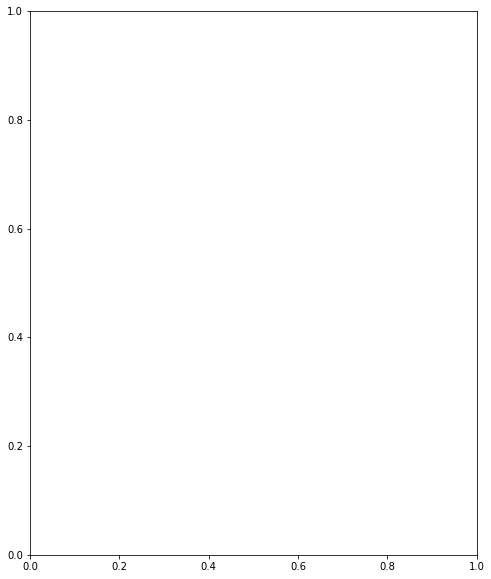

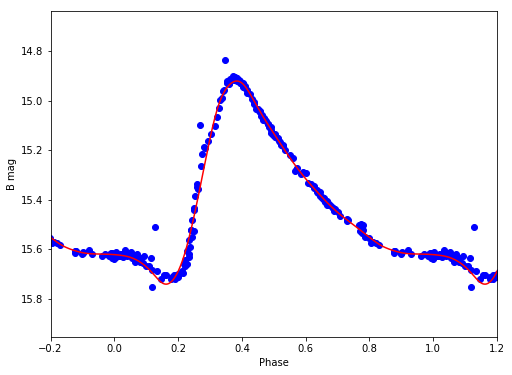

B 15.3827683709 0.820326220271


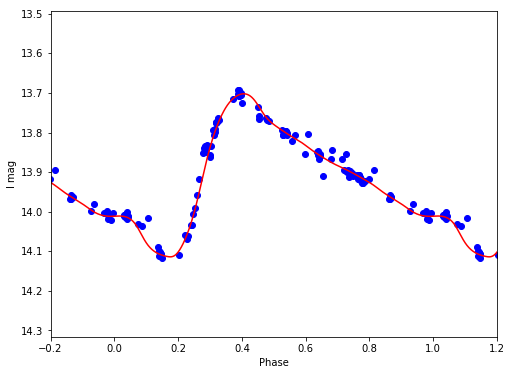

I 13.906260708 0.41195573347


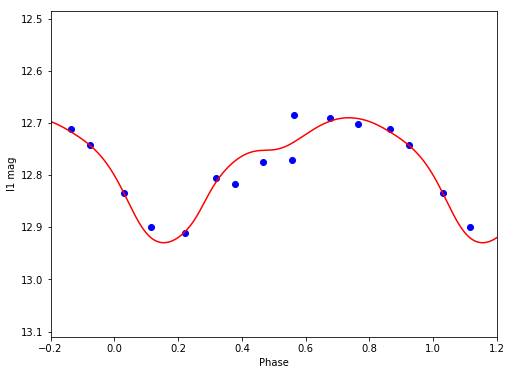

I1 12.7791218118 0.239814351014


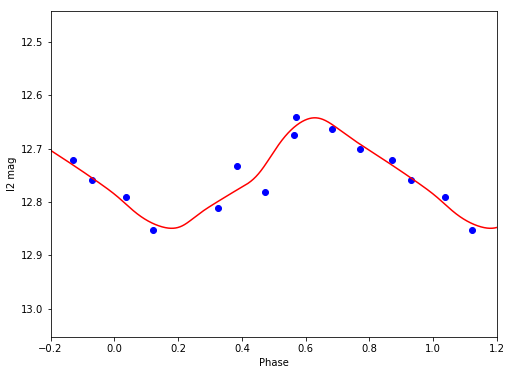

I2 12.7486176333 0.20734036279


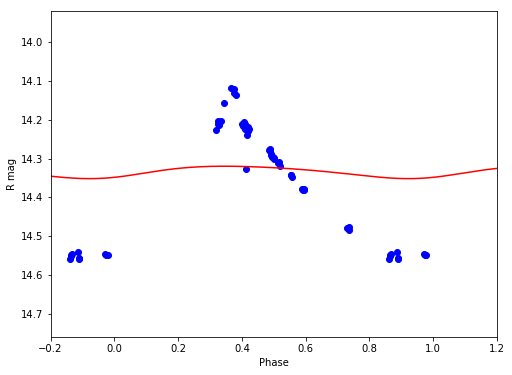

R 14.3335760292 0.0320683260635


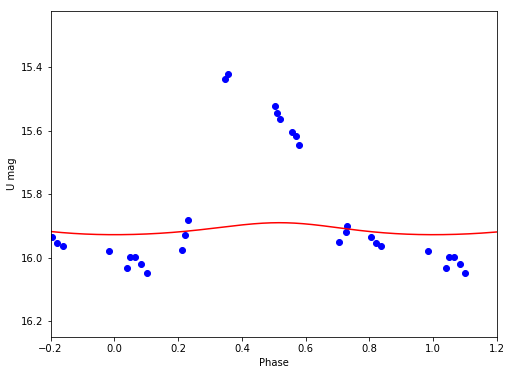

U 15.9103982207 0.0377787657068


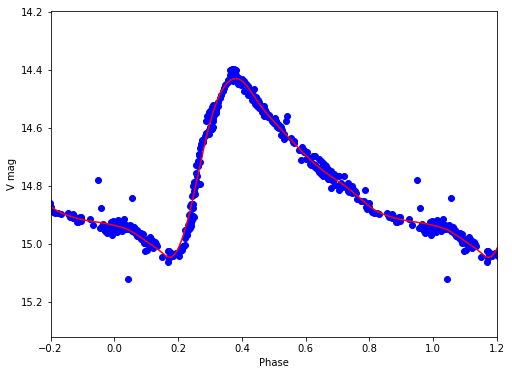

V 14.7635187045 0.614910193086
V36
/Volumes/Annie/CRRP/NGC3201/lcvs/V36.phased


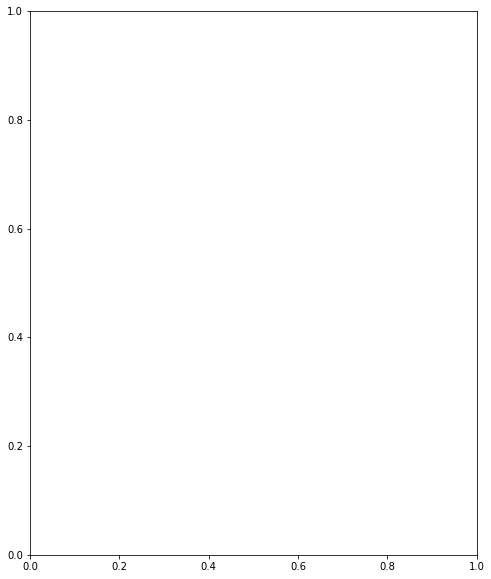

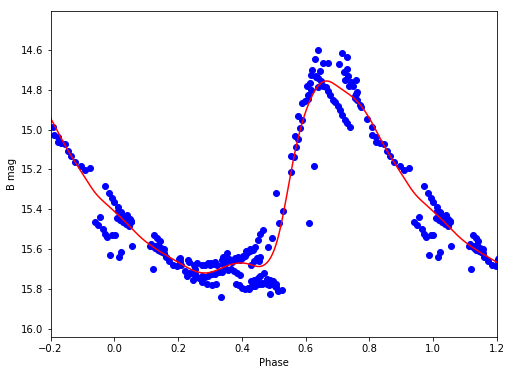

B 15.294096278 0.964261169458


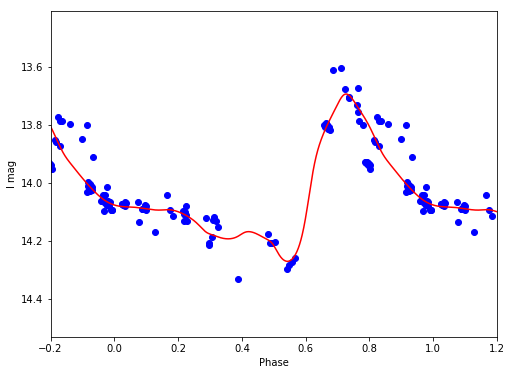

I 14.0343171381 0.57865526936


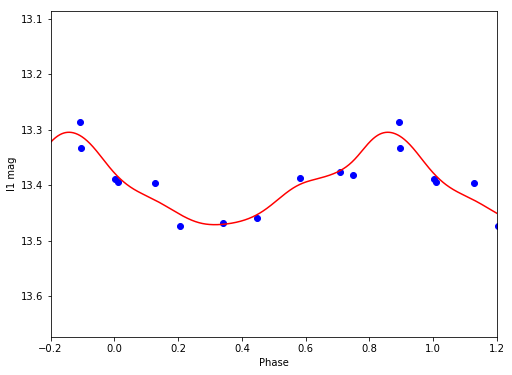

I1 13.400596276 0.166596516953


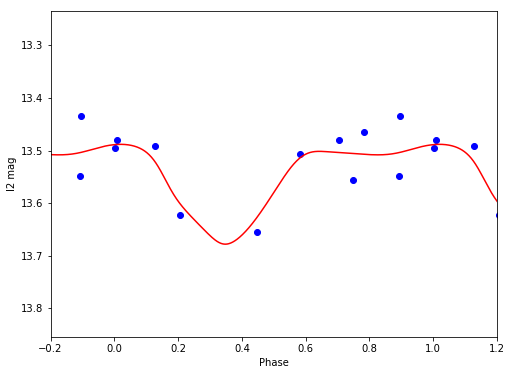

I2 13.5492707992 0.189772411355


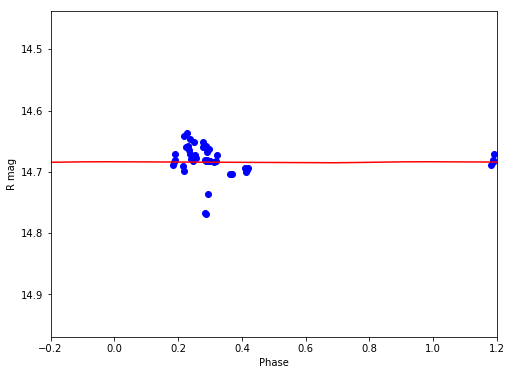

R 14.6843215623 0.00172243596474


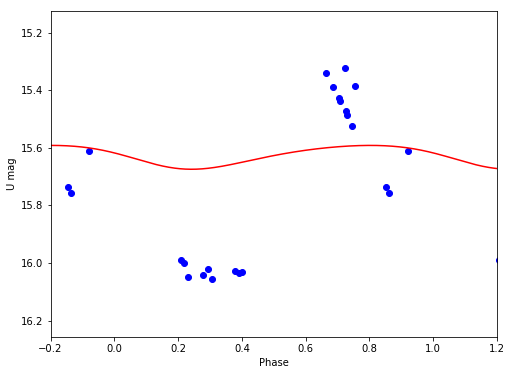

U 15.6276895986 0.0827547406549


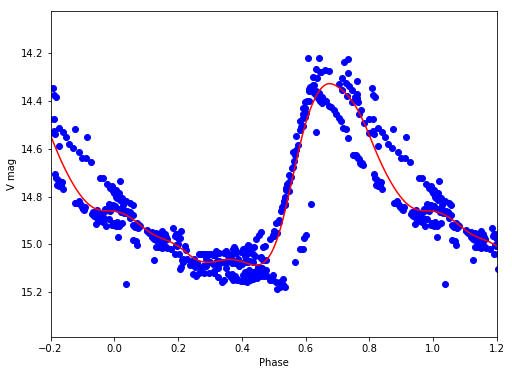

V 14.7850172888 0.76125669151
V37
/Volumes/Annie/CRRP/NGC3201/lcvs/V37.phased


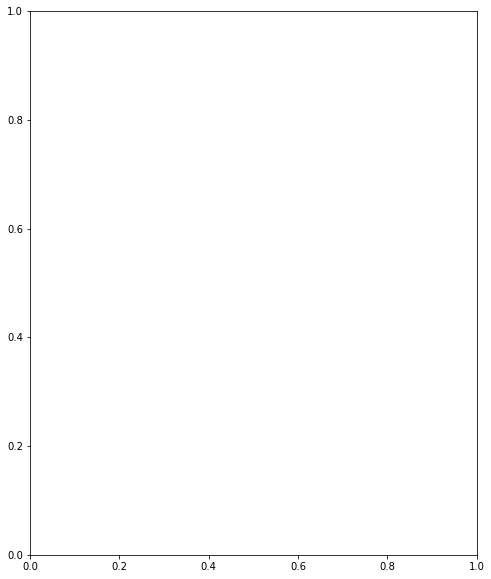

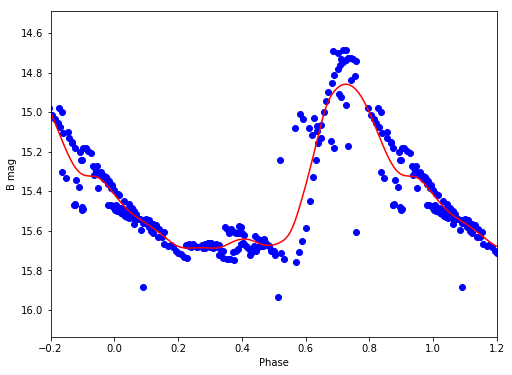

B 15.3838543343 0.828388521595


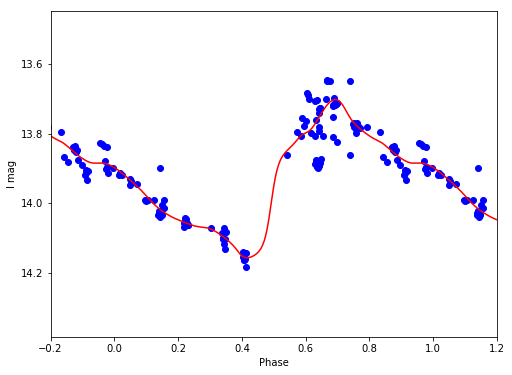

I 13.9230457127 0.454591272369


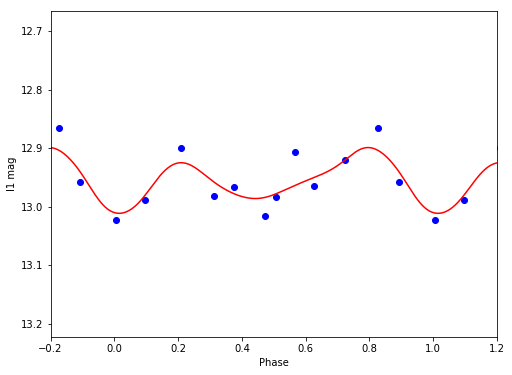

I1 12.9553007128 0.112301549762


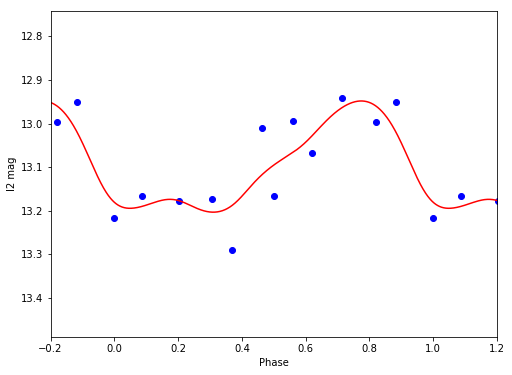

I2 13.0980417065 0.255038660184


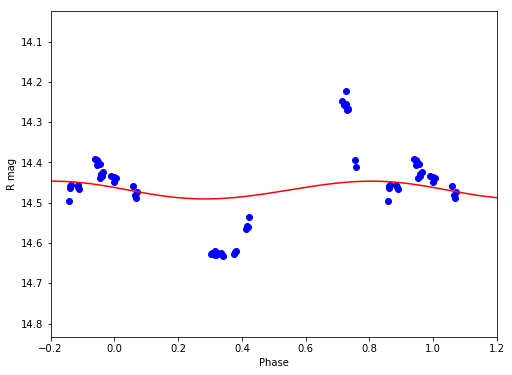

R 14.4685631393 0.0441233886466


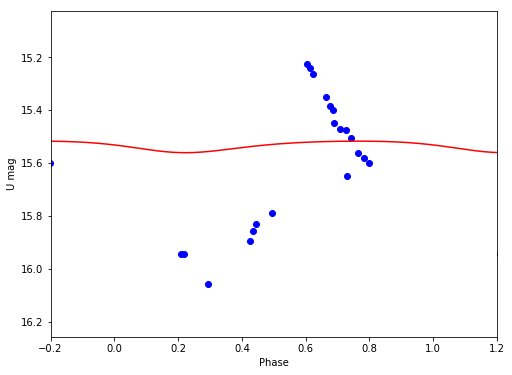

U 15.5334762426 0.0436672492255


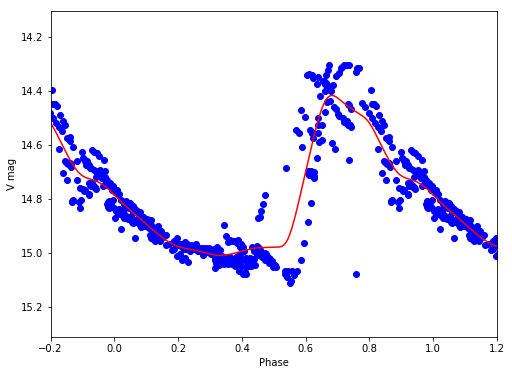

V 14.779633409 0.592074507764
V38
/Volumes/Annie/CRRP/NGC3201/lcvs/V38.phased


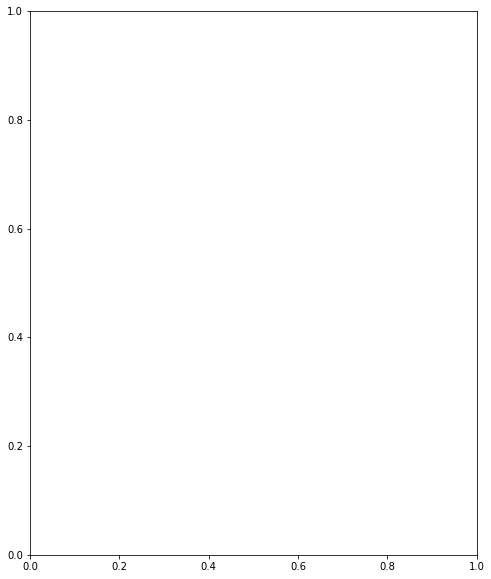

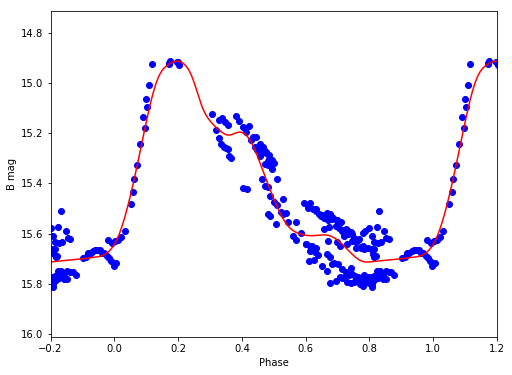

B 15.3819006453 0.799655906313


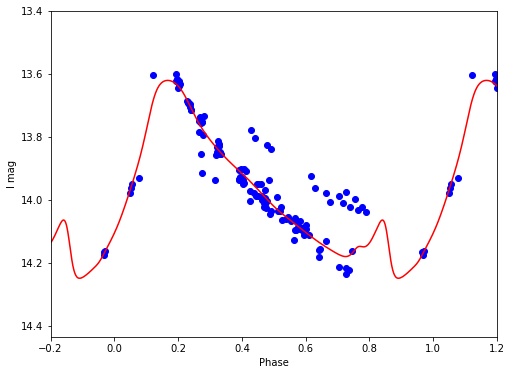

I 13.9718105905 0.62788576959


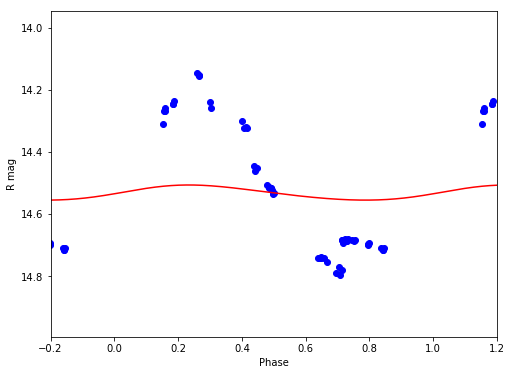

R 14.5311079764 0.0486604127713


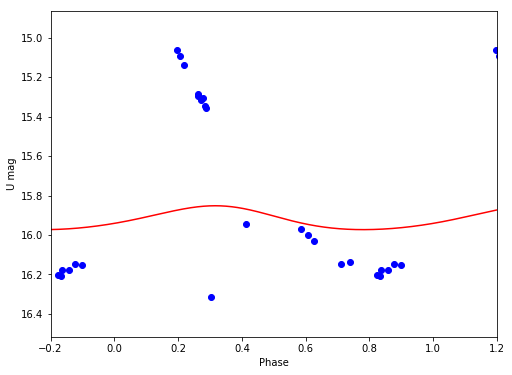

U 15.9179116693 0.121064571541


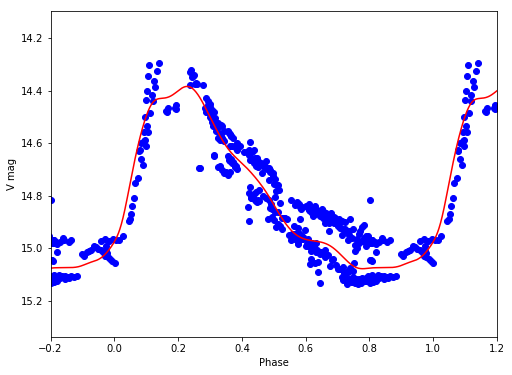

V 14.7721923428 0.693023514134
V39
/Volumes/Annie/CRRP/NGC3201/lcvs/V39.phased


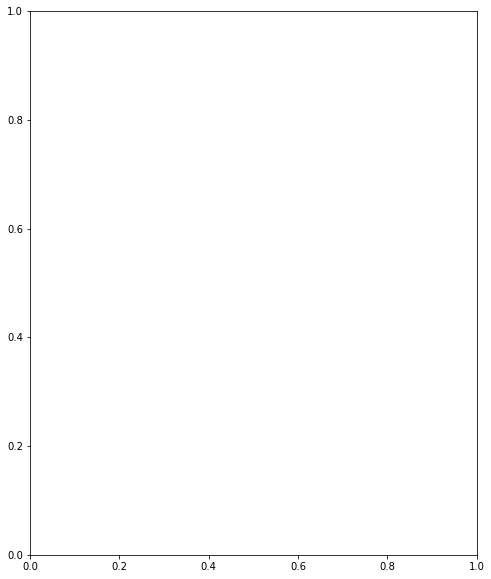

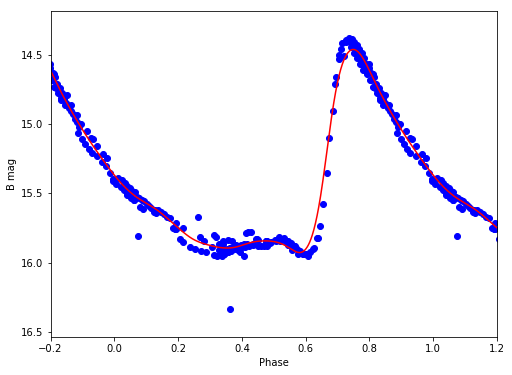

B 15.3445156421 1.46818483685


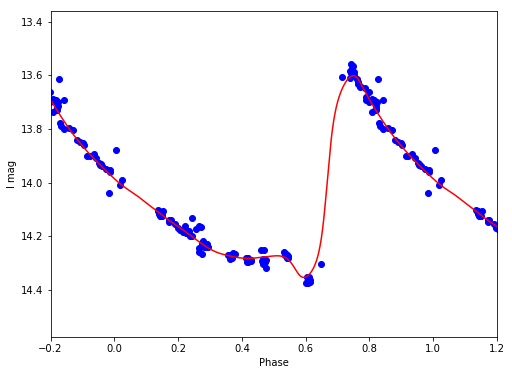

I 14.0418905732 0.751756091994


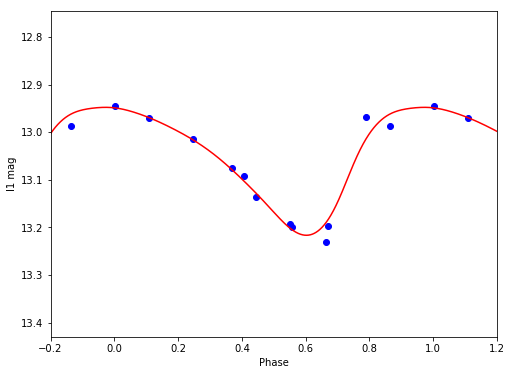

I1 13.0498570347 0.269074216717


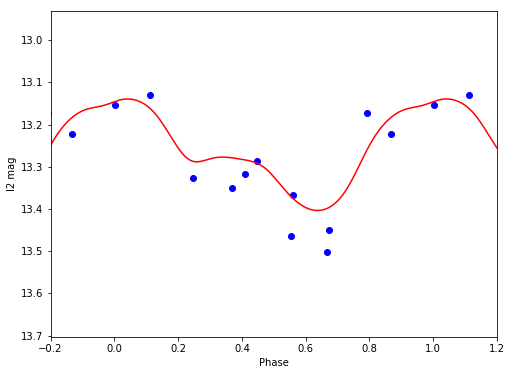

I2 13.2606814242 0.264345920903


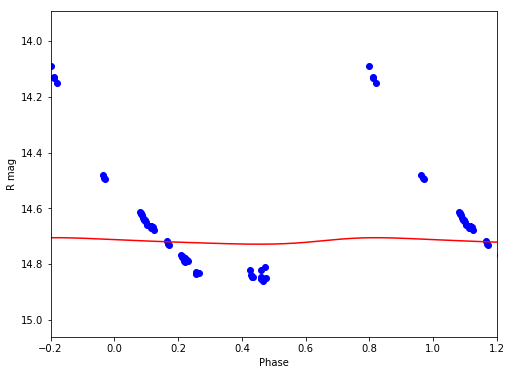

R 14.717219764 0.0232611785988


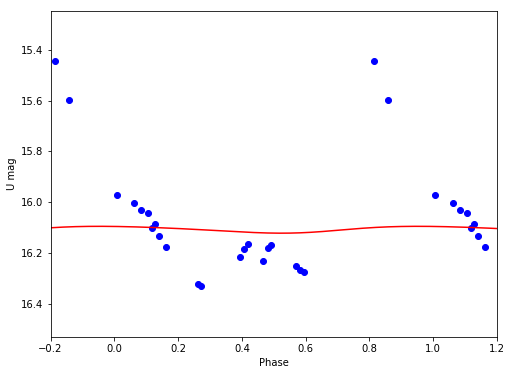

U 16.1074073873 0.0269638018488


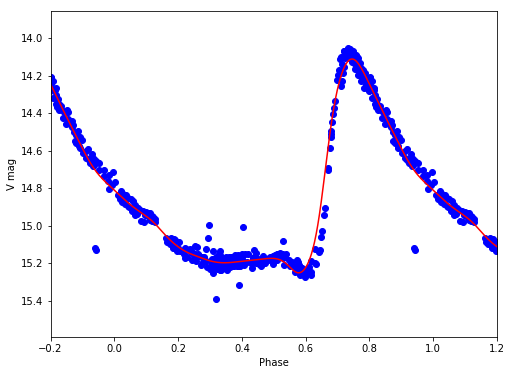

V 14.8130164302 1.13996501608
V40
/Volumes/Annie/CRRP/NGC3201/lcvs/V40.phased


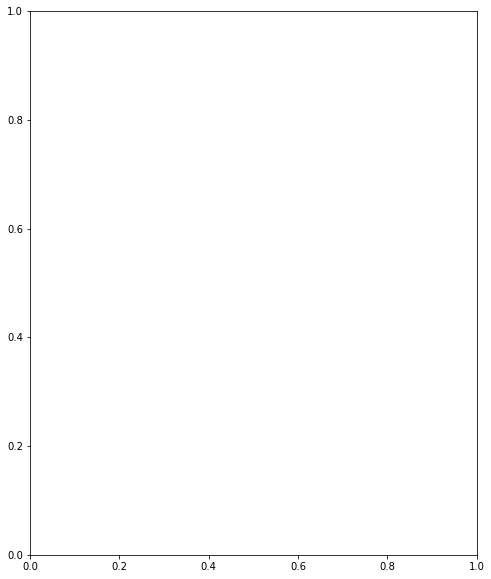

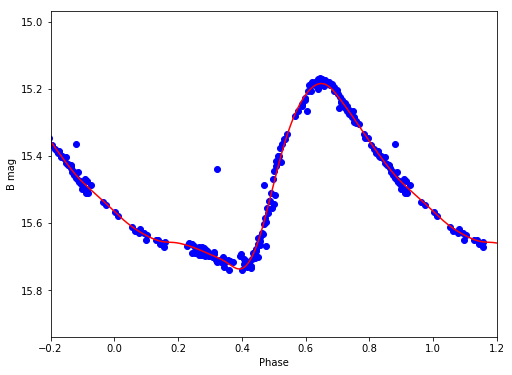

B 15.4880013936 0.552648657097


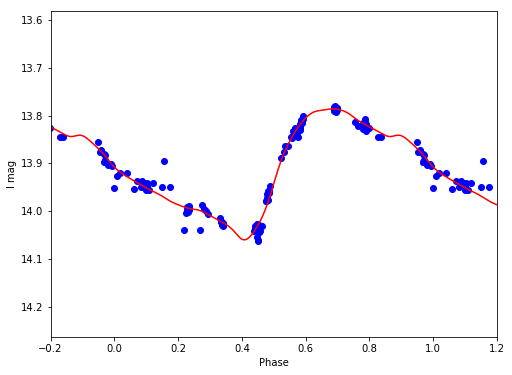

I 13.9074544577 0.273231760807


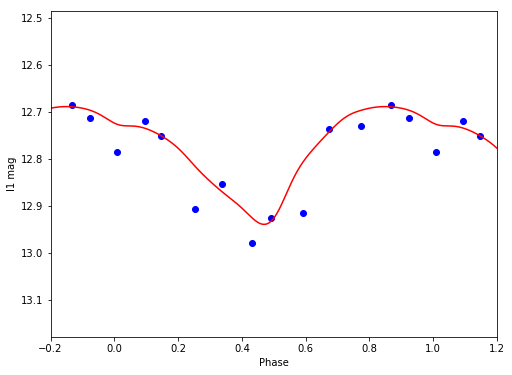

I1 12.7796344221 0.25059138386


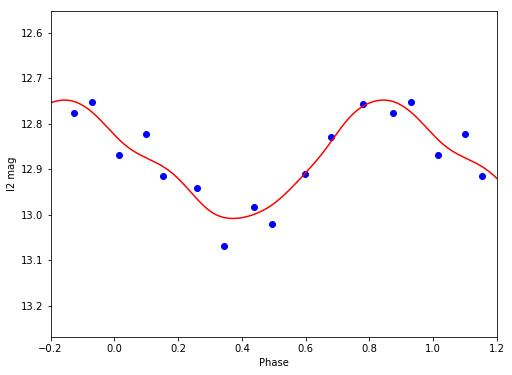

I2 12.8800610048 0.259835524376


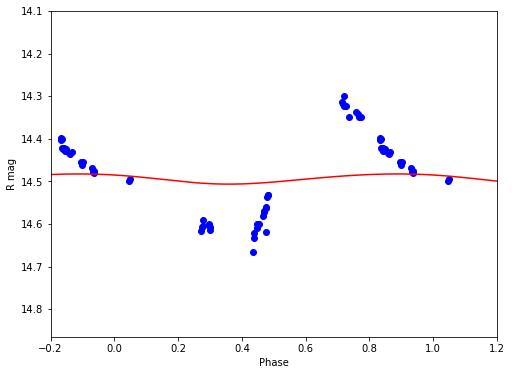

R 14.4937662951 0.0238923069187


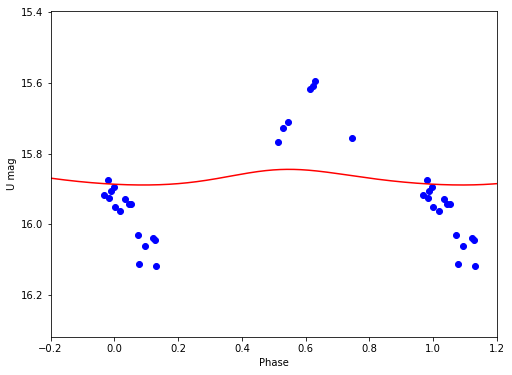

U 15.8685463283 0.044245815155


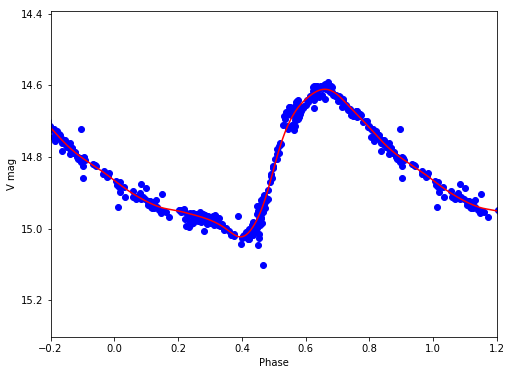

V 14.8276984803 0.411749483935
V41
/Volumes/Annie/CRRP/NGC3201/lcvs/V41.phased


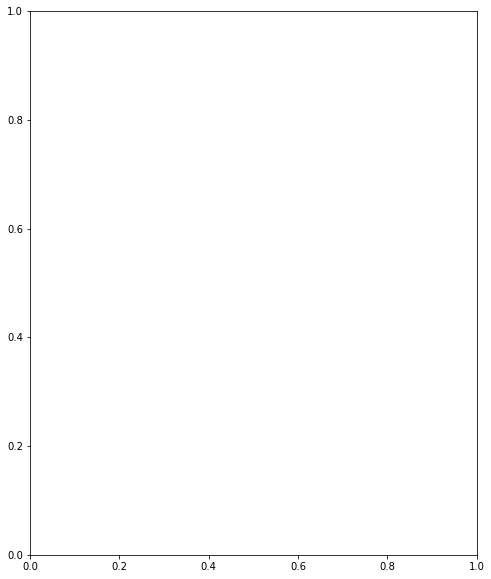

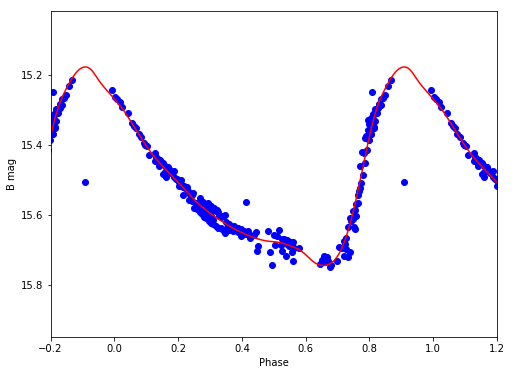

B 15.4937136196 0.568460538744


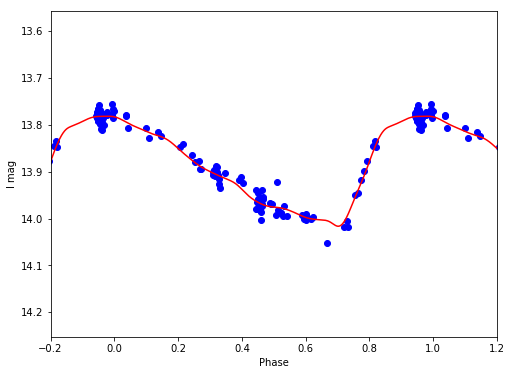

I 13.8906850825 0.234382414649


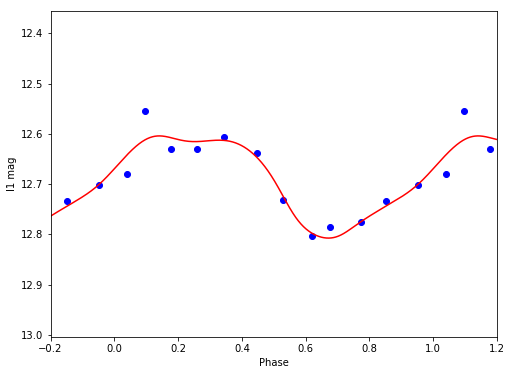

I1 12.6879581374 0.203320721454


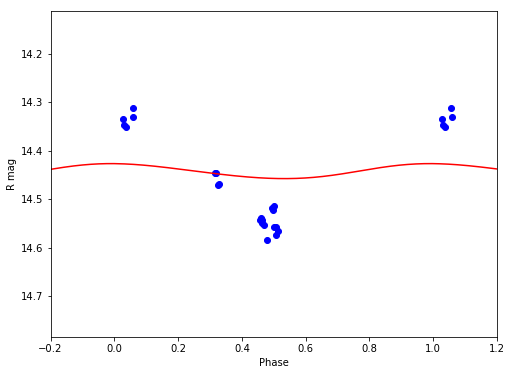

R 14.4423983424 0.0309482148776


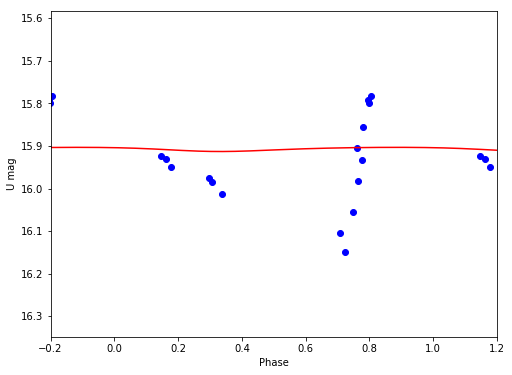

U 15.9070872905 0.00977600549306


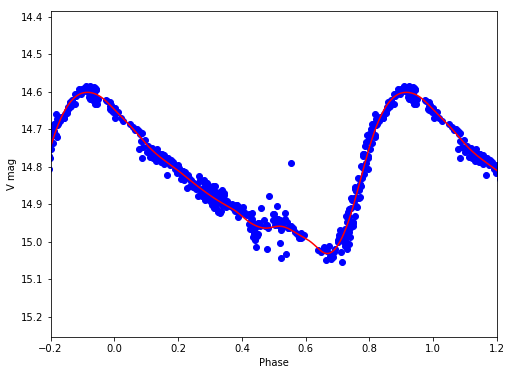

V 14.8231108336 0.429474162274
V42
/Volumes/Annie/CRRP/NGC3201/lcvs/V42.phased


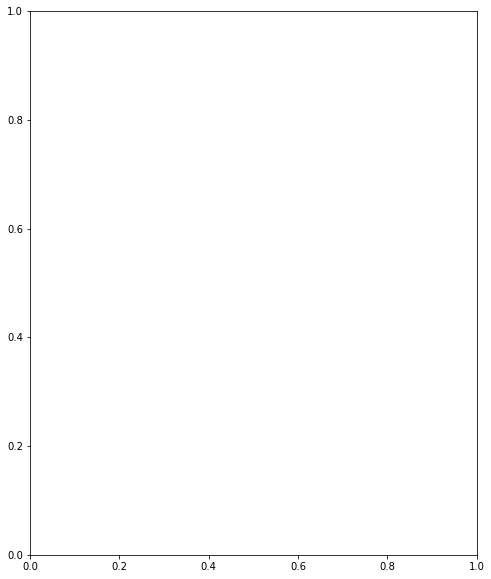

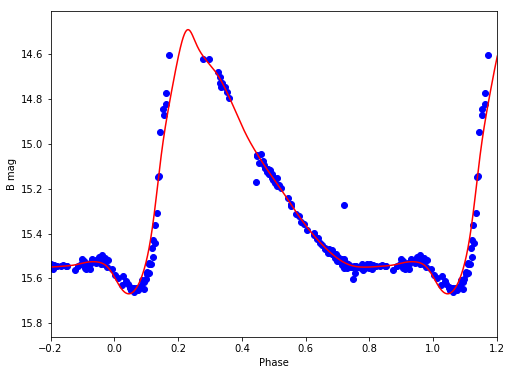

B 15.1733662736 1.17926284895


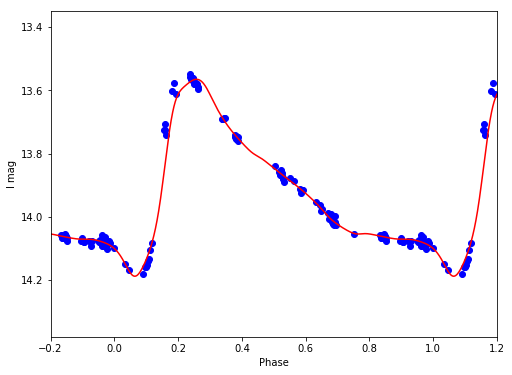

I 13.902496152 0.624401995168


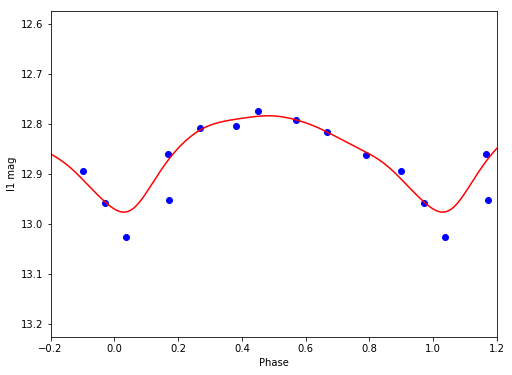

I1 12.850831486 0.192899727699


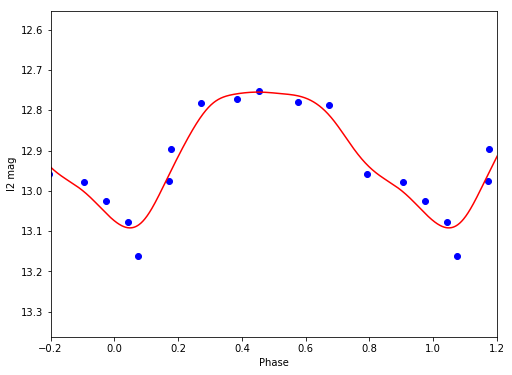

I2 12.884224614 0.336812601233


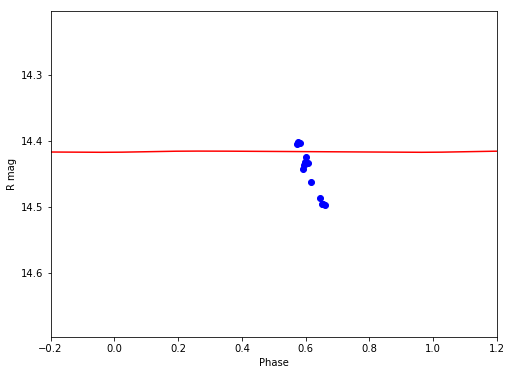

R 14.4160189851 0.00182551061624


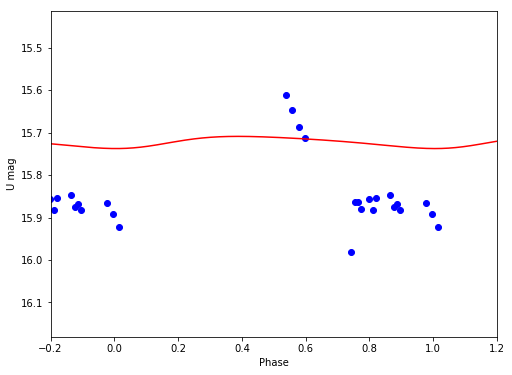

U 15.7211528622 0.0287213124558


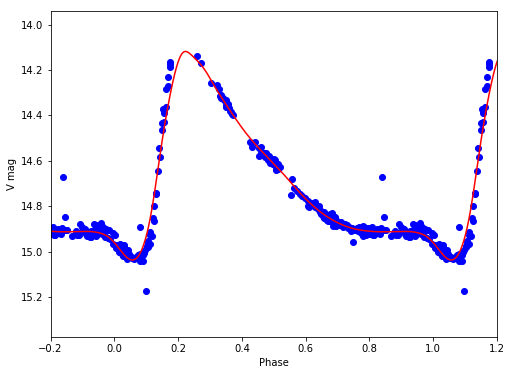

V 14.6449289472 0.91946557294
V43
/Volumes/Annie/CRRP/NGC3201/lcvs/V43.phased


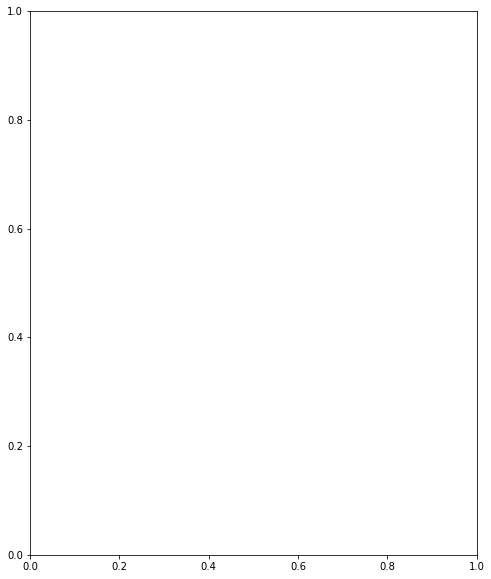

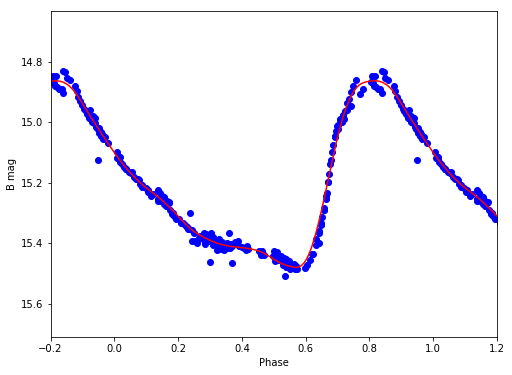

B 15.1979639759 0.615212576914


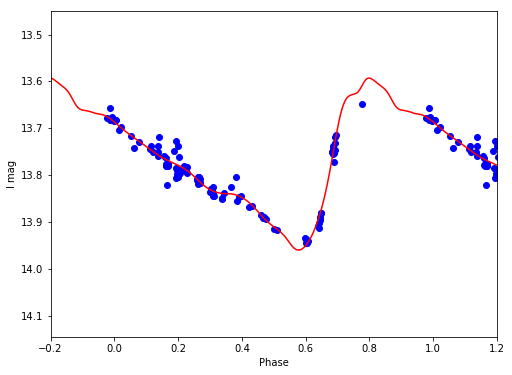

I 13.7660225778 0.366981762387


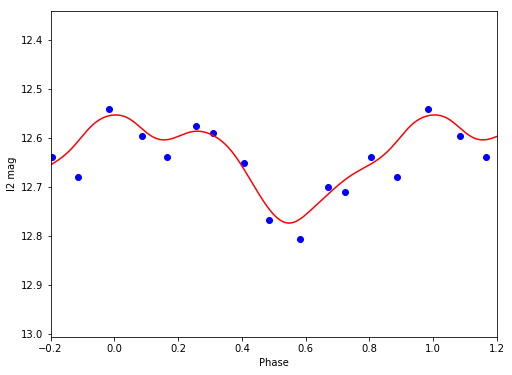

I2 12.6421978878 0.220470777491


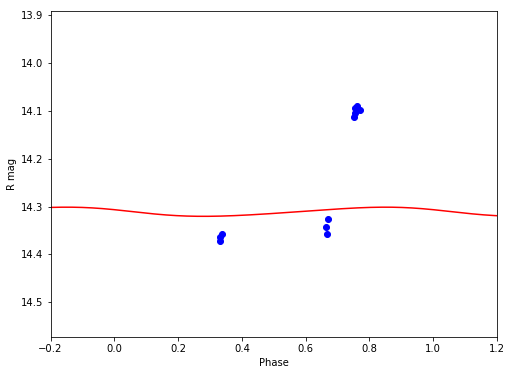

R 14.3111078869 0.0191338353172


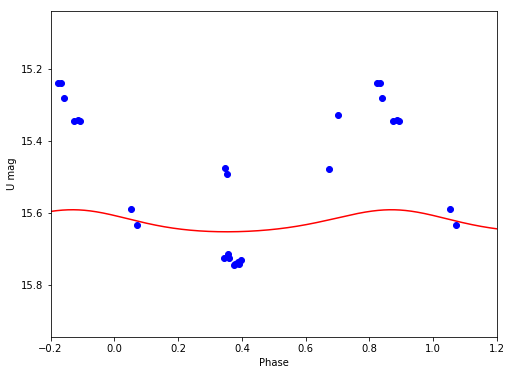

U 15.6257138164 0.0610761455967


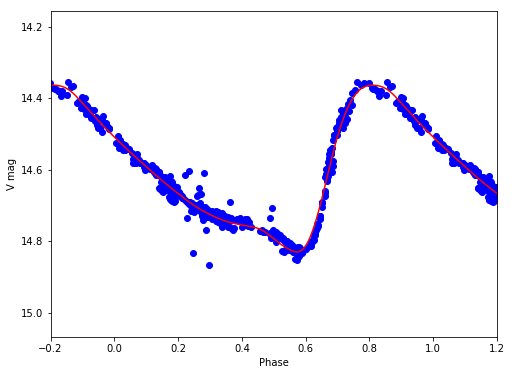

V 14.6024396707 0.466296939465
V44
/Volumes/Annie/CRRP/NGC3201/lcvs/V44.phased


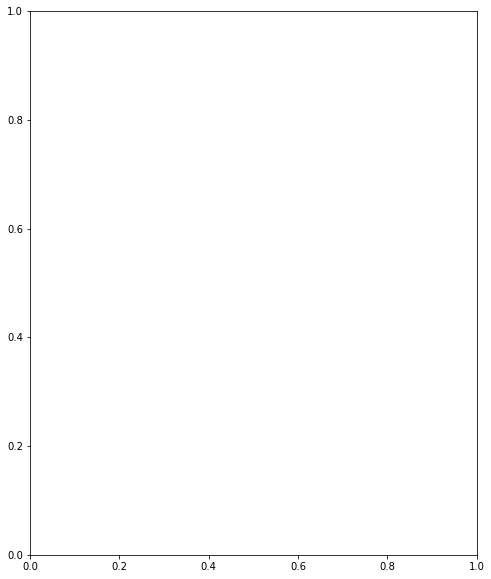

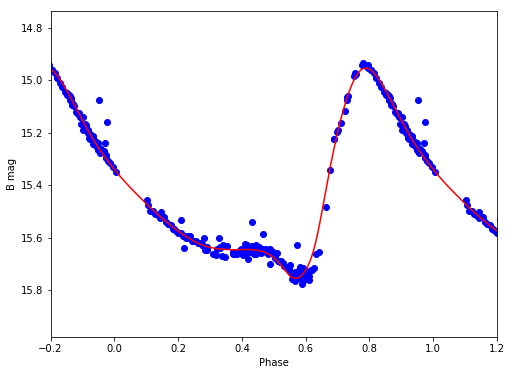

B 15.4081329363 0.801473952018


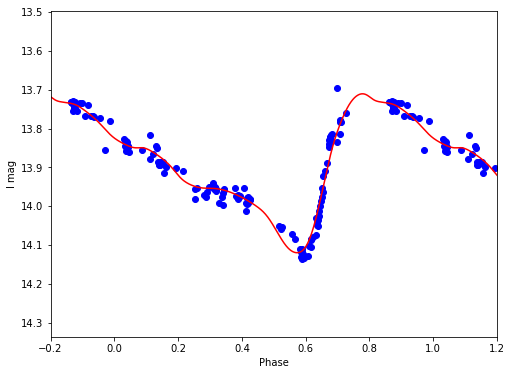

I 13.8887423014 0.408322494311


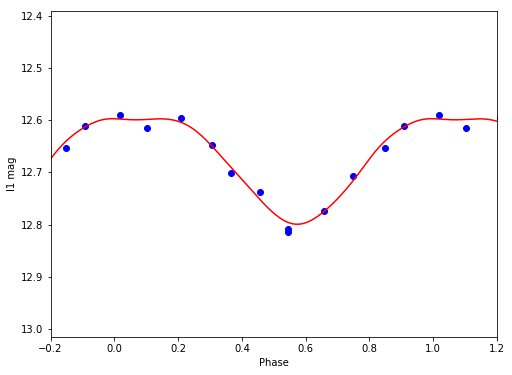

I1 12.6747447882 0.202247479539


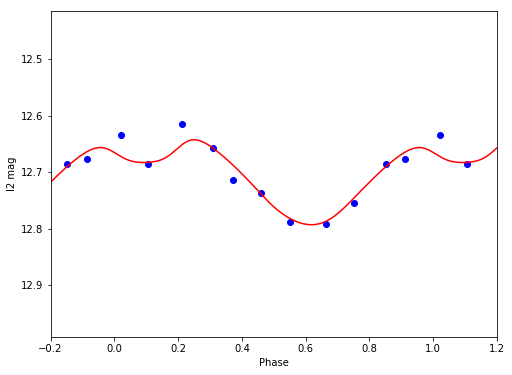

I2 12.7061241956 0.150271210246


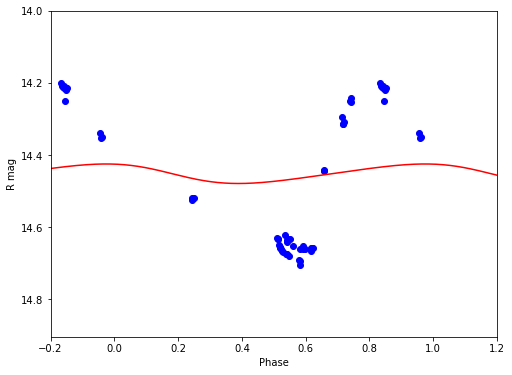

R 14.4518631553 0.054087958755


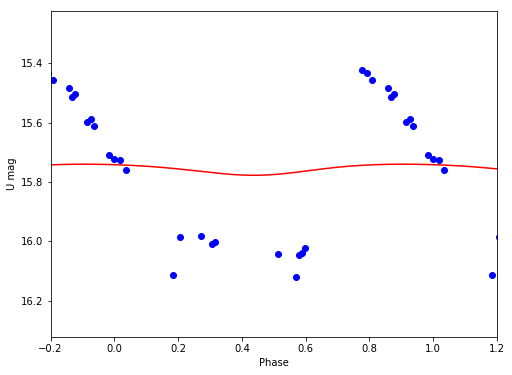

U 15.7557105594 0.0374365795154


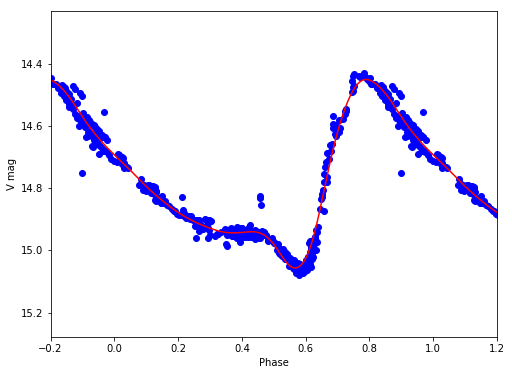

V 14.7729086197 0.605458161332
V45
/Volumes/Annie/CRRP/NGC3201/lcvs/V45.phased


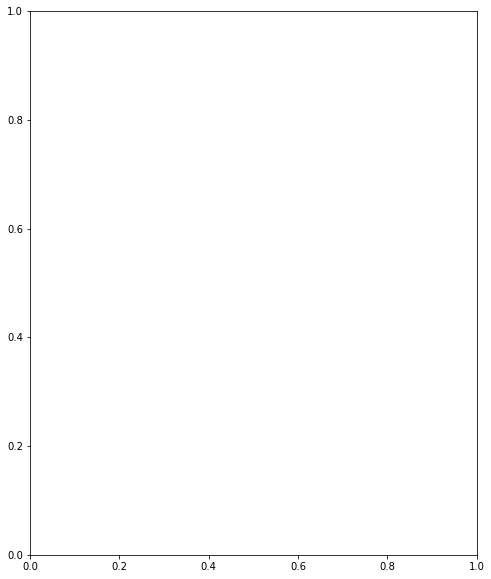

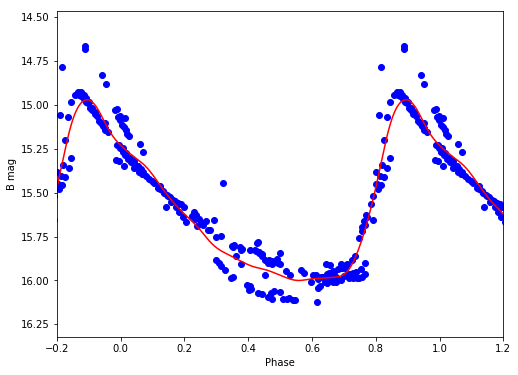

B 15.5770636199 1.03002990504


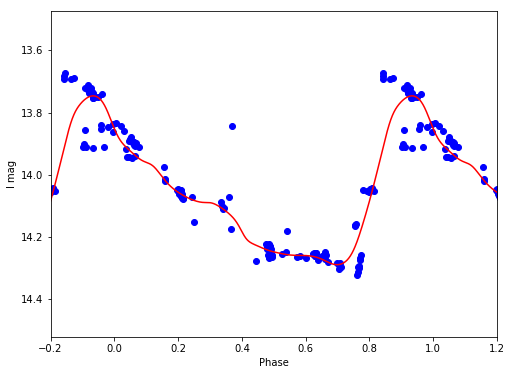

I 14.0637718141 0.542921986489


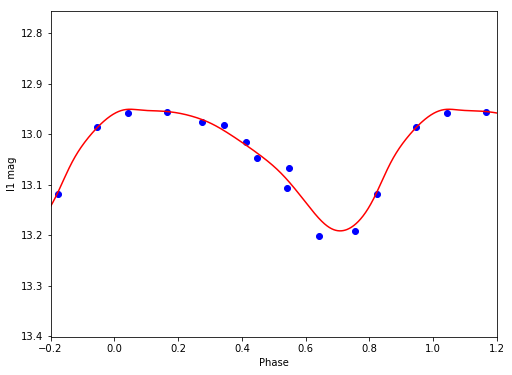

I1 13.038356259 0.24087228635


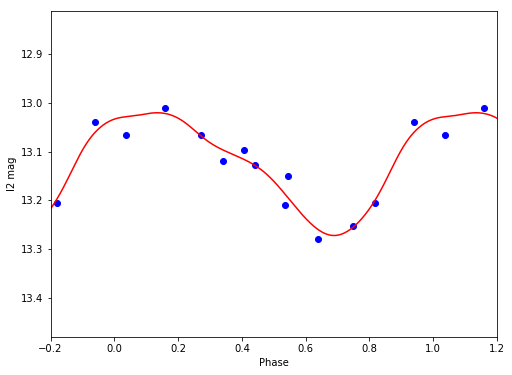

I2 13.123503108 0.251771130364


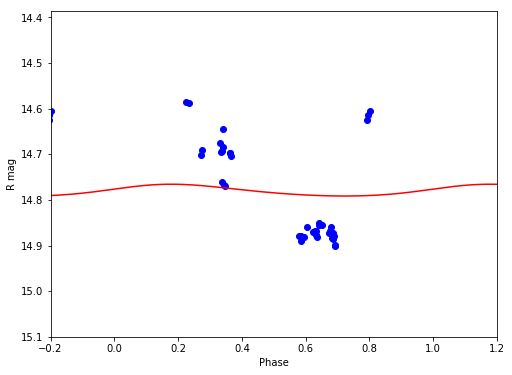

R 14.7797514251 0.025908117497


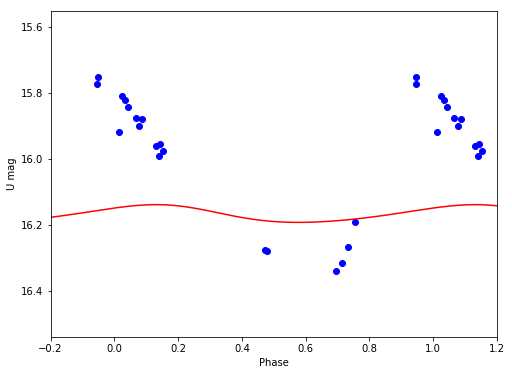

U 16.1671118947 0.0538023680456


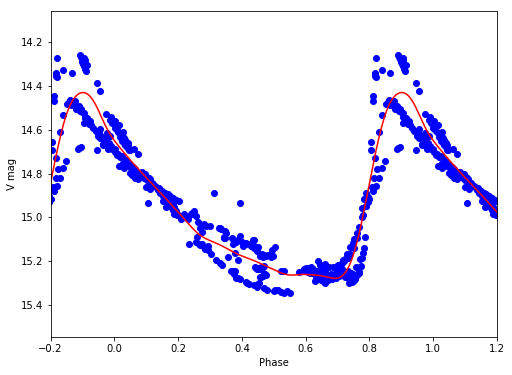

V 14.9412216706 0.846709521818
V46
/Volumes/Annie/CRRP/NGC3201/lcvs/V46.phased


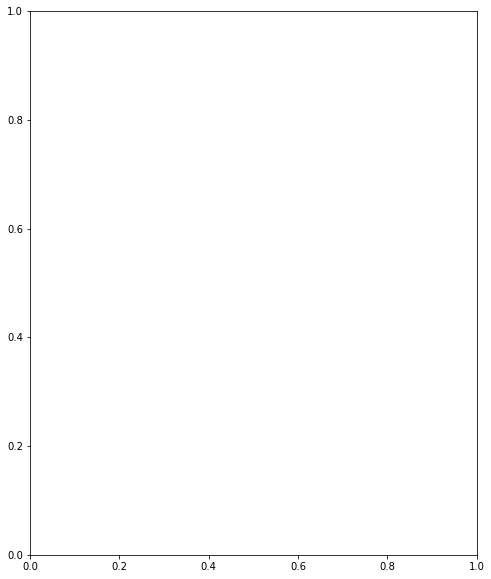

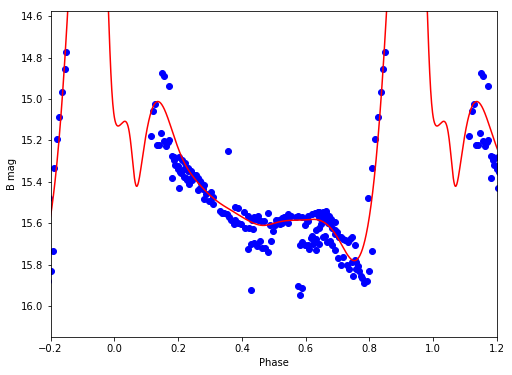

B 15.0786685237 2.25424019311


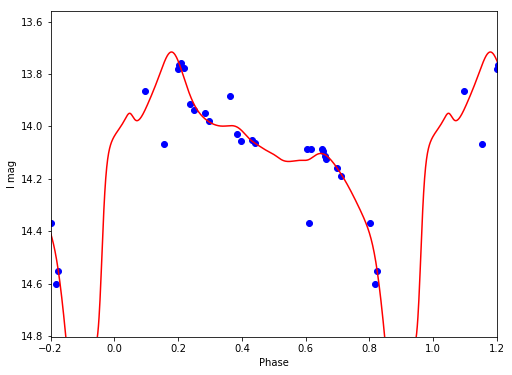

I 14.1216251281 1.5416822521


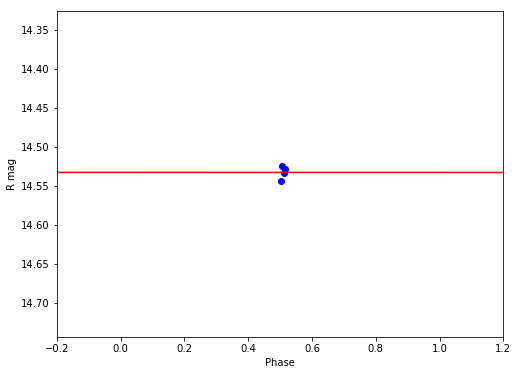

R 14.5328538314 8.57025392378e-05


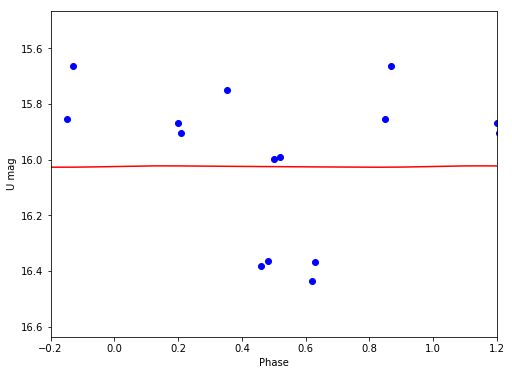

U 16.0243078179 0.00486010581123


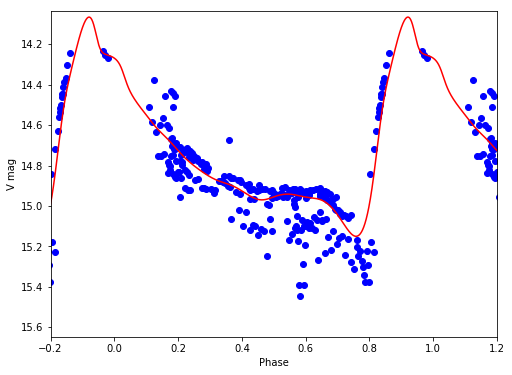

V 14.6951437125 1.0849124271
V47
/Volumes/Annie/CRRP/NGC3201/lcvs/V47.phased


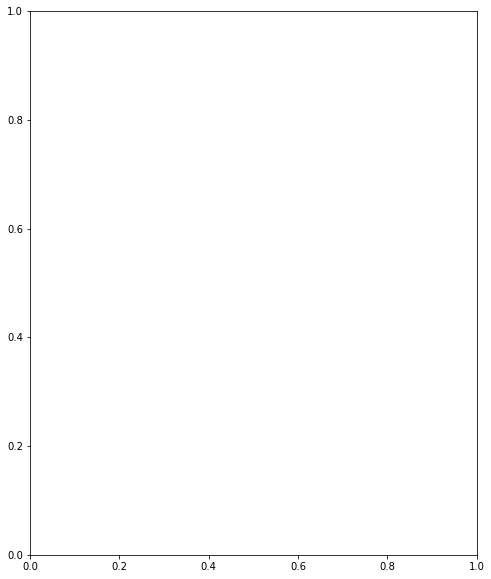

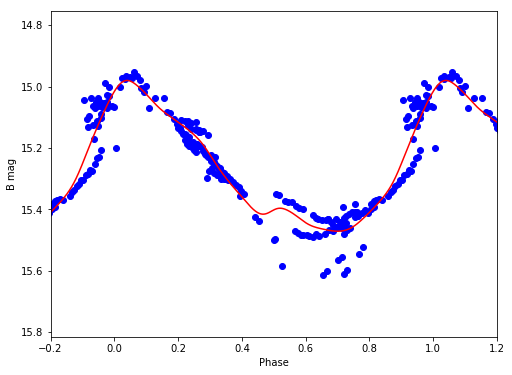

B 15.25912166 0.491431638241


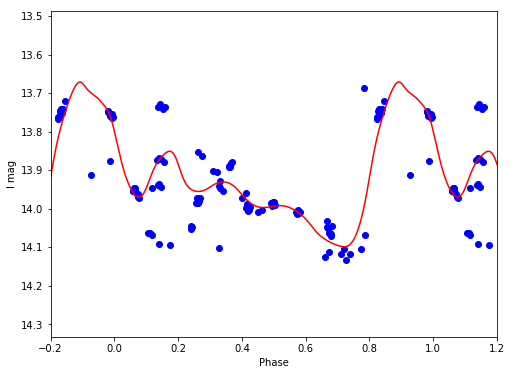

I 13.9205503764 0.427455704896


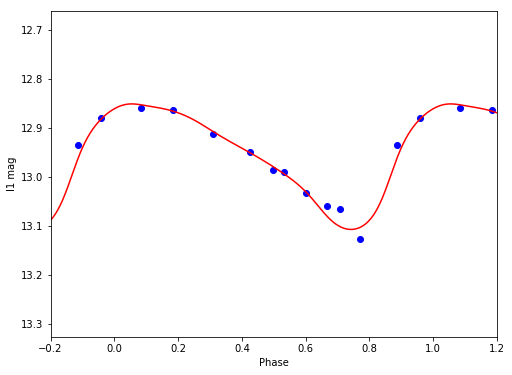

I1 12.9534127852 0.256697952145


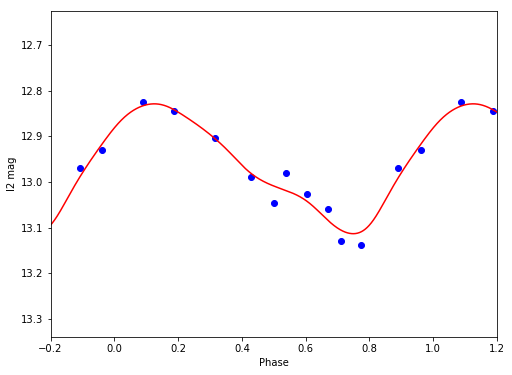

I2 12.9603114724 0.28425806921


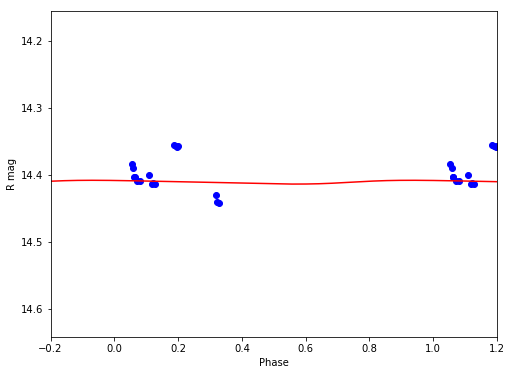

R 14.4110282726 0.00564739798547


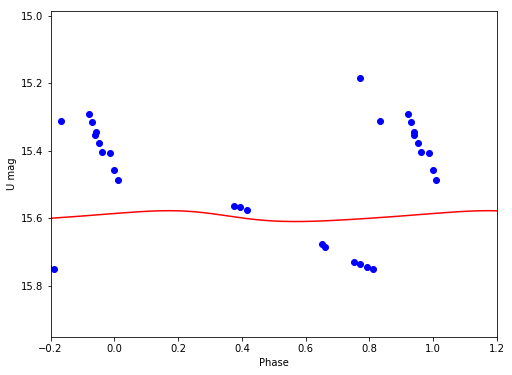

U 15.594592858 0.032207055232


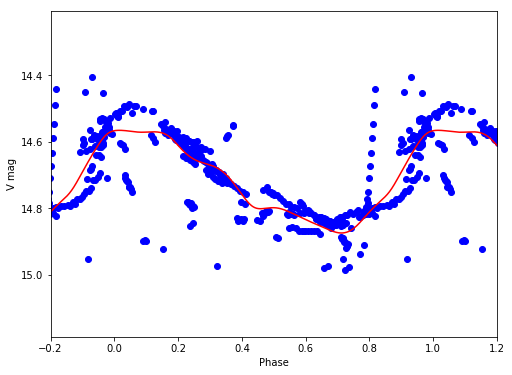

V 14.7130186787 0.30885266464
V48
/Volumes/Annie/CRRP/NGC3201/lcvs/V48.phased


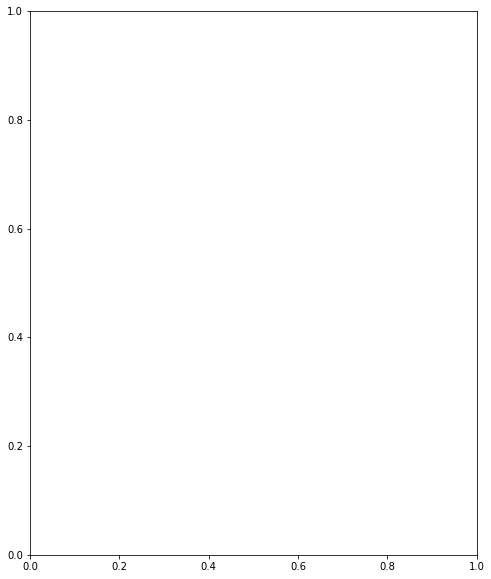

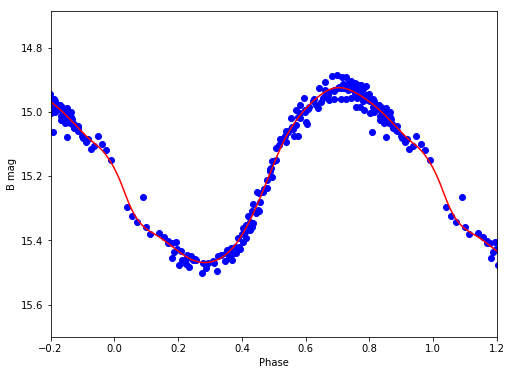

B 15.1756933019 0.544955362966


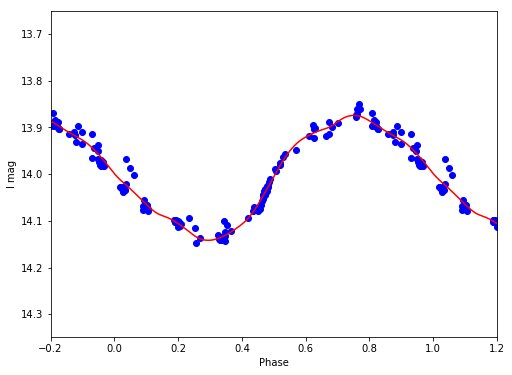

I 14.0003806208 0.267326864606


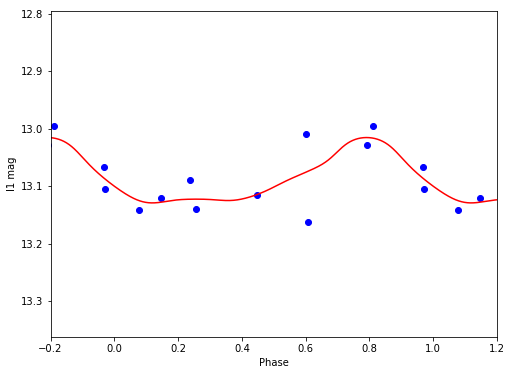

I1 13.0874849509 0.113615882323


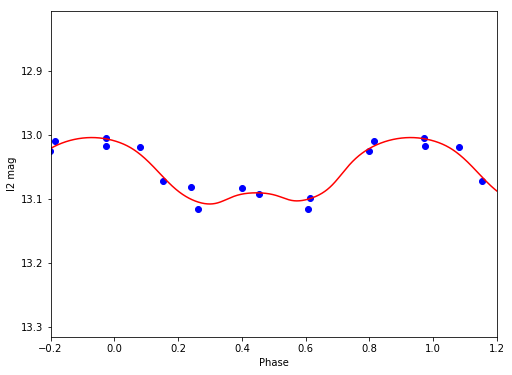

I2 13.0618088274 0.104078697547


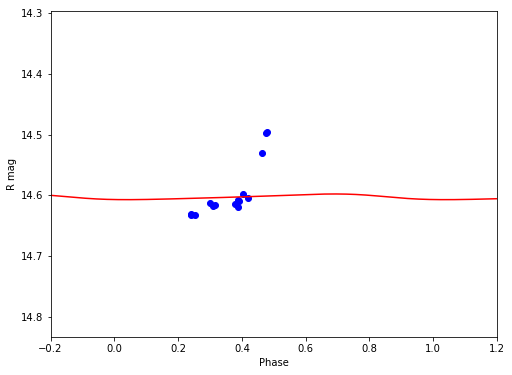

R 14.602844657 0.00935990185697


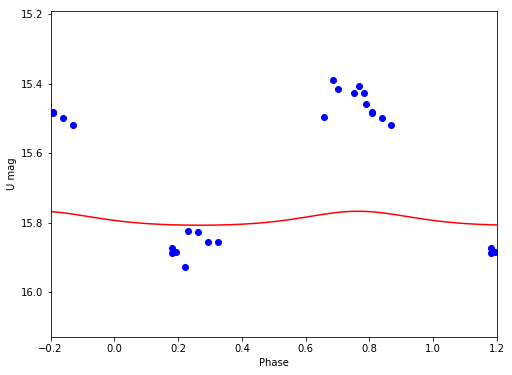

U 15.7917111813 0.0401923038445


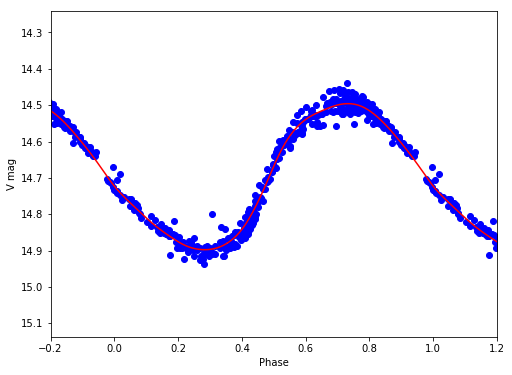

V 14.6873044929 0.401644045885
V49
/Volumes/Annie/CRRP/NGC3201/lcvs/V49.phased


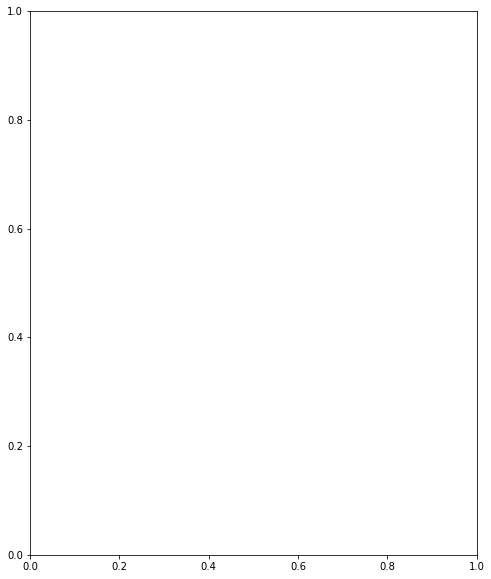

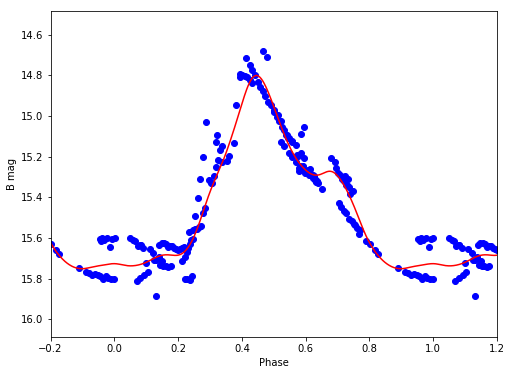

B 15.3895765866 0.951681738789


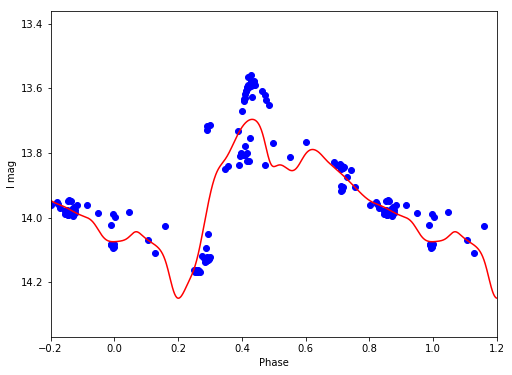

I 13.935340283 0.553364062814


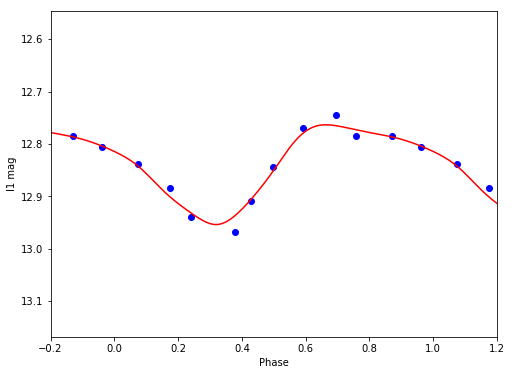

I1 12.8398893442 0.190511763765


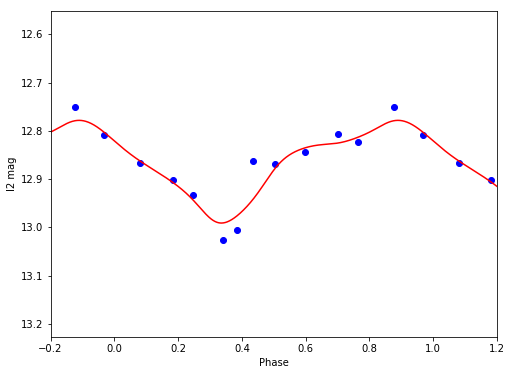

I2 12.8660021928 0.212837514124


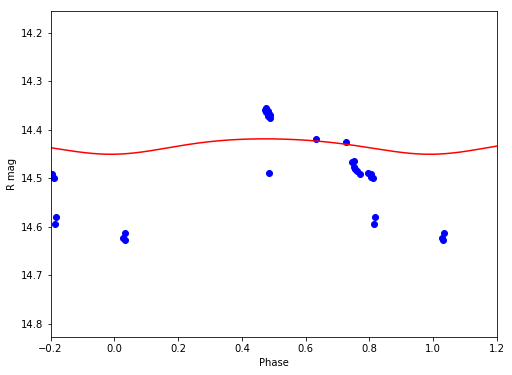

R 14.4322194886 0.0318159434432


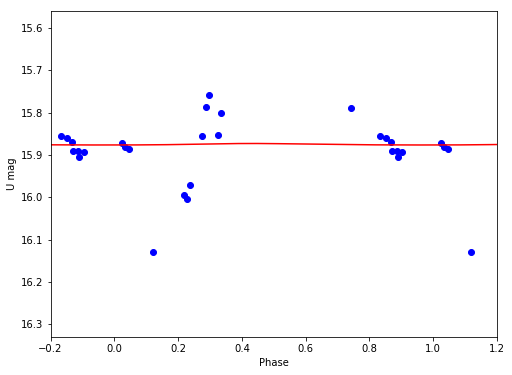

U 15.8751602234 0.00355242293547


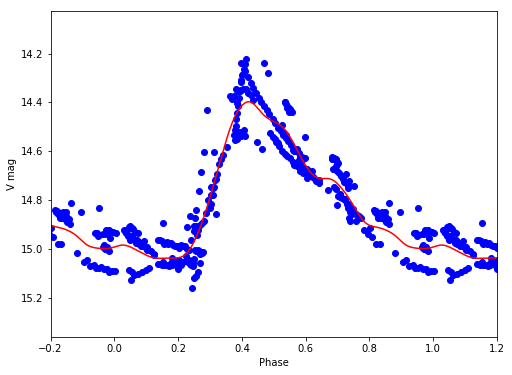

V 14.7768998708 0.641310891335
V50
/Volumes/Annie/CRRP/NGC3201/lcvs/V50.phased


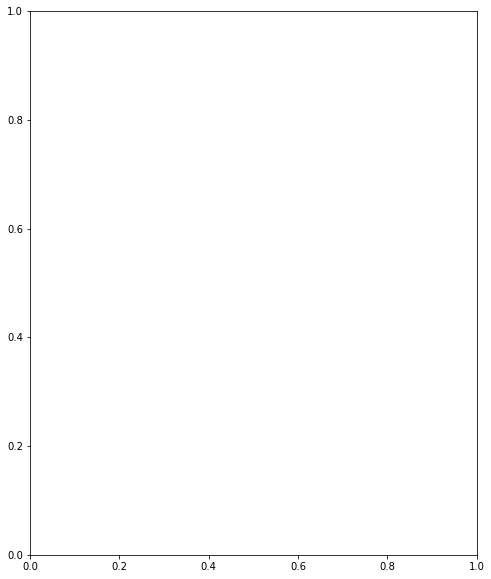

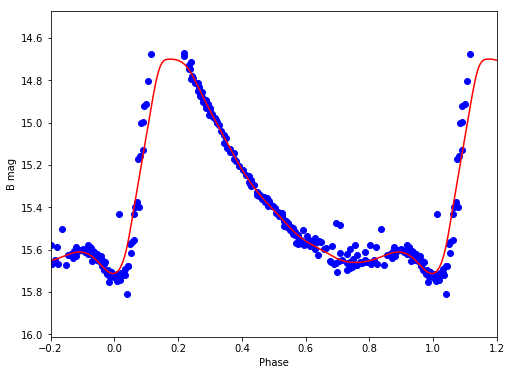

B 15.2934416053 1.01315576458


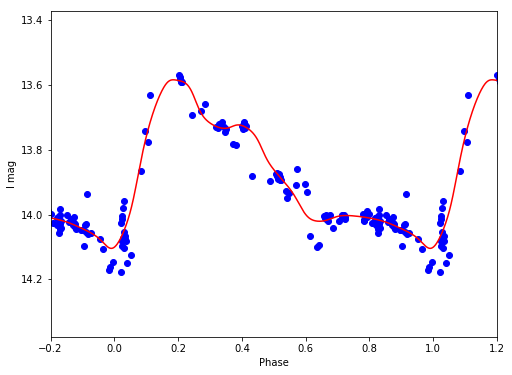

I 13.8672506647 0.5199812085


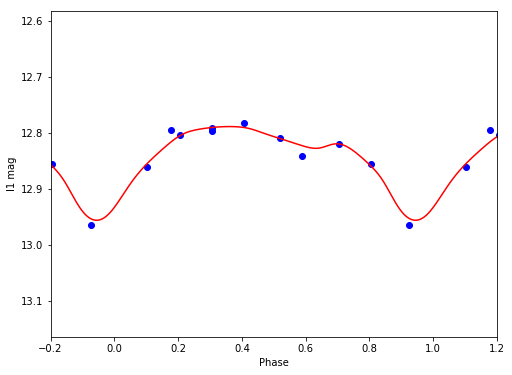

I1 12.8407586359 0.167477949401


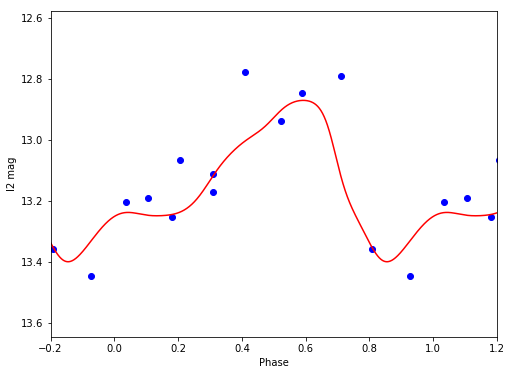

I2 13.1318832495 0.528395688066


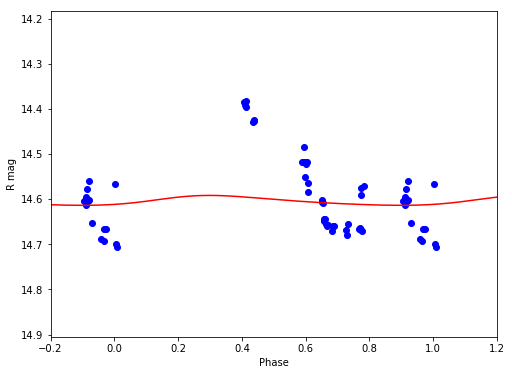

R 14.6034276449 0.0219697683599


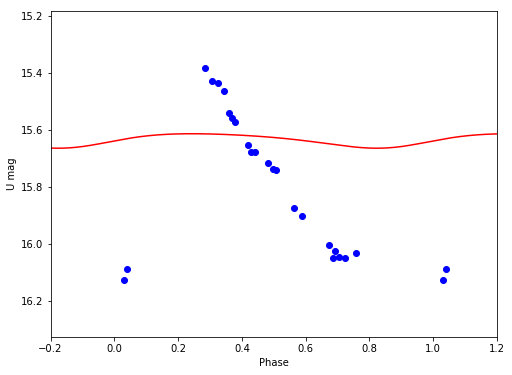

U 15.6340502767 0.0507010740078


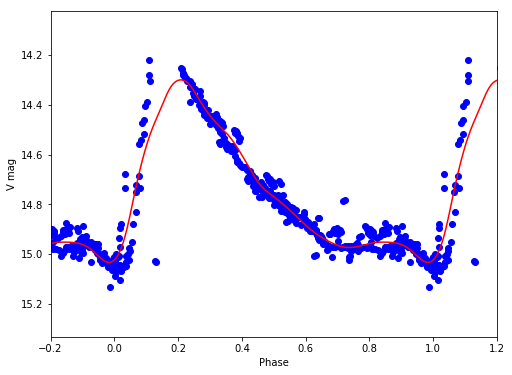

V 14.72109141 0.733469482629
V51
/Volumes/Annie/CRRP/NGC3201/lcvs/V51.phased


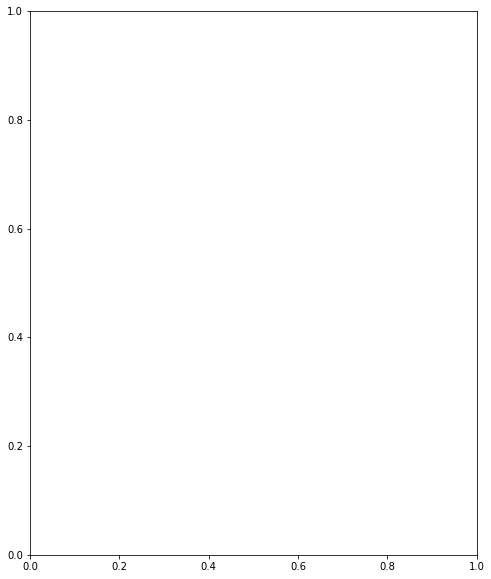

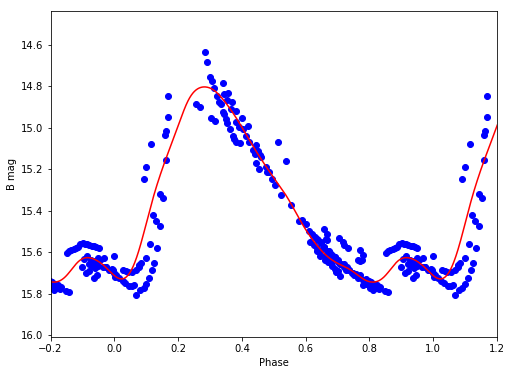

B 15.3222111045 0.940177258004


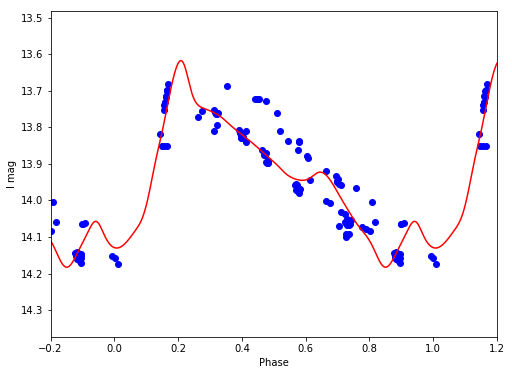

I 13.929643543 0.5649415794


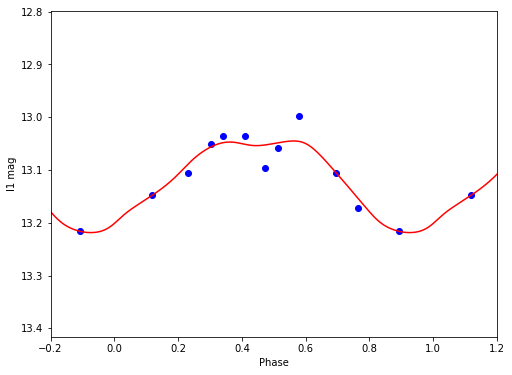

I1 13.1157541818 0.173609729208


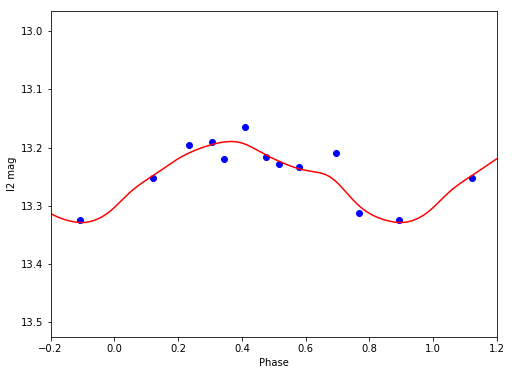

I2 13.2518190855 0.139142160477


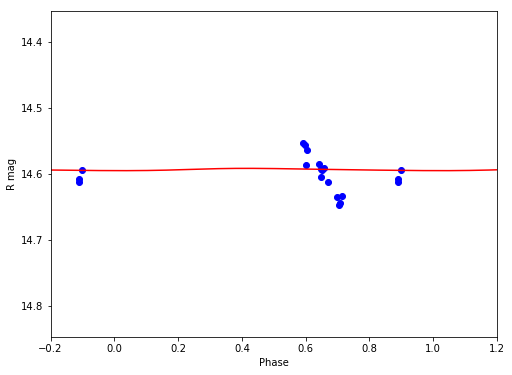

R 14.5937257123 0.00346820060811


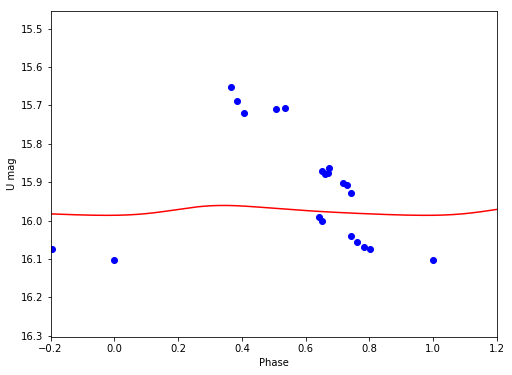

U 15.9751848934 0.0257833054472


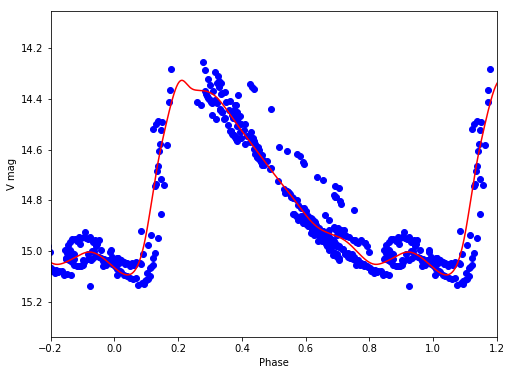

V 14.748118854 0.76479192447
V52
/Volumes/Annie/CRRP/NGC3201/lcvs/V52.phased


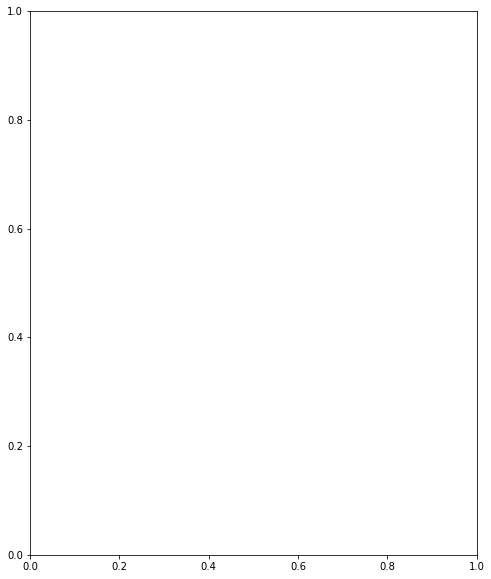

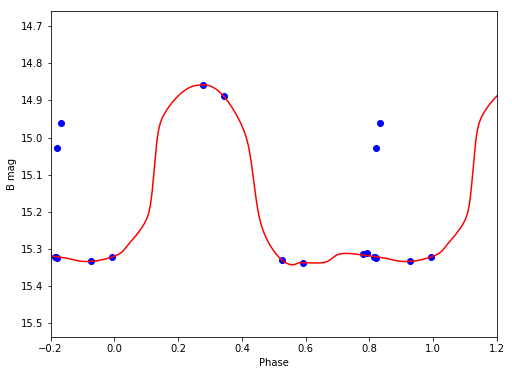

B 15.1674467448 0.485040147196


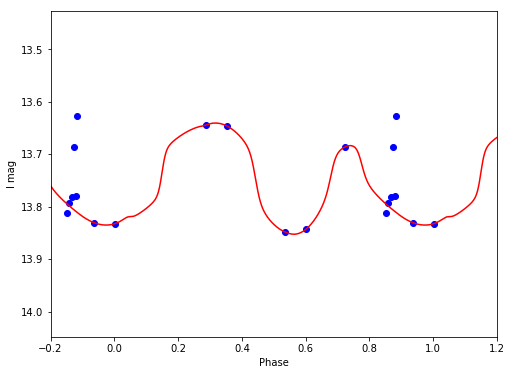

I 13.7548982957 0.212018606872


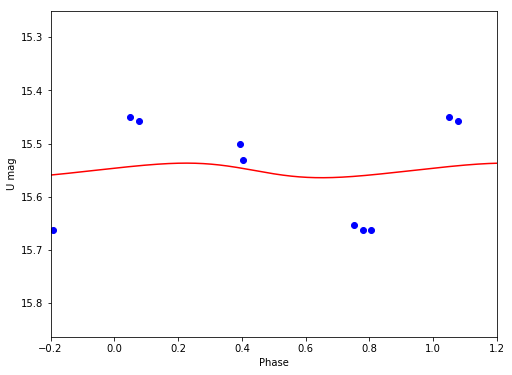

U 15.5502366482 0.0274262928265


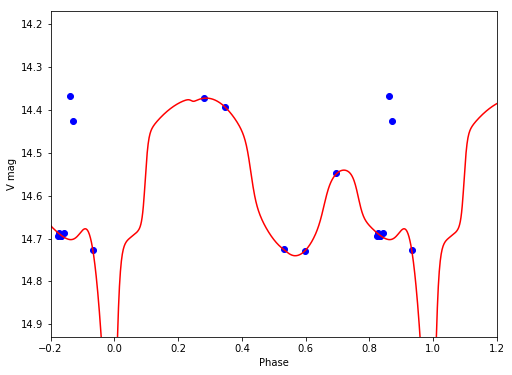

V 14.5951107634 0.953008002152
V53
/Volumes/Annie/CRRP/NGC3201/lcvs/V53.phased


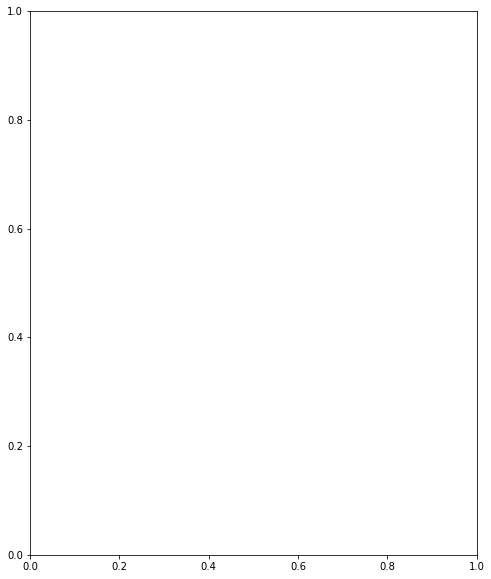

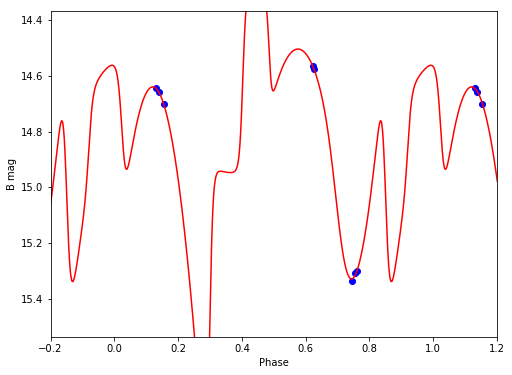

B 14.8076852864 1.67212003097


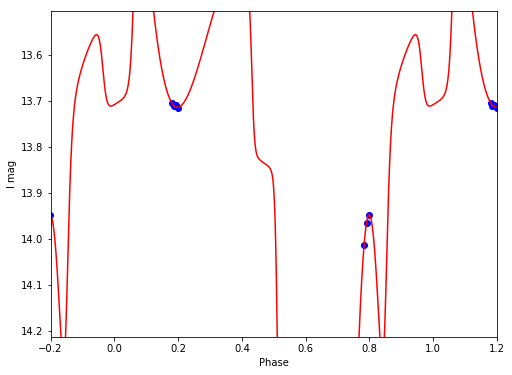

I 13.8921322631 10.5128578266


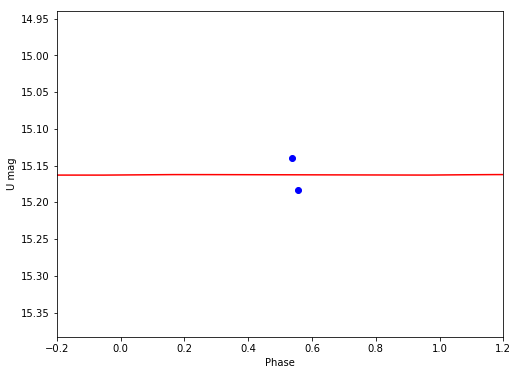

U 15.1625574366 0.000757198256032


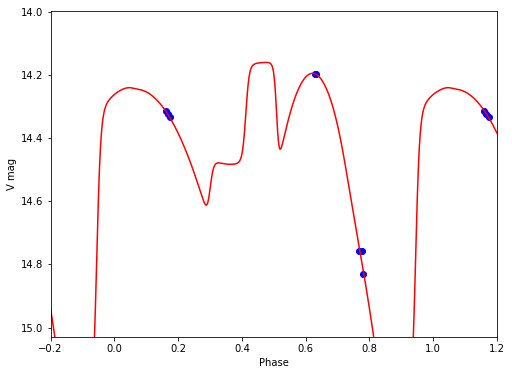

V 14.4393942606 1.17559427158
V54
/Volumes/Annie/CRRP/NGC3201/lcvs/V54.phased


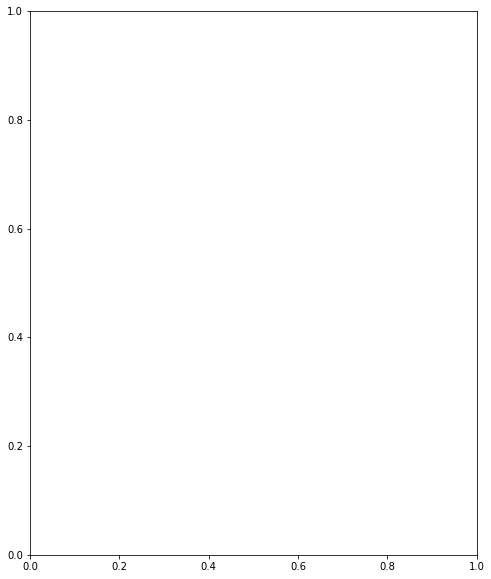

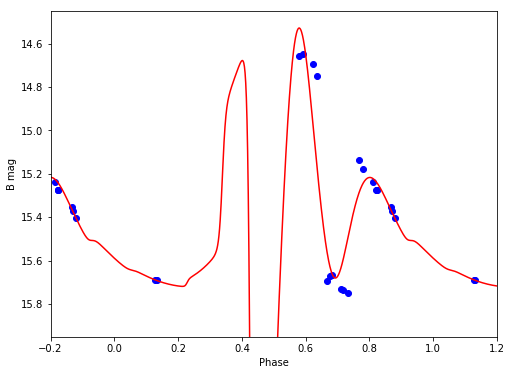

B 15.4106847245 3.96089877419


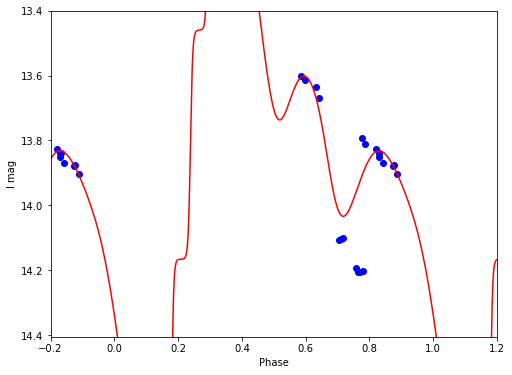

I 13.6487417217 4.01994939232


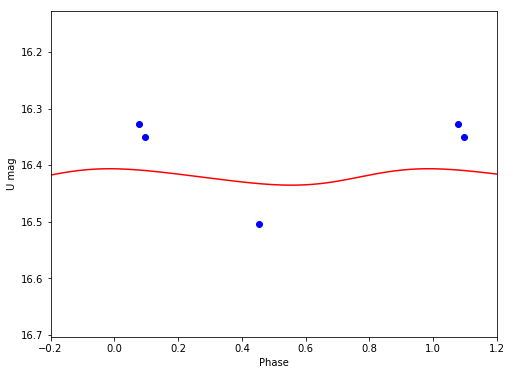

U 16.4206373092 0.0290454288344


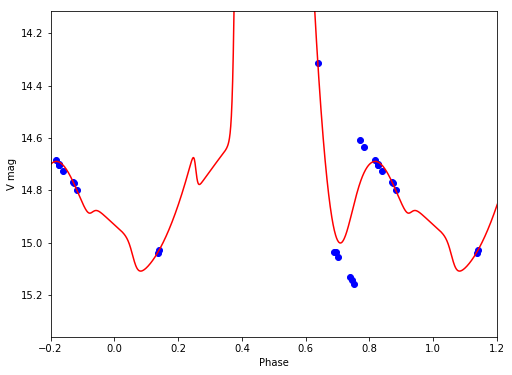

V 11.4141973665 7.54692052318
V55
/Volumes/Annie/CRRP/NGC3201/lcvs/V55.phased


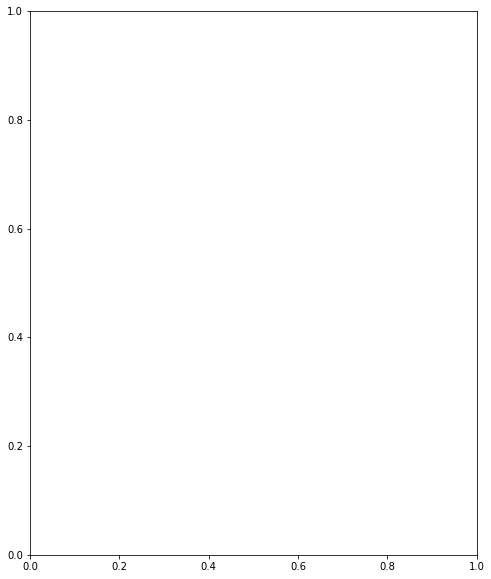

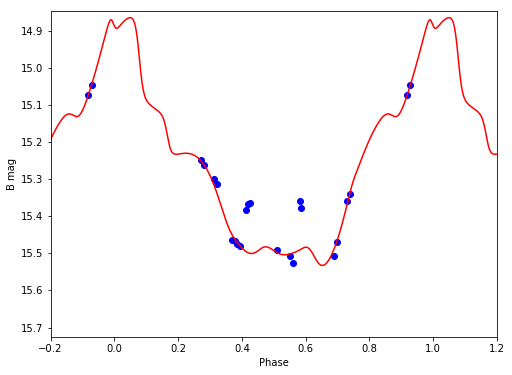

B 15.2447929391 0.66781434865


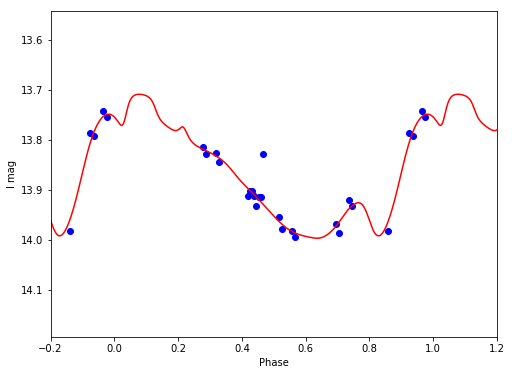

I 13.8665088952 0.28779736692


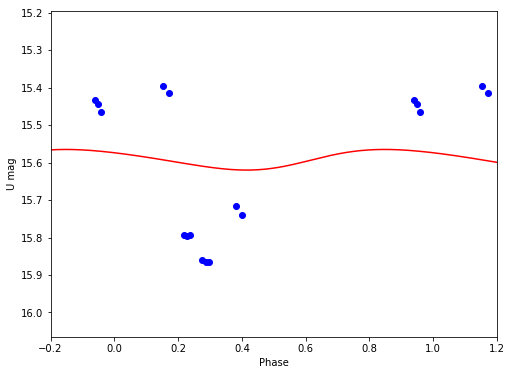

U 15.5907939694 0.0550822280286


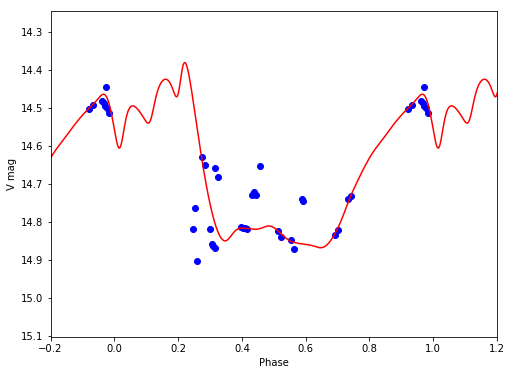

V 14.6543454237 0.487069439927
V56
/Volumes/Annie/CRRP/NGC3201/lcvs/V56.phased


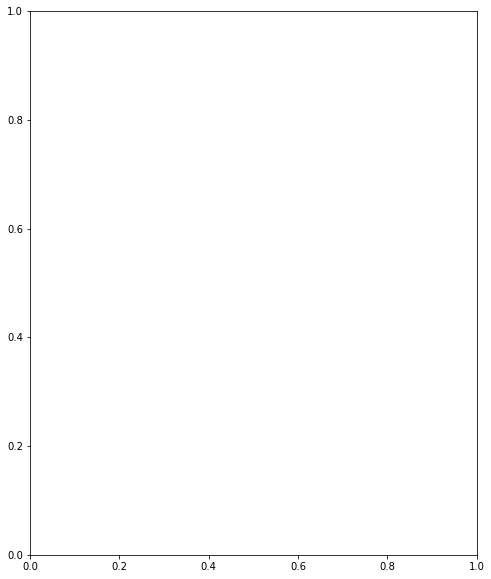

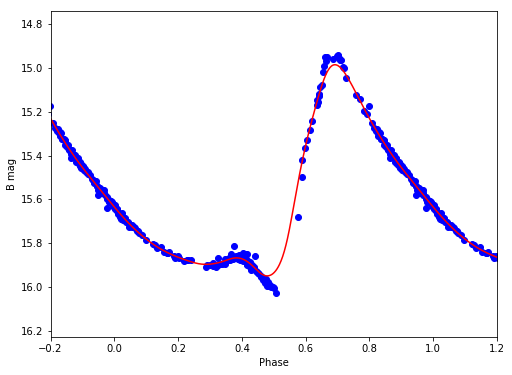

B 15.5561928118 0.962049483086


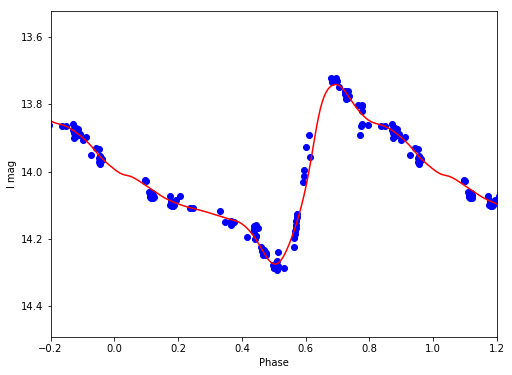

I 14.0095601352 0.534681736786


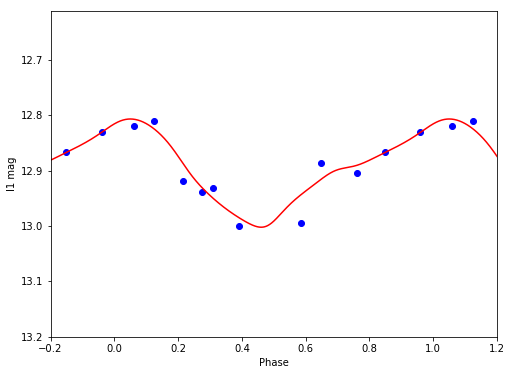

I1 12.8980765084 0.195449436368


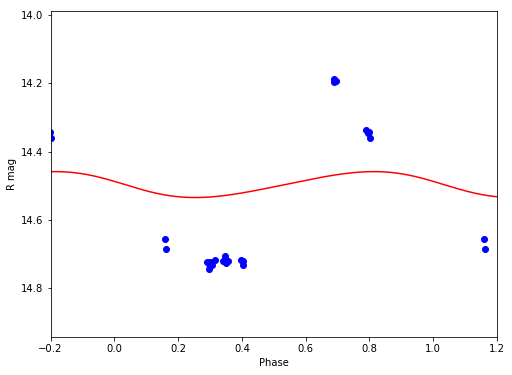

R 14.4965854008 0.0759756045663


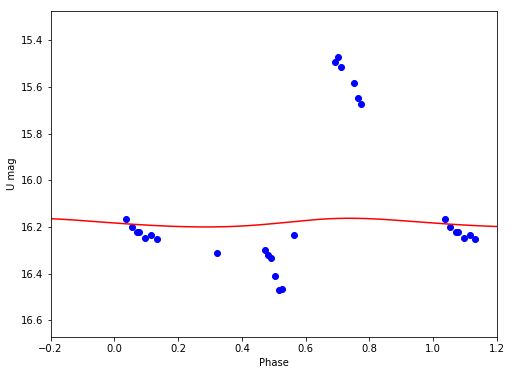

U 16.1828330702 0.0372501332607


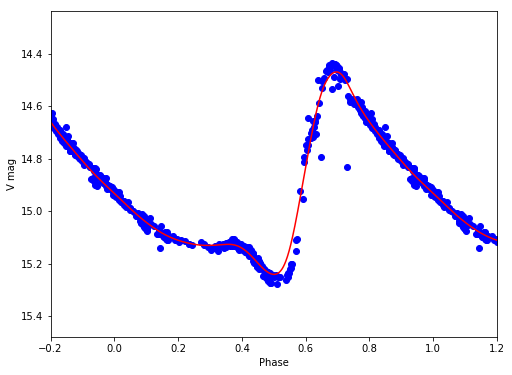

V 14.9119576986 0.771535221268
V57
/Volumes/Annie/CRRP/NGC3201/lcvs/V57.phased


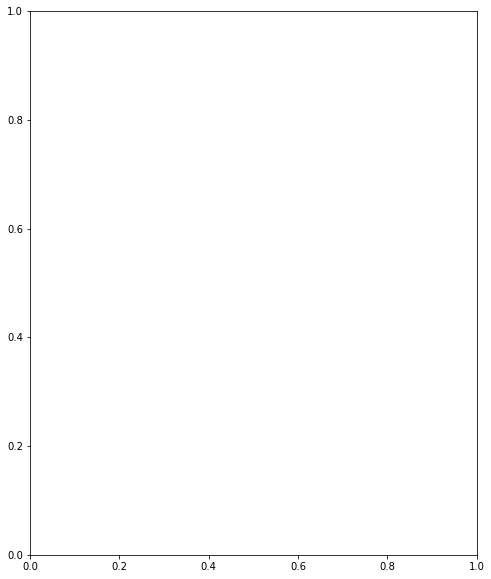

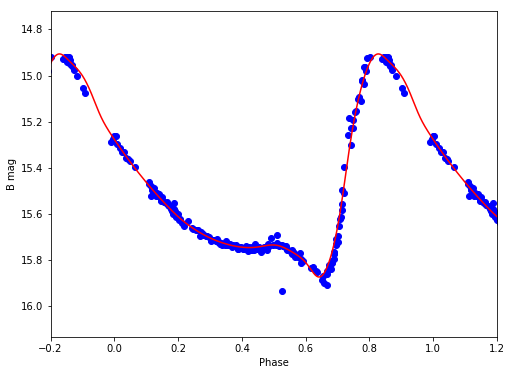

B 15.4522332758 0.966502781831


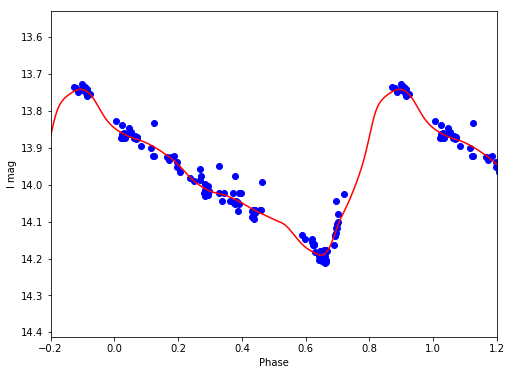

I 13.9659358239 0.449483045178


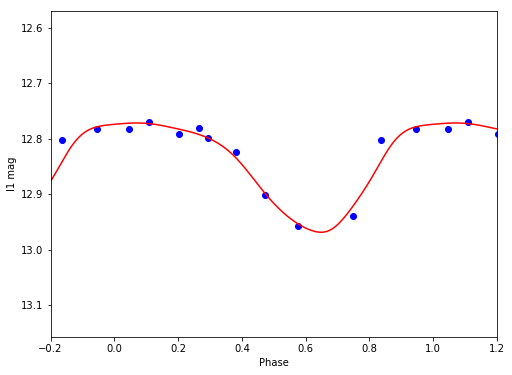

I1 12.8451820968 0.197035470154


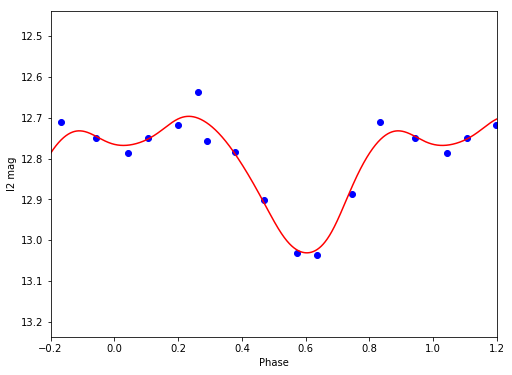

I2 12.8154179653 0.333980309069


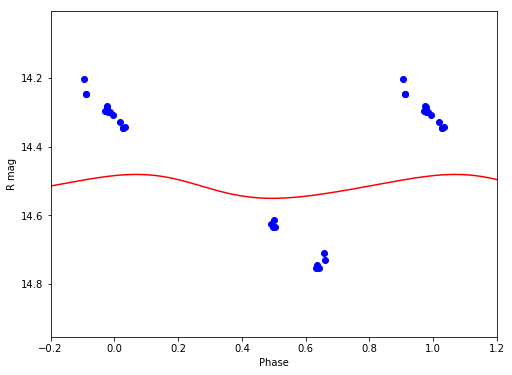

R 14.515955325 0.0695565298739


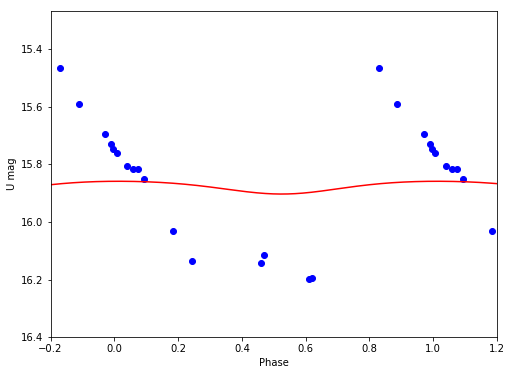

U 15.8776102812 0.0443368403036


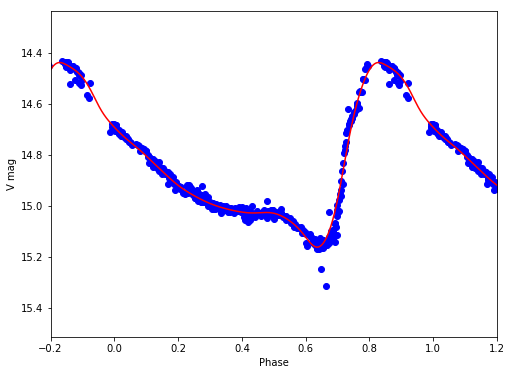

V 14.8290309246 0.726324236802
V58
/Volumes/Annie/CRRP/NGC3201/lcvs/V58.phased


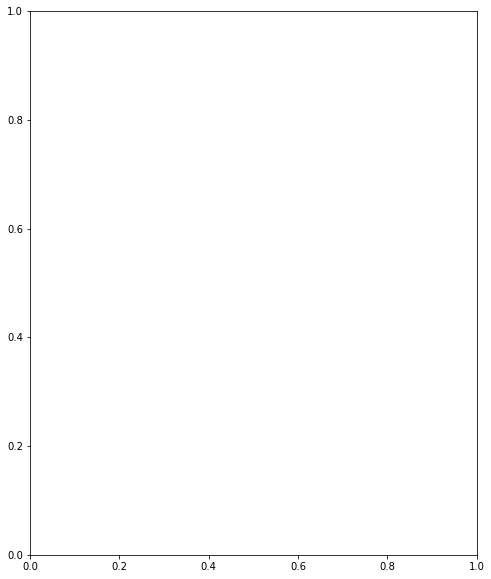

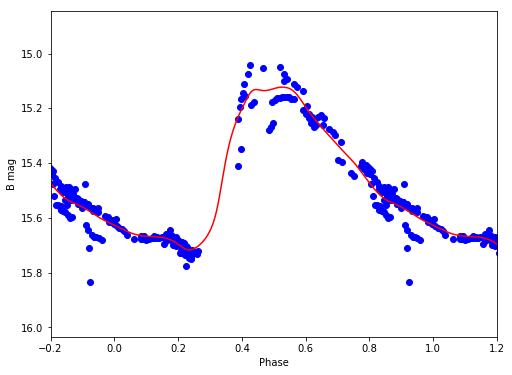

B 15.4299586451 0.594795256384


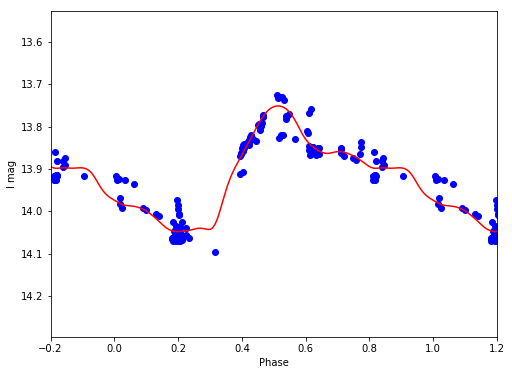

I 13.9110318589 0.296794412856


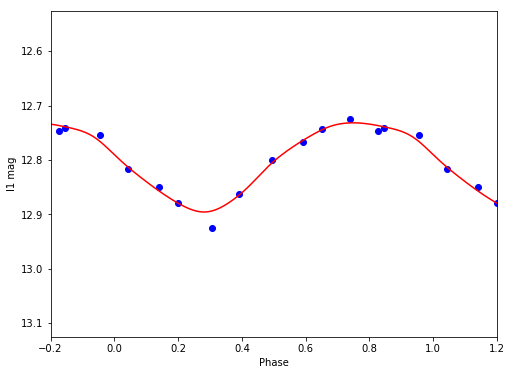

I1 12.8025314779 0.164044238346


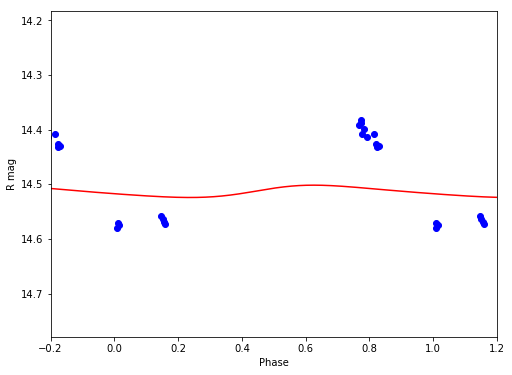

R 14.5132806488 0.02254797171


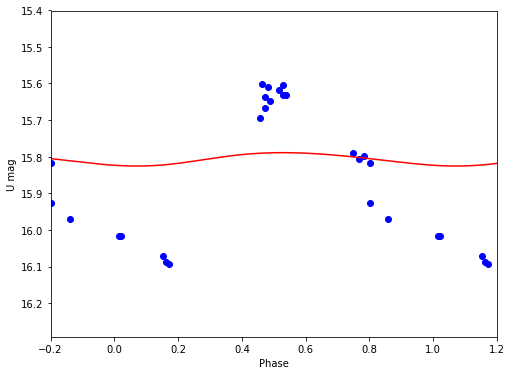

U 15.806216428 0.0366123711989


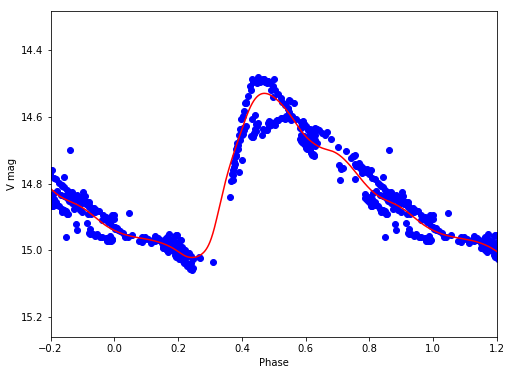

V 14.798260863 0.492094288525
V59
/Volumes/Annie/CRRP/NGC3201/lcvs/V59.phased


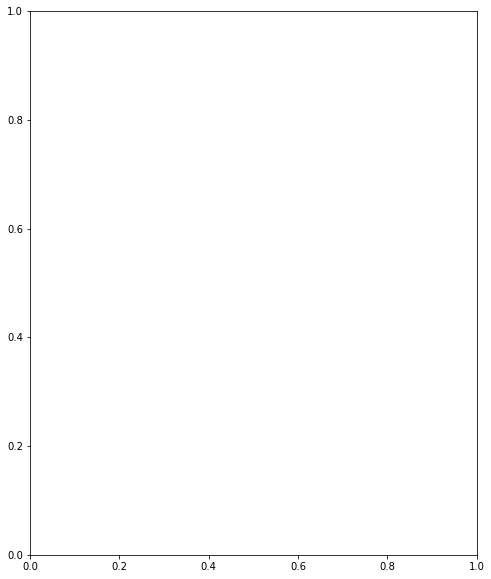

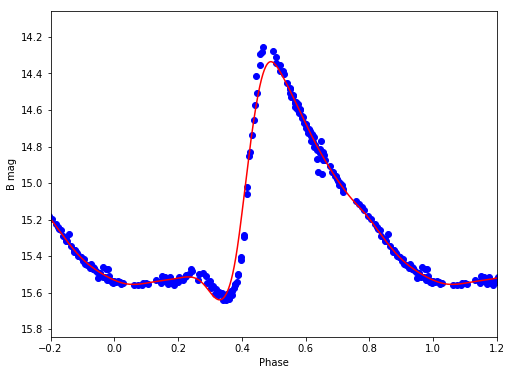

B 15.1147297778 1.30414038292


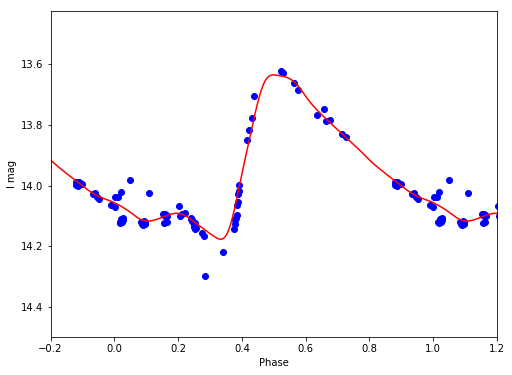

I 13.9327177912 0.542067173084


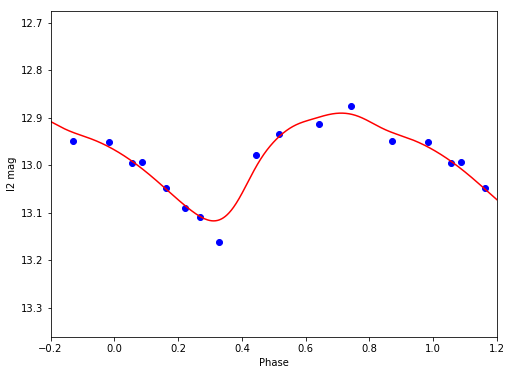

I2 12.9800869343 0.226654042277


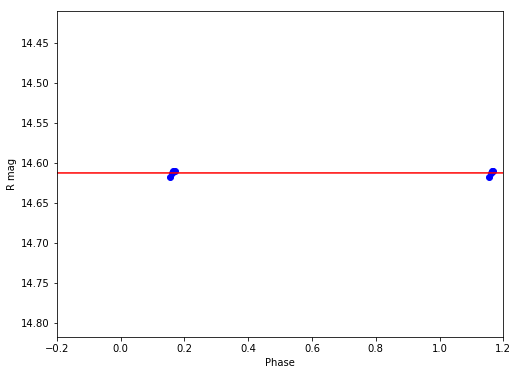

R 14.6120001305 6.16393898518e-05


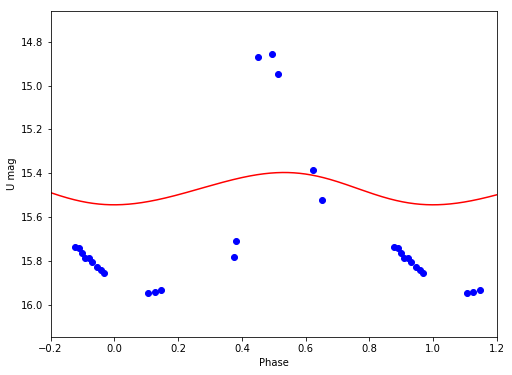

U 15.469944198 0.147485756955


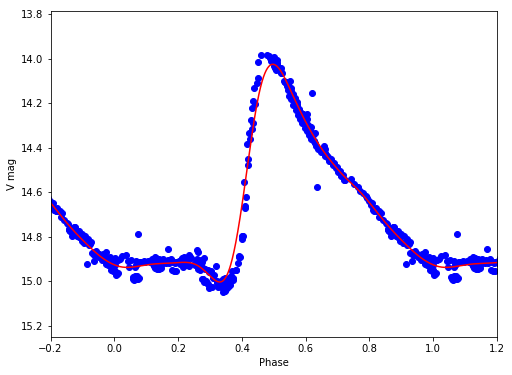

V 14.6217734121 0.978597175365
V60
/Volumes/Annie/CRRP/NGC3201/lcvs/V60.phased


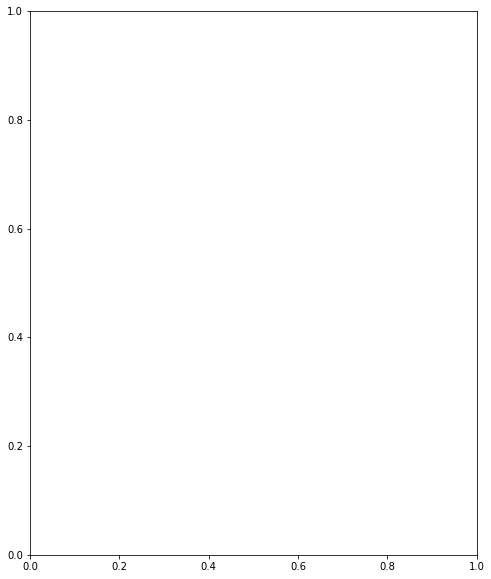

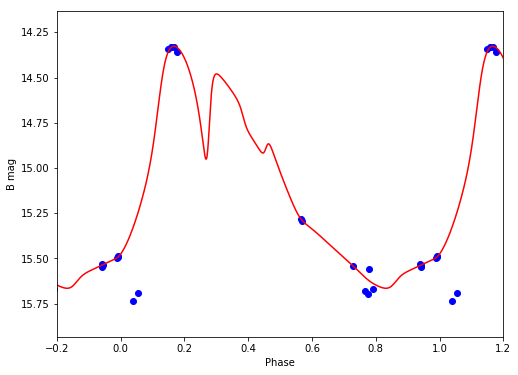

B 15.0328360481 1.33816603623


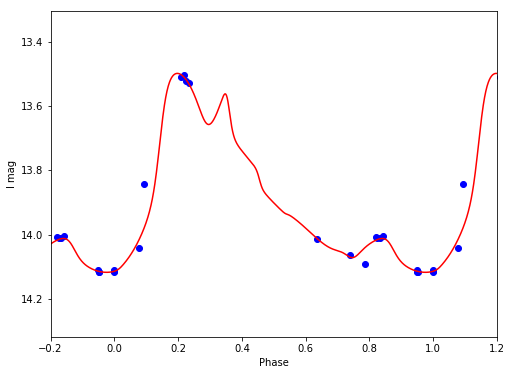

I 13.8749302361 0.617829342689


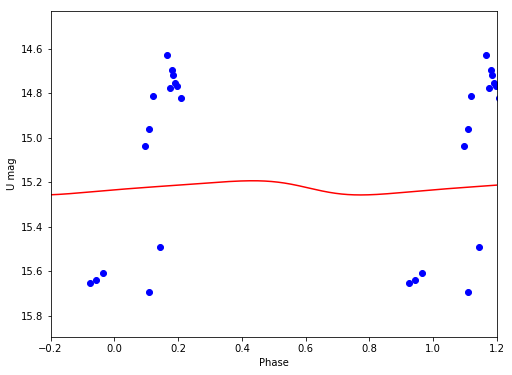

U 15.2240937356 0.0636794283379


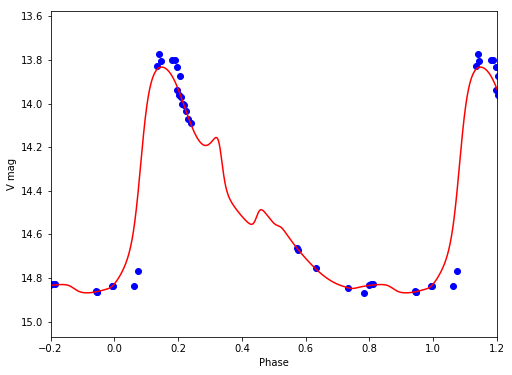

V 14.4811015217 1.03550234895
V61
/Volumes/Annie/CRRP/NGC3201/lcvs/V61.phased
V62
/Volumes/Annie/CRRP/NGC3201/lcvs/V62.phased


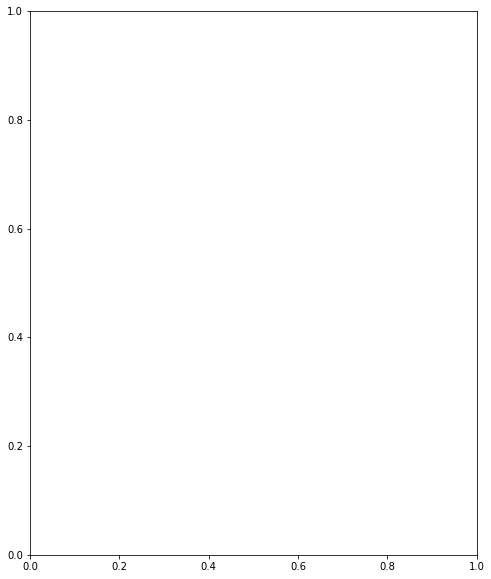

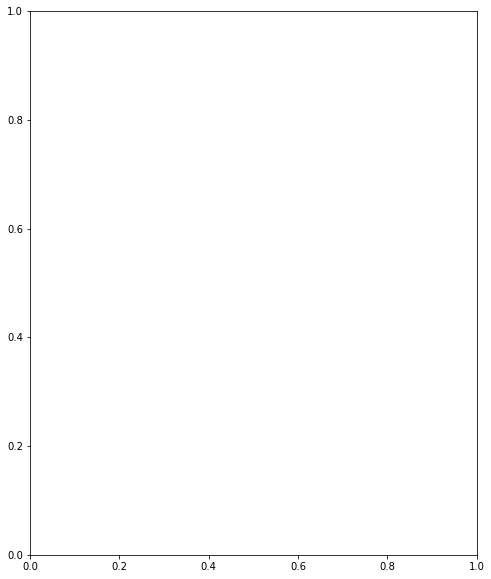

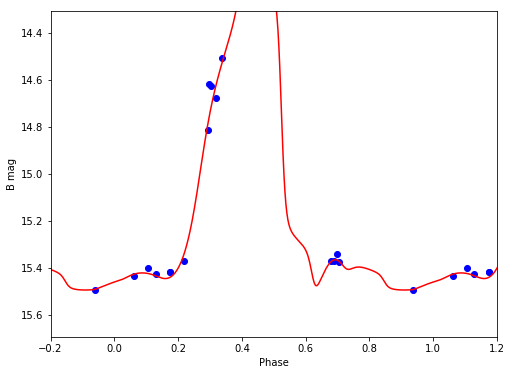

B 15.0023699468 1.69380715922


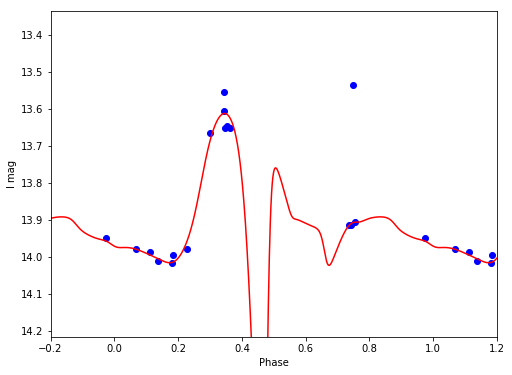

I 13.9215942915 1.26519262845


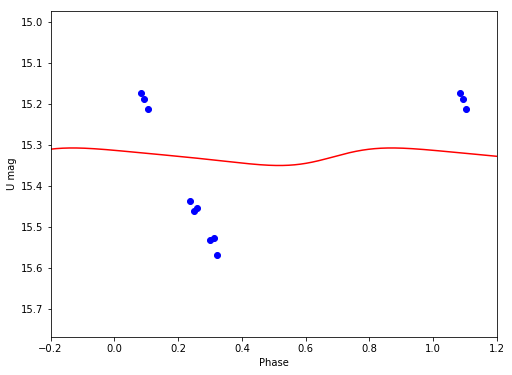

U 15.3272783052 0.0427381009896


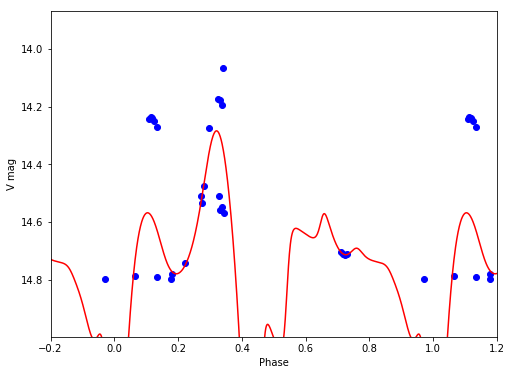

V 14.7813696332 2.00187289796
V63
/Volumes/Annie/CRRP/NGC3201/lcvs/V63.phased


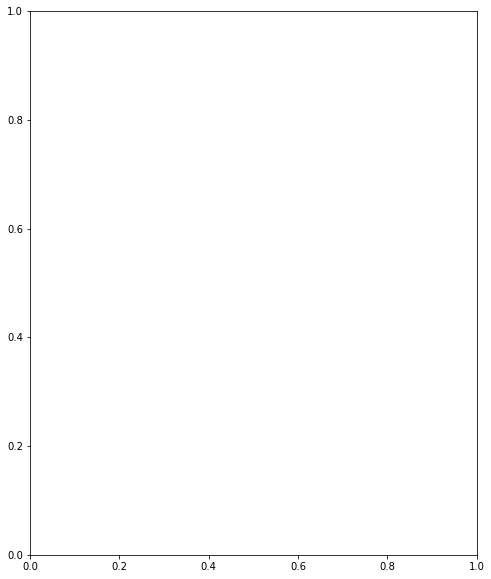

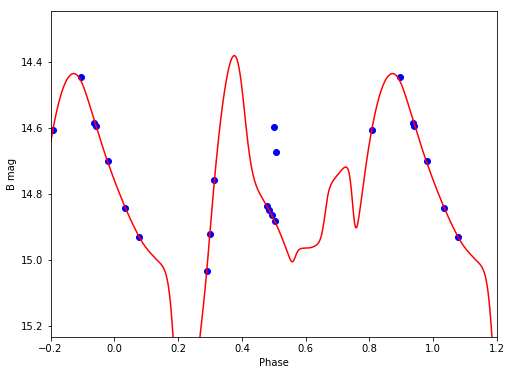

B 14.7966758722 1.1375306073


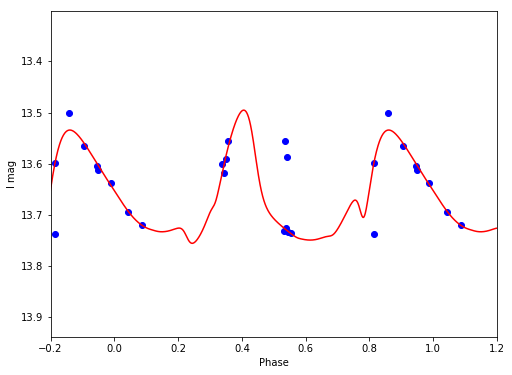

I 13.6657892859 0.260105253769


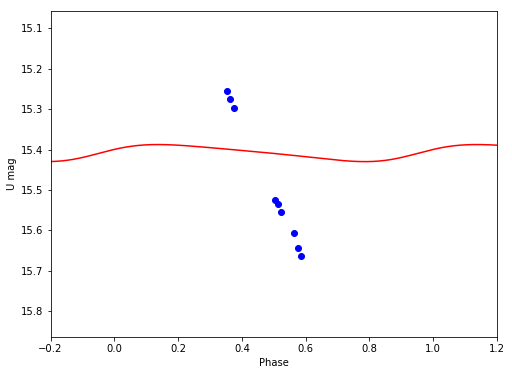

U 15.4078119842 0.0423043348208


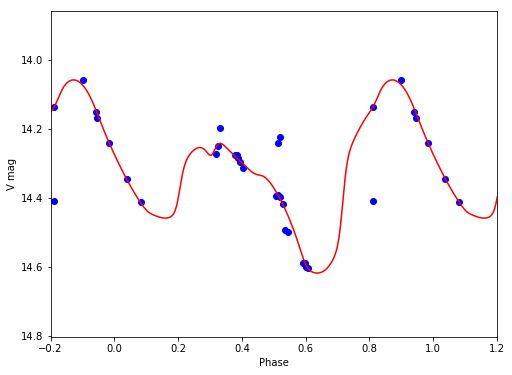

V 14.3179538298 0.560960333533
V64
/Volumes/Annie/CRRP/NGC3201/lcvs/V64.phased


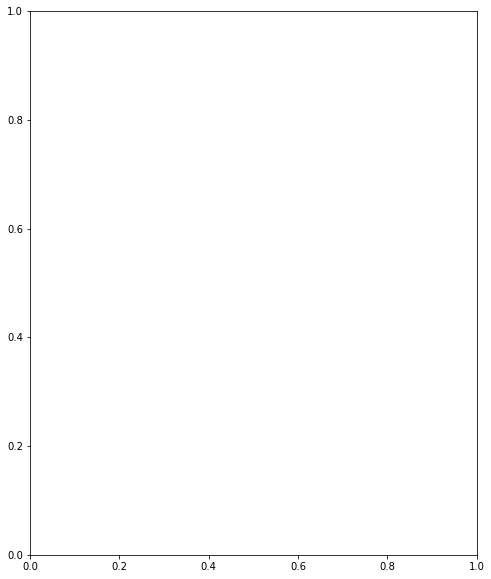

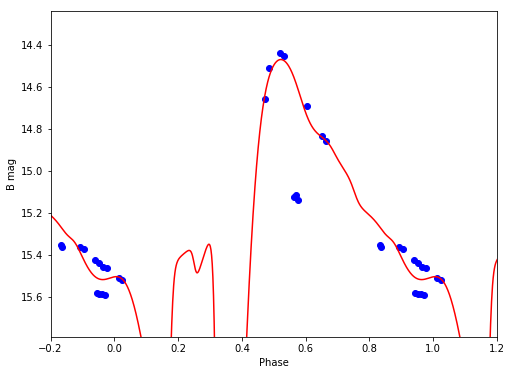

B 15.2594355003 4.97141440566


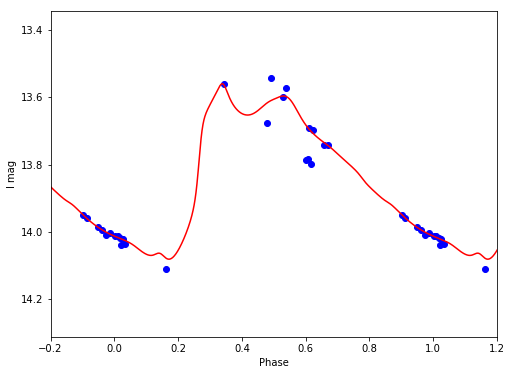

I 13.8124290638 0.520648764178


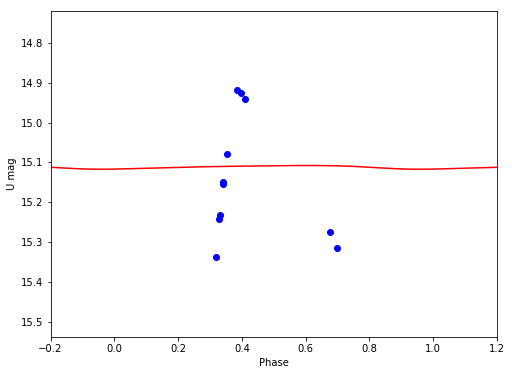

U 15.1117965661 0.00933321889201


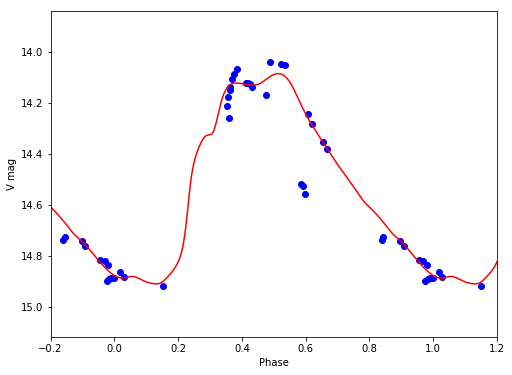

V 14.468250152 0.821772869209
V66
/Volumes/Annie/CRRP/NGC3201/lcvs/V66.phased


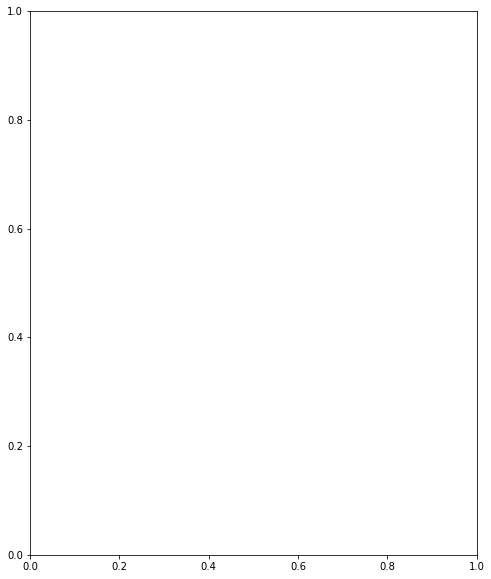

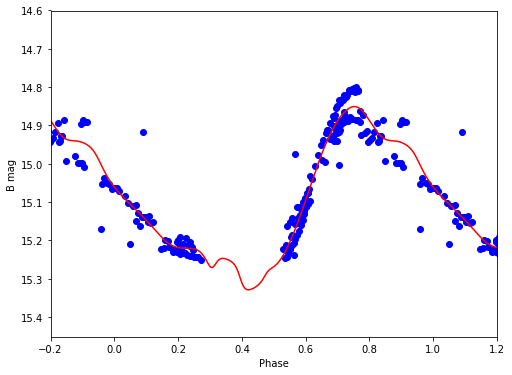

B 15.0953520058 0.477510170384


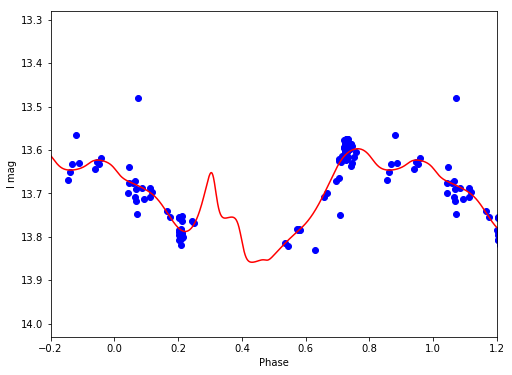

I 13.7103155371 0.261405387469


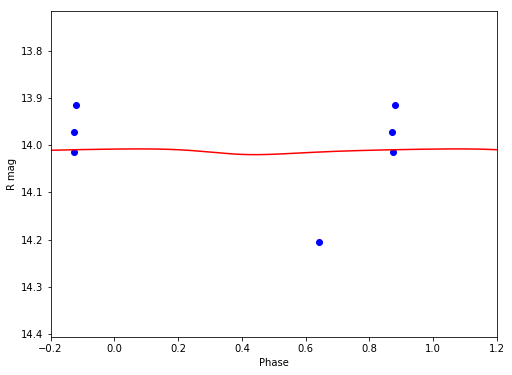

R 14.0128357845 0.0121804528515


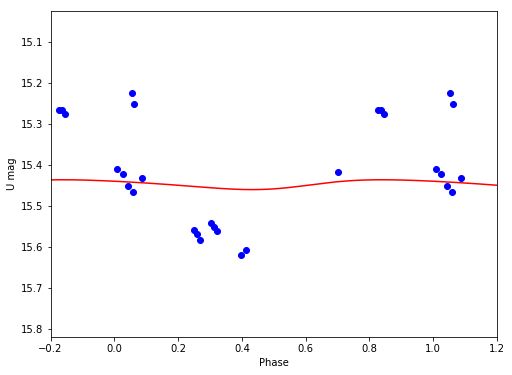

U 15.4477018015 0.0240595859643


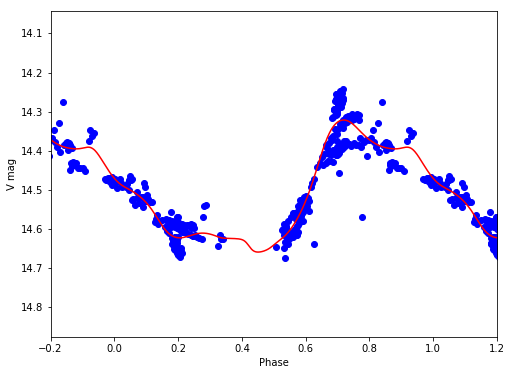

V 14.5070515589 0.337246897082
V67
/Volumes/Annie/CRRP/NGC3201/lcvs/V67.phased


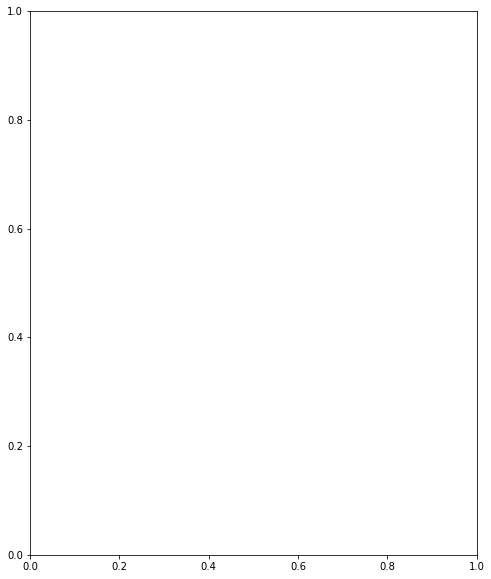

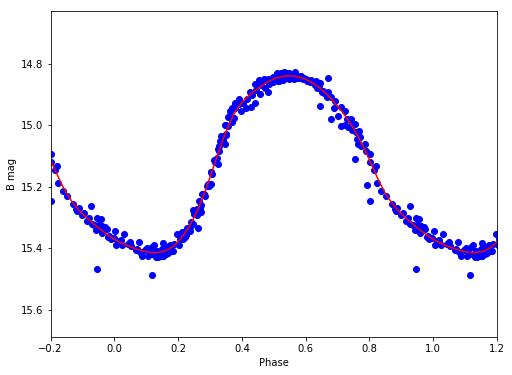

B 15.1082026956 0.574990311536


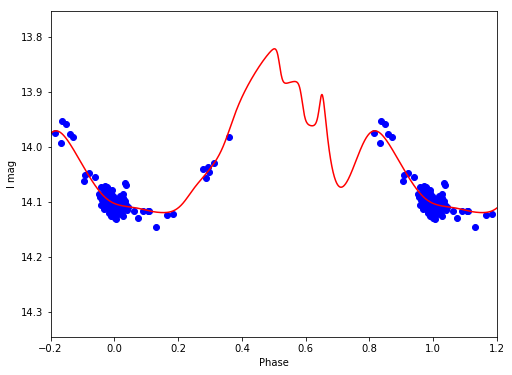

I 14.0056123385 0.297831056947


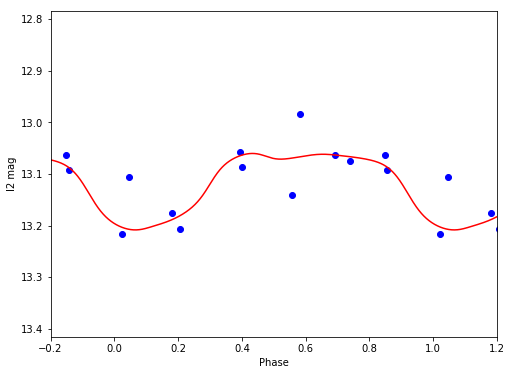

I2 13.1141274085 0.148393981304


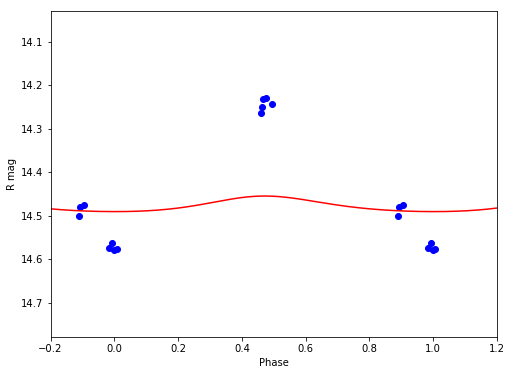

R 14.4757228441 0.0357768019904


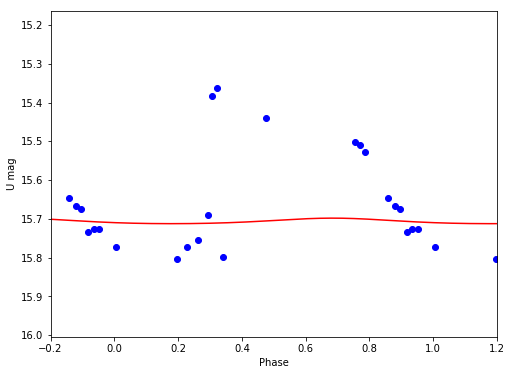

U 15.7061559148 0.0142465006113


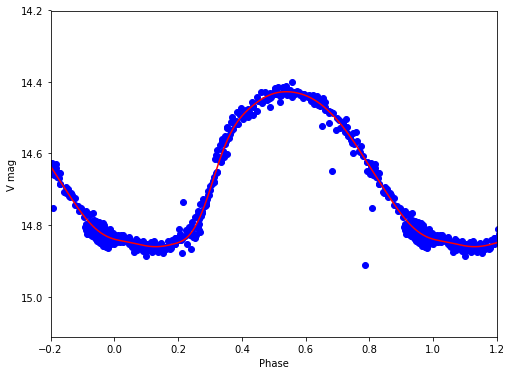

V 14.6399000886 0.43283989183
V69
/Volumes/Annie/CRRP/NGC3201/lcvs/V69.phased


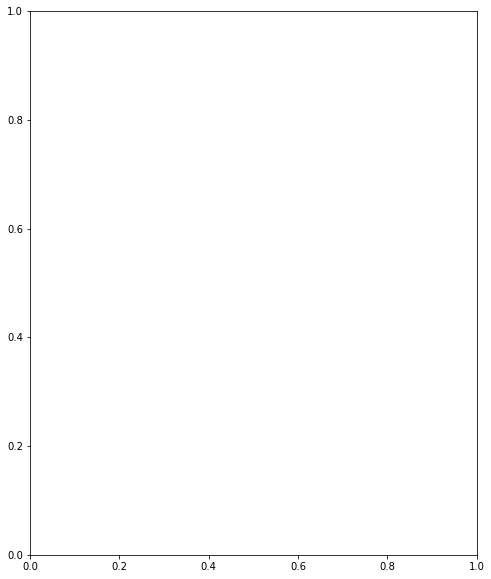

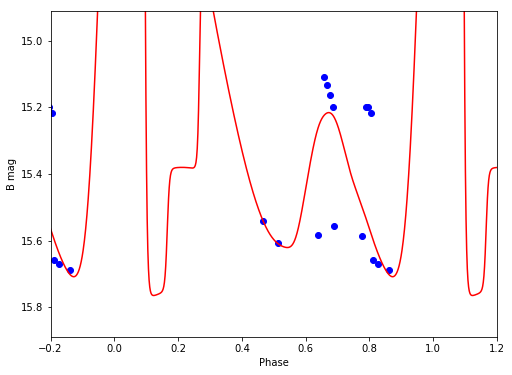

B 14.3404637359 4.10891365693


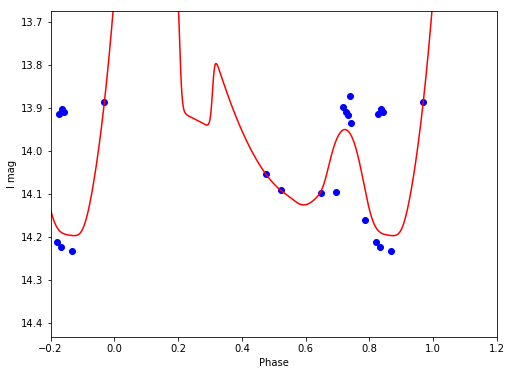

I 13.6934128018 2.20169932163


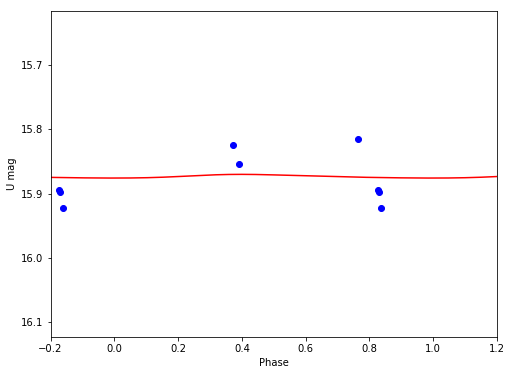

U 15.8732333858 0.00574951031793


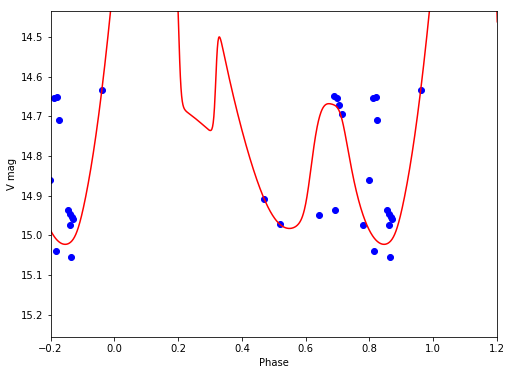

V 14.601092661 1.27755352202
V71
/Volumes/Annie/CRRP/NGC3201/lcvs/V71.phased


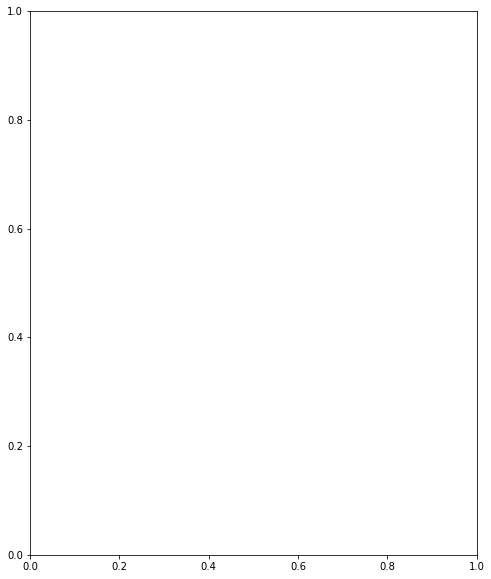

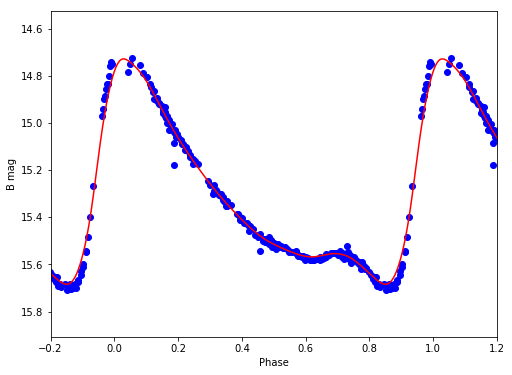

B 15.2735653761 0.956417227274


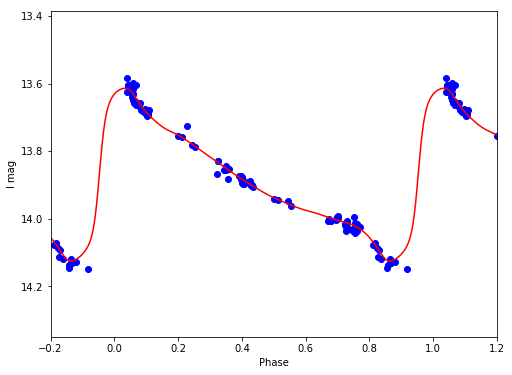

I 13.8750540704 0.512052156636


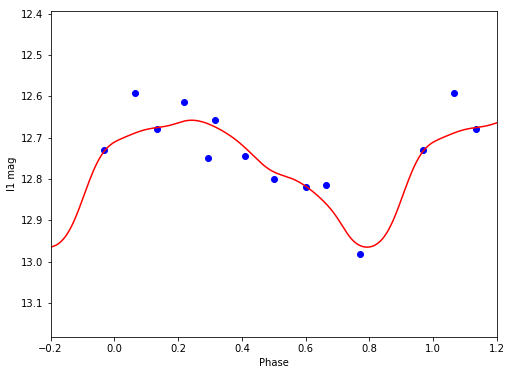

I1 12.7710047139 0.306988590862


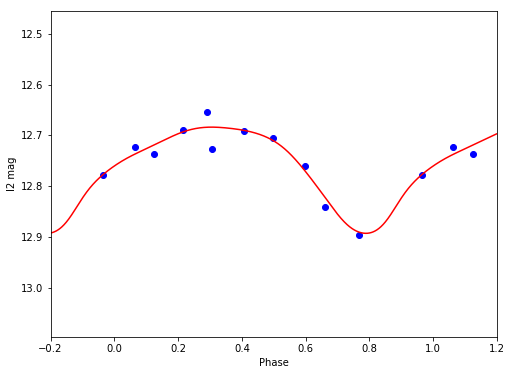

I2 12.7588226042 0.209366027505


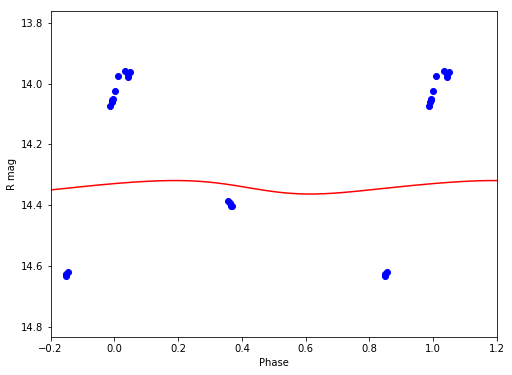

R 14.3398672415 0.044440268109


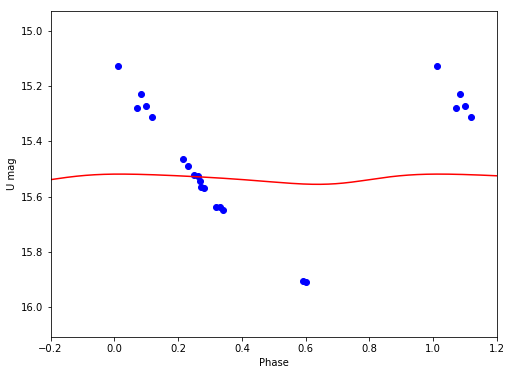

U 15.5347900043 0.0370859132453


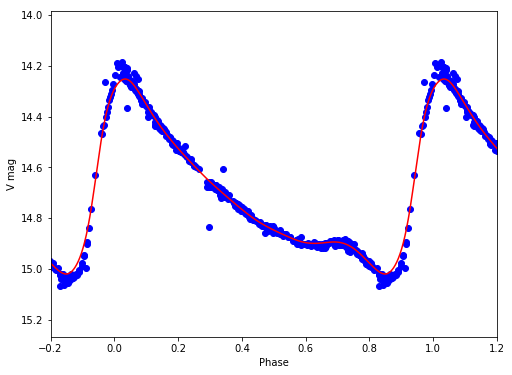

V 14.6857968087 0.765718800498
V72
/Volumes/Annie/CRRP/NGC3201/lcvs/V72.phased


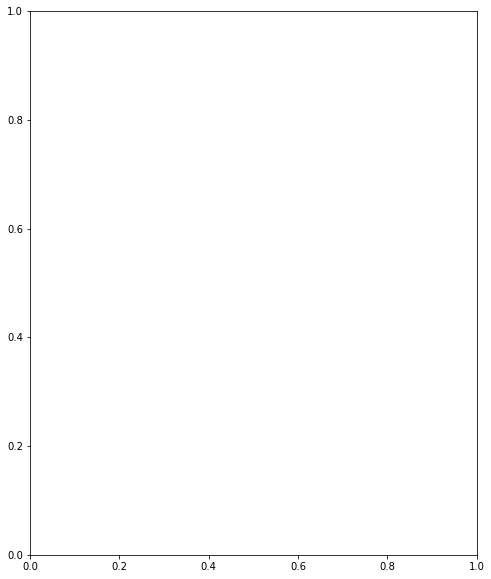

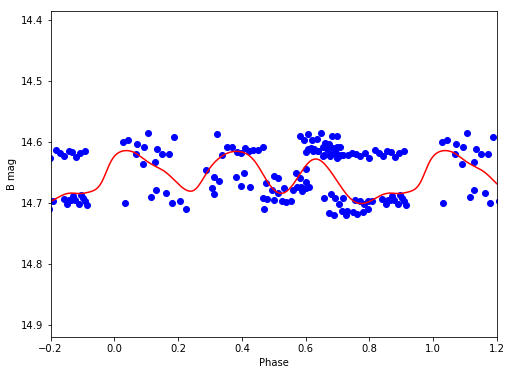

B 14.655466824 0.0868773804639


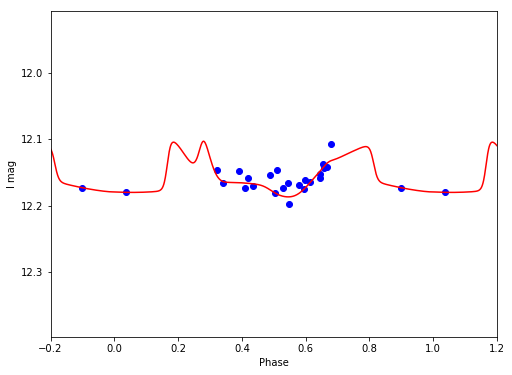

I 12.1565717173 0.0835829766383


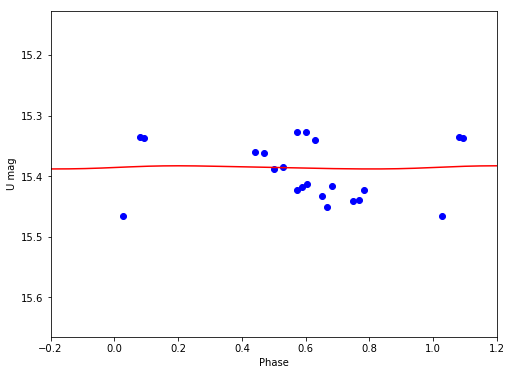

U 15.3851478383 0.00521404365518


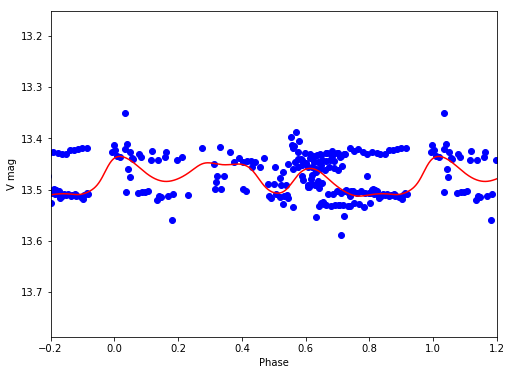

V 13.4769375421 0.0777286742279
V73
/Volumes/Annie/CRRP/NGC3201/lcvs/V73.phased


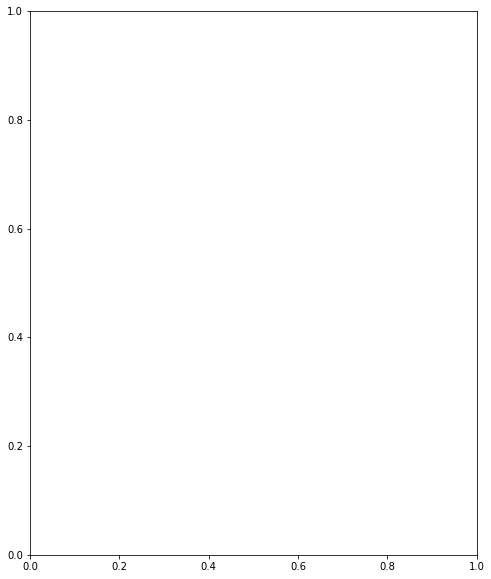

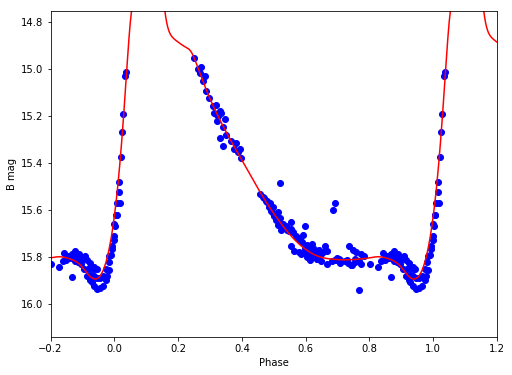

B 15.3416169349 1.46764926283


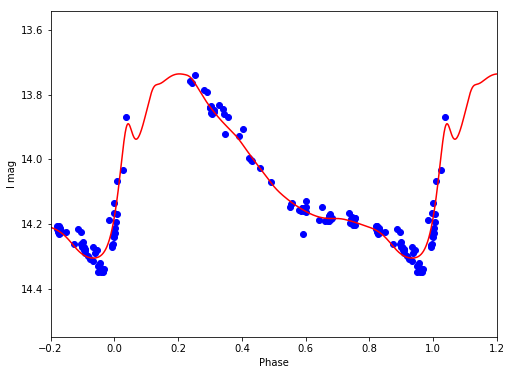

I 14.0276641618 0.569820444089


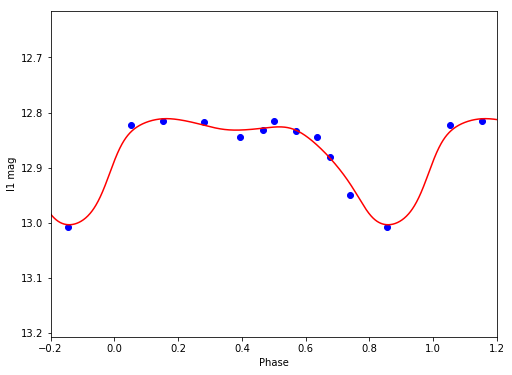

I1 12.8703673561 0.192542852282


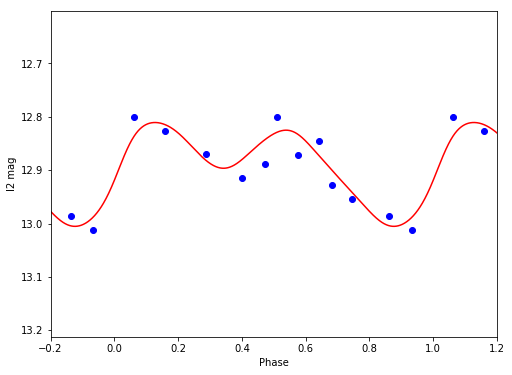

I2 12.8880600658 0.194523646546


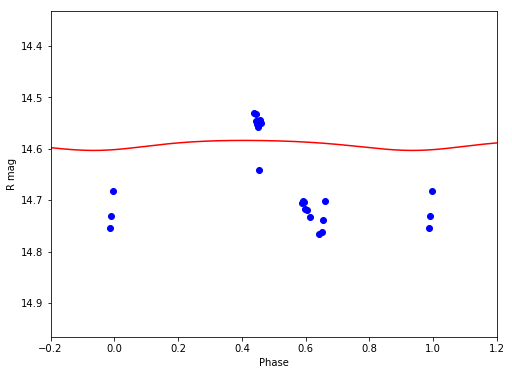

R 14.5916582683 0.019496626174


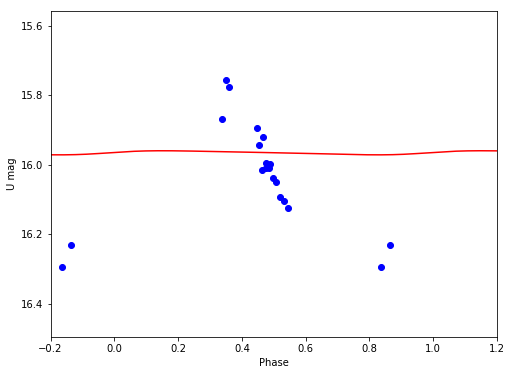

U 15.9656069139 0.0117919252603


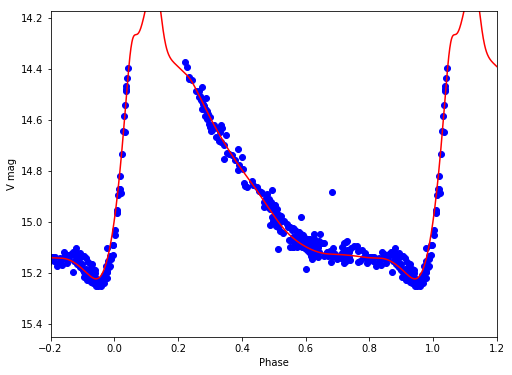

V 14.7780585724 1.16633633921
V76
/Volumes/Annie/CRRP/NGC3201/lcvs/V76.phased


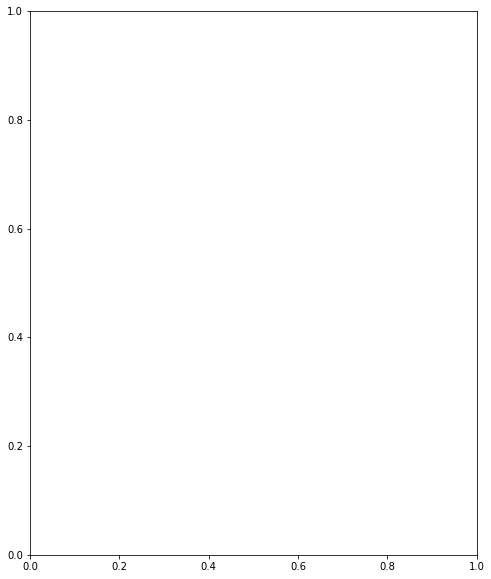

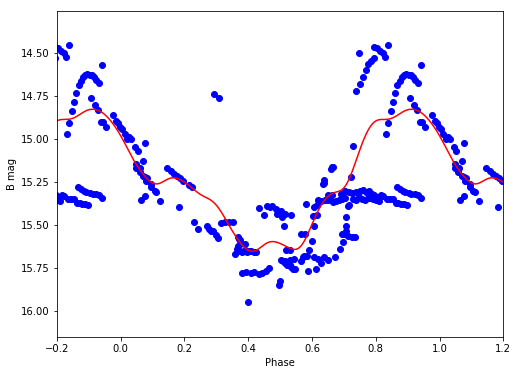

B 15.2310008558 0.826937923662


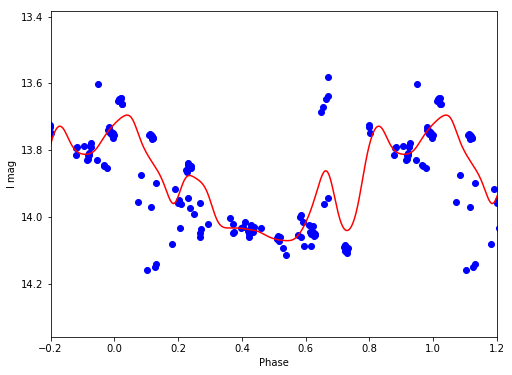

I 13.9012035002 0.376133648872


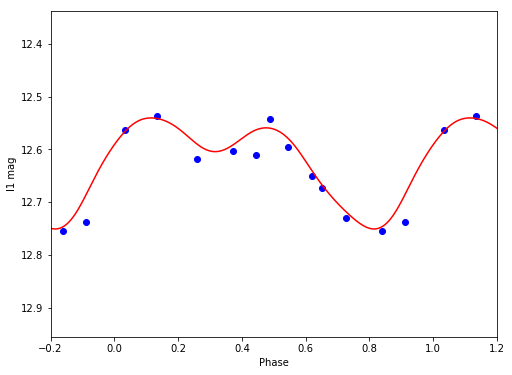

I1 12.6186936301 0.210429096003


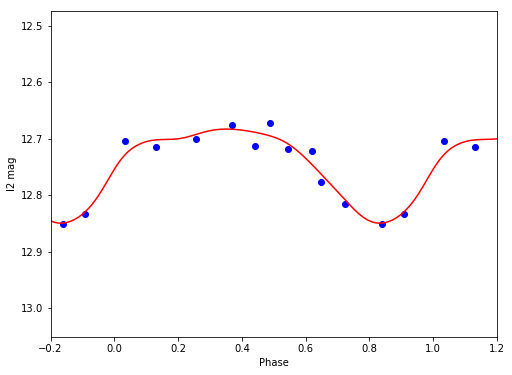

I2 12.7419516925 0.16676277204


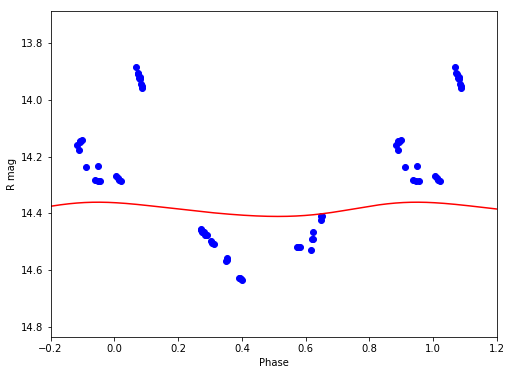

R 14.3871071744 0.0501452670615


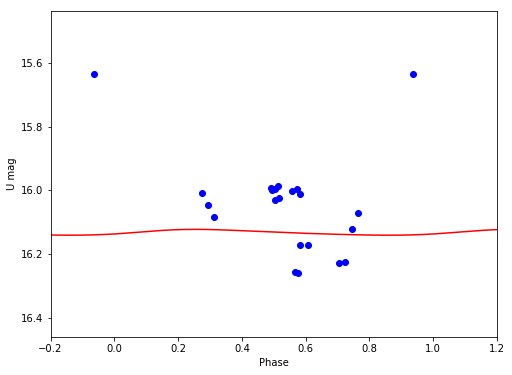

U 16.1326125109 0.0183403510083


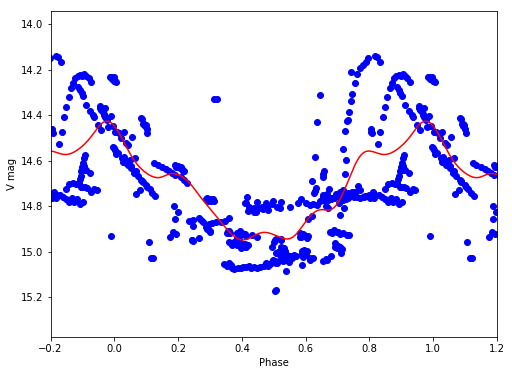

V 14.7070945633 0.521474605881
V77
/Volumes/Annie/CRRP/NGC3201/lcvs/V77.phased


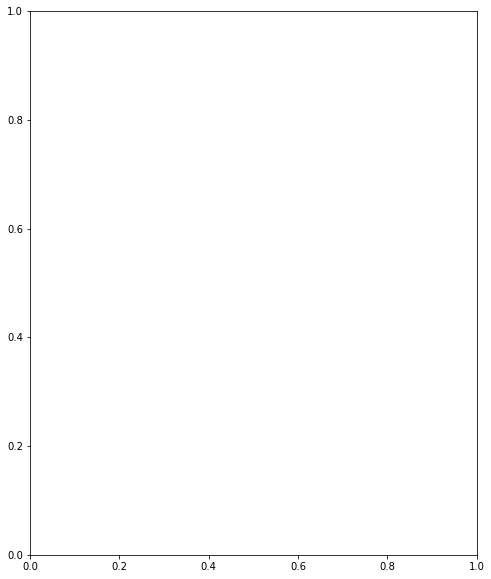

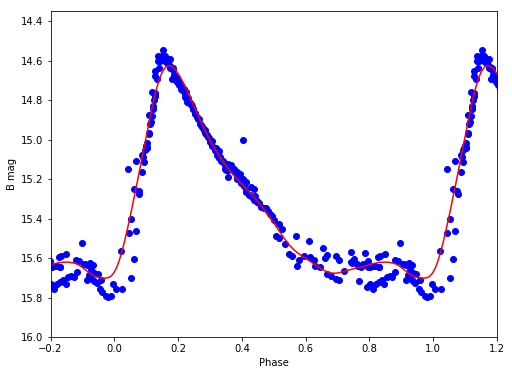

B 15.2913583572 1.07577855022


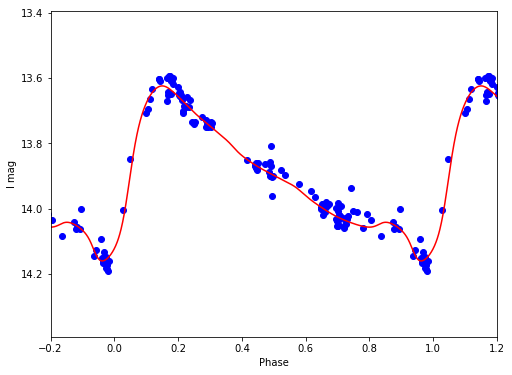

I 13.8923428078 0.535014917724


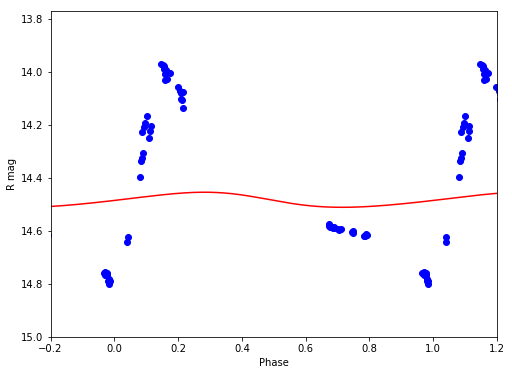

R 14.4843064628 0.0569250892865


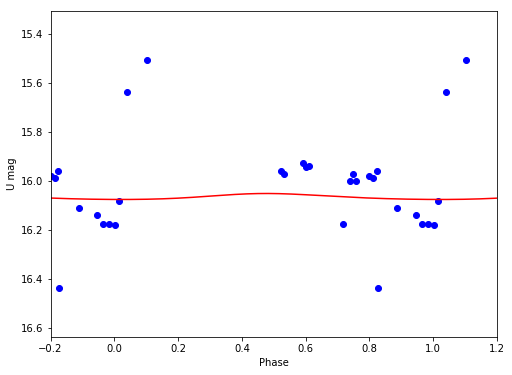

U 16.0651869568 0.0244676261688


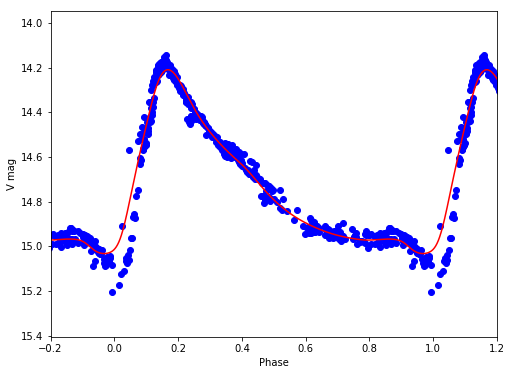

V 14.7102451889 0.823503118406
V78
/Volumes/Annie/CRRP/NGC3201/lcvs/V78.phased


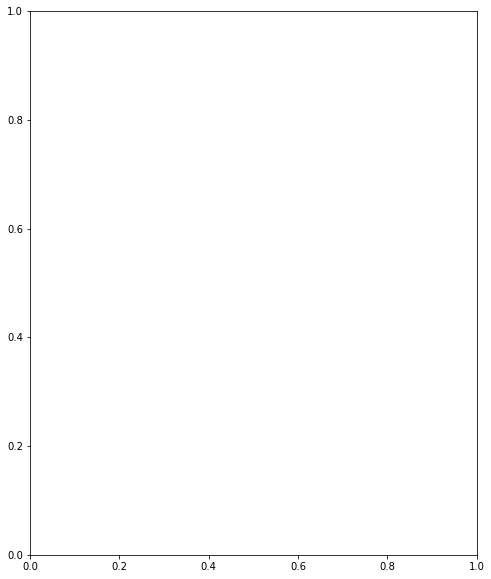

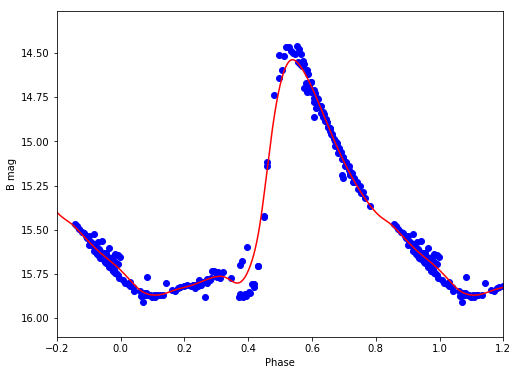

B 15.3490423845 1.3354049189


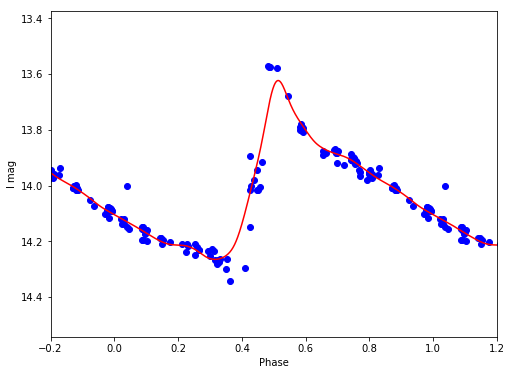

I 14.0077156956 0.641463729836


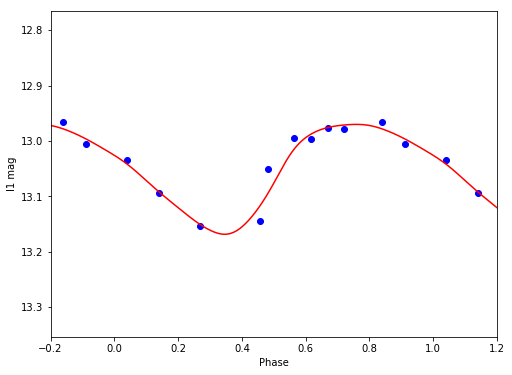

I1 13.0518199546 0.198094028119


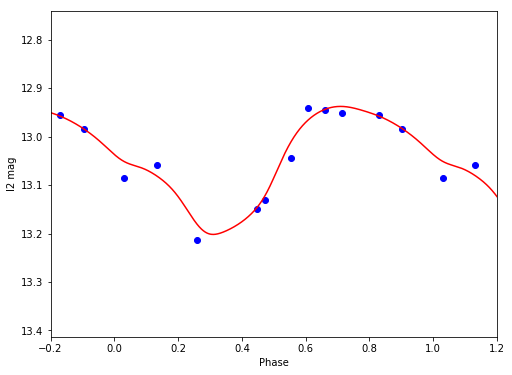

I2 13.0494841696 0.264139461021


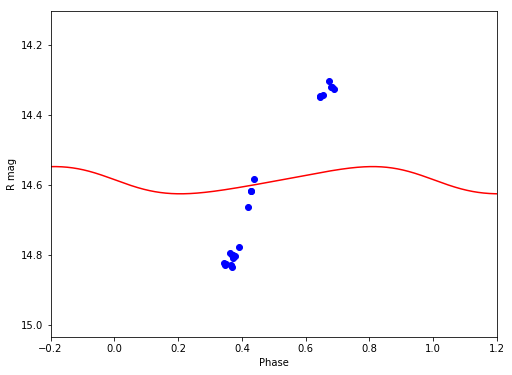

R 14.5869548099 0.07775699297


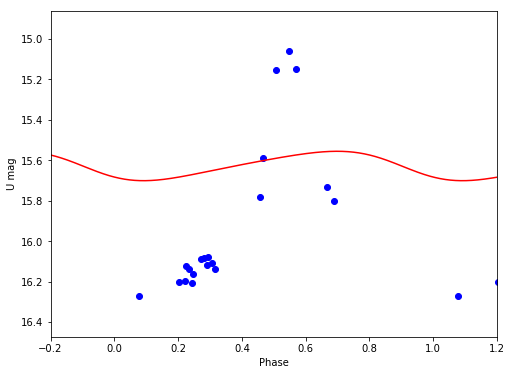

U 15.6237489537 0.145250572337


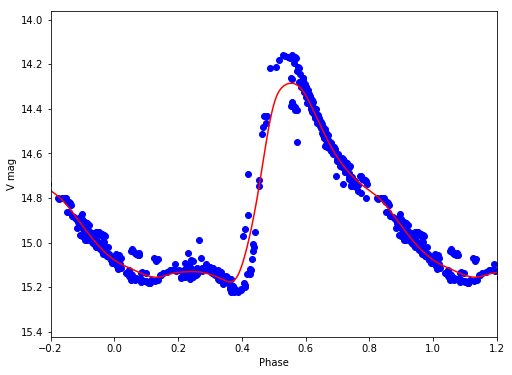

V 14.8227225329 0.892548374037
V80
/Volumes/Annie/CRRP/NGC3201/lcvs/V80.phased


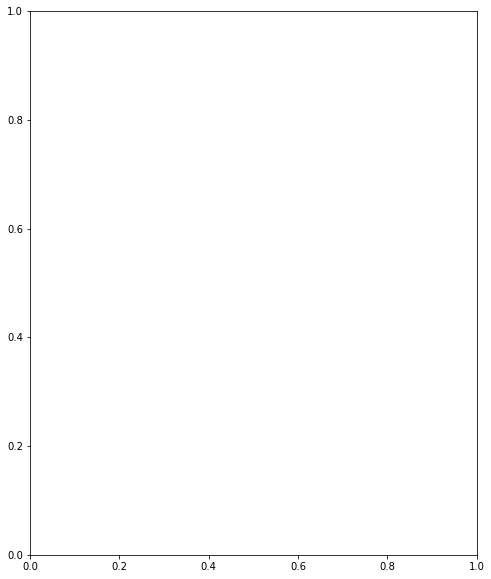

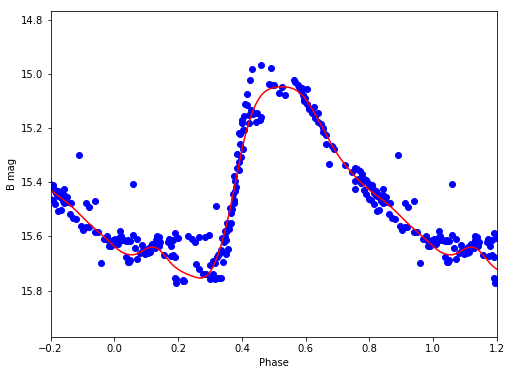

B 15.4144756102 0.706845337481


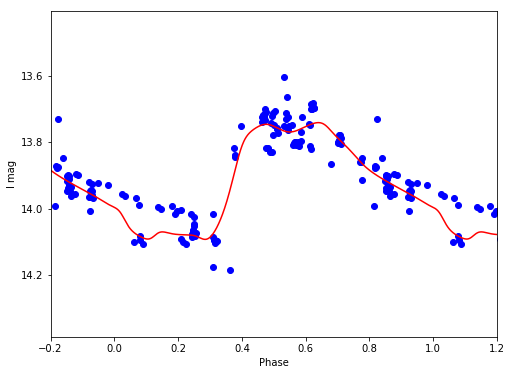

I 13.910094987 0.351185453553


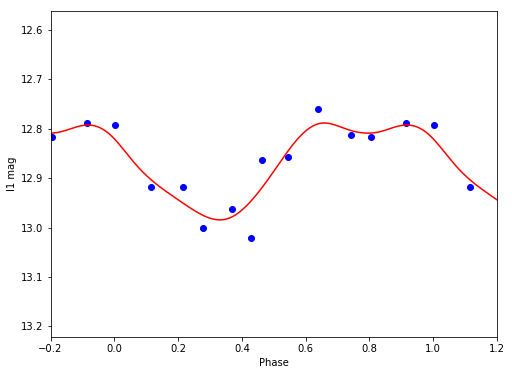

I1 12.8668650569 0.196108586928


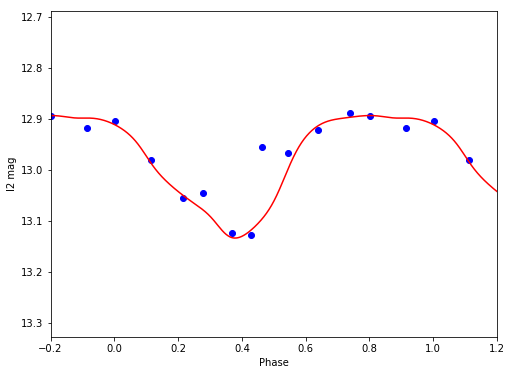

I2 12.9797963893 0.240356153164


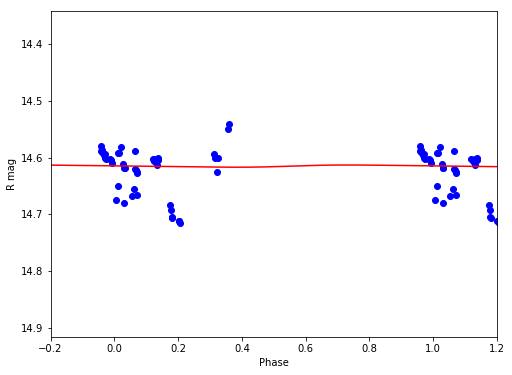

R 14.6150675317 0.0039089948048


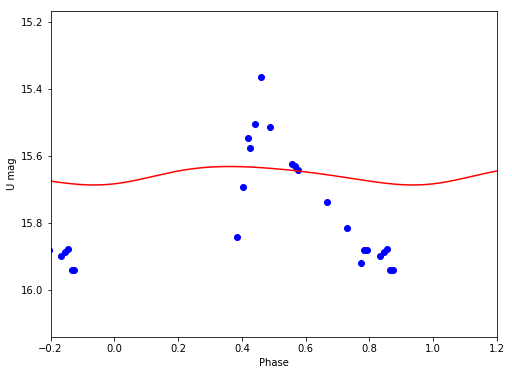

U 15.6563819353 0.0552574236967


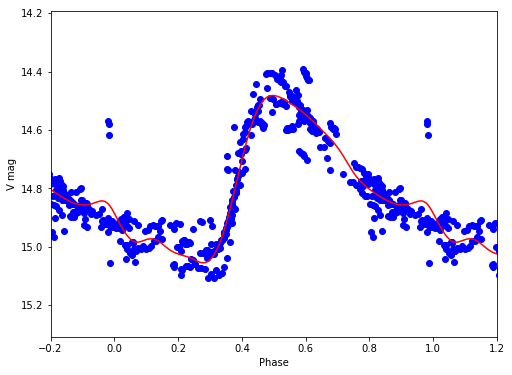

V 14.7823068082 0.572937701872
V81
/Volumes/Annie/CRRP/NGC3201/lcvs/V81.phased


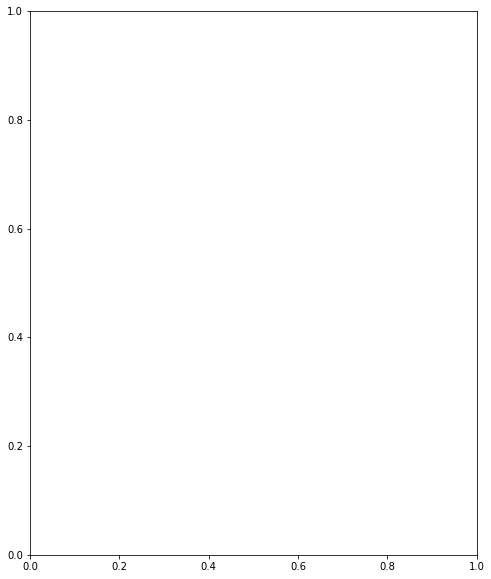

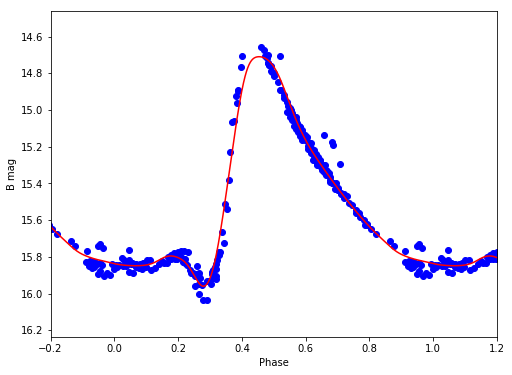

B 15.4292896772 1.24981763906


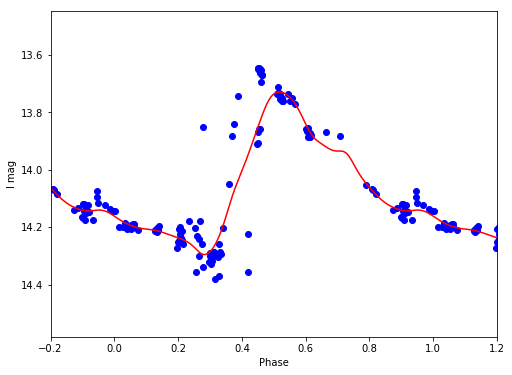

I 14.0460463238 0.566550847841


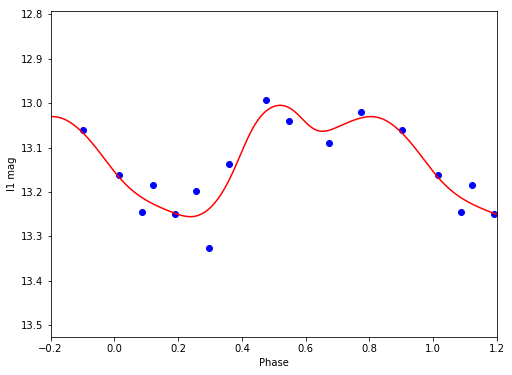

I1 13.1134969918 0.250579213909


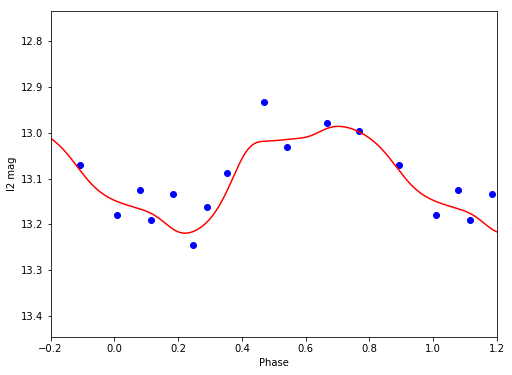

I2 13.0863492605 0.233541226851


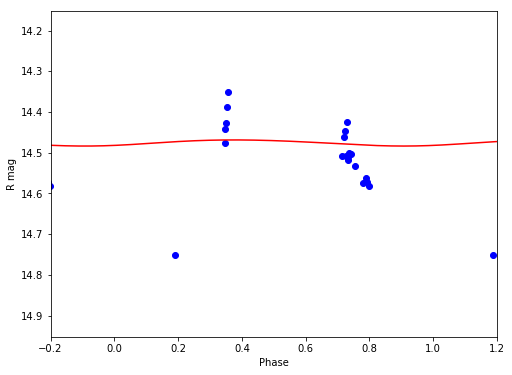

R 14.4756411566 0.0149982869103


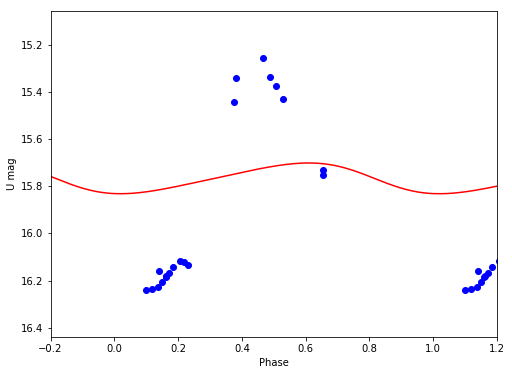

U 15.7650572756 0.130585219904


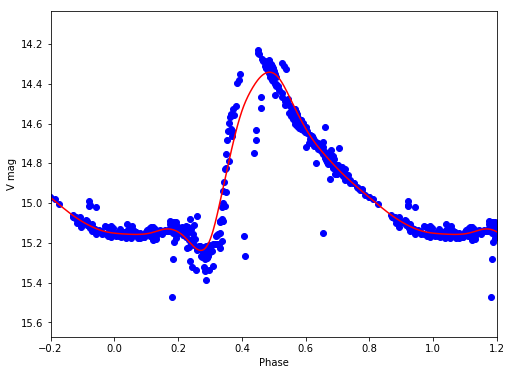

V 14.8639792287 0.89605731864
V83
/Volumes/Annie/CRRP/NGC3201/lcvs/V83.phased


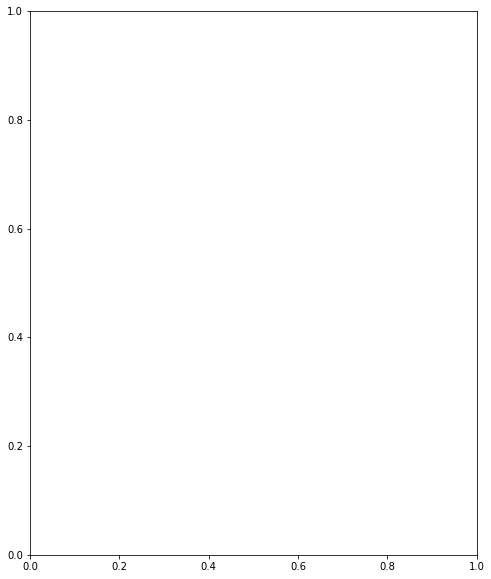

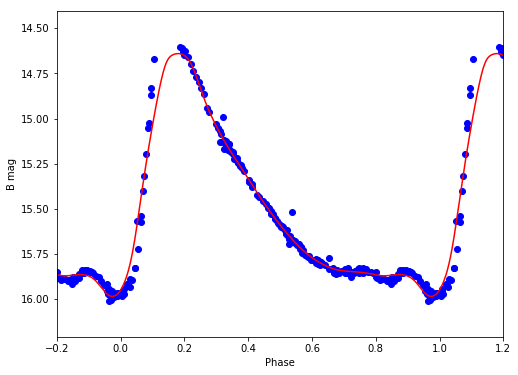

B 15.4033079937 1.34521831742


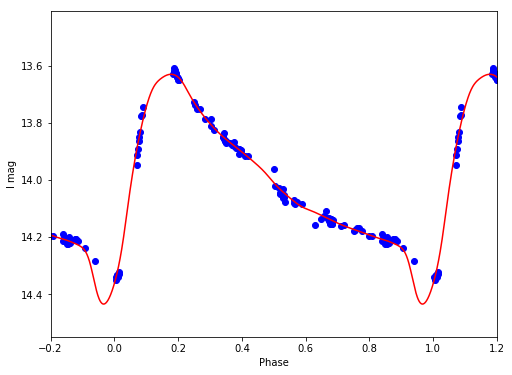

I 13.9930119798 0.803798232043


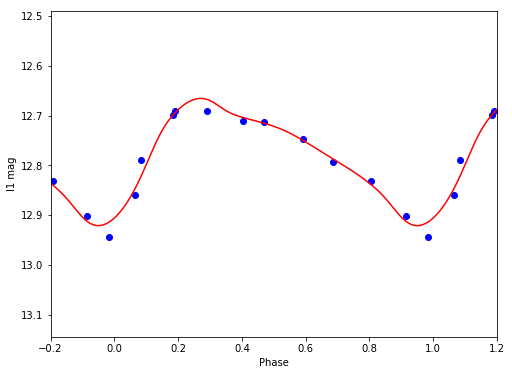

I1 12.7740950198 0.254703719939


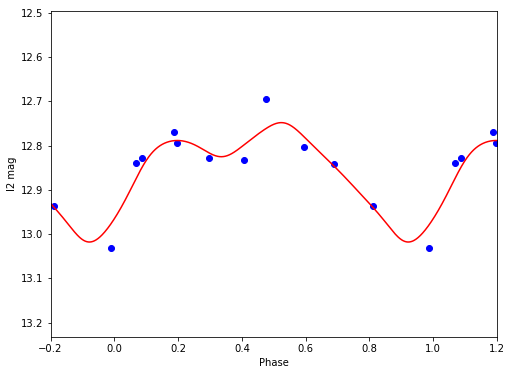

I2 12.85091727 0.269801414274


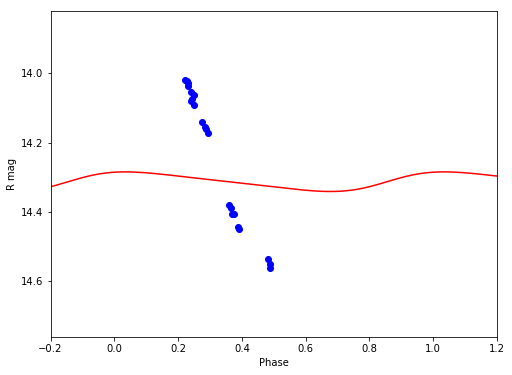

R 14.312799469 0.0566494491369


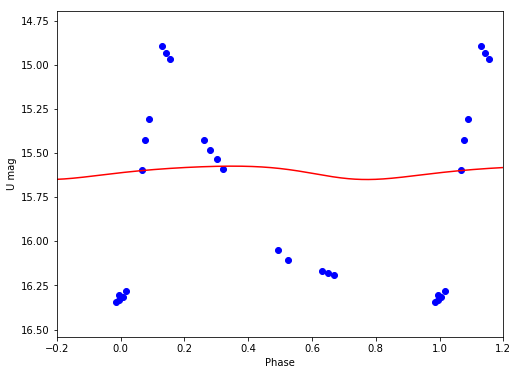

U 15.6050975946 0.0758322150023


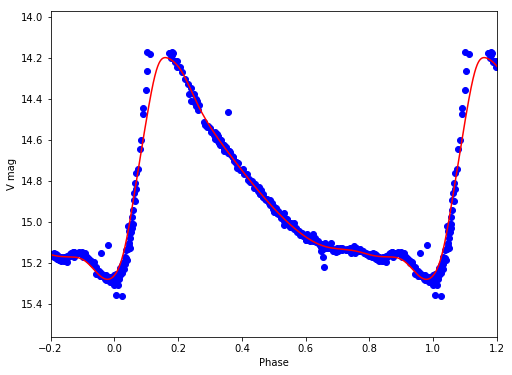

V 14.8215126406 1.08033948918
V84
/Volumes/Annie/CRRP/NGC3201/lcvs/V84.phased


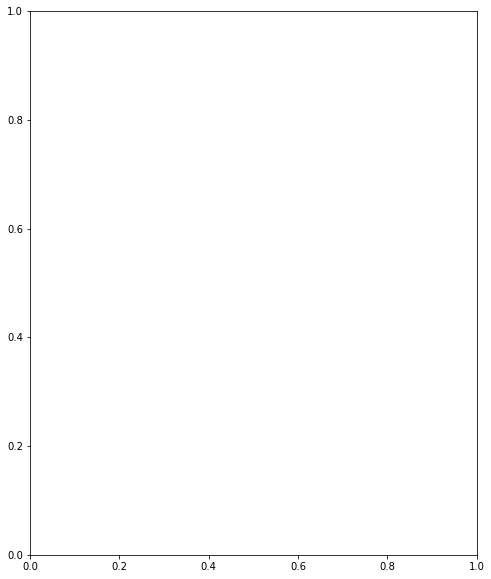

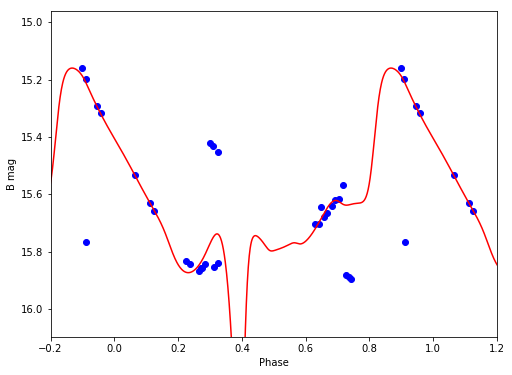

B 15.625225607 1.41480538649


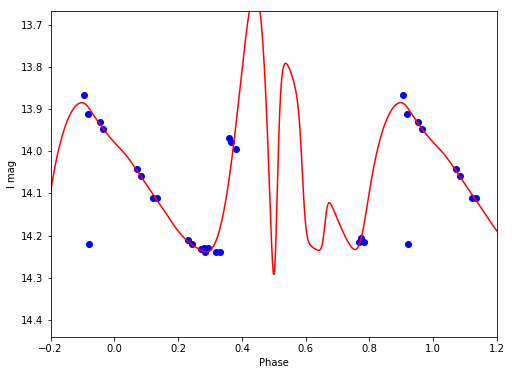

I 14.0330307797 0.669953387644


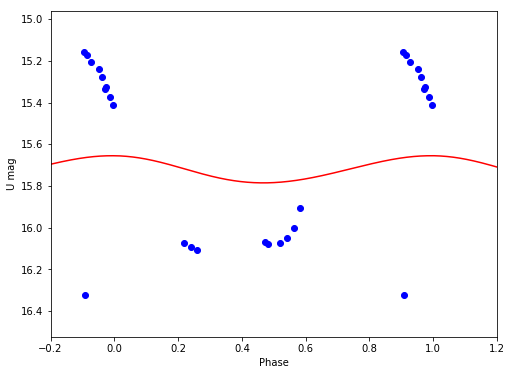

U 15.7198835072 0.130239073702


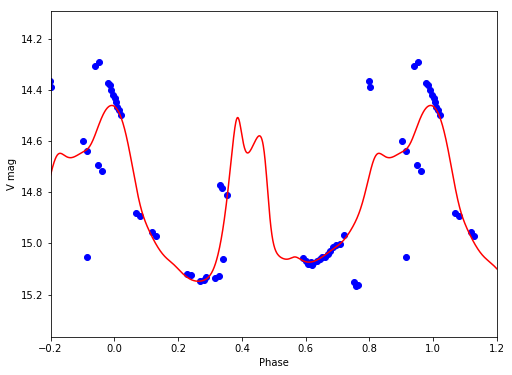

V 14.8337305264 0.687230080777
V87
V88
V89
/Volumes/Annie/CRRP/NGC3201/lcvs/V89.phased


lightcurves.py:1032: RankWarning: Polyfit may be poorly conditioned
  fit = np.polyfit(phase_copy, mag_copy, 2, w=1/weight)
lightcurves.py:1032: RankWarning: Polyfit may be poorly conditioned
  fit = np.polyfit(phase_copy, mag_copy, 2, w=1/weight)
lightcurves.py:1032: RankWarning: Polyfit may be poorly conditioned
  fit = np.polyfit(phase_copy, mag_copy, 2, w=1/weight)
lightcurves.py:1032: RankWarning: Polyfit may be poorly conditioned
  fit = np.polyfit(phase_copy, mag_copy, 2, w=1/weight)
lightcurves.py:1032: RankWarning: Polyfit may be poorly conditioned
  fit = np.polyfit(phase_copy, mag_copy, 2, w=1/weight)
lightcurves.py:1032: RankWarning: Polyfit may be poorly conditioned
  fit = np.polyfit(phase_copy, mag_copy, 2, w=1/weight)
lightcurves.py:1032: RankWarning: Polyfit may be poorly conditioned
  fit = np.polyfit(phase_copy, mag_copy, 2, w=1/weight)
lightcurves.py:1032: RankWarning: Polyfit may be poorly conditioned
  fit = np.polyfit(phase_copy, mag_copy, 2, w=1/weight)
lightcur

lightcurves.py:1032: RankWarning: Polyfit may be poorly conditioned
  fit = np.polyfit(phase_copy, mag_copy, 2, w=1/weight)
lightcurves.py:1032: RankWarning: Polyfit may be poorly conditioned
  fit = np.polyfit(phase_copy, mag_copy, 2, w=1/weight)
lightcurves.py:1032: RankWarning: Polyfit may be poorly conditioned
  fit = np.polyfit(phase_copy, mag_copy, 2, w=1/weight)
lightcurves.py:1032: RankWarning: Polyfit may be poorly conditioned
  fit = np.polyfit(phase_copy, mag_copy, 2, w=1/weight)
lightcurves.py:1032: RankWarning: Polyfit may be poorly conditioned
  fit = np.polyfit(phase_copy, mag_copy, 2, w=1/weight)
lightcurves.py:1032: RankWarning: Polyfit may be poorly conditioned
  fit = np.polyfit(phase_copy, mag_copy, 2, w=1/weight)
lightcurves.py:1032: RankWarning: Polyfit may be poorly conditioned
  fit = np.polyfit(phase_copy, mag_copy, 2, w=1/weight)
lightcurves.py:1032: RankWarning: Polyfit may be poorly conditioned
  fit = np.polyfit(phase_copy, mag_copy, 2, w=1/weight)
lightcur

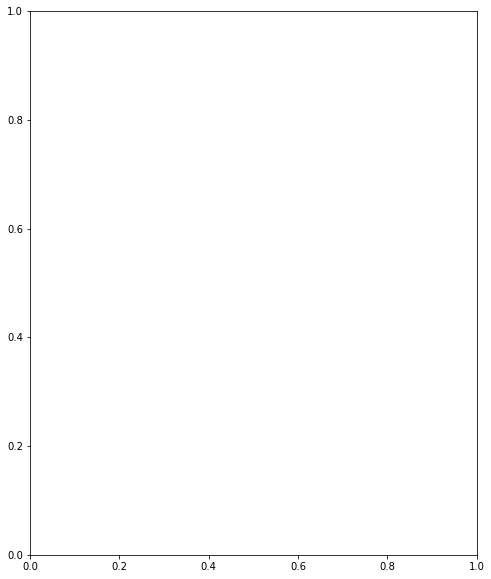

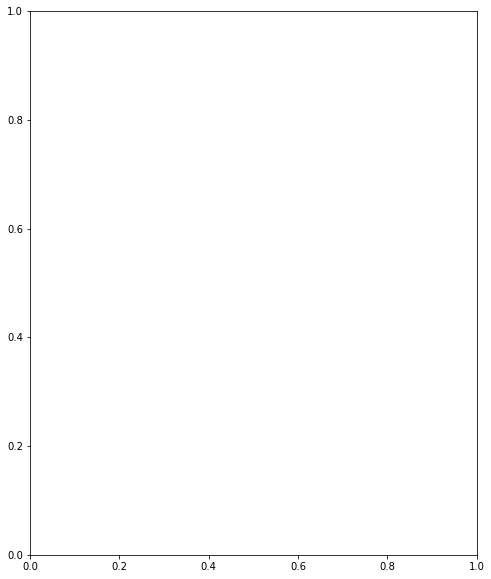

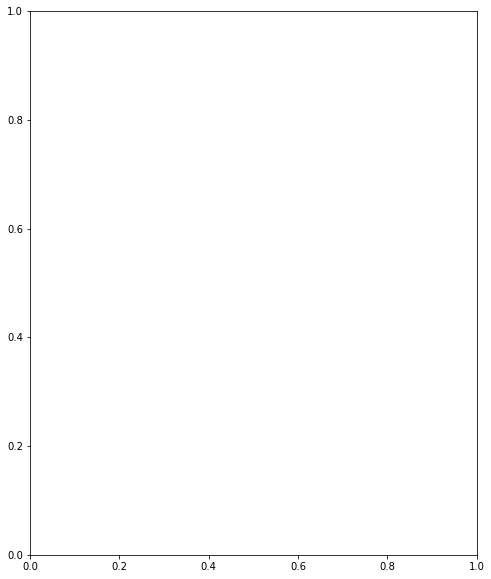

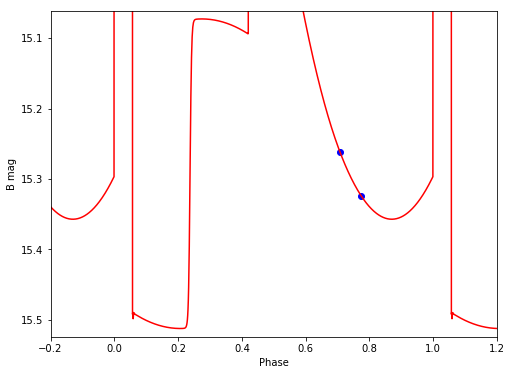

B 13.9992875861 4.92588364636


lightcurves.py:1032: RankWarning: Polyfit may be poorly conditioned
  fit = np.polyfit(phase_copy, mag_copy, 2, w=1/weight)
lightcurves.py:1032: RankWarning: Polyfit may be poorly conditioned
  fit = np.polyfit(phase_copy, mag_copy, 2, w=1/weight)
lightcurves.py:1032: RankWarning: Polyfit may be poorly conditioned
  fit = np.polyfit(phase_copy, mag_copy, 2, w=1/weight)
lightcurves.py:1032: RankWarning: Polyfit may be poorly conditioned
  fit = np.polyfit(phase_copy, mag_copy, 2, w=1/weight)
lightcurves.py:1032: RankWarning: Polyfit may be poorly conditioned
  fit = np.polyfit(phase_copy, mag_copy, 2, w=1/weight)
lightcurves.py:1032: RankWarning: Polyfit may be poorly conditioned
  fit = np.polyfit(phase_copy, mag_copy, 2, w=1/weight)
lightcurves.py:1032: RankWarning: Polyfit may be poorly conditioned
  fit = np.polyfit(phase_copy, mag_copy, 2, w=1/weight)
lightcurves.py:1032: RankWarning: Polyfit may be poorly conditioned
  fit = np.polyfit(phase_copy, mag_copy, 2, w=1/weight)
lightcur

lightcurves.py:1032: RankWarning: Polyfit may be poorly conditioned
  fit = np.polyfit(phase_copy, mag_copy, 2, w=1/weight)
lightcurves.py:1032: RankWarning: Polyfit may be poorly conditioned
  fit = np.polyfit(phase_copy, mag_copy, 2, w=1/weight)
lightcurves.py:1032: RankWarning: Polyfit may be poorly conditioned
  fit = np.polyfit(phase_copy, mag_copy, 2, w=1/weight)
lightcurves.py:1032: RankWarning: Polyfit may be poorly conditioned
  fit = np.polyfit(phase_copy, mag_copy, 2, w=1/weight)
lightcurves.py:1032: RankWarning: Polyfit may be poorly conditioned
  fit = np.polyfit(phase_copy, mag_copy, 2, w=1/weight)
lightcurves.py:1032: RankWarning: Polyfit may be poorly conditioned
  fit = np.polyfit(phase_copy, mag_copy, 2, w=1/weight)
lightcurves.py:1032: RankWarning: Polyfit may be poorly conditioned
  fit = np.polyfit(phase_copy, mag_copy, 2, w=1/weight)
lightcurves.py:1032: RankWarning: Polyfit may be poorly conditioned
  fit = np.polyfit(phase_copy, mag_copy, 2, w=1/weight)
lightcur

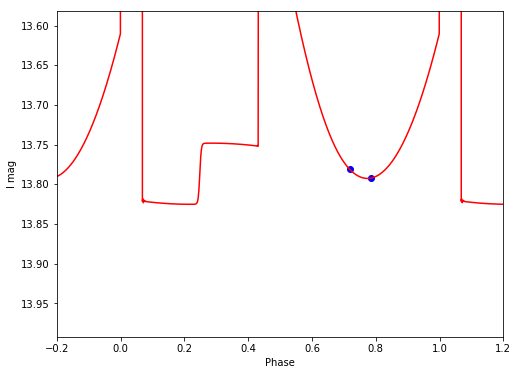

I 12.4096570794 4.79713402761


lightcurves.py:1032: RankWarning: Polyfit may be poorly conditioned
  fit = np.polyfit(phase_copy, mag_copy, 2, w=1/weight)
lightcurves.py:1032: RankWarning: Polyfit may be poorly conditioned
  fit = np.polyfit(phase_copy, mag_copy, 2, w=1/weight)
lightcurves.py:1032: RankWarning: Polyfit may be poorly conditioned
  fit = np.polyfit(phase_copy, mag_copy, 2, w=1/weight)
lightcurves.py:1032: RankWarning: Polyfit may be poorly conditioned
  fit = np.polyfit(phase_copy, mag_copy, 2, w=1/weight)
lightcurves.py:1032: RankWarning: Polyfit may be poorly conditioned
  fit = np.polyfit(phase_copy, mag_copy, 2, w=1/weight)
lightcurves.py:1032: RankWarning: Polyfit may be poorly conditioned
  fit = np.polyfit(phase_copy, mag_copy, 2, w=1/weight)
lightcurves.py:1032: RankWarning: Polyfit may be poorly conditioned
  fit = np.polyfit(phase_copy, mag_copy, 2, w=1/weight)
lightcurves.py:1032: RankWarning: Polyfit may be poorly conditioned
  fit = np.polyfit(phase_copy, mag_copy, 2, w=1/weight)
lightcur

lightcurves.py:1032: RankWarning: Polyfit may be poorly conditioned
  fit = np.polyfit(phase_copy, mag_copy, 2, w=1/weight)
lightcurves.py:1032: RankWarning: Polyfit may be poorly conditioned
  fit = np.polyfit(phase_copy, mag_copy, 2, w=1/weight)
lightcurves.py:1032: RankWarning: Polyfit may be poorly conditioned
  fit = np.polyfit(phase_copy, mag_copy, 2, w=1/weight)
lightcurves.py:1032: RankWarning: Polyfit may be poorly conditioned
  fit = np.polyfit(phase_copy, mag_copy, 2, w=1/weight)
lightcurves.py:1032: RankWarning: Polyfit may be poorly conditioned
  fit = np.polyfit(phase_copy, mag_copy, 2, w=1/weight)
lightcurves.py:1032: RankWarning: Polyfit may be poorly conditioned
  fit = np.polyfit(phase_copy, mag_copy, 2, w=1/weight)
lightcurves.py:1032: RankWarning: Polyfit may be poorly conditioned
  fit = np.polyfit(phase_copy, mag_copy, 2, w=1/weight)
lightcurves.py:1032: RankWarning: Polyfit may be poorly conditioned
  fit = np.polyfit(phase_copy, mag_copy, 2, w=1/weight)
lightcur

lightcurves.py:1032: RankWarning: Polyfit may be poorly conditioned
  fit = np.polyfit(phase_copy, mag_copy, 2, w=1/weight)
lightcurves.py:1032: RankWarning: Polyfit may be poorly conditioned
  fit = np.polyfit(phase_copy, mag_copy, 2, w=1/weight)
lightcurves.py:1032: RankWarning: Polyfit may be poorly conditioned
  fit = np.polyfit(phase_copy, mag_copy, 2, w=1/weight)
lightcurves.py:1032: RankWarning: Polyfit may be poorly conditioned
  fit = np.polyfit(phase_copy, mag_copy, 2, w=1/weight)
lightcurves.py:1032: RankWarning: Polyfit may be poorly conditioned
  fit = np.polyfit(phase_copy, mag_copy, 2, w=1/weight)
lightcurves.py:1032: RankWarning: Polyfit may be poorly conditioned
  fit = np.polyfit(phase_copy, mag_copy, 2, w=1/weight)
lightcurves.py:1032: RankWarning: Polyfit may be poorly conditioned
  fit = np.polyfit(phase_copy, mag_copy, 2, w=1/weight)
lightcurves.py:1032: RankWarning: Polyfit may be poorly conditioned
  fit = np.polyfit(phase_copy, mag_copy, 2, w=1/weight)
lightcur

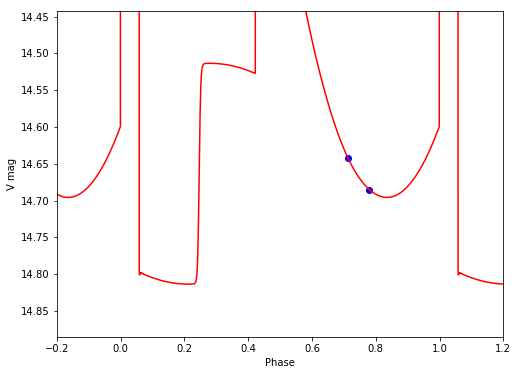

V 13.4165409206 4.78080981542
V90
/Volumes/Annie/CRRP/NGC3201/lcvs/V90.phased


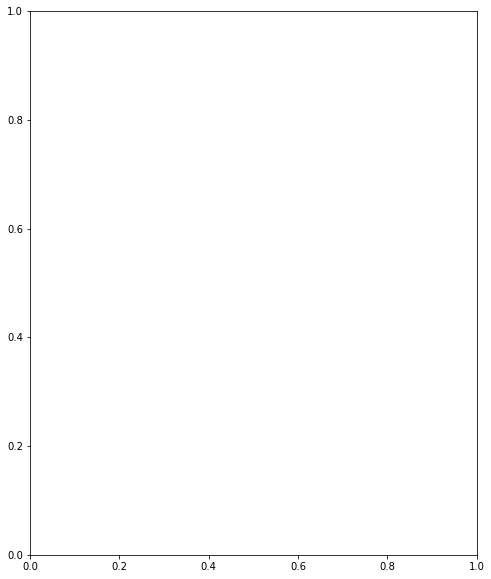

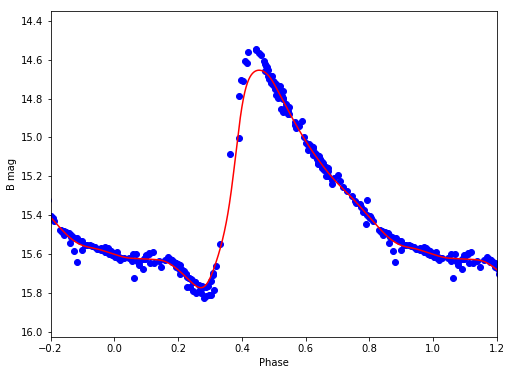

B 15.2895974198 1.1203320553


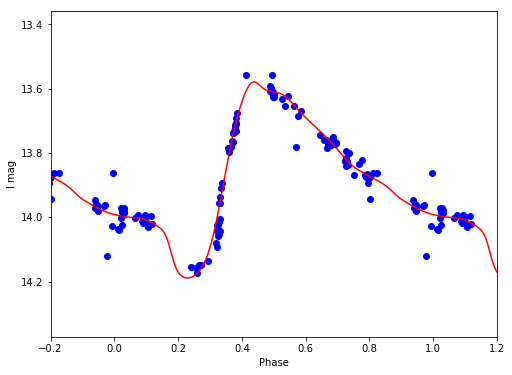

I 13.8629769992 0.610254142259


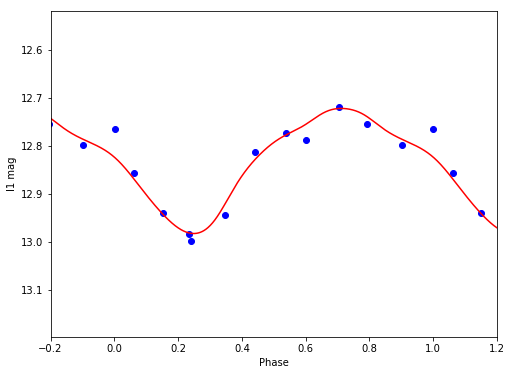

I1 12.8290131028 0.260836218116


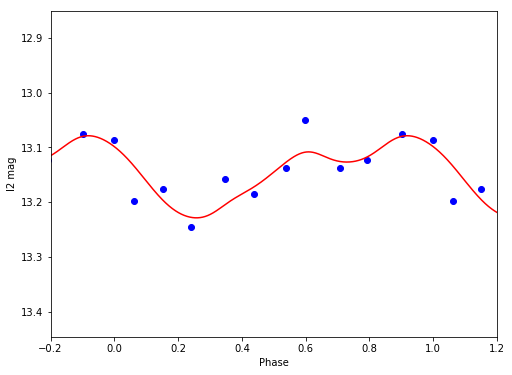

I2 13.1449239194 0.150025083172


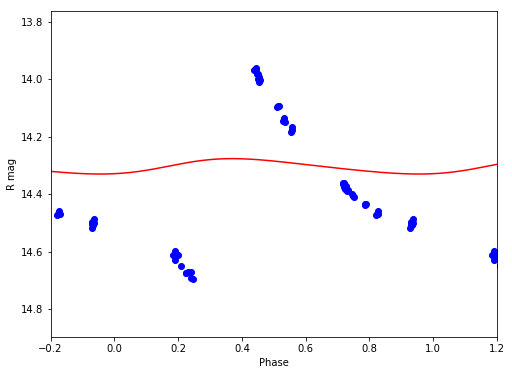

R 14.3038418103 0.0536728620289


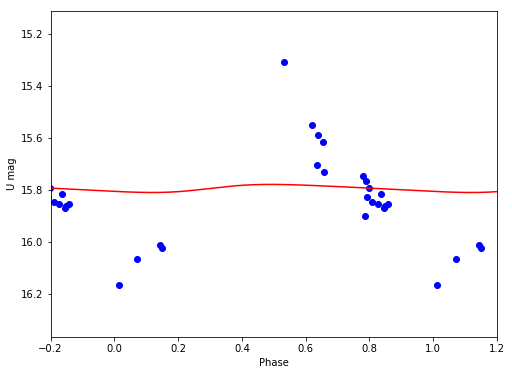

U 15.7942692953 0.0311909115666


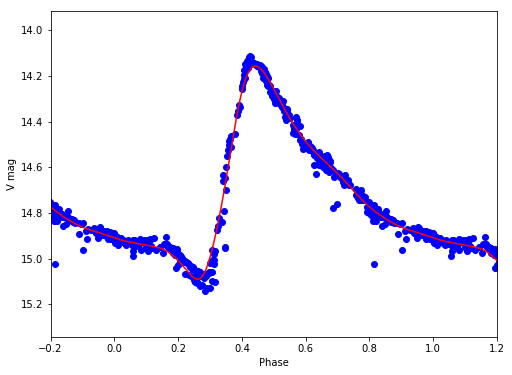

V 14.6784807766 0.933638320714
V91
V92
/Volumes/Annie/CRRP/NGC3201/lcvs/V92.phased


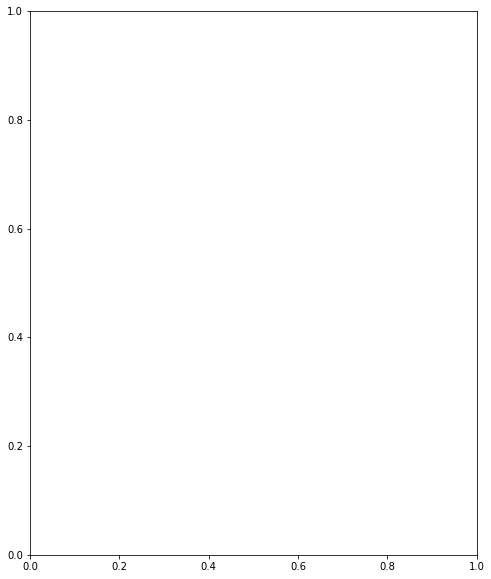

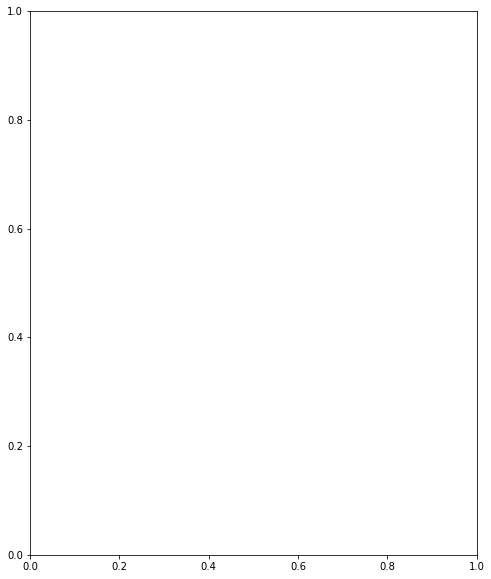

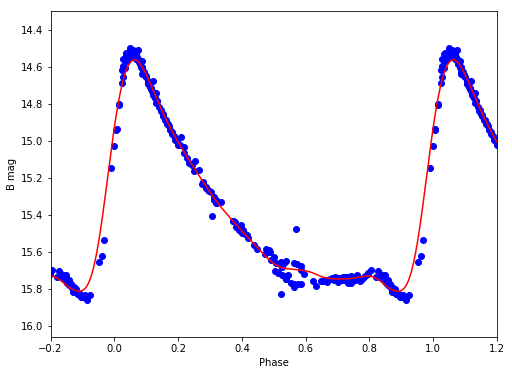

B 15.3211701173 1.25232773362


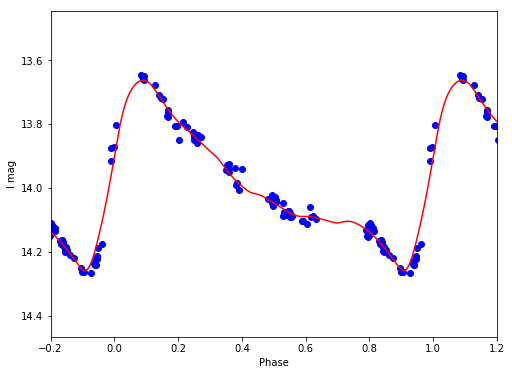

I 13.9722992333 0.595480825591


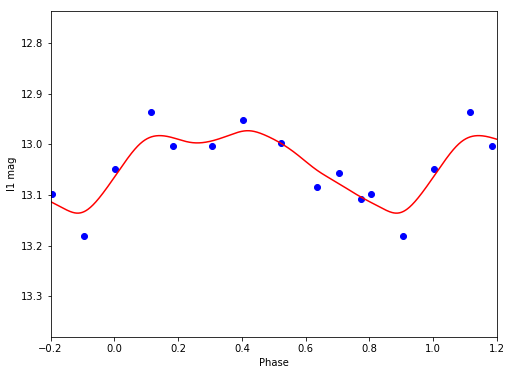

I1 13.0346832214 0.162760893252


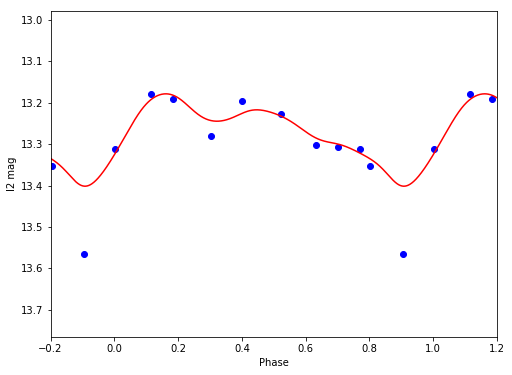

I2 13.2697837242 0.222885295883


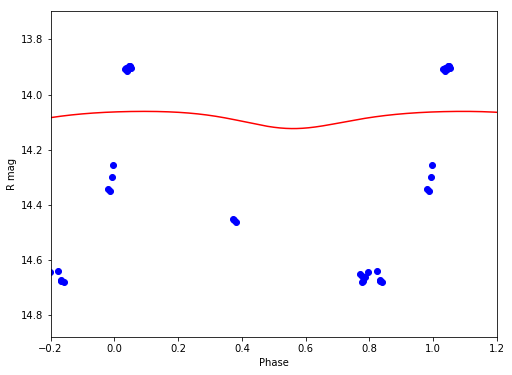

R 14.0857042577 0.0623008291793


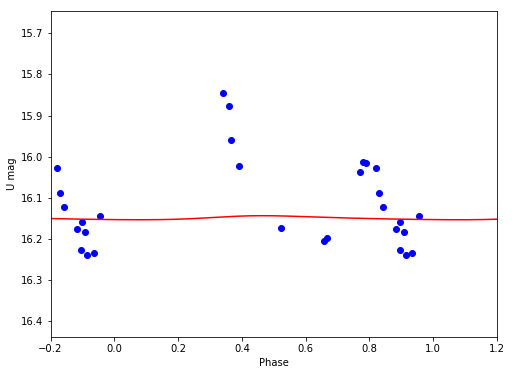

U 16.1491875359 0.0098856951265


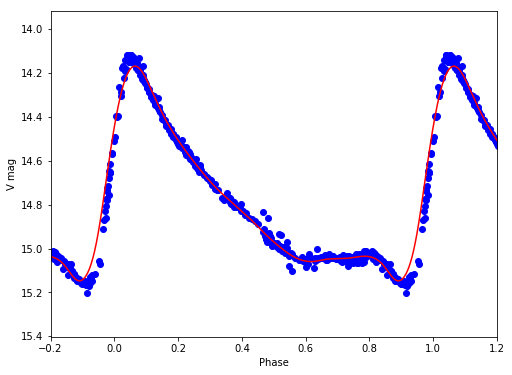

V 14.7530606124 0.978171860489
V93
V96
V98
/Volumes/Annie/CRRP/NGC3201/lcvs/V98.phased


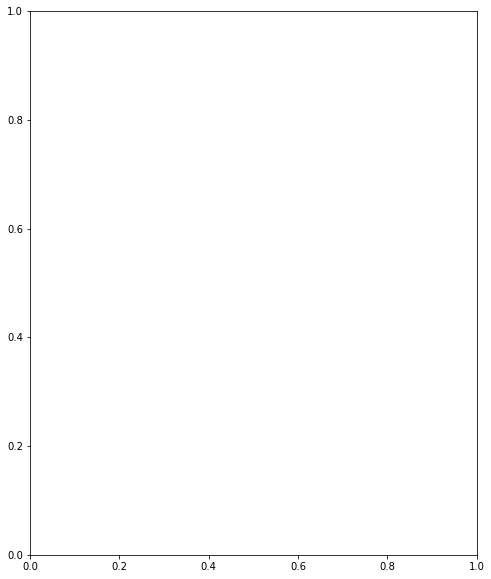

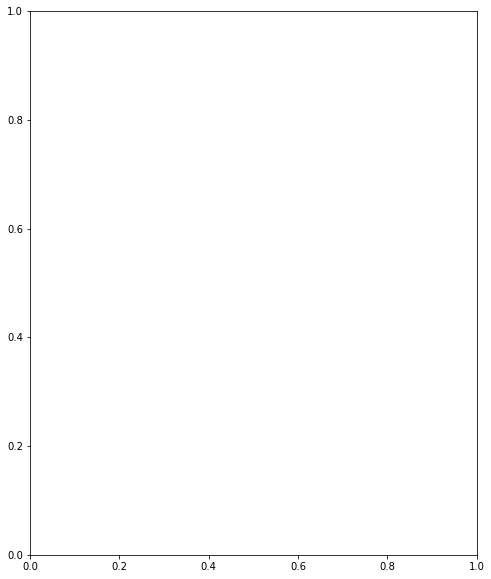

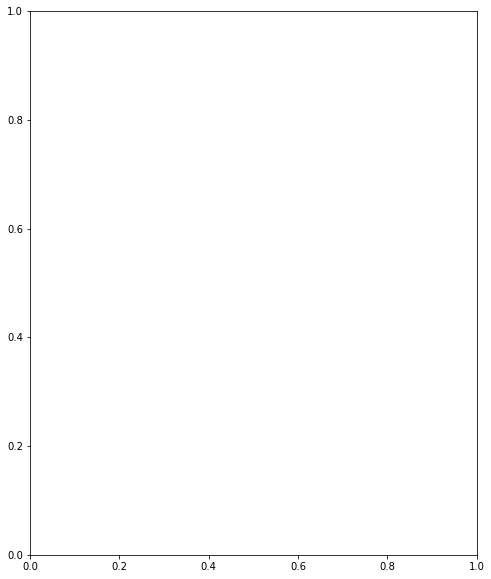

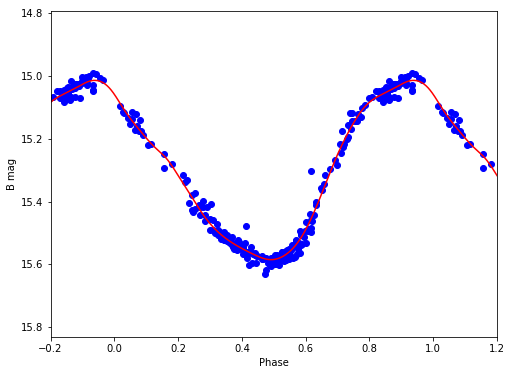

B 15.2845063163 0.571093417678


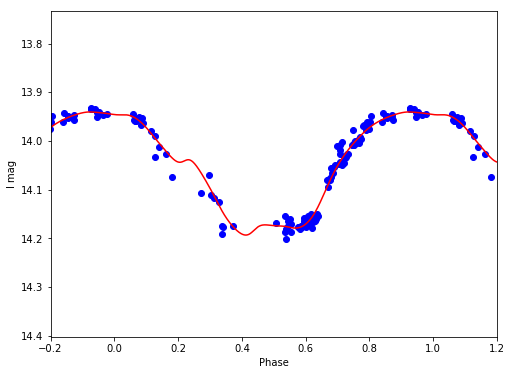

I 14.0506342124 0.252904700896


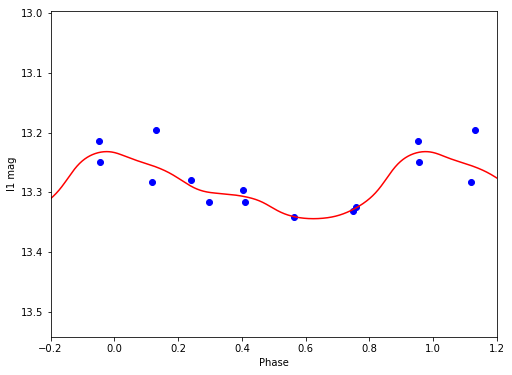

I1 13.2931512127 0.112263247354


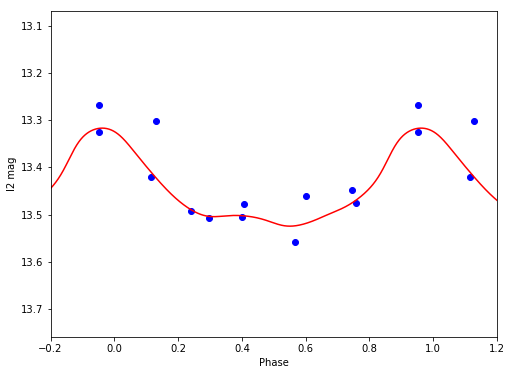

I2 13.4487354812 0.207702163024


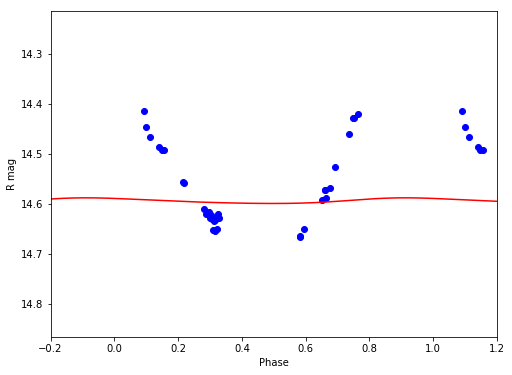

R 14.5934785921 0.0113082840712


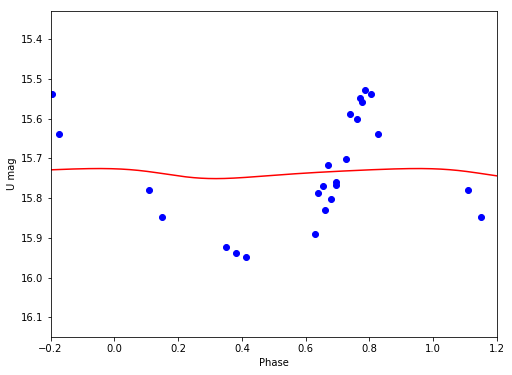

U 15.736758663 0.0253191859741


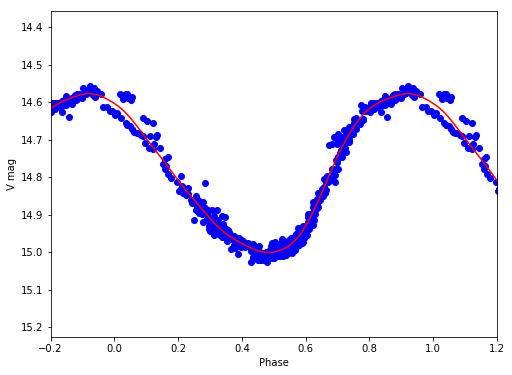

V 14.7756678779 0.423041973945
V100
/Volumes/Annie/CRRP/NGC3201/lcvs/V100.phased


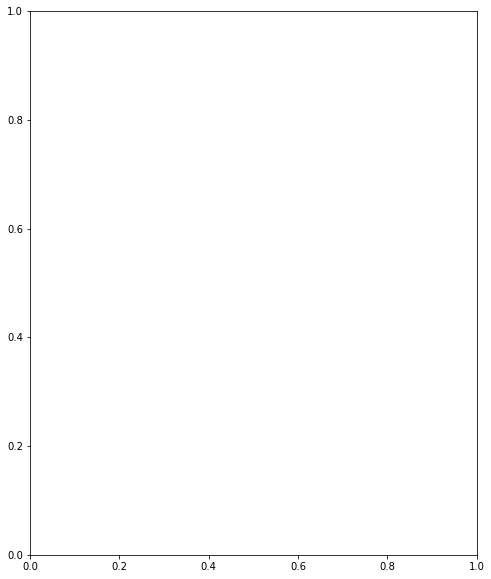

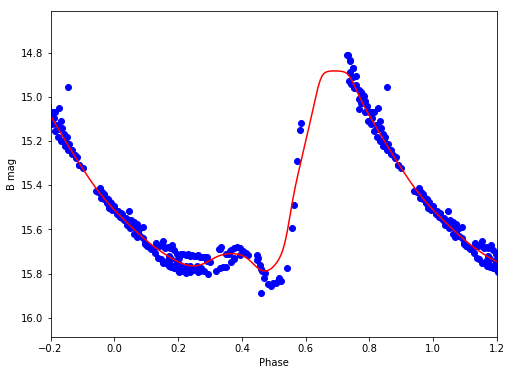

B 15.4133408971 0.907986554413


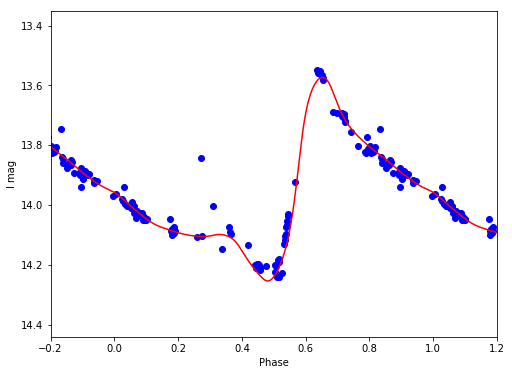

I 13.9504428184 0.680559721972


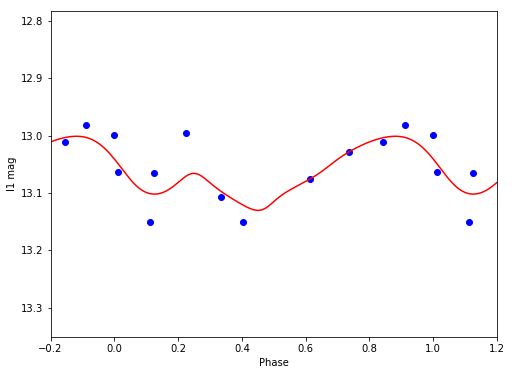

I1 13.0666293635 0.129281615083


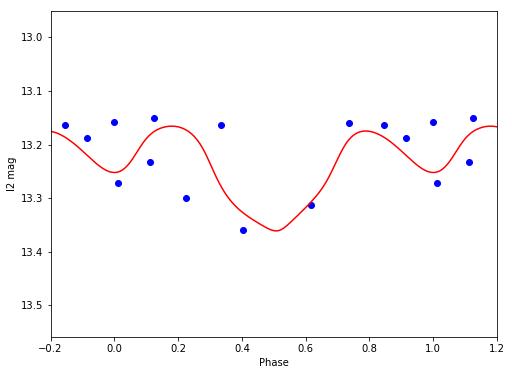

I2 13.244454849 0.195561848181


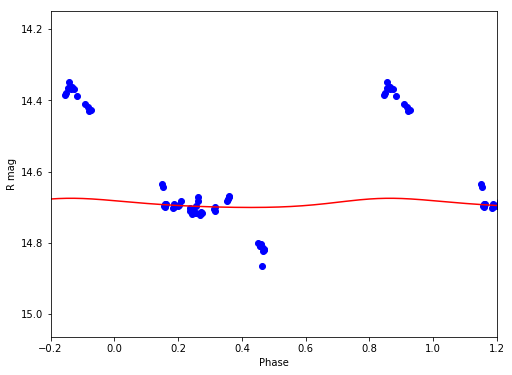

R 14.6893646631 0.0257211096557


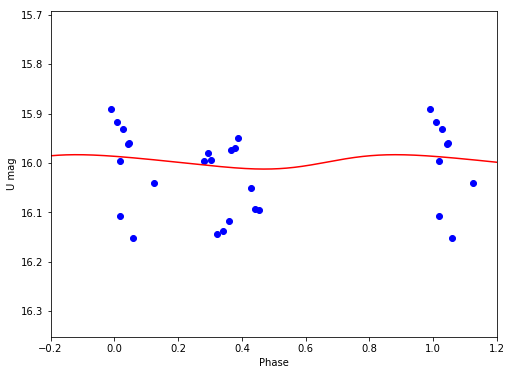

U 15.9970727133 0.0291065403916


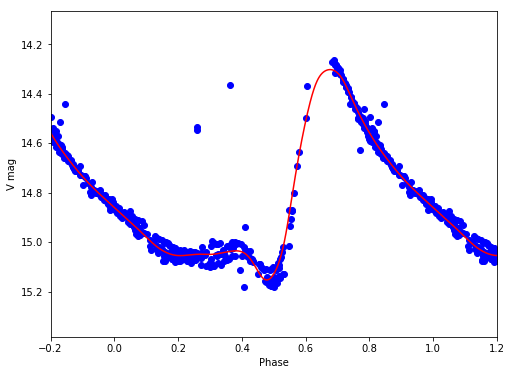

V 14.7899464611 0.851297581339


In [8]:
dtype1 = np.dtype([('id', 'S5'), ('cc_period', float), ('new_period', float)])
data = np.loadtxt(folder+target+'-variables-new.txt', dtype=dtype1, usecols=(0,1,2))
sp = np.array([0.9, 0.1, 0.1, 0.9, 0.1, 0.9, 0.9, 0.9, 0.2, 0.2])
f = open(folder+'avg_mags.txt', 'w')
#star = 'V10'

for ind, star in enumerate(data['id']):
    print star
    try:
        r1, r2, r3, r4 = lightcurves.gloess(folder+'lcvs/'+star+'.phased', smoothing_params=sp, plot_save=1, clean=1)
        datasave = np.array(zip(np.repeat(star, len(r1)), r1, np.repeat(data['new_period'][ind], len(r1)), r2, r3, r4), dtype=[('c1', 'S5'), ('c2', 'S2'), ('c3', float), ('c4', float), ('c5', float), ('c6', float)])
        np.savetxt(f, datasave, fmt='%5s %2s %10.8f %6.3f %4.2f %4.2f')
    except:
        continue
f.close()

/Users/Jill/anaconda2/envs/astroconda/lib/python2.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: divide by zero encountered in divide


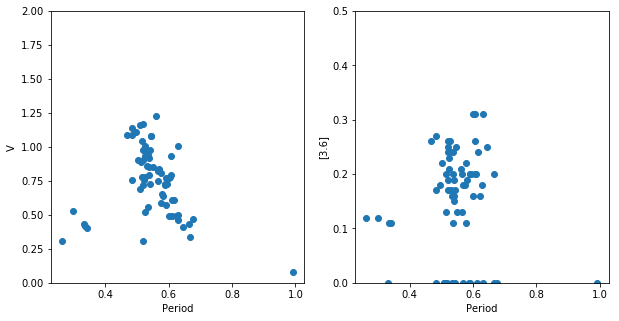

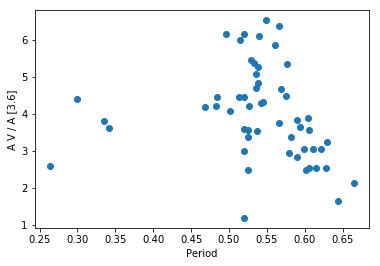

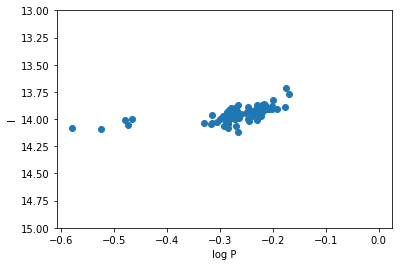

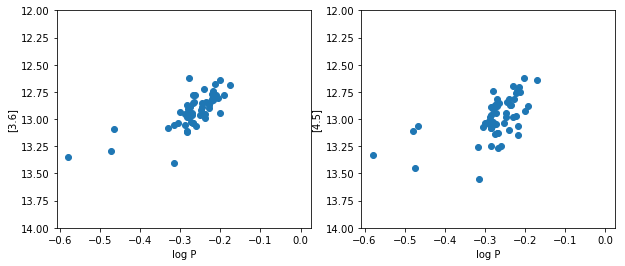

In [16]:
dtype = np.dtype([('star', 'S5'), ('filt', 'S2'), ('period', float), ('avg', float), ('amp', float)])
data = np.loadtxt(folder+'avg_mags.txt', dtype=dtype, usecols=(0,1,2,3,4))

per = data['period'][data['filt'] == 'V']
Vamp = data['amp'][data['filt'] == 'V']
I1amp = data['amp'][data['filt'] == 'I1']

# Bailey diagram
x = data['period'][data['filt'] == 'V']
y = data['amp'][data['filt'] == 'V']
fig = mp.figure(figsize=(10,5))
ax = fig.add_subplot(121)
ax.plot(per, Vamp, 'o')
ax.set_ylim((0,2))
ax.set_xlabel('Period')
ax.set_ylabel('V')
ax2 = fig.add_subplot(122)
ax2.plot(per, I1amp, 'o')
ax2.set_ylim((0,0.5))
ax2.set_xlabel('Period')
ax2.set_ylabel('[3.6]')


# amplitude ratio 

R_amp = Vamp/I1amp
fig3 = mp.figure()
ax4 = fig3.add_subplot(111)
ax4.plot(per, R_amp, 'o')
ax4.set_xlabel('Period')
ax4.set_ylabel('A V / A [3.6]')

# I band PL relation
fig5 = mp.figure()
ax5 = fig5.add_subplot(111)
Iper = data['period'][data['filt'] == 'I']
Imag = data['avg'][data['filt'] == 'I']
ax5.plot(np.log10(Iper), Imag, 'o')
ax5.set_ylim((15,13))
ax5.set_xlabel('log P')
ax5.set_ylabel('I')

# IRAC PL relation
fig2 = mp.figure(figsize=(10,4))
ax1 = fig2.add_subplot(121)
ax2 = fig2.add_subplot(122)
x2 = data['period'][data['filt'] == 'I1']
y2 = data['avg'][data['filt'] == 'I1']
x3 = data['period'][data['filt'] == 'I2']
y3 = data['avg'][data['filt'] == 'I2']
ax1.plot(np.log10(x2), y2, 'o')
ax1.set_ylim((14,12))
ax1.set_xlabel('log P')
ax1.set_ylabel('[3.6]')
ax2.plot(np.log10(x3), y3, 'o')
ax2.set_ylim((14,12))
ax2.set_xlabel('log P')
ax2.set_ylabel('[4.5]')

[]


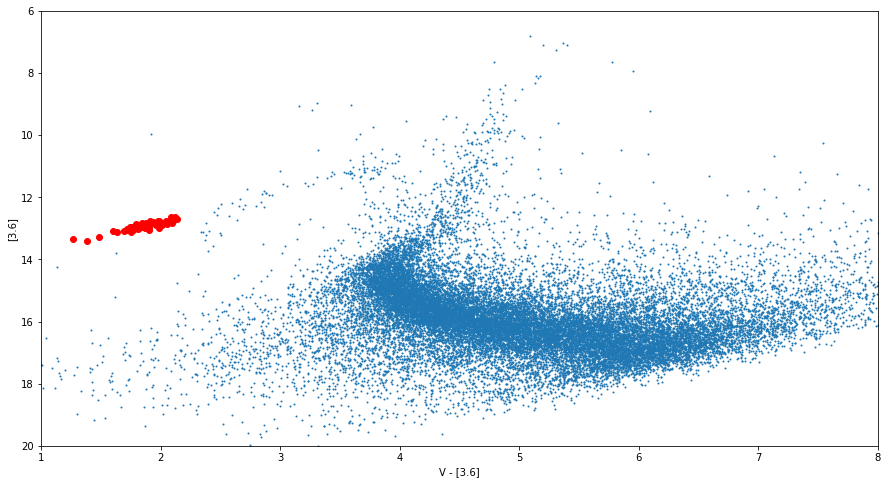

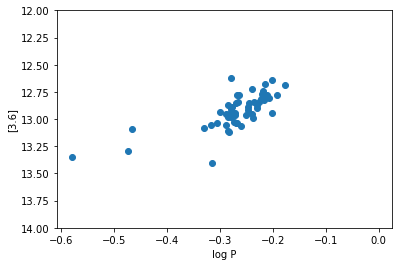

In [15]:
catalog_data = analysis_routines.read_merged_catalog(folder)

thres = 300
thres2 = 150
dist = catalog_data['rad_dist']
colorVIR = catalog_data['V'][dist > thres2] - catalog_data['3.6'][dist > thres2]
mag = catalog_data['V'][dist > thres2]
magIR = catalog_data['3.6'][dist > thres2]
err = catalog_data['3.6er'][dist > thres2]

good_mag = mag[err < 0.2]
good_color = colorVIR[err < 0.2]

fig2 = mp.figure(figsize=(15,8))
ax2 = fig2.add_subplot(111)
ax2.scatter(colorVIR, magIR, s=1, edgecolor=None)
ax2.set_ylim((20,6))
ax2.set_xlim((1,8))
ax2.set_xlabel('V - [3.6]')
ax2.set_ylabel('[3.6]')

dtype = np.dtype([('star', 'S5'), ('filt', 'S2'), ('period', float), ('avg', float), ('amp', float)])
data = np.loadtxt(folder+'avg_mags.txt', dtype=dtype, usecols=(0,1,2,3,4))

var_color = data['avg'][data['filt'] == 'V'] - data['avg'][data['filt'] == 'I1']
var_mag = data['avg'][data['filt'] == 'I1']
var_id = data['star'][data['filt'] == 'I1']
var_period = data['period'][data['filt'] == 'I1']

bad_id = np.array([])
bad_color = np.array([])
bad_mag = np.array([])
bad_per = np.array([])
for ind, star in enumerate(var_id):
    if var_color[ind] >= 3.0 and var_mag[ind] > 1 : 
        bad_id = np.append(bad_id, star)
        bad_color = np.append(bad_color, var_color[ind])
        bad_mag = np.append(bad_mag, var_mag[ind])
        bad_per = np.append(bad_per, var_period[ind])
        
print bad_id
ax2.plot(var_color, var_mag, 'o', color='r')
ax2.plot(bad_color, bad_mag, 'x', color='k')

fig3 = mp.figure()
ax3 = fig3.add_subplot(111)
ax3.plot(np.log10(var_period), var_mag, 'o')
ax3.plot(np.log10(bad_per), bad_mag, 'x', color='k')
ax3.set_ylim((14,12))
ax3.set_xlabel('log P')
ax3.set_ylabel('[3.6]')